In [130]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import linregress

from datetime import datetime as datetime
import time


In [10]:
ddir = 'C:/crs/proj/2023_NCB_recovery/'
# fn = 'NCB_profiles.csv' # start from dune line

# these were extracted by Jin-Si on Feb 1, 2024...they do not include the EBK fill values
fn = 'NCB_Berm_ProfilePoints.csv'
df = pd.read_csv(ddir+fn, header=0, low_memory=False)

In [11]:
df

,OBJECTID,Transect_ID,End_Y,End_X,Start_Y,Start_X,F20190830,F20190912,F20191011,F20191126,F20200208,F20200508,F20200802,F2020080,F20200921,F20210430,F20210920,F20220104,F20220615,F20221027
0,1,1,3861056,383411.2,3860974,383468.7,1.84218,1.29518,NaN,0.18098,0.10598,0.902637,0.043940,0.103692,1.497176,0.824819,1.896358,1.310606,1.568295,1.576066
1,2,1,3861056,383411.2,3860974,383468.7,1.82618,1.34618,1.12598,0.19998,0.19398,1.183495,0.342245,0.319345,1.686503,0.966600,1.854984,1.343750,1.566987,1.599082
2,3,1,3861056,383411.2,3860974,383468.7,1.77718,1.40018,1.23398,0.24198,0.20898,1.328517,0.391971,0.490518,1.801756,1.053175,1.804758,1.395452,1.507266,1.632934
3,4,1,3861056,383411.2,3860974,383468.7,1.75918,1.43318,1.38598,0.22998,0.23098,1.456164,0.630311,0.685190,1.825444,1.101120,1.755430,1.435444,1.530870,1.654685
4,5,1,3861056,383411.2,3860974,383468.7,1.69418,1.49518,1.61198,0.26098,0.28998,1.565280,0.776705,0.810227,1.899150,1.141390,1.771242,1.435734,1.533110,1.698508
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114708,114709,2317,3876681,400475.8,3876603,400538.5,2.84118,2.96518,2.88898,3.02298,2.83098,3.068145,3.081196,2.986714,2.863904,3.117182,3.233483,3.420108,3.229236,3.260155
114709,114710,2317,3876681,400475.8,3876603,400538.5,3.12718,3.13118,3.16398,3.31798,3.22698,3.415080,3.493194,3.350151,3.356446,3.518606,3.511096,3.773950,3.732588,3.734171
114710,114711,2317,3876681,400475.8,3876603,400538.5,3.81018,3.80618,3.89698,3.91798,3.98098,3.979407,4.105427,3.976524,4.035980,4.232338,4.406443,4.379906,4.600006,4.649562
114711,114712,2317,3876681,400475.8,3876603,400538.5,4.60218,4.53918,4.62098,4.60198,4.65198,4.586057,4.749928,4.632874,4.688096,4.915672,5.062502,5.133145,5.383920,5.416753


#### Profile names from column headers...calculate time from profile names

In [12]:
# profile_names = ['EBK_Fill_2021_04_30','EBK_Fill_2020_09_28','EBK_Fill_2020_08_05','EBK_Fill_2020_08_02',
#                  'EBK_Fill_2020_05_08','EBK_Fill_2020_02_08','EBK_Fill_2019_11_26','EBK_Fill_2019_10_11',
#                  'EBK_Fill_2019_09_12','F2019_08_30']
profile_names = ['F20190830','F20190912','F20191011','F20191126','F20200208','F20200508',
                 'F20200802','F2020080','F20200921','F20210430','F20210920','F20220104','F20220615','F20221027']

In [211]:
dates = dates =['2019-08-30',
         '2019-09-12',
         '2019-10-11', 
         '2019-11-26',
         '2020-02-08', 
         '2020-05-08', 
         '2020-08-02', 
         '2020-08-05', 
         '2020-09-21', 
         '2021-04-30', 
 #        '2021-06-15', 
         '2021-09-20', 
 #        '2022-10-19'
         '2022-01-04',
         '2022-06-15',
         '2022-10-27']
dt = pd.to_datetime(dates)

def toYearFraction(date):
    def sinceEpoch(date): # returns seconds since epoch
        return time.mktime(date.timetuple())
    s = sinceEpoch

    year = date.year
    startOfThisYear = datetime(year=year, month=1, day=1)
    startOfNextYear = datetime(year=year+1, month=1, day=1)

    yearElapsed = s(date) - s(startOfThisYear)
    yearDuration = s(startOfNextYear) - s(startOfThisYear)
    fraction = yearElapsed/yearDuration

    return date.year + fraction

dyr = np.ones(len(dt))
for i, val in enumerate(dt):
    dyr[i]=toYearFraction(val)
dyr  

array([2019.66015982, 2019.69577626, 2019.77522831, 2019.90136986,
       2020.10382514, 2020.34961293, 2020.58458561, 2020.59278233,
       2020.72119763, 2021.32591324, 2021.71769406, 2022.00821918,
       2022.45194064, 2022.81906393])

In [229]:
def pcoord(x, y):
    """
    Convert x, y to polar coordinates r, az (geographic convention)
    r,az = pcoord(x, y)
    """
    r = np.sqrt(x**2 + y**2)
    az = np.degrees(np.arctan2(x, y))
    # az[where(az<0.)[0]] += 360.
    az = (az+360.)%360.
    return r, az


def xycoord(r, az):
    """
    Convert r, az [degrees, geographic convention] to rectangular coordinates
    x,y = xycoord(r, az)
    """
    x = r * np.sin(np.radians(az))
    y = r * np.cos(np.radians(az))
    return x, y


def UTM2Island(eutm, nutm, eoff=383520.0, noff=3860830.0, rot=42.0):
    """
    Convert UTM NAD83 Zone 18N easting, northing to N. Core Banks alongshore, cross-shore coordinates
    xisl, yisl = UTM2Island( eutm, nutm )
    Better to use values from the dict than defaults for translation/rotation values
    Defaults are associated with the dict read in from `small_island_box.yml`
    """
    [r, az] = pcoord(eutm-eoff, nutm-noff)
    az = az + rot
    [xisl,yisl] = xycoord(r,az)
    return xisl, yisl

def stat_summary(x, iprint=False):
    n = len(x)
    nnan = np.sum(np.isnan(x))
    nvalid = n-nnan
    # intitialize with NaNs

    if n > nnan:
        meanx = np.nanmean(x)
        stdx = np.nanstd(x)
        minx = np.nanmin(x)
        d5 = np.nanpercentile(x, 5.)
        d25 = np.nanpercentile(x, 25.)
        d50 = np.nanpercentile(x, 50.)
        d75 = np.nanpercentile(x, 75.)
        d95 = np.nanpercentile(x, 95.)
        maxx = np.nanmax(x)
    else:
        meanx = np.nan
        stdx = np.nan
        minx = np.nan
        d5 = np.nan
        d25 = np.nan
        d50 = np.nan
        d75 = np.nan
        d95 = np.nan
        maxx = np.nan

    # return it in a dict
    s = {'n':n, 'nnan':nnan, 'nvalid':nvalid, 'mean':meanx, 'std':stdx, 'min':minx, 'max':maxx,
         'd5':d5, 'd25':d25, 'd50':d50, 'd75':d75, 'd95':d95}
    # if iprint:
    #     for key, value in s.items():
    #         print('{:6s} = {:.3f}'.format(key, value)),
    if iprint:
        print("  n, nnan, nvalid: ",s['n'],s['nnan'],s['nvalid'])
        print("  mean, std, min, max   : {:.3f} {:.3f} {:.3f} {:.3f}"
            .format(s['mean'], s['std'], s['min'], s['max']))
        print("  d5, d25, d50, d75, d95: {:.3f} {:.3f} {:.3f} {:.3f} {:.3f}"
            .format(s['d5'], s['d25'], s['d50'], s['d75'], s['d95']))

    return s


In [96]:
plist = [296,300,350,400,450, 500, 550, 600,1000]

zmax = np.ones((2317,14))*np.nan
slope = np.ones((2317,14))*np.nan
stderr = np.ones((2317,14))*np.nan
rvalue = np.ones((2317,14))*np.nan
pvalue = np.ones((2317,14))*np.nan
xs = np.ones((2317,14))*np.nan
ys = np.ones((2317,14))*np.nan
xe = np.ones((2317,14))*np.nan
ye = np.ones((2317,14))*np.nan


for i in range(2317):
    #plt.figure()
    for ip, p in enumerate( profile_names):
        print(i, ip, p)
        xsall = df.loc[df['Transect_ID'] == i+1]['Start_X'].values.astype(np.float64)
        nx = len(xsall)
        xs[i,ip] = xsall[0]
        xe[i,ip] = df.loc[df['Transect_ID'] == i+1]['End_X'].values.astype(np.float64)[0]
        ys[i,ip] = df.loc[df['Transect_ID'] == i+1]['Start_Y'].values.astype(np.float64)[0]
        ye[i,ip] = df.loc[df['Transect_ID'] == i+1]['End_Y'].values.astype(np.float64)[0]

        length = np.sqrt((xs[i,ip]-xe[i,ip])**2+(ys[i,ip]-ye[i,ip])**2)
        xdist = np.linspace(0.,length, nx)
        z=df.loc[df['Transect_ID'] == i+1][p].values.astype(np.float64)
        #print(z)
       
        # find highest point, even for profiles with NaNs or multiple max values
        zmax[i,ip] = np.nanmax(z)
        print('zmax:',zmax[i,ip])
        # sometimes this returns more than one index
        izmax = np.squeeze( np.where(z==zmax[i,ip])[-1] )
        if izmax.size > 1:
            izmax = izmax[0]
        # print(izmax)
        nfit = min(7, izmax)
        if izmax.size == 1 and nfit >1 :       
            # fit slope to nfit points seaward of peak
            xreg = xdist[izmax-nfit:izmax]
            zreg = z[izmax-nfit:izmax]
            linreg = linregress(xreg, zreg)
            zfit = linreg.intercept+linreg.slope*xreg
            slope[i,ip]=linreg.slope
            stderr[i,ip]=linreg.stderr
            rvalue[i,ip]=linreg.rvalue
            pvalue[i,ip]=linreg.pvalue
        # otherwize, leave NaNs in the arrays
        
#         print(zmax, linreg.slope, linreg.stderr, linreg.rvalue**2, linreg.pvalue)
#         plt.plot(xdist, z, label=p)
#         plt.plot(xdist[izmax],z[izmax],'or')
#         plt.plot(xreg,zfit,'--k')
#         plt.plot(xs, ys,'+')
#         plt.plot(xe, ye, 'o')

0 0 F20190830
[1.84218 1.82618 1.77718 1.75918 1.69418 1.65418 1.63218 1.60318 1.60218
 1.61118 1.56118 1.52618 1.52318 1.52118 1.50918 1.49918 1.49918 1.48318
 1.45618 1.44118 1.42518 1.42118 1.42218 1.44918 1.44818 1.47218 1.49118
 1.61918 1.67118 1.69518 1.86318 2.20118 2.51418 4.11618 4.08418 3.61318
 3.08918 2.25718 2.28818 2.47118 2.56018 2.71218 2.66318 2.77618 2.98018
 2.71718 2.63418 2.56918 2.68518]
zmax: 4.11618
33
0 1 F20190912
[1.29518 1.34618 1.40018 1.43318 1.49518 1.47318 1.50418 1.52518 1.52418
 1.52118 1.53818 1.51518 1.52518 1.52018 1.53018 1.55518 1.53018 1.51418
 1.50918 1.51318 1.50418 1.47518 1.52518 1.49118 1.48118 1.51118 1.51218
 1.50418 1.47218 1.45118 1.48918 1.77118 2.40218 4.00618 3.93818 3.46818
 2.77618 2.03818 1.95518 2.11218 2.26518 2.42718 2.40118 2.68518 2.92418
 2.69118 2.60218 2.51118 2.57418]
zmax: 4.00618
33
0 2 F20191011
[    nan 1.12598 1.23398 1.38598 1.61198 1.81498 2.06498 2.14398 2.11398
 2.06798 2.02298 1.96498 1.89498 1.87398 1.81098 1.80

[2.05518 2.12518 2.09918 2.03818 1.95518 1.92018 1.88718 1.84218 1.85418
 1.82018 1.79418 1.78218 1.76618 1.77018 1.75218 1.70318 1.68118 1.66818
 1.67218 1.70318 1.73718 1.79418 1.94418 2.19018 2.38518 2.66118 2.66718
 2.60918 2.26118 2.16918 2.11518 1.87418 1.84518 1.72918 1.68018 1.67718
 1.75018 1.79818 1.80018 1.80218 1.75218 1.74618 1.76218 1.80918 1.84018
 1.90418 1.91118 1.76218 1.54518 1.60518]
zmax: 2.66718
26
7 1 F20190912
[1.26718 1.19218 1.18418 1.24018 1.31418 1.34418 1.40218 1.46418 1.52318
 1.64618 1.66218 1.71418 1.72918 1.72118 1.80218 1.81818 1.86218 1.85718
 1.87718 1.86118 1.92418 1.96418 1.93918 1.97618 2.10718 2.50818 2.57418
 2.56018 2.30218 2.17218 2.06718 2.01918 1.79018 1.65618 1.60318 1.59818
 1.65318 1.71118 1.71418 1.72018 1.66518 1.66018 1.68818 1.71318 1.75718
 1.80918 1.79818 1.64418 1.50618 1.53318]
zmax: 2.57418
26
7 2 F20191011
[    nan     nan     nan     nan     nan     nan 0.87798 0.97098 1.13598
 1.32698 1.48998 1.65598 1.96598 2.07098 2.14598 2.

[0.904138 0.857634 0.985366 1.061419 1.055775 1.166285 1.235065 1.239703
 1.32133  1.345374      nan 1.303482 1.435723 1.505846 1.624856 1.685496
 1.747243 1.803475 1.886001 1.907136 1.98599  2.073084 2.272765 2.528718
 2.879524 3.734864 4.214731 3.857265 3.484325 2.856882 2.556705 2.611323
 2.530547 2.242222 2.229943 2.20336  2.153335 2.071153 2.05303  2.119018
 1.75013  1.36552  1.422284 1.776026 1.805137 1.801988 1.8455   1.653583
 1.674371 1.790196]
zmax: 4.214731
26
13 13 F20221027
[1.178177 1.29912  1.439454 1.506467 1.544682 1.592685 1.637117 1.632441
 1.759859 1.809326 1.844828 1.861491 1.857366 1.796761 1.88051  1.833459
 1.806982 1.806984 1.820934 1.957461 2.082355 2.266819 2.437777 2.598151
 3.003233 3.919509 4.271028 3.902254 3.550866 2.909358 2.576252 2.647179
 2.585505 2.276877 2.307056 2.252845 2.225157 2.096557 2.086949 2.186141
 1.819185 1.42632  1.524237 1.845748 1.864194 1.903188 1.951764 1.713444
 1.767541 1.860798]
zmax: 4.271028
26
14 0 F20190830
[1.88318 1.99918 

[     nan      nan      nan      nan      nan      nan      nan -0.24302
 -0.20902 -0.16602 -0.03502 -0.12802 -0.02202  0.00498  0.21598  0.30098
  0.52198  0.58198  0.60798  0.66398  0.84898  0.96598  1.06798  1.17798
  1.49598  1.63198  1.73798  2.19498  3.22998  3.07998  2.97998  2.85998
  2.77398  2.52398  2.32598  2.25598  2.51398  2.80698  2.78498  2.20098
  2.09498  2.21598  2.24698  2.10998  2.08698  2.08798  2.39298  2.55198
  2.64998  2.21898]
zmax: 3.22998
28
21 5 F20200508
[     nan      nan      nan      nan      nan      nan 0.127961 0.151968
 0.27505  0.367748 0.523536 0.651942 0.680523 0.818602 1.016383 1.137236
 1.525415 1.664928 1.713918 1.672378 1.668477 1.649444 1.64652  1.667784
 1.685772 1.80464  2.07299  2.456452 3.088598 2.957471 2.82439  2.731542
 2.638876 2.360867 2.20261  2.13895  2.410761 2.712765 2.686581 2.103084
 1.956102 2.105585 2.135407 1.978354 1.95601  1.979217 2.322388 2.522281
 2.601601 2.178493]
zmax: 3.088598
28
21 6 F20200802
[     nan      nan 

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan 0.306619 0.360917 0.618059 0.717296
 0.846373 1.103655 1.231807 1.377886 1.524709 1.686867 1.674019 1.660772
 1.714664 1.774621 1.852611 1.960661 2.115997 2.179202 2.323349 2.502785
 2.625285 2.757202 2.959459 2.835267 2.549428 2.441948 2.549755 2.515993
 2.421626 2.58233  2.502945 2.615097 2.306595 1.857856 2.027395 2.160976
 2.78676 ]
zmax: 2.959459
34
28 9 F20210430
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan 0.286019 0.227479
 0.344924 0.468166 0.567953 0.626801 0.722446 0.989038 1.04608  1.213166
 1.254637 1.275404 1.259655 1.247191 1.291166 1.453968 1.588857 2.052514
 2.352316 2.926902 3.2815   3.056802 2.750816 2.623021 2.803719 2.739221
 2.641386 2.762561 2.71515  2.86018  2.494173 2.086059 2.149473 2.206325
 2.952421]
zmax: 3.2815
34
28 10 F20210920
[     nan 0.037864 0.257043 0.245568 

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan 0.226457 0.620559
 0.664858 0.733862 0.844376 0.950462 1.022645 1.186693 1.248757 1.434971
 1.465235 1.60658  1.75023  1.786084 1.838364 1.907347 1.968478 1.995015
 2.078178 2.125818 2.195992 2.273605 2.371798 2.392901 2.474603 2.491555
 2.634011 2.718683 2.978299 2.992074 3.00674  2.903051 2.732353 2.545435
 2.481061]
zmax: 3.00674
44
35 9 F20210430
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan      nan
 0.344153 0.441743 0.467475 0.627177 0.734904 0.844831 0.933303 1.040336
 1.092154 1.149335 1.190478 1.213642 1.186639 1.210608 1.314151 1.368763
 1.483469 1.640951 1.826202 1.960073 2.201106 2.275431 2.328753 2.405092
 2.78955  2.951587 3.146283 3.171135 3.11957  2.98139  2.811718 2.71559
 2.620281]
zmax: 3.171135
43
35 10 F20210920
[     nan      nan      nan      nan 

[      nan       nan  0.152738  0.151201  0.112525  0.116043 -0.009608
  0.017273  0.07841   0.134129  0.172137  0.231221  0.217474  0.292892
  0.360181  0.375155  0.404517  0.635041  0.727553  0.828815  0.898784
  1.025327  1.064588  1.178485  1.281064  1.346883  1.419577  1.456855
  1.537847  1.618953  1.706734  1.774253  1.814491  1.886573  1.964814
  2.018302  2.093495  2.139059  2.294358  2.343961  2.696508  2.765912
  2.654314  2.385372  2.334282  3.210361  3.587676  3.171041  3.166758]
zmax: 3.587676
46
42 11 F20220104
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan 0.775182      nan 0.968725 1.10649
 1.143545 1.199193 1.250953 1.318801 1.245008 1.278165 1.328182 1.3614
 1.326131 1.395184 1.435377 1.514348 1.607052 1.606129 1.659378 1.724263
 1.82465  1.853941 1.962597 2.007225 2.086137 2.113151 2.235996 2.284387
 2.349744 2.692392 2.575352 2.26712  2.264233 3.246686 3.614402 3.363707
 3.362766]
zmax: 3.614402
46
42 1

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan 0.563036 0.506333 0.650992 0.898937 0.896539
 1.039607 1.061604 1.14161  1.206937 1.259545 1.377847 1.377732 1.39819
 1.491769 1.49645  1.55073  1.555094 1.692904 1.686371 1.751031 1.796987
 1.899412 2.176374 2.668793 3.233287 3.359805 3.199626 3.02421  2.597747
 2.556112 2.248161 2.152914 1.946356 1.947213 1.851591 1.854204 1.771551
 1.844053]
zmax: 3.359805
36
49 12 F20220615
[      nan       nan       nan       nan       nan       nan -0.295693
 -0.078788  0.029098  0.312192  0.430968  0.659195  0.835072  1.038084
  1.176813  1.563636  1.715002  1.685232  1.668303  1.596664  1.536283
  1.505945  1.415605  1.426881  1.511511  1.616974  1.713918  1.72816
  1.747002  1.745636  1.817475  1.847585  2.020503  2.324538  2.892573
  3.636473  3.604081  3.398256  3.28864   2.791268  2.682867  2.266827
  2.134784  2.020874  2.020136  1.951241  1.973534  1.863545  1.884045]
zmax: 3.636473
35
49 

[    nan     nan     nan     nan     nan     nan     nan 0.68818 0.86118
 1.00118 1.16718 1.25018 1.42318 1.50318 1.52818 1.59818 1.62318 1.71118
 1.73418 1.91518 1.96018 1.99818 2.04518 2.03918 2.09418 2.08618 2.15618
 2.15418 2.32118 2.28718 2.52618 2.99818 3.47218 3.48918 3.19618 3.00818
 2.99518 3.12818 3.12718 2.98818 2.75918 2.31918 2.26918 2.85218 3.10018
 3.00418 3.01518 2.95718 3.01818 2.73318]
zmax: 3.48918
33
57 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan 0.26598 0.25598
 0.34798 0.47298 0.58098 0.75498 0.86298 1.17398 1.38898 1.78798 2.14698
 2.06098 2.03698 2.08198 2.53698 3.06298 3.45298 3.50498 3.11698 2.93498
 2.95398 3.10498 3.04098 2.94198 2.66798 2.19498 2.27398 2.87598 3.06398
 2.96698 2.94098 2.92698 2.96198 2.68998]
zmax: 3.50498
33
57 3 F20191126
[     nan -0.59702 -0.37402 -0.31002 -0.15402 -0.06702  0.02098  0.12498
  0.18698  0.24098  0.37098  0.41798  0.51398  0.

[         nan          nan          nan          nan -1.87020e-01
 -4.30200e-02  2.98000e-03  1.79800e-02  9.89800e-02  1.56980e-01
  2.51980e-01  3.17980e-01  3.43980e-01  4.43980e-01  5.47980e-01
  6.11980e-01  6.53980e-01  7.37980e-01  7.97980e-01  8.77980e-01
  9.21980e-01  1.20998e+00  1.27498e+00  1.37798e+00  1.48498e+00
  1.56798e+00  1.70398e+00  1.80498e+00  2.04198e+00  2.22998e+00
  2.68598e+00  3.17998e+00  3.17898e+00  3.07098e+00  2.50598e+00
  2.39298e+00  2.94898e+00  2.82998e+00  2.17798e+00  2.09598e+00
  2.31898e+00  2.22598e+00  2.20198e+00  2.14898e+00  2.19698e+00
  2.28498e+00  2.34998e+00  2.30198e+00  2.44098e+00]
zmax: 3.17998
31
64 5 F20200508
[      nan       nan       nan       nan -0.325748 -0.294777 -0.116749
  0.109638  0.198409  0.436497  0.517857  0.705507  0.797735  1.049515
  1.162457  1.03785   1.044078  1.171638  1.289853  1.495901  1.542961
  1.673195  1.694492  1.713792  1.722962  1.708294  1.670556  1.696859
  1.859347  2.056934  2.506489  3.03

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan      nan
 0.945009 1.085378 1.267481 1.475389 1.69207  1.790633 1.81337  1.79995
 1.764661 1.750197 1.72623  1.734318 1.634326 1.618372 1.60401  1.578553
 1.587833 1.567121 1.566429 1.574943 1.521248 1.500843 1.467058 1.437637
 1.421948 1.390803 1.374809 1.440321 1.504234 1.593771 1.685028 2.096197
 2.625394]
zmax: 2.625394
48
71 7 F2020080
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan 0.393648 0.267484 0.220955 0.364887 0.537331 0.669335
 0.845028 0.960681 1.146432 1.297598 1.535078 1.659865 1.770446 1.79433
 1.760418 1.710399 1.682915 1.641403 1.618035 1.59814  1.570015 1.577576
 1.541941 1.517805 1.514918 1.509151 1.441446 1.414864 1.394853 1.368538
 1.374052 1.341301 1.305303 1.409622 1.466926 1.556773 1.615846 2.076037
 2.567071]
zmax: 2.567071
48
71 8 F20200921
[     nan      nan      nan      nan   

C:\Users\csherwood\AppData\Local\Temp\1\ipykernel_16704\1153938362.py:31: RuntimeWarning: All-NaN slice encountered
  zmax[i,ip] = np.nanmax(z)
C:\Users\csherwood\AppData\Local\Temp\1\ipykernel_16704\1153938362.py:38: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  nfit = min(7, izmax)


[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan 1.021147 1.058206
 1.40286  1.597834 1.843952 1.838692 1.837701 1.834232 1.805675 1.775685
 1.752995 1.728537 1.72804  1.713489 1.684074 1.644071 1.64641  1.848593
 2.300897 3.032215 3.165418 3.114396 3.012342 3.030468 3.120111 3.120659
 3.027118 2.960672 2.806711 2.727643 2.694474 2.635816 2.024541 1.54087
 1.217251]
zmax: 3.165418
34
78 7 F2020080
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan 0.813432 0.830481 0.843354 0.976681
 1.059684 1.236668 1.575738 1.790453 1.924375 1.905533 1.890023 1.868689
 1.848251 1.790761 1.726617 1.718877 1.754032 1.725898 1.723472 2.119376
 2.434952 3.0678   3.20625  3.158084 3.070237 3.080935 3.143862 3.201041
 3.035057 3.016062 2.906096 2.797541 2.695995 2.595233 2.133845 1.642966
 1.305958]
zmax: 3.20625
34
78 8 F20200921
[     nan      nan      nan      nan   

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan 0.150683 0.191704 0.278908 0.396659 0.407744 0.487684
 0.628674 0.705164 0.773519 0.897624 1.111337 1.124594 1.31329  1.408041
 1.457877 1.494104 1.654101 1.780071 1.826462 1.832647 1.799338 1.740249
 1.709925 1.769337 1.768346 1.756683 1.732813 1.726912 1.730036 1.693249
 1.678624 1.667132 1.637995 1.581658 1.584874 1.583227 1.547838 1.542097
 1.506921 1.518582]
zmax: 1.832647
29
85 10 F20210920
[     nan      nan      nan 0.58399  0.640626 0.840535 0.921056 0.996156
 1.084177 1.030169 1.142017 1.20206  1.258042 1.293667 1.360832 1.401376
 1.428787 1.470234 1.491504 1.541083 1.609642 1.60693  1.633361 1.705425
 1.727126 1.747535 1.822517 1.903337 1.932278 1.95658  1.973222 2.05098
 1.981253 1.92859  1.874981 1.829815 1.797347 1.774494 1.752072 1.727182
 1.686626 1.646854 1.609382 1.603856 1.583423 1.579085 1.53744  1.561853
 1.520348 1.495164]
zmax: 2.05098
31
85 11 F20220104
[     nan      nan

[0.59818 0.78418 0.98018 1.18818 1.33218 1.68018 1.88418 2.11818 2.22918
 2.13818 2.07818 2.04018 1.95618 1.90918 1.90418 1.85518 1.76618 1.64018
 1.62318 1.64718 1.67218 1.67318 1.68518 1.68218 1.70118 1.69918 1.72018
 1.77318 1.87518 1.98918 2.36118 2.64718 2.85918 2.76418 2.51118 2.46018
 2.49818 2.21618 2.16818 2.40318 2.32418 2.29218 2.19318 2.16618 2.23018
 2.32218 2.39018 2.44118 2.44418 2.46718]
zmax: 2.85918
32
93 1 F20190912
[    nan     nan     nan     nan     nan     nan 0.62218 0.71018 0.75718
 0.88618 0.90818 0.99118 1.08718 1.21218 1.26818 1.31018 1.32318 1.39418
 1.43518 1.61418 1.65818 1.71018 1.73418 1.76518 1.83518 1.83418 1.84618
 1.85618 1.93918 1.93718 2.08318 2.35518 2.72818 2.56818 2.33218 2.30018
 2.24818 2.09018 2.03518 2.20618 2.16118 2.09818 2.05118 1.99918 2.06918
 2.14318 2.22418 2.31418 2.27618 2.34018]
zmax: 2.72818
32
93 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
 0.43598 0.54498 0.71798 0.91798 1.16498 1.23198 

[    nan 0.57818 0.62618 0.68018 0.78118 0.87418 0.98018 0.89918 0.83818
 0.92718 0.93118 1.05518 1.16518 1.21718 1.35018 1.42818 1.53518 1.60318
 1.66518 1.72718 1.78718 1.89218 1.93418 1.95318 2.00918 2.03418 2.07118
 2.08118 2.07218 2.24118 2.94418 2.64218 2.47918 2.34118 2.24018 2.16418
 2.16418 2.14618 2.13718 2.13118 2.14118 2.48418 2.27218 2.55818 2.54718
 2.23118 2.19718 2.16418 2.11018]
zmax: 2.94418
30
100 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan 0.76798
 1.03298 1.15298 1.29398 1.54198 1.72298 1.83898 2.06198 2.12998 2.15798
 2.14298 2.15798 2.29898 3.06898 2.66498 2.45498 2.36898 2.31898 2.16098
 2.10898 2.10698 2.09898 2.07098 2.05698 2.48398 2.31698 2.51198 2.51198
 2.22898 2.21498 2.18298 2.16298]
zmax: 3.06898
30
100 3 F20191126
[-0.27602 -0.20002 -0.11402 -0.04402  0.02298  0.12198  0.09698  0.07198
  0.11998  0.20198  0.19598  0.27198  0.29398  0.30698  0.39098

[     nan      nan 0.24665  0.382388 0.517628 0.707133 0.780265 0.888626
 0.860812 1.14429  1.104224 1.091558 1.030667 1.049639 1.187094 1.284137
 1.455892 1.525174 1.647604 1.640709 1.631664 1.635226 1.594766 1.584563
 1.524917 1.505421 1.506019 1.621848 1.720251 1.976201 2.130838 2.351177
 2.452886 2.568656 2.647067 2.714166 2.596565 2.636328 2.698326 2.424828
 2.630209 2.721984 2.758377 2.724839 2.706825 2.702421 2.719315 2.679843
 2.704175]
zmax: 2.758377
42
107 6 F20200802
[0.432454 0.549623 0.716864 0.904312 0.905384 1.046592 1.130176 1.231229
 1.363614 1.460978 1.547385 1.578354 1.545348 1.573172 1.517576 1.52219
 1.492636 1.433931 1.353746 1.309741 1.33863  1.504578 1.718464 1.73021
 1.716052 1.704865 1.690858 1.711389 1.783296 2.002255 2.193173 2.439921
 2.549642 2.58945  2.663163 2.733141 2.627155 2.678763 2.735659 2.393017
 2.652708 2.73625  2.776216 2.76749  2.723971 2.741328 2.748934 2.715385
 2.772269]
zmax: 2.776216
42
107 7 F2020080
[     nan      nan 0.824358 0.85017  

[     nan      nan      nan      nan      nan      nan      nan      nan
 0.835433 1.205443      nan 1.019139 1.027597 1.083354 1.125184 1.152761
 1.221879 1.316085 1.422729 1.469077 1.532206 1.683858 1.762843 1.942454
 2.011913 2.110034 2.215713 2.381361 2.883184 3.229121 3.467146 3.313632
 3.13654  3.150202 3.202229 3.081143 3.059303 2.821398 2.96431  2.355626
 1.870259 2.179402 2.146049 2.044285 2.036747 2.131162 2.234784 2.38643
 2.341192]
zmax: 3.467146
30
114 12 F20220615
[0.646252 0.827954 0.949893 1.142577 1.334652 1.545601 1.717395 1.730533
 1.676523 1.648602 1.613622 1.583395 1.542015 1.472275 1.4292   1.371392
 1.316775 1.355309 1.416922 1.485238 1.547391 1.622209 1.708143 1.848948
 1.903088 2.010005 2.093075 2.394884 3.128219 3.490225 3.751389 3.574916
 3.332838 3.272    3.219378 2.993357 2.941312 2.764961 2.837738 2.356055
 1.959627 2.244411 2.263673 2.100221 2.081334 2.128507 2.175712 2.329633
 2.337774]
zmax: 3.751389
30
114 13 F20221027
[     nan      nan      nan      

[0.06398 0.13998 0.23298 0.29098 0.42798 0.47998 0.52598 0.64498 0.72798
 0.82398 0.90698 1.03798 1.06898 1.10998 1.17198 1.21998 1.28698 1.33098
 1.38798 1.45298 1.53998 1.57598 1.64598 1.71698 1.84598 1.99498 2.13598
 2.42798 2.77098 3.17698 2.94898 2.63098 2.29898 2.13098 2.21098 2.13598
 2.13198 2.14898 2.05898 2.00398 2.03798 2.01098 1.83698 1.84598 1.97498
 2.44398 2.40998 2.33998 2.20298]
zmax: 3.17698
29
122 5 F20200508
[0.33469  0.453878 0.662415 0.721942 0.883802 0.942417 0.99545  0.971769
 1.103743 1.071848 1.080819 1.220333 1.311597 1.406008 1.467664 1.470274
 1.518544 1.506215 1.511731 1.565868 1.598592 1.587522 1.644452 1.696527
 1.813651 1.970275 2.149236 2.493636 2.799685 3.284015 3.088717 2.863919
 2.472148 2.120961 2.180624 2.135694 2.131841 2.158124 2.082029 2.042873
 2.051476 1.984948 1.825252 1.749562 1.962069 2.525566 2.495017 2.416257
 2.265151]
zmax: 3.284015
29
122 6 F20200802
[0.280546 0.359525 0.423243 0.44085  0.629987 0.757682 0.820315 1.006523
 1.129594 1.

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan 1.019364 1.092784 1.287332 1.228297
 1.323905 1.356915 1.383837 1.502936 1.625702 1.635511 1.725415 1.788254
 1.83286  1.972296 1.936479 1.938076 2.041334 2.117485 2.797536 2.516242
 3.055985 3.237475 3.080227 2.900193 3.061433 3.055981 2.966006 2.184987
 2.244903 2.922664 3.307797 2.514734 2.105999 1.783552 1.600634 1.430646
 1.374543 1.423016]
zmax: 3.307797
42
129 12 F20220615
[1.055068 1.294924 1.449762 1.690594 1.763577 1.762231 1.748657 1.709537
 1.69165  1.651378 1.595255 1.563282 1.498796 1.450726 1.411782 1.393182
 1.327621 1.36449  1.50034  1.553413 1.649795 1.726486 1.774085 1.765204
 1.77824  1.835006 1.846029 2.001273 2.115771 2.227798 2.951242 2.714989
 3.065953 3.317718 3.176735 2.974324 3.213194 2.956324 2.929112 2.086595
 2.279644 3.28384  3.466094 2.582644 2.162516 1.900865 1.664294 1.467596
 1.398758 1.474782]
zmax: 3.466094
42
129 13 F20221027
[0.459094 0.40

[-0.166176 -0.107934 -0.002595  0.166274  0.320586  0.529622  0.73347
  0.928743  1.497408  1.458191  1.438543  1.393794  1.347142  1.310059
  1.288795  1.245249  1.245711  1.327648  1.346698  1.425559  1.459908
  1.477691  1.432672  1.401318  1.369114  1.41173   1.306616  1.293993
  1.272756  1.257295  1.214903  1.191631  1.144134  1.106659  1.086507
  1.04838   1.037081  1.004768  1.025338  1.02852   1.027916  1.017322
  1.003654  0.98901   0.99576   0.99592   0.992921  0.973538  0.969004]
zmax: 1.497408
8
136 10 F20210920
[     nan 0.179679 0.275939 0.362074 0.399273 0.517767 0.707101 0.933394
 1.050313 1.297586 1.692152 2.342057 2.371779 2.314071 2.281107 2.18292
 2.134454 2.067757 2.0425   1.996086 1.973406 1.899317 1.909579 1.872149
 1.76857  1.740359 1.676752 1.658213 1.591079 1.539432 1.520825 1.499959
 1.451128 1.425141 1.404337 1.396244 1.370458 1.350918 1.323988 1.280182
 1.277785 1.27443  1.274704 1.261419 1.264288 1.263591 1.255404 1.222976
 1.208122]
zmax: 2.371779
12
136

[0.530051 0.668841 0.820284 1.035408 1.252052 1.388658 1.541141 1.61251
 1.62676  1.620335 1.615653 1.57406  1.508229 1.491403 1.444535 1.381175
 1.386573 1.43601  1.484859 1.581503 1.640949 1.715874 1.707363 1.709077
 1.674497 1.685004 1.668432 1.666966 1.675475 1.665491 1.7811   1.760964
 1.701442 1.633245 1.569305 1.503643 1.475088 1.414668 1.400158 1.364758
 1.365603 1.330453 1.345176 1.379182 1.488954 1.752517 1.692797 1.590734
 1.403096 1.251662]
zmax: 1.7811
30
142 13 F20221027
[     nan      nan      nan 1.095244 1.101746 1.200745 1.275308 1.412655
 1.52341  1.576017 1.555699 1.597932 1.577267 1.548657 1.627149 1.774632
 1.802504 1.902155 1.972414 1.994003 1.961805 1.980569 1.952626 1.957479
 1.949328 1.891983 1.83367  1.799818 1.859316 1.851265 1.959092 1.913587
 1.880621 1.839992 1.785517 1.798271 1.816472 1.648188 1.701733 1.62829
 1.527005 1.160528 1.559636 1.61998  1.732947 1.969277 1.894859 1.806867
 1.69066  1.46688 ]
zmax: 1.994003
19
143 0 F20190830
[0.97518 1.14118 1.

[0.60818 0.72918 0.95318 1.26418 1.38718 1.62918 1.81518 2.11618 2.17018
 2.11918 2.10218 2.03718 2.00018 1.94318 1.88018 1.82118 1.75318 1.69318
 1.60418 1.56818 1.52418 1.50718 1.53118 1.57818 1.62918 1.71218 1.78618
 1.88018 1.95718 2.05318 2.13718 2.19318 2.15118 2.19918 2.19918 2.19618
 2.26518 2.21518 1.96118 1.83318 1.97718 2.13418 2.03918 1.94318 1.94818
 2.02118 2.06418 2.09818 2.10718 2.14418]
zmax: 2.26518
36
150 1 F20190912
[-0.26882 -0.27182 -0.25882 -0.20482 -0.14882 -0.12982 -0.08482  0.06918
  0.15918  0.23818  0.26818  0.31318  0.32318  0.33118  0.39118  0.35718
  0.39218  0.41718  0.42618  0.42818  0.43718  0.43018  0.37218  0.30718
  0.12718  0.11818  0.09518  0.06518  0.09718  0.22318  0.27718  0.31118
  0.48318  0.62418  0.76718  0.79418  0.81018  0.86218  0.84218  0.84918
  0.79518  0.83618  0.75618  0.63118  0.53818  0.41218  0.36018  0.28518
  0.26118  0.22918]
zmax: 0.86218
37
150 2 F20191011
[    nan     nan     nan     nan     nan 0.80098 0.49498 0.40098 0.45

[      nan       nan       nan -0.239792  0.014635 -0.013312  0.11941
  0.273446  0.350805  0.782847  0.785207  0.986854  1.476411  1.543787
  1.490587  1.464628  1.466738  1.425099  1.39026   1.415715  1.578503
  1.676305  1.852636  1.888554  1.798546  1.846378  1.927447  2.055578
  2.235346  2.165675  2.067966  1.96061   1.910168  1.913735  2.202922
  2.008636  1.995966  2.183916  2.529477  2.642216  2.683609  2.522066
  2.338105  2.187381  2.21198   2.157427  2.101181  1.998011  2.111312]
zmax: 2.683609
40
156 10 F20210920
[     nan      nan      nan      nan      nan 1.022346 1.087415 1.217556
 1.315982 1.434471 1.397378 1.474169 1.549425 1.718507 1.920568 2.098436
 2.289716 2.25386  2.230392 2.216497 2.157035 2.15556  2.142805 2.131707
 2.080486 2.101192 2.150624 2.283946 2.568204 2.683673 2.495617 2.274244
 2.089872 2.125552 2.461142 2.206255 2.320477 2.634385 3.034468 2.914233
 2.908984 2.740348 2.497277 2.361912 2.394741 2.310821 2.239105 2.12968
 2.209905]
zmax: 3.034468
38
15

[     nan      nan      nan      nan      nan 0.588337 1.103859 1.228751
 1.228703 1.34433  1.489337 1.542952 1.652497 1.672504 1.787425 1.794142
 1.811111 1.886849 1.817497 1.837304 1.802433 1.902175 1.988633 2.06051
 2.158123 2.242518 2.349924 3.361229 3.897648 3.735727 3.421253 3.37238
 2.638466 2.140644 2.054905 2.352277 3.011178 2.909271 3.063429 2.817392
 2.527063 2.30147  2.267328 2.488919 2.429267 2.576993 2.660718 2.578143
 2.301294]
zmax: 3.897648
28
164 0 F20190830
[0.31618 0.55218 0.74418 1.00118 1.09418 1.32318 1.60818 1.74918 1.96018
 2.04918 2.04418 2.01718 1.97618 1.92718 1.88518 1.83018 1.79218 1.72318
 1.70118 1.73318 1.70018 1.72318 1.73618 1.74818 1.84718 1.94818 2.11618
 2.29818 2.90118 2.97718 2.84818 2.73518 2.66118 2.31318 2.27518 2.23518
 2.22618 2.21918 2.18118 2.28218 2.33218 2.28718 2.22918 2.28818 2.29818
 2.30218 2.29218 2.21218 2.16818]
zmax: 2.97718
29
164 1 F20190912
[     nan -0.11982  0.13318  0.24118  0.36318  0.57918  0.75018  0.79218
  0.90918  1.0

[     nan      nan      nan      nan      nan      nan 0.621903 0.814791
 1.060295 1.172935 1.166109 1.305285 1.421189 1.485165 1.487078 1.53931
 1.584202 1.703218 1.736369 1.801208 1.854335 1.849801 2.049672 2.084823
 2.217853 2.327304 2.597801 2.920472 3.750732 3.953701 3.485159 3.08623
 2.904149 2.654446 2.402637 2.41771  2.480875 2.579898 2.557334 2.65431
 2.766309 2.840701 2.623125 2.666141 2.619092 2.217952 2.266468 2.561475
 2.773161 2.772589]
zmax: 3.953701
29
171 0 F20190830
[0.09118 0.26718 0.52118 0.71018 0.94818 1.07318 1.39818 1.66418 1.82618
 2.06818 2.04218 2.01418 1.98618 1.94118 1.92018 1.74418 1.67118 1.66218
 1.67218 1.69418 1.68618 1.75818 1.80418 1.83918 1.92118 2.07418 2.32418
 2.86318 3.13318 3.02418 2.77618 2.27618 2.35718 2.47518 2.44118 2.51518
 2.46918 2.44418 2.37418 2.38418 2.29618 2.34018 2.25918 2.25618 2.35318
 2.35218 2.16018 2.39918 2.46818]
zmax: 3.13318
28
171 1 F20190912
[     nan -0.10282  0.11018  0.23918  0.41518  0.52118  0.61218  0.79018
  0.85

178 6 F20200802
[      nan -0.036177 -0.030993  0.113646  0.139063  0.183204  0.2429
  0.460437  0.602449  0.759858  0.935102  1.113539  1.382709  1.542347
  1.679358  1.65238   1.625148  1.605839  1.563463  1.621011  1.716583
  1.794933  1.784177  1.813306  1.811927  1.868173  1.911948  1.897413
  1.895612  2.070829  2.522818  2.117348  2.290836  2.462104  2.410854
  2.284242  2.259202  2.234882  2.271997  2.274503  2.166417  2.312884
  2.451896  2.562138  2.438041  2.478635  2.359544  2.24629   2.273105
  2.110623]
zmax: 2.562138
43
178 7 F2020080
[     nan      nan      nan      nan      nan      nan      nan      nan
 0.939538 0.931192 0.989878 1.120593 1.27549  1.435554 1.626485 1.666989
 1.655023 1.674047 1.679502 1.695811 1.739569 1.782631 1.794703 1.764678
 1.784278 1.806989 1.796061 1.772343 1.790177 2.050897 2.388694 2.060403
 2.264529 2.416574 2.421644 2.30907  2.210057 2.192392 2.247118 2.254265
 2.16344  2.222405 2.396329 2.51731  2.422571 2.419029 2.305619 2.183457
 2.200

[      nan -0.188642  0.022785  0.110422  0.202454  0.291224  0.305728
  0.348115  0.416711  0.433017  0.428165  0.485883  0.623225  0.714387
  0.872797  1.151746  1.293661  1.3692    1.378148  1.333861  1.320313
  1.296791  1.302535  1.34773   1.385908  1.473024  1.632414  1.701017
  1.788302  1.831235  1.942596  2.000206  2.139499  2.217905  2.886532
  3.182615  3.097744  2.995607  2.866754  2.666483  2.470556  2.333859
  2.256229  2.139282  2.016186  1.883628  2.024088  1.96956   1.956213]
zmax: 3.182615
35
185 13 F20221027
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 0.95956       nan 0.986659 1.23999  1.476569 1.634749 1.616339
 1.622649 4.705978 2.809594 1.743241 1.78493  1.875564 1.853884 1.886578
 1.794273 1.797108 1.846881 1.906174 1.999121 2.095478 2.138438 2.222919
 2.322091 2.390621 2.963822 3.247795 3.141377 3.091345 2.927366 2.805054
 2.603796 2.395078 2.343589 2.259583 2.07806  1.94191  2.088281 2.043585
 1.975327]
zmax: 4.705978
17


[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan 0.56498 0.81398 0.87898 1.05998 1.21698 1.31998
 1.31098 1.31698 1.29998 1.32198 1.30798 1.39998 1.47298 1.57898 1.67898
 1.82698 1.92798 2.08698 2.08898 2.08298 2.09398 2.09698 2.06498 2.00398
 2.11898 2.13998 2.23498 2.31698 2.35998]
zmax: 2.35998
49
193 4 F20200208
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan 0.74298 0.73398 0.78498 0.80798 0.87698 0.93398
 0.98098 0.97398 1.06598 1.17898 1.22398 1.28298 1.36798 1.47898 1.57198
 1.71098 1.80798 1.97998 1.94098 1.95098 1.98098 1.97198 1.85198 1.82198
 2.00598 2.09198 2.28798 2.38198 2.36998]
zmax: 2.38198
48
193 5 F20200508
[      nan       nan -0.349824 -0.200545 -0.138053  0.070814  0.272057
  0.345101  0.399657  0.49597   0.565258  0.69934

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 0.967091 1.014588 1.002115 1.080528 1.258594 1.366934 1.636083
 1.709585 1.734476 1.666282 1.653391 1.613459 1.568007 1.582228 1.54816
 1.584356 1.547757 1.465702 1.446432 1.482319 1.44243  1.515879 1.538943
 1.636897 1.899033 2.200213 2.689856 2.680882 2.679086 2.786725 2.734752
 2.699856 2.581282 2.219894 2.260974 2.479563 2.399996 2.673218 2.644551
 2.726109 2.670422]
zmax: 2.786725
38
200 8 F20200921
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan 0.253674 0.494261 0.569446 0.819764 0.942479 1.005872
 1.110254 1.228015 1.426986 1.591933 1.731458 1.79339  1.857161 1.951024
 2.025975 2.057347 2.146552 2.212375 2.303925 2.400086 2.454784 2.456787
 2.497378 2.501709 2.614862 2.73969  2.741121 2.668993 2.904612 2.862676
 2.794592 2.573272 2.257819 2.295799 2.567401 2.512028 2.772584 2.751297
 2.851104 2.731445]
zmax: 2.904612
38
200 9 F20210430
[      nan       

[     nan 0.391022      nan 0.817306 0.978134 1.076057 1.276952 1.532017
 1.61922  1.758454 1.719531 1.688823 1.692719 1.690207 1.634879 1.537793
 1.585571 1.634422 1.749068 1.767856 1.874304 1.961938 1.998066 2.048036
 2.028667 2.001024 1.995297 1.931908 1.954095 1.949364 1.949533 1.882225
 1.89711  1.875266 1.864025 1.85481  1.861008 1.815869 1.782141 1.760046
 1.738576 1.732285 1.679326 1.654198 1.633393 1.625017 1.586871 1.615846
 1.638929]
zmax: 2.048036
23
208 0 F20190830
[0.39818 0.56118 0.67518 0.90318 1.03818 1.31518 1.43518 1.65618 1.84518
 2.01318 2.06218 2.07018 2.04418 2.03218 2.01218 1.94618 1.84418 1.76718
 1.72118 1.68118 1.65818 1.65318 1.66118 1.64418 1.63018 1.64418 1.68718
 1.77218 1.85618 2.01218 2.21018 2.61318 2.73718 2.76018 2.72118 2.69118
 2.72518 2.41518 1.88818 1.99418 2.50618 2.35618 2.19618 2.11718 2.06218
 2.06618 2.02318 1.99518 1.96118 1.99718]
zmax: 2.76018
33
208 1 F20190912
[-0.01782 -0.14582 -0.13682 -0.17382 -0.14282 -0.13282 -0.09282 -0.08282
 -0.

[     nan      nan      nan      nan -0.20502 -0.21002 -0.24602 -0.15302
 -0.06702 -0.03902  0.00698 -0.00502  0.19298  0.27198  0.33798  0.43098
  0.50798  0.66398  0.70298  0.88098  1.01998  1.10098  1.23298  1.31498
  1.41198  1.49698  1.60098  1.68198  1.67198  1.69198  1.71498  1.75398
  1.86798  1.97298  2.07498  2.11598  2.12098  2.06498  2.06198  2.05898
  2.04098  1.96598  1.95398  1.88898  1.87798  1.85298  1.84698  1.92298
  1.98198  2.02198]
zmax: 2.12098
36
215 5 F20200508
[      nan       nan       nan -0.199464 -0.184578  0.104696  0.166806
  0.269318  0.408761  0.684202  0.786417  0.914348  0.978385  0.944709
  1.086848  1.392691  1.672739  1.723435  1.685162  1.65284   1.649928
  1.596203  1.550684  1.497083  1.43408   1.38669   1.442608  1.469971
  1.50698   1.537858  1.588813  1.673376  1.784032  1.880945  1.919268
  1.96361   2.143584  2.085204  2.001619  1.809882  1.735469  1.673552
  1.662832  1.618229  1.629701  1.59549   1.637072  1.775473  1.881026
  1.986221]


[     nan      nan      nan      nan      nan      nan 0.59742  0.732576
 0.912526 1.0996   1.208871 1.43268  1.522252 2.194075 2.446095 2.414717
 2.372024 2.296628 2.293779 2.279181 2.230377 2.174401 2.170278 2.149715
 2.091772 2.085926 2.075841 2.105439 2.164177 2.195523 2.407245 3.285114
 3.540148 3.551983 3.3372   2.905459 2.79499  2.476808 2.302549 2.093859
 2.015074 1.941559 1.881399 1.913705 1.854923 1.728159 1.680577 1.74284
 1.932392 2.000573]
zmax: 3.551983
33
222 11 F20220104
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan 1.177824 1.029761 1.062956 1.235072 1.259761 1.276988
 1.371201 1.356406 1.485164 1.500289 1.603703 1.699039 1.858262 1.907834
 2.098013 2.175344 2.223211 2.281878 2.339182 2.362572 2.7064   3.746906
 3.667963 3.76344  3.481537 3.233641 3.065348 2.655824 2.531621 2.21848
 2.109419 1.919602 1.896345 1.892678 1.854436 1.753384 1.73781  1.765609
 1.873398 2.025929]
zmax: 3.76344
33
222 12 F20220615
[      nan       

[0.01318 0.18718 0.46318 0.59818 0.83418 0.98418 1.18118 1.34018 1.63918
 1.79318 2.00218 2.00818 1.96818 1.95018 1.91718 1.83818 1.81218 1.66418
 1.53818 1.52818 1.53718 1.57518 1.66818 1.74018 1.76418 1.87818 1.93818
 2.12718 1.91418 1.59418 1.59318 1.50818 1.61018 1.71118 1.99518 2.24818
 2.29218 2.31918 2.28418 2.34218 2.38718 2.42418 2.28918 2.19318 2.05618
 1.92618 1.83718 2.37918 3.51418 1.92718]
zmax: 3.51418
48
230 1 F20190912
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan 0.10518 0.25818 0.34918 0.52318
 0.67018 0.78918 0.80618 0.83018 0.83418 0.89218 0.91718 1.37118 2.06618
 2.12018 2.08718 2.05518 2.11418 2.12818 2.09418 2.05518 1.99318 2.10018
 2.10718 2.14918 2.20818 2.26518 2.30518 2.31818 2.22318 2.16218 2.09118
 1.80518 1.49718 1.55518 1.60418 1.72718]
zmax: 2.31818
41
230 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     na

[      nan  0.011267 -0.051256  0.264079  0.253048  0.325117  0.474872
  0.476853  0.540866  0.645432  0.669468  0.725701  0.850498  1.00383
  1.199201  1.357683  1.72003   1.82281   1.836108  1.88343   1.882167
  1.876715  1.786849  1.702498  1.630068  1.565909  1.484895  1.509982
  1.536046  1.595913  1.690654  1.912104  1.994741  2.161202  2.230824
  2.363293  2.459188  2.516127  2.314967  2.306299  2.260082  2.208296
  2.181349  2.235231  2.23322   2.309542  2.361444  2.173283  2.058118
  1.928455]
zmax: 2.516127
37
237 6 F20200802
[0.240778 0.293227 0.523269 0.638291 0.712201 0.784983 0.923007 1.043025
 1.18473  1.322898 1.512534 1.606446 1.750319 1.790529 1.771361 1.755627
 1.778491 1.786278 1.853717 1.885594 1.926608 1.954919 1.983476 1.97788
 1.967446 1.789886 1.654587 1.581765 1.559808 1.632753 1.780444 1.965242
 2.01447  2.208055 2.286628 2.419652 2.405497 2.367238 2.301814 2.341855
 2.341511 2.291728 2.278943 2.333505 2.366497 2.407681 2.435482 2.280128
 2.149855 1.980941]
z

[     nan      nan      nan      nan      nan 0.048713 0.155343 0.325793
 0.535877 0.728445 0.882157 1.047694 1.097934 1.165671 1.335843 1.61539
 1.78734  1.831457 1.868429 1.878366 1.929645 1.823465 1.805301 1.818742
 1.842751 1.89179  1.901811 1.937017 1.981061 2.025913 2.250489 3.070934
 3.355035 3.693531 3.379819 8.49221  8.527794 8.040583 7.781291 7.034632
 6.946107 3.912709      nan 2.228726 2.274308 2.062453 1.950001 1.755393
 1.692311]
zmax: 8.527794
36
244 13 F20221027
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan 1.132    1.266538 1.487391 1.614883 1.855869
 1.91386  1.946775 2.021929 2.149874 2.194897 2.384831 2.468898      nan
      nan 2.270217 2.258762 2.203223 2.178692 2.038289 2.308552 3.13103
 3.425219 3.751244 3.370113 8.558823 8.567343 8.039508 7.768813 7.042561
 6.922293 4.145389      nan 2.295599 2.33375  2.092974 1.939961 1.782333
 1.693263]
zmax: 8.567343
36
245 0 F20190830
[     nan      nan -0.27682 -0.2568

[     nan      nan      nan      nan      nan      nan      nan 0.744857
 0.841685 1.013431 1.147942 1.278198 1.371827 1.530592 1.596635 1.696852
 1.739398 1.816823 1.864927 1.915816 1.996049 2.056054 2.103603 2.12143
 2.116943 2.117965 2.10528  2.095877 2.104511 2.167682 2.31022  2.645361
 3.843843 3.733158 3.722948 3.565739 3.484266 3.484633 3.452054 3.125454
 2.597362 2.426186 2.872646 2.657154 2.419686 2.282651 2.248006 2.66711
 2.74566  2.671778]
zmax: 3.843843
32
251 11 F20220104
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan 1.249615
 1.238566 1.453143 1.451976 1.497155 1.497326 1.552983 1.692976 1.839064
 1.869241 1.970907 2.011782 2.124486 2.180089 2.253033 2.385375 2.792611
 4.334772 4.031938 4.181648 3.722628 3.615817 3.631754 3.637888 3.182188
 2.673175 2.674864 3.067749 2.812972 2.462001 2.469347 2.342315 2.767796
 2.821435 2.865188]
zmax: 4.334772
32
251 12 F20220615
[      nan      

[     nan      nan 0.004281 0.107287 0.294895 0.302843 0.505357 0.729318
 0.81468  1.059034 1.219613 1.52331  1.727261 1.74535  1.744607 1.72517
 1.70475  1.67139  1.657149 1.639878 1.635114 1.628453 1.599182 1.585354
 1.545618 1.5231   1.484684 1.48196  1.449543 1.436223 1.423406 1.416053
 1.502837 1.611492 2.3625   2.985905 2.958758 2.909251 2.245532 1.771412
 1.740426 1.754922 1.299328 1.201778 1.033017 0.996362 0.984734 0.969846
 0.990375 0.999685]
zmax: 2.985905
35
258 7 F2020080
[     nan      nan      nan 0.48547  0.550445 0.720404 0.797527 0.900643
 0.987136 0.992209 1.080079 1.239559 1.423887 1.613479 1.652429 1.622344
 1.593817 1.579737 1.555275 1.524608 1.503966 1.511494 1.48687  1.444008
 1.35452  1.324007 1.389054 1.364475 1.351331 1.319867 1.320398 1.321782
 1.364497 1.533299 2.232877 2.770906 2.846632 2.760157 2.188855 1.731262
 1.626769 1.689223 1.402594 1.251857 1.112454 1.094751 1.018575 0.964503
 0.954464 0.931104]
zmax: 2.846632
36
258 8 F20200921
[      nan       n

[1.58752  1.545714 1.529382 1.503873 1.489815 1.435874 1.420095 1.385291
 1.396801 1.376417 1.366391 1.358568 1.322494 1.296732 1.277884 1.275915
 1.172447      nan      nan      nan      nan      nan      nan      nan
      nan 0.240894 0.229219 0.457391 0.505208 0.732806 0.917042 1.302144
 2.10619  2.172434 2.143896 2.114164 2.055422 2.029295 1.967255 1.926876
 1.890446 1.892799 1.828746 1.793003 1.775587 1.726669 1.677493 1.665104
 1.609219]
zmax: 2.172434
33
264 11 F20220104
[1.855564 1.840245 1.804817 1.787385 1.730524 1.642904 1.656033 1.538018
 1.566058 1.549204 1.491025 1.474107 1.502935 1.472472 1.466912 1.472428
 1.422979      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan 0.872162 0.68467       nan 0.718915 1.15454
 1.309845 1.422026 1.659169 1.674058 2.001539 1.898993 1.968846 1.965853
 2.00727  2.107077 1.933092 1.894158 1.941182 1.911172 1.897676 1.872951
 1.920331]
zmax: 2.107077
41
264 12 F20220615
[1.480438 1.426848 1.419687 1.401

[    nan     nan     nan     nan     nan     nan     nan     nan 0.40198
 0.37198 0.47498 0.49998 0.60198 0.62998 0.67598 0.73998 0.80798 0.84498
 0.95798 1.00798 1.05398 1.09798 1.12198 1.13498 1.19398 1.24798 1.28298
 1.35498 1.38698 1.52898 1.61598 1.77298 1.90198 2.45298 2.56098 2.44998
 2.18698 1.96198 1.54598 1.37098 1.34298 1.30698 1.25298 1.25798 1.28698
 1.27298 1.31098 1.27398 1.25698 1.22798]
zmax: 2.56098
34
271 5 F20200508
[-0.073686 -0.048728 -0.022793 -0.026012  0.049785  0.088179  0.172844
  0.346219  0.445828  0.560398  0.731977  0.867303  1.183426  1.424791
  1.633685  1.645238  1.574445  1.541402  1.406153  1.373419  1.302014
  1.254647  1.222605  1.15475   1.050463  1.024653  1.038105  1.199925
  1.269119  1.385845  1.53913   1.695999  1.881145  2.309856  2.428209
  2.413288  2.249497  1.943578  1.447115  1.334653  1.284345  1.227371
  1.190761  1.214858  1.226687  1.241756  1.255287  1.229301  1.204788
  1.192152]
zmax: 2.428209
34
271 6 F20200802
[     nan      na

[     nan      nan      nan      nan      nan      nan      nan 0.957937
 1.066698 1.353275 1.511135 1.650757 1.636005 1.673545 1.742626 1.689038
 1.712597 1.796248 1.885596 2.025205 2.097295 2.055241 2.120479 2.126733
 2.112586 2.089008 2.11321  2.061697 1.994642 2.012708 1.968975 1.961363
 1.925789 1.953858 1.90458  1.908341 1.87461  1.985295 1.897279 1.921582
 2.974184 2.563239 2.616132 2.042867 2.017065 2.031524 2.123519 1.83457
 1.789598]
zmax: 2.974184
40
278 0 F20190830
[0.45318 0.58718 0.79218 0.95618 1.14518 1.30518 1.58718 1.69818 1.83518
 2.01318 2.15918 2.18618 2.19018 2.15018 2.15318 2.14918 2.06118 2.04318
 1.96318 1.91318 1.87618 1.80718 1.73718 1.65618 1.61618 1.56418 1.58118
 1.63918 1.70818 1.91418 2.06018 2.37618 2.51918 2.57918 2.58718 2.40918
 2.05718 1.95418 2.04118 2.50718 2.41918 2.37018 2.34118 2.22718 2.22218
 2.05918 2.06418 1.96718 1.95418]
zmax: 2.58718
34
278 1 F20190912
[    nan     nan     nan 0.46118 0.46318 0.52418 0.69818 0.74618 0.75118
 0.85618 0.92

[0.178271 0.204186 0.420946 0.345271 0.545044 0.660998 0.710568 0.843765
 0.957892 1.130652 1.307037 1.57055  1.722925 1.924184 1.983882 1.993536
 1.953327 1.957181 1.938281 1.873636 1.744026 1.714671 1.758977 1.795809
 1.79129  1.7721   1.788535 1.747334 1.737393 1.722144 1.71723  1.638848
 1.707074 1.707495 1.676241 1.676472 1.648557 1.600497 1.555071 1.549399
 1.550215 1.492769 1.552459 1.515016 1.511599 1.493979 1.481624 1.460632
 1.450236]
zmax: 1.993536
15
284 13 F20221027
[     nan      nan      nan      nan      nan      nan      nan      nan
 1.050112 1.289526 1.53453  1.68758  1.704072 1.706436 1.669566 1.712169
 1.699071 1.712761 1.768277 1.866233 1.965382 2.017157 2.057775 2.143593
 2.109189 2.094887 2.103762 2.031492 1.942598 1.955672      nan 2.006886
 1.935833 1.916232 1.901613 1.873855 1.874075 1.918792 1.820789      nan
      nan      nan      nan      nan 1.771882 1.815724      nan 1.740487
 1.72524 ]
zmax: 2.143593
23
285 0 F20190830
[0.22018 0.32918 0.59518 0.73618 

[     nan      nan      nan      nan      nan 0.260624      nan      nan
      nan 0.636793 0.59948  0.616791      nan 1.067611 1.04395  1.045167
 1.149141 1.188315 1.332391 1.462277 1.626644 1.807652 1.980319 2.033961
 2.18291  2.177771 2.144643 2.21137  2.28132  2.583525 3.226352 3.247883
 3.3665   3.613968 3.625115 3.523315 3.312346 3.13866  3.129567 3.2413
 3.024768 2.945384 2.869147 2.976258 2.794351 1.894189 1.898408 1.84908
 1.893099]
zmax: 3.625115
34
291 12 F20220615
[0.55554  0.913007 1.045372 1.101911 1.096262 1.064123 1.092674 1.192322
 1.28368  1.429761 1.543023 1.698373 1.782982 1.891927 1.885089 1.842442
 1.772723 1.800205 1.831424 1.848357 1.821216 1.849245 1.863886 1.882376
 1.972475 1.982103 1.973232 2.011931 2.152958 2.461702 3.207441 3.230526
 3.297889 3.644473 3.541722 3.438213 3.229785 3.057992 2.991167 3.092988
 2.888893 2.836834 2.688293 2.78797  2.672028 1.964626 1.917005 1.837289
 1.954082]
zmax: 3.644473
33
291 13 F20221027
[     nan      nan      nan      na

[     nan      nan      nan 1.077344 1.224579 1.351291 1.491693 1.740458
 1.825516 2.034766 2.103773 2.148411 2.158099 2.083318 2.098845 2.079072
 2.085429 2.045326 1.997827 2.006579 2.032194 1.973308 1.947695 1.87864
 1.7858   1.806698 1.760751 1.751326 1.731583 1.768032 1.717738 1.71371
 1.688186 1.726652 1.681619 1.65833  1.614161 1.581093 1.562498 1.51627
 1.513409 1.512782 1.515943 1.464671 1.462768 1.411267 1.503415 1.441411
 1.410275 1.404472]
zmax: 2.158099
12
298 11 F20220104
[     nan      nan      nan      nan      nan 0.413682      nan      nan
 0.53522  0.603278 0.707484 0.857024 1.039783 0.97942  0.992358 1.079323
 1.166124 1.240825 1.388404 1.435273 1.58102  1.68223  1.838141 1.878808
 1.931865 1.919425 1.917465 1.910147 1.871418 1.871596 1.795925 1.821981
 1.784784 1.728322 1.721641 1.691187 1.675171 1.679507 1.628978 1.622232
 1.589216 1.56904  1.578631 1.562513 1.529854 1.534326 1.53815  1.52242
 1.47638  1.460371]
zmax: 1.931865
24
298 12 F20220615
[0.116736 0.351585

[0.321152 0.553295 0.81254  0.821925 0.883971 1.130427 1.335569 1.517965
 1.665748 1.780316 1.769348 1.745983 1.746728 1.731672 1.702883 1.661627
 1.651549 1.639094 1.653213 1.643754 1.651196 1.629064 1.620804 1.679888
 1.805111 1.911955 2.100725 2.422085 2.891388 2.842317 2.524977 2.232956
 1.80875  1.593075 1.558701 1.891096 2.193066 2.026394 1.498802 1.25368
 1.146468 1.14955  1.165467 1.161493 1.224951 1.246582 1.189416 1.07656
 1.053753]
zmax: 2.891388
28
305 7 F2020080
[0.626404 0.893166 0.956984 1.005042 0.983907 1.099301 1.175419 1.296169
 1.382739 1.692942 1.75466  1.769392 1.732375 1.667999 1.627319 1.629631
 1.604581 1.610079 1.609163 1.602349 1.570395 1.586712 1.581574 1.644847
 1.755618 1.831966 2.128788 2.435208 2.906696 2.847987 2.471678 2.18548
 1.786966 1.567819 1.451031 1.830834 2.141366 1.973145 1.403796 1.223125
 1.121155 1.083409 1.066697 1.087176 1.128056 1.203271 1.157147 1.009457
 0.993144]
zmax: 2.906696
28
305 8 F20200921
[0.100578 0.232334 0.397409 0.544407 0

[     nan      nan 0.621326 0.841509 1.032105 1.073058 1.027083 1.061714
 1.218947 1.419644 1.600249 1.665317 1.818317 1.846121 1.865066 1.835496
 1.785708 1.734142 1.764935 1.76842  1.746056 1.743892 1.761556 1.916779
 1.995295 2.103519 2.316525 2.812171 2.614599 2.393636 2.253584 2.147902
 2.208536 2.155402 2.062111 1.607023 1.453925 1.380067 1.514846 1.716513
 1.733217 1.807181 1.550676 1.382087 1.589838 1.910802 2.047464 1.987214
 1.901884 1.94629 ]
zmax: 2.812171
27
312 8 F20200921
[     nan      nan      nan      nan      nan      nan      nan 0.535523
 0.700728 0.802971 0.985964 1.128644 1.469651 1.66104  2.040801 2.142636
 2.315001 2.476859 2.542534 2.576672 2.525032 2.669799 2.584248 2.634725
 2.658524 2.623981 2.678156 2.934858 2.705571 2.496165 2.414297 2.281308
 2.30887  2.268307 2.195481 1.820283 1.579123 1.552134 1.654842 1.819891
 1.839044 1.885141 1.606311 1.473726 1.701071 1.96024  2.089353 2.038537
 1.986367 2.024863]
zmax: 2.934858
27
312 9 F20210430
[     nan      n

[     nan      nan      nan      nan      nan      nan 0.287274 0.292951
 0.563108 0.797625 1.047767 1.185713 1.589752 1.96157  2.065224 2.285028
 2.417636 2.422285 2.39288  2.38001  2.284163 2.278122 2.295902 2.181085
 2.094124 2.075686 2.017519 1.998547 1.923975 1.88356  1.831158 1.818038
 1.74403  1.688694 1.656975 1.642984 1.613836 1.564395 1.51739  1.469595
 1.423228 1.354899 1.38313  1.317117 1.279567 1.266505 1.182154 1.179075
 1.185157 1.156038]
zmax: 2.422285
17
319 9 F20210430
[-0.003181  0.076758  0.111901  0.150153  0.266399  0.191317  0.363812
  0.390242  0.556828  0.64418   0.891942  1.07636   1.683474  1.664979
  1.684656  1.646228  1.621199  1.575173  1.644899  1.641235  1.607524
  1.630364  1.617     1.585228  1.572091  1.554643  1.569808  1.571888
  1.527007  1.500401  1.460863  1.440217  1.379115  1.328387  1.316548
  1.282838  1.237706  1.221533  1.216809  1.205193  1.191604  1.144695
  1.129945  1.079515  1.057822  1.036237  1.001098  1.009132  0.989154
  0.982621]

[     nan      nan      nan      nan -0.04082  0.20618  0.44518  0.68918
  0.99018  1.22518  1.27718  1.25218  1.24218  1.24518  1.25518  1.27918
  1.36718  1.45118  1.43818  1.45018  1.47518  1.53518  1.60518  1.59918
  1.71118  1.81618  1.84818  1.96518  1.98818  2.02618  2.04418  2.10618
  2.12418  2.17018  2.42218  2.47818  2.28618  2.20018  1.65718  1.49618
  1.74118  2.19118  2.50118  2.77118  2.59618  2.50418  2.34418  2.11818
  2.31218  2.35318]
zmax: 2.77118
43
327 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan 0.36898
 0.59698 0.63098 0.89098 0.95598 1.29198 1.51498 1.67398 1.87798 2.02498
 1.99398 1.97198 1.92598 1.90398 1.83098 1.82398 1.82598 1.83498 1.85998
 1.87398 1.89698 1.93698 1.95898 1.98198 2.01698 2.08598 2.35298 2.38698
 2.22798 2.12398 1.56398 1.44098 1.65398 2.01698 2.48698 2.71598 2.55198
 2.44498 2.25698 2.06198 2.25598 2.30198]
zmax: 2.71598
43
327 3 F20191126
[0.27298 0.29698 0.35098 0.38498 0.44598 0.54398 0.57398 0.66398 0.71

[0.07398 0.06898 0.12998 0.15598 0.22198 0.31798 0.32698 0.33698 0.41098
 0.46898 0.53598 0.67698 0.74298 0.86598 0.97798 1.12898 1.19498 1.33298
 1.42698 1.50898 1.61798 1.79098 1.88798 2.08798 2.24798 2.42598 2.64698
 2.77598 3.28798 3.26098 3.07598 3.00198 2.74298 2.61598 2.41898 2.32598
 2.39098 2.40498 2.17198 1.81498 1.77598 2.14798 2.70698 2.31598 2.18198
 2.15098 2.07098 2.04598 1.98698]
zmax: 3.28798
28
334 4 F20200208
[-0.19302 -0.08502 -0.18402 -0.13702  0.05198  0.10398  0.09598  0.16098
  0.23898  0.29098  0.36498  0.46298  0.56498  0.65898  0.76198  0.90298
  1.00098  1.13598  1.24498  1.39598  1.47898  1.72498  1.90898  2.02998
  2.16198  2.32798  2.59198  2.81398  3.30198  3.29698  3.11298  3.00598
  2.72598  2.58998  2.40298  2.32598  2.37698  2.37698  2.16498  1.81998
  1.73998  2.18398  2.59498  2.26598  2.11598  2.12398  2.04898  1.98898
  1.93498]
zmax: 3.30198
28
334 5 F20200508
[     nan      nan      nan      nan      nan      nan      nan 0.159486
 0.24348  0.3

[     nan      nan      nan      nan      nan      nan      nan 0.737053
 0.825178 0.856776 0.928832 1.003632 1.165428 1.26034  1.295262 1.502031
 1.721385 1.706971 1.687358 1.689282 1.719996 1.806616 1.854018 1.910105
 1.995516 2.055937 2.300351 2.633245 3.519982 3.386861 3.075557 3.070469
 3.05234  2.931917 2.790199 2.501148 2.162813 2.022082 1.967119 1.902428
 1.4109   1.445189 1.69758  1.778572 1.747197 1.847552 1.836701 1.742739
 1.645805]
zmax: 3.519982
28
341 8 F20200921
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 0.409438 0.507645 0.643553 0.777862 1.058565 1.13504  1.359971
 1.650699 1.805523 2.036506 2.087178 2.100953 2.244528 2.326625 2.485501
 2.510877 2.477373 2.635768 2.895297 3.636752 3.624893 3.332061 3.324671
 3.273674 3.127629 3.031286 2.585785 2.155915 1.991708 1.95095  1.897463
 1.514232 1.463932 1.688947 1.799357 1.779537 1.892592 1.882245 1.795185
 1.798543]
zmax: 3.636752
28
341 9 F20210430
[-0.093795 -0.08528  -0.090621 -0.

[     nan      nan      nan      nan      nan      nan 0.244876 0.608452
 0.643307 0.749716 0.960074 1.123061 1.268208 1.303112 1.585147 1.754961
 1.948613 1.960637 1.951262 1.940118 1.906104 1.937546 2.037495 2.062122
 2.19391  2.433372 2.75846  3.766051 4.017002 3.736569 3.436952 3.146787
 2.976064 2.772372 2.702818 2.647498 2.687901 2.655353 2.359446 2.134551
 1.640152 1.663998 1.694771 1.856582 2.02978  1.897561 1.398156 1.235442
 1.427621 1.653825]
zmax: 4.017002
28
348 13 F20221027
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan 1.104575 1.155861 1.285013 1.547241 1.673981
 1.798433 1.712826 1.785247 1.73633  1.869253 1.976097 2.112253 2.207348
 2.610554 2.799819 3.089192 3.830595 4.098329 3.933508 3.554159 3.299183
 3.101419 2.850887 2.769931 2.785541 2.907544 2.753084 2.45595  2.341329
 1.682501 1.736324 1.754226 2.006142 2.129107 2.047649 1.688985 1.447553
 1.617969 1.789717]
zmax: 4.098329
28
349 0 F20190830
[    nan     na

[      nan       nan -0.067069 -0.088867  0.041951  0.136873       nan
       nan       nan  0.727521  0.820305  0.93891   1.225404  1.358218
  1.635682  1.810336  1.832679  1.785502  1.774336  1.765093  1.779768
  1.809886  1.86756   1.83327   1.832693  1.876498  1.874725  1.880123
  1.916228  2.001874  2.054942  2.486475  2.894334  2.854601  2.870936
  2.825109  2.598679  2.344255  2.025161  1.838356  1.565215  1.480457
  1.405278  1.385084  1.38509   1.375442  1.360875  1.367653  1.363782]
zmax: 2.894334
32
355 7 F2020080
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 0.728912 0.863858 0.918555 1.038762 1.111503 1.273862 1.498394
 1.713263 1.734006 1.699962 1.691528 1.649661 1.683403 1.719375 1.700476
 1.731342 1.760633 1.733105 1.737627 1.721563 1.874381 2.006751 2.450485
 2.837749 2.771968 2.790416 2.714388 2.486399 2.251556 1.9591   1.712403
 1.450965 1.357179 1.32692  1.299455 1.294406 1.236417 1.261617 1.291617
 1.271722]
zmax: 2.837749
32
35

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan 0.831324 1.11851  1.032779 1.162984 1.229133 1.15191
 1.173559 1.112308 1.161402 1.150332 1.168197 1.137524 1.168687 1.269371
 1.246995 1.298741 1.273447 1.302603 1.369073 1.49036  1.582103 1.64155
 1.710563 1.742048 1.75053  1.753903 1.746712 1.746022 1.675828 1.710688
 1.687234 1.651816 1.611573 1.599588 1.554589 1.545209 1.495775 1.524363
 1.484914]
zmax: 1.753903
35
362 12 F20220615
[     nan      nan      nan      nan      nan      nan      nan 0.379364
      nan 0.393872      nan 0.475524 0.545894 0.813975 0.828257 0.800216
 0.86896  0.993069 1.054448 1.308831 1.562839 1.800003 1.916467 2.004367
 2.045541 2.022581 1.988775 1.9388   1.945102 1.943323 1.961454 1.904175
 1.792005 1.755151 1.649593 1.68026  1.66385  1.651769 1.598558 1.602998
 1.578227 1.543775 1.538855 1.515343 1.508141 1.471341 1.485666 1.472657
 1.461704]
zmax: 2.045541
24
362 13 F20221027
[     nan      nan      nan      n

[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan 1.14598 1.18198 1.52098 1.73098 2.10398
 2.28098 2.45198 2.48598 2.46198 2.46098 2.45998 2.48898 2.45998 2.52098
 2.45098 2.61698 2.85098 2.75698 2.63398 2.58198 2.23998 2.25898 2.36798
 2.48298 2.36198 2.11398 1.94098 1.72998 1.66698 1.47098 0.71898 0.70398
 0.70398 1.21198 1.03698 0.60598]
zmax: 2.85098
29
370 3 F20191126
[     nan      nan      nan -0.55702 -0.58702 -0.65502 -0.58102 -0.56902
 -0.48502 -0.45302 -0.41602 -0.39702 -0.38002 -0.37102 -0.36102 -0.33102
 -0.33402 -0.34102 -0.30002 -0.29302 -0.34202 -0.31402 -0.36402 -0.32602
 -0.29802 -0.21902 -0.18302 -0.07602  0.13598  0.14998  0.25998  0.31498
  0.37198  0.44298  0.51198  0.71798  0.84198  1.00298  1.75698  1.92198
  1.77598  1.67798  1.49798  1.42298  1.33598  1.29898  1.40498  1.17398
  1.05698]
zmax: 1.92198
39
370 4 F20200208
[     nan      nan      nan      nan -0.08602 -0.25002 -0.22802 -0.16302
 -0.14902 -0.

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan 0.401409 0.514764 0.550384 0.544625
 0.892197 0.962566 1.625487 1.655929 1.648858 1.646737 1.667368 1.6834
 1.768569 1.924518 1.980938 1.946301 1.951571 1.962974 1.939336 1.888972
 1.871138 1.838643 1.830757 1.77623  1.791335 1.807667 2.015763 2.339402
 2.568892 2.53113  2.462349 2.430645 2.123322 2.075118 2.05781  2.069468
 2.076322]
zmax: 2.568892
40
377 10 F20210920
[     nan      nan      nan      nan      nan      nan      nan 0.698144
 0.834723 0.946654 1.04736  1.258864 1.437096 1.730767 1.868305 2.073195
 2.254658 2.242504 2.271838 2.287623 2.249672 2.25188  2.263892 2.233946
 2.197762 2.205892 2.209304 2.157996 2.138415 2.109651 2.090765 2.017295
 2.00246  2.017638 1.969702 1.96783  1.937397 1.948514 2.147351 2.737483
 3.006735 2.932937 2.705665 2.64468  2.273074 2.203558 2.160871 2.176944
 2.210297]
zmax: 3.006735
40
377 11 F20220104
[     nan      nan      nan      n

[0.09518 0.16618 0.22118 0.25918 0.28618 0.40818 0.40318 0.50418 0.58218
 0.78418 0.73418 0.82218 1.03418 1.09018 1.20718 1.28318 1.36418 1.52818
 1.58418 1.65618 1.69618 1.75518 1.82018 1.86618 1.93718 2.02718 2.10418
 2.19018 2.28718 2.39318 2.73618 2.51518 2.29118 2.44318 2.42118 2.27218
 2.23018 2.30618 2.44318 2.38018 2.33918 2.20218 1.99118 1.73418 1.73818
 1.98218 1.98218 1.68218 1.48318]
zmax: 2.73618
30
384 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
 0.67998 0.84598 0.94898 1.12998 1.37498 1.58798 1.72498 1.95598 2.21498
 2.40198 2.50698 2.57298 2.65198 2.44398 2.28198 2.40998 2.36998 2.21098
 2.18198 2.25998 2.36198 2.35898 2.24798 2.15598 1.95298 1.67798 1.68198
 1.93198 1.92798 1.58898 1.44198]
zmax: 2.65198
30
384 3 F20191126
[-0.15402 -0.10202 -0.06802 -0.02402  0.01998  0.06398  0.06898  0.09998
  0.15098  0.17998  0.21198  0.23198  0.27598  0.29098  0.37698

[     nan      nan      nan      nan      nan      nan 0.202137 0.380458
 0.439447 0.443082 0.557002 0.702575 0.776632 0.908534 0.982903 1.154305
 1.238954 1.239603 1.471063 1.634315 1.71949  1.731809 1.788031 1.724217
 1.748196 1.701262 1.707885 1.722397 1.712534 1.731509 1.680338 1.663558
 1.634708 1.78668  1.928559 2.278319 2.922087 2.968389 2.655777 2.498032
 2.368219 2.314074 2.217179 2.050616 1.933684 1.73257  1.376493 1.184431
 1.203039 1.295973]
zmax: 2.968389
37
391 8 F20200921
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan 0.199445 0.324075 0.70612
 0.824952 0.957933 1.247305 1.411743 1.762248 1.904628 2.010309 2.083031
 2.197587 2.309141 2.353442 2.413364 2.455038 2.41099  2.441008 2.478407
 2.443206 2.468383 2.451538 2.514147 3.021384 3.076453 2.753533 2.574785
 2.489934 2.42299  2.35095  2.203898 2.098762 1.885258 1.435127 1.260821
 1.188305 1.37751 ]
zmax: 3.076453
37
391 9 F20210430
[     nan      na

[     nan      nan      nan      nan 0.084453 0.265807 0.163263 0.278087
 0.43591  0.546708 0.596195 0.76702  0.937302 1.334198 1.556518 1.519779
 1.501788 1.430001 1.365082 1.409093 1.494663 1.514809 1.596898 1.669509
 1.713001 1.78301  1.842232 1.876569 1.89746  1.836348 1.866617 1.873129
 1.956489 2.035861 2.500031 3.027649 2.809533 2.150633 1.951886 1.601354
 1.460477 1.420605 1.356235 1.330478 1.29303  1.316194 1.245131 1.195968
 1.174156 1.126975]
zmax: 3.027649
35
398 10 F20210920
[     nan      nan      nan      nan      nan      nan 0.717006 1.01448
 0.721108 0.852536 1.055577 1.229965 1.457643 1.667601 2.074895 2.255225
 2.325371 2.286413 2.312212 2.238596 2.230483 2.182404 2.162466 2.167721
 2.166895 2.165217 2.148763 2.134066 2.148696 2.12132  2.1436   2.20555
 2.217507 2.27961  2.813619 3.373164 3.17694  2.451456 2.168913 1.71931
 1.655048 1.637208 1.537691 1.554306 1.497578 1.503837 1.464788 1.396874
 1.38186  1.346866]
zmax: 3.373164
35
398 11 F20220104
[     nan      na

[0.00998 0.04898 0.06098 0.10698 0.17398 0.22998 0.27998 0.37198 0.39298
 0.41498 0.52898 0.55598 0.62398 0.67798 0.77598 0.79098 0.83498 0.96598
 0.94098 0.98398 1.11998 1.12798 1.14798 1.19298 1.18898 1.24498 1.30598
 1.35498 1.42298 1.45898 1.57798 1.61098 1.67798 1.73298 1.77698 1.79198
 1.80898 1.80598 1.79498 1.80598 1.79598 1.77698 1.74098 1.72798 1.69898
 1.69698 1.67098 1.64398 1.64298]
zmax: 1.80898
36
406 4 F20200208
[     nan -0.66202 -0.49102 -0.42802 -0.48202 -0.42602 -0.40302 -0.32802
 -0.24102 -0.27502 -0.14102 -0.07202  0.04998  0.08998  0.13798  0.20598
  0.27198  0.35898  0.39298  0.48198  0.55198  0.63598  0.72298  0.85498
  0.92698  1.07298  1.12598  1.23098  1.34598  1.40398  1.56998  1.60698
  1.59998  1.62298  1.62098  1.57898  1.57098  1.57398  1.54498  1.52098
  1.48298  1.47198  1.45798  1.41798  1.40298  1.39598  1.34898  1.31798
  1.29898]
zmax: 1.62298
33
406 5 F20200508
[      nan       nan       nan       nan       nan       nan       nan
 -0.282137 -0.2

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan 0.965814 0.921021 0.929163 1.008806
 1.085414 1.203704 1.360029 1.633605 1.68974  1.702959 1.662987 1.65023
 1.717939 1.730196 1.779507 1.913276 2.020709 2.16989  2.607261 3.373095
 3.474953 3.26396  3.218117 3.258112 3.240249 3.175061 2.924109 2.549274
 1.803041 1.660773 1.5329   1.512394 1.564935 1.697115 2.025366 2.528298
 2.663168]
zmax: 3.474953
32
413 8 F20200921
[      nan       nan       nan       nan       nan       nan       nan
       nan       nan       nan -0.020223  0.145013  0.409726  0.494138
  0.602034  0.830454  0.93303   1.075502  1.282416  1.425972  1.638407
  1.761337  1.817648  1.996432  2.127866  2.231028  2.456576  2.494889
  2.55737   2.670376  2.742364  3.523028  3.616479  3.350118  3.342921
  3.421642  3.373464  3.323924  3.113188  2.728464  1.908674  1.822666
  1.807609  1.736111  1.7387    1.821322  2.222368  2.649802  2.741613]
zmax: 3.616479
32
41

[    nan     nan     nan     nan 0.09518 0.31818 0.40518 0.49818 0.73018
 0.90918 1.22418 1.48018 1.81518 2.14618 2.17418 2.11718 2.14518 2.14318
 2.10518 2.12318 2.08718 2.08218 2.02718 1.98818 1.93518 1.91118 1.85318
 1.81618 1.80618 1.83218 1.85518 1.97418 2.06218 2.18318 2.23018 2.27818
 2.33318 2.36318 2.54518 2.63918 2.67018 2.71418 2.59118 2.57618 2.58918
 2.36818 2.34218 2.22318 2.07518]
zmax: 2.71418
41
421 1 F20190912
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan 0.86018 1.14418 1.46618 1.71918 1.74518
 1.72318 1.67718 1.67718 1.66118 1.72618 1.81518 1.82718 1.83518 1.90918
 1.99118 1.99318 2.01518 2.03818 2.06218 2.08818 2.08318 2.13418 2.18018
 2.28918 2.30218 2.43218 2.54418 2.60818 2.64618 2.57718 2.47318 2.52618
 2.50218 2.44318 2.36818 2.23618]
zmax: 2.64618
41
421 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan 0.20998
 0.52598 0.59598 0.67398 0.82198 0.84298 0.95098 1.01998 1.1469

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan 0.885987 0.917657 0.99079  1.087357
 1.11778  1.107505 1.110563 1.238458 1.389717 1.509596 1.592946 1.781235
 1.817447 1.807567 1.78969  1.825223 1.76437  1.789962 1.792931 1.748282
 1.769038 1.880373 1.942775 2.109538 2.283415 2.511434 2.835713 2.83891
 2.782804 2.840066 2.883534 3.001769 3.000222 2.807855 2.718538 2.3206
 2.039752]
zmax: 3.001769
43
428 8 F20200921
[      nan       nan       nan       nan       nan       nan       nan
       nan  0.047591 -0.027137  0.111919  0.193099  0.426304  0.63531
  0.724833  0.885219  0.990892  1.110804  1.337419  1.449109  1.528228
  1.633815  1.58694   1.568923  1.665672  1.797052  1.916116  2.038423
  2.251821  2.322001  2.406235  2.403149  2.417567  2.456991  2.440638
  2.443094  2.479397  2.5548    2.887295  2.854251  2.856424  2.885928
  2.944771  3.027385  3.028613  2.95365   2.819292  2.381044  2.029837]
zmax: 3.028613
44
428 9

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan 0.666275 0.909115 0.93878  0.996001 1.041444
 1.075436 1.179305 1.338779 1.455624 1.531604 1.594489 1.701769 1.70417
 1.711173 1.702473 1.692359 1.671886 1.640833 1.621864 1.624337 1.64517
 1.523174 1.500238 1.460689 1.478791 1.46113  1.427331 1.399125 1.368196
 1.349568]
zmax: 1.711173
32
435 12 F20220615
[     nan      nan      nan      nan      nan      nan      nan      nan
 0.271288 0.568484 0.62282  0.73908  0.775884 0.893171 1.096983 1.414106
 1.606096 1.744656 1.766297 1.813121 1.801691 1.731006 1.717161 1.735756
 1.719561 1.739812 1.693034 1.675208 1.628488 1.602967 1.582582 1.556471
 1.510359 1.50772  1.4711   1.449525 1.423971 1.410994 1.365168 1.34321
 1.310343 1.276124 1.318273 1.316631 1.289271 1.220467 1.271132 1.18837
 1.204594]
zmax: 1.813121
19
435 13 F20221027
[     nan      nan      nan      nan

[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan 0.41498 0.53598 0.70898 0.95498
 1.07398 1.16298 1.31098 1.43598 1.59498 1.71798 1.83098 2.03198 2.08898
 2.10898 2.15798 2.17298 2.33898 3.21698 3.97698 3.82398 3.61198 3.38498
 3.22598 2.92198 2.94298 2.48598 2.44598 2.82098 2.93698 2.72198 2.54098
 2.50598 2.55498 2.47098 2.43798]
zmax: 3.97698
32
443 3 F20191126
[     nan      nan -0.55202 -0.58202 -0.61102 -0.56002 -0.56502 -0.48402
 -0.43102 -0.35302 -0.25502 -0.16302 -0.07902 -0.00802  0.04498  0.08898
  0.13298  0.15298  0.19598  0.22098  0.30498  0.31998  0.42798  0.54898
  0.62998  0.82898  0.93098  1.19998  1.34698  1.50898  1.85498  2.13198
  4.17298  4.03498  3.77598  3.54198  3.41398  3.04398  3.05998  2.62298
  2.54098  2.94198  3.05198  2.84598  2.67498  2.67998  2.75398  2.64898
  2.60698]
zmax: 4.17298
32
443 4 F20200208
[     nan      nan      nan      nan -0.43302 -0.48002 -0.40302 -0.30702
 -0.27002 -0.

[-0.59602 -0.53802 -0.55902 -0.57402 -0.60702 -0.57702 -0.56102 -0.54702
 -0.51502 -0.53102 -0.47402 -0.45902 -0.31102 -0.22102 -0.16602 -0.12202
 -0.02902 -0.01702  0.13498  0.20298  0.29198  0.33998  0.35598  0.46798
  0.57698  0.72898  0.84098  1.03198  1.20998  1.39898  1.61698  1.80398
  2.37998  3.10698  3.09698  3.03998  3.00198  2.94098  2.85998  2.87098
  2.74198  2.75198  2.74798  2.74798  2.75998  2.56298  2.34098  2.17898
  2.10298  2.08798]
zmax: 3.10698
33
450 4 F20200208
[     nan      nan      nan      nan      nan      nan -0.02502 -0.01102
  0.10398  0.10998  0.18398  0.23398  0.37098  0.40798  0.46698  0.54498
  0.54398  0.57798  0.70298  0.71198  0.85698  0.93998  1.00598  1.06898
  1.14798  1.27198  1.36198  1.42698  1.47898  1.56398  1.65398  1.80798
  2.39798  3.10098  3.07798  3.04298  3.01698  2.92598  2.86098  2.85498
  2.59198  2.71498  2.72298  2.63198  2.65098  2.45598  2.29698  2.16998
  2.03998  2.01598]
zmax: 3.10098
33
450 5 F20200508
[      nan       n

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan      nan
 1.154513 1.119583 0.972455 1.090192 1.210194 1.209761 1.31591  1.344336
 1.544748 1.650785 1.781352 1.836588 1.850021 1.813545 1.778653 1.827345
 1.800485 1.783356 1.778144 1.752393 1.733912 1.745516 1.720018 1.693229
 1.664147 1.587915 1.583528 1.531342 1.607154 1.573472 1.570958 1.501836
 1.494467]
zmax: 1.850021
28
456 12 F20220615
[     nan 0.098306 0.146608 0.248002 0.296722 0.479017 0.556063 0.673177
 0.690525 0.690419 0.644934 0.743419 0.760569 1.108918 1.247003 1.440552
 1.718028 1.713013 1.677044 1.674389 1.708369 1.682547 1.734682 1.735983
 1.775071 1.793277 1.747673 1.750741 1.752276 1.752419 1.748062 1.727884
 1.679429 1.675588 1.653317 1.647569 1.640763 1.644865 1.600077 1.589447
 1.567029 1.514904 1.452237 1.430204 1.439379 1.546053      nan 1.464922
 1.436462]
zmax: 1.793277
25
456 13 F20221027
[     nan      nan      nan     

[-0.25802 -0.11202 -0.06202 -0.12602  0.04698  0.13198  0.07898  0.21498
  0.24498  0.32798  0.31598  0.51998  0.52498  0.64398  0.66998  0.78598
  0.89698  0.99598  1.04798  1.16798  1.22898  1.27198  1.34098  1.37598
  1.42498  1.49198  1.51698  1.58598  1.65198  1.70898  1.81898  1.92298
  2.13998  2.89798  3.17598  3.19998  3.36498  3.25998  3.12398  2.84298
  2.36598  1.84798  1.59398  1.95298  2.78798  2.94898  2.39598  1.66998
  1.59298]
zmax: 3.36498
36
463 5 F20200508
[-0.091203  0.034341  0.076552  0.139939  0.201053  0.255781  0.294272
  0.538985  0.452061  0.56608   0.715882  0.873539  1.014941  1.291304
  1.440797  1.578543  1.626225  1.608421  1.577623  1.536437  1.496594
  1.481541  1.442253  1.415179  1.374845  1.345731  1.308478  1.337036
  1.370284  1.414885  1.620417  1.720757  2.052144  2.783425  3.147977
  3.256655  3.291242  3.201309  2.758453  2.57959   2.241723  1.83767
  1.513139  1.637654  2.591974  2.756029  2.190537  1.357465  1.260918]
zmax: 3.291242
36
463

[-0.19802 -0.01902  0.05498  0.04098  0.06698  0.01798 -0.01002  0.15298
  0.18198  0.33498  0.41998  0.48398  0.52098  0.58998  0.64598  0.71798
  0.78698  0.83398  0.87898  1.01098  1.10198  1.17398  1.17998  1.25298
  1.28798  1.32798  1.34498  1.42198  1.47398  1.53898  1.63398  1.67898
  1.75098  1.77998  1.82998  1.80598  1.89798  1.96198  1.95198  1.91198
  1.89198  1.86598  1.77598  1.73698  1.69398  1.65098  1.60998  1.60898
  1.60098]
zmax: 1.96198
37
470 5 F20200508
[-0.102963 -0.081734  0.01963   0.032691  0.055442  0.156804  0.281055
  0.418688  0.523207  0.742383  0.815025  1.149886  1.369599  1.573344
  1.605681  1.536902  1.487421  1.431305  1.352407  1.275955  1.22744
  1.114327  1.054937  1.056328  1.079546  1.122905  1.163381  1.219957
  1.300627  1.319003  1.390312  1.435547  1.516667  1.537654  1.583791
  1.610658  1.670714  1.646676  1.62175   1.628806  1.632163  1.564126
  1.507802  1.475603  1.423633  1.399124  1.365964  1.338061  1.304238]
zmax: 1.670714
36
470

[-0.106698  0.004359 -0.038738  0.057487  0.034911  0.19077   0.270247
  0.505874  0.518744  0.636883  0.747582  0.894667  1.053469  1.160843
  1.313531  1.340623  1.356077  1.380301  1.396319  1.475165  1.491502
  1.524315  1.581422  1.651096  1.714946  1.790832  1.811125  1.868657
  1.998236  2.188624  2.375214  3.202262  3.431682  3.685238  3.490427
  3.295551  3.168866  3.176925  3.034039  3.069232  2.897359  2.733689
  2.708841  2.873383  2.851275  1.862476  1.299044  1.205687  1.036538
  1.04368 ]
zmax: 3.685238
33
477 10 F20210920
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan 0.653105 0.828025 1.08274  1.322928 2.260519 2.219453
 2.203691 2.16926  2.142582 2.074049 2.052228 2.048153 2.013225 1.974599
 1.94514  1.902782 1.990465 2.04897  2.149147 2.396543 2.655203 3.649054
 3.880599 4.106076 3.900832 3.688961 3.361687 3.291149 3.090775 3.194915
 3.092256 2.936475 2.738481 2.997521 3.05296  2.140994 1.682119 1.664326
 1.313312 1.157823

[     nan      nan 0.301398 0.426181 0.609235 0.872961 0.977187 1.199347
 1.38222  1.569151 1.740712 1.793153 1.805824 1.748833 1.721574 1.69692
 1.615951 1.592405 1.648174 1.670844 1.724616 1.735319 1.732999 1.736923
 1.690477 1.669365 1.679934 1.667922 1.665325 1.620779 1.613708 1.583429
 1.609215 1.56275  1.51168  1.425577 1.536402 1.539371 1.509638 1.492377
 1.484843 1.456521 1.404496 1.363314 1.328821 1.331862 1.296079 1.270661
 1.248534 1.280911]
zmax: 1.805824
12
484 13 F20221027
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan 1.3508   1.522415 1.65245  1.732336
      nan 1.823949      nan 1.995166 1.963602 2.216793 2.054774 2.010782
 1.96452  1.878803 1.779259      nan 1.740255 1.741911      nan 1.930524
 1.864744 1.710873 1.7905   1.666553      nan      nan      nan      nan
 1.978443      nan      nan      nan 1.722006 1.027898      nan      nan
 1.682839      nan]
zmax: 2.216793
21
485 0 F20190830
[    nan     nan

[     nan      nan      nan      nan      nan 0.883557 0.936371 1.052534
 1.170211 1.42147  1.568912 1.682883 1.725996 1.717119 1.634793 1.629061
 1.574778 1.528119 1.531983 1.501584 1.498701 1.463046 1.425019 1.393953
 1.355343 1.316583 1.273431 1.265272 1.265417 1.252022 1.235525 1.169624
 1.126954 1.107339 1.10858  1.10621  1.104618 1.139189 1.167429 1.137127
 1.12692  1.11326  1.099869 1.062723 1.064943 1.031627 1.032587 1.029595
 1.027401 1.039593]
zmax: 1.725996
12
491 8 F20200921
[     nan      nan      nan      nan 0.345408 0.387474 0.56668  0.629872
 0.687111 0.849    1.028378 1.165618 1.43642  1.645943 1.716146 1.827214
 1.843961 1.953131 2.109636 2.213468 2.283261 2.276929 2.188585 2.099907
 2.090119 2.010826 2.043683 2.107626 2.015096 1.943465 1.904237 1.86336
 1.824201 1.814381 1.780702 1.742843 1.669977 1.63524  1.607328 1.57141
 1.525298 1.485997 1.452587 1.420542 1.39176  1.37035  1.350592 1.332906
 1.318652 1.299083]
zmax: 2.283261
20
491 9 F20210430
[     nan      nan

[-0.104408 -0.111164  0.044794  0.126737  0.239601  0.406854  0.513814
  0.669616  0.95076   1.128701  1.34758   1.454414  1.565392  1.639054
  1.701734  1.693683  1.598804  1.577552  1.532222  1.524544  1.504284
  1.430231  1.384494  1.288333  1.200416  1.105593  1.092021  1.06466
  1.050265  1.011988  1.0229    1.036856  1.03681   1.072412  1.113166
  1.133243  1.187375  1.212157  1.251     1.329487  1.447132  1.486613
  1.499214  1.472662  1.44149   1.440131  1.445513  1.436564  1.413479
  1.390317]
zmax: 1.701734
14
498 6 F20200802
[0.127778 0.259037 0.421881 0.376087 0.432438 0.581765 0.778425 0.825788
 1.037689 1.183331 1.424411 1.698038 1.791763 1.749831 1.717447 1.75575
 1.741637 1.683379 1.660028 1.575321 1.539521 1.500139 1.471773 1.439677
 1.405019 1.346451 1.338246 1.291728 1.249178 1.219111 1.174763 1.133961
 1.094161 1.108667 1.149838 1.177841 1.248998 1.285549 1.298962 1.368381
 1.495033 1.55693  1.545643 1.503296 1.465417 1.455838 1.472432 1.464956
 1.444904 1.424328]
z

[     nan      nan      nan      nan      nan      nan      nan      nan
 0.251695 0.214366 0.499188 0.582205 0.724226 0.77081  1.043281 1.252564
 1.505285 1.76318  2.084476 2.18326  2.405672 2.420486 2.434595 2.419715
 2.379578 2.385775 2.375582 2.291199 2.27868  2.19223  2.162834 2.06488
 2.081979 2.064708 2.047663 2.434256 2.626119 2.771361 2.899553 2.613864
 2.416114 2.117561 2.154676 2.67767  2.442825 2.116473 1.705248 1.513756
 1.330523 1.346995]
zmax: 2.899553
38
505 9 F20210430
[     nan 0.427062 0.445935 0.564952 0.86183  1.077825 1.254528 1.525516
 1.616222 1.610147 1.599922 1.583238 1.526548 1.544871 1.543056 1.659908
 1.579999 1.493996 1.711861 1.718314 1.786308 1.81712  1.916896 1.924433
 1.95071  1.932665 1.915816 1.834697 1.807452 1.75844  1.784846 1.878753
 1.978276 2.142594 2.289411 2.714996 2.986486 3.254548 3.29032  2.767193
 2.439804 2.116596 2.322517 2.853621 2.546967 2.17048  1.790243 1.617589
 1.391879 1.371904]
zmax: 3.29032
38
505 10 F20210920
[     nan      na

[     nan      nan      nan      nan 0.681304 0.789689 1.044844 1.204812
 1.609431 1.772972 1.980332 2.194442 2.161481 2.160239 2.129959 2.118883
 2.036113 2.007434 1.993219 1.973114 1.952845 1.891422 1.918586 2.015489
 2.213537 2.086848 2.136752 2.156202 2.237084 2.309826 2.473172 2.629768
 3.057439 3.799253 3.792729 3.654983 3.552554 3.329827 3.115838 2.806522
 2.619443 2.813401 2.662123 2.58085  2.678538 2.465259 2.360577 2.585938
 2.570663 2.33749 ]
zmax: 3.799253
33
512 11 F20220104
[     nan      nan      nan      nan 0.935485 1.109288 1.298818 1.354768
 1.501671 1.516304 1.519382 1.482326 1.466865 1.374054 1.383085 1.403347
 1.40508  1.431934 1.507145 1.602399 1.627359 1.680121 1.76317  1.876309
 1.907907 2.030376 2.102409 2.179708 2.245862 2.304234 2.525098 2.668871
 3.071612 3.847365 3.82145  3.638072 3.526903 3.2905   3.083351 2.750692
 2.56642  2.87622  2.727174 2.661578 2.79882  2.461345 2.341607 2.551797
 2.486296 2.267627]
zmax: 3.847365
33
512 12 F20220615
[     nan     

[     nan      nan      nan      nan 0.898581      nan 0.967513 0.889705
 0.915308 1.193612 1.299027 1.466603 1.540131 1.61621  1.80499  1.884927
 1.99444  2.028063 2.048739 1.955433 2.017549 2.178321 2.203727 2.205305
 2.195635 2.295817      nan 2.823945 3.171251 3.650009 4.58578  4.61262
 4.362333 3.896219 3.690843 3.337755 2.863419 2.641907 2.346231 2.249225
 2.288834 2.123508 2.363731 2.362339 2.557788 2.265447 1.97672  1.903117
 1.80849  1.77955 ]
zmax: 4.61262
31
520 0 F20190830
[     nan      nan      nan      nan -0.19182 -0.19082  0.08018  0.21418
  0.27918  0.52418  0.61518  0.91718  1.06018  1.20618  1.60018  1.80518
  2.19418  2.20318  2.24218  2.16518  2.10018  2.02418  2.00618  1.99718
  2.02618  2.03018  2.09418  2.16618  2.39918  2.60718  4.09118  4.67118
  4.56518  3.86218  3.51518  3.13318  2.85118  2.57518  2.22218  2.14718
  1.90418  1.92118  1.95218  2.02818  1.90418  1.96618  1.86618  1.82718
  1.89318]
zmax: 4.67118
31
520 1 F20190912
[    nan     nan     nan    

[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan 1.11298 1.18798 1.31998 1.46698
 1.51898 1.70798 1.78898 1.95598 2.00698 2.09598 2.18998 2.24898 2.30598
 2.30998 2.32098 2.40498 2.55598 3.89898 4.05398 3.86698 3.26598 3.08098
 2.98598 2.89898 2.96198 2.77998 2.62798 2.58798 2.61898 2.65798 2.67098
 2.67098 2.44698 1.18598 0.81398]
zmax: 4.05398
32
527 3 F20191126
[0.17298 0.16598 0.33598 0.33098 0.29098 0.41298 0.39398 0.50298 0.51798
 0.55898 0.66198 0.61598 0.68198 0.66898 0.71598 0.71698 0.75098 0.81498
 0.84998 0.96798 1.05998 1.17798 1.25698 1.35098 1.53398 1.63998 1.85198
 1.96398 2.18898 2.41598 2.56798 3.89498 4.07898 4.00598 3.33098 3.13498
 3.07998 2.93398 3.06798 2.97498 2.65998 2.55698 2.58498 2.65298 2.67198
 2.67798 2.49098 1.20998 0.80798]
zmax: 4.07898
32
527 4 F20200208
[-1.69020e-01 -1.31020e-01 -3.40200e-02  2.98000e-03  8.59800e-02
  1.40980e-01  2.03980e-01  2.78980e-01  3.68980e-01  4.49980e-01
  5.

[-0.061181  0.07705   0.220523  0.290284  0.488245  0.592059  0.845054
  1.00972   1.603682  1.667368  1.670834  1.69988   1.748205  1.724406
  1.741574  1.737272  1.692409  1.67106   1.618643  1.632671  1.609008
  1.58268   1.615851  1.580587  1.531488  1.462646  1.459974  1.468098
  1.431216  1.436184  2.668691  2.559726  1.484517  1.328977  1.351256
  1.369466  2.976824  1.677752  1.464053  1.613645  1.289822  1.23947
  1.200197  1.159492  1.125531  1.092056  1.078789  1.083911  1.049239
  1.062136]
zmax: 2.976824
36
534 10 F20210920
[0.98851  1.109788 1.242073 1.335845 1.558201 1.748647 2.158287 2.227347
 2.213966 2.192859 2.141668 2.105546 2.082707 2.056237 2.031175 1.957498
 1.933401 1.871995 1.852083 1.807268 1.729887 1.690759 1.649155 1.639063
 1.595525 1.523545 1.472949 1.431417 1.427501 1.424081 1.419578 1.386956
 1.389991 1.387071 1.495556 1.407001 1.427386 1.433437 1.482243 1.440447
 1.35575  1.314683 1.277763 1.204309 1.174672 1.155683 1.156503 1.170852
 1.140631 1.128049]

[-0.38882 -0.36482 -0.35582 -0.36082 -0.35982 -0.40382 -0.40682 -0.36982
 -0.32682 -0.31482 -0.27282 -0.24382 -0.22082 -0.15882 -0.09182 -0.13382
 -0.09282  0.04718  0.11218  0.06218  0.04518  0.03718  0.08718      nan
      nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan -0.36082 -0.38682
 -0.35582 -0.38582]
zmax: 0.11218
18
542 2 F20191011
[1.26798 1.31398 1.28698 1.29698 1.28298 1.27698 1.21298 1.22698 1.14098
 1.13698 1.10498 1.10698 1.08598 1.09198 1.09898 1.05898 1.05198 0.99998
 1.00998 0.97198 0.95598 0.98198 0.95298     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan 0.54898 0.67598
 0.76798 0.80498 0.82098 1.14798 1.18098]
zmax: 1.31398
1
542 3 F20191126
[1.11198 1.16598 1.22198 1.20598 1.24198 1.28898 1.27398 1.32198 1.353

[-0.013645  0.131517  0.26394   0.430192  0.638418  0.837448  1.021638
  1.229242  1.329202  1.601174  1.666712  1.771482  1.897372  1.870041
  1.773615  1.744527  1.731838  1.689429  1.633886  1.619208  1.54651
  1.522155  1.513509  1.499695  1.480632  1.448035  1.420582  1.389419
  1.367642  1.37143   1.357513  1.299152  1.271728  1.282282  1.272197
  1.25566   1.267065  1.273474  1.245028  1.219338  1.202404  1.174523
  1.133611  1.113126  1.094155  1.081731  1.06696   1.072017  1.070281]
zmax: 1.897372
12
548 6 F20200802
[0.17249  0.314161 0.401105 0.647776 0.771731 1.066391 1.31606  1.605926
 1.808271 1.822853 1.800849 1.762021 1.758436 1.750926 1.728597 1.713746
 1.683631 1.623531 1.58803  1.56521  1.535617 1.520952 1.507208 1.49927
 1.473339 1.423389 1.409212 1.34098  1.328939 1.339772 1.321344 1.362043
 1.302645 1.281138 1.285562 1.264216 1.256545 1.251548 1.211743 1.186203
 1.1702   1.143383 1.09111  1.091299 1.053291 1.031318 1.021167 1.009078
 1.004175]
zmax: 1.822853
9
548 

[     nan      nan 0.392333 0.574317 0.638037 0.836521 0.974508 1.196186
 1.447312 2.330091 2.295877 2.246034 2.190437 2.150387 2.112984 2.090151
 1.983884 1.962378 1.96149  1.936216 1.863876 1.864388 1.843378 1.779322
 1.784974 1.875128 2.050105 2.317667 2.52865  3.185574 3.611639 3.666003
 3.732124 3.757235 3.708767 3.513746 3.040897 2.815    2.807376 2.657919
 2.237112 1.809315 1.432821 1.107099 0.99439  0.851267 0.869598 0.805991
 0.816321 0.81849 ]
zmax: 3.757235
33
555 11 F20220104
[     nan      nan      nan      nan      nan      nan      nan      nan
 0.85782  0.877124 0.956447 1.037855 1.111323 1.25047  1.396477 1.412297
 1.594759 1.677999 1.820979 1.932917 2.021768 2.12205  2.15537  2.135831
 2.161812 2.234195 2.254389 2.328783 2.471574 3.14804  3.778154 3.71921
 3.749545 3.825677 3.873603 3.620953 3.189935 3.072851 2.886897 2.695049
 2.153823 1.794601 1.494051 1.258122 1.075074 0.953977 0.89341  0.813106
 0.823727      nan]
zmax: 3.873603
34
555 12 F20220615
[     nan      

[0.05998 0.15098 0.22198 0.32898 0.40798 0.56298 0.62698 0.69898 0.83698
 0.93398 1.14898 1.23998 1.38698 1.51098 1.59898 1.59598 1.59598 1.58398
 1.60898 1.54698 1.51598 1.42598 1.30898 1.28598 1.47198 1.71998 2.09998
 2.46098 4.22898 4.19698 3.68698 3.54698 3.27198 3.18998 2.94998 2.97898
 2.93998 2.77098 2.66598 2.70198 2.52898 1.92998 1.48198 1.30298 1.29298
 1.27598 1.36298 1.52598 1.58698 1.52198]
zmax: 4.22898
28
563 5 F20200508
[      nan       nan -0.160125  0.120612  0.19796   0.436767  0.504071
  0.606959  0.925154  1.058661  1.339913  1.450445  1.67434   1.763133
  1.738736  1.712653  1.676365  1.644124  1.644632  1.643861  1.641069
  1.74356   1.797489  1.91365   2.052351  2.119215  2.306491  2.685956
  4.270826  4.277467  3.80823   3.632206  3.404734  3.28846   3.046819
  3.072876  3.021647  2.770607  2.702397  2.71734   2.516482  1.97269
  1.485585  1.3169    1.316158  1.298214  1.368601  1.527684  1.57669
  1.501066]
zmax: 4.277467
29
563 6 F20200802
[0.597552 0.703348 

[     nan 0.629859 0.632352 0.780243 0.91953  1.05013  1.308877 1.5203
 1.682103 1.658458 1.66699  1.675046 1.697124 1.77495  1.925094 2.045764
 2.129993 2.188535 2.319638 2.347448 2.386628 2.362396 2.433025 2.409241
 2.376568 2.365818 2.368994 2.350723 2.550427 2.892561 3.333554 3.370222
 3.21362  2.833181 2.728486 2.779093 2.738144 2.486685 2.449661 2.449906
 2.540062 2.340015 1.974127 2.018784 1.820806 1.980671 2.180613 2.177838
 1.976123 1.993923]
zmax: 3.370222
31
570 9 F20210430
[0.597384 0.673606 0.728094 1.105496 1.372941 1.517717 1.489816 1.459321
 1.420382 1.388708 1.410582 1.44044  1.510363 1.550427 1.638918 1.723904
 1.772532 1.936011 2.035036 2.00972  1.956197 1.897814 1.825432 1.786992
 1.846175 1.919335 2.080473 2.340078 2.629653 3.099327 3.688979 3.598389
 3.451755 3.194999 3.118873 2.96751  2.83045  2.498136 2.439008 2.474554
 2.57172  2.367887 1.944127 2.03295  1.847377 2.047489 2.207159 2.205738
 2.069253 2.015327]
zmax: 3.688979
30
570 10 F20210920
[1.497647 1.64236

[0.20998 0.28898 0.40998 0.46598 0.53098 0.68198 0.78998 0.92898 1.07398
 1.25398 1.41798 1.57698 1.65798 1.74898 1.75398 1.75698 1.76398 1.75598
 1.69298 1.66798 1.63598 1.54898 1.54998 1.59098 1.66098 1.85298 2.04598
 2.24198 2.28798 2.53298 2.85498 3.08298 3.09398 3.04898 2.90198 2.79998
 2.76598 2.72398 2.42998 2.44198 2.12198 1.98998 1.90798 1.98698 2.11598
 2.17298 2.18498 2.27698 2.37198 2.32598]
zmax: 3.09398
32
576 5 F20200508
[-3.190190e-01 -1.721220e-01 -2.200000e-03  1.156650e-01  3.451740e-01
  4.589020e-01  5.580190e-01  7.498350e-01  9.589480e-01  1.131501e+00
  1.350417e+00  1.512883e+00  1.645992e+00  1.735811e+00  1.815324e+00
  1.863277e+00  1.840102e+00  1.808695e+00  1.760946e+00  1.754653e+00
  1.700568e+00  1.698422e+00  1.739534e+00  1.750639e+00  1.764561e+00
  1.846420e+00  1.946868e+00  2.083447e+00  2.179102e+00  2.423274e+00
  2.746865e+00  3.068897e+00  3.109815e+00  3.145914e+00  3.053318e+00
  2.930951e+00  2.669996e+00  2.613152e+00  2.351707e+00  2.369

[         nan          nan -2.14820e-01 -1.82000e-03  3.71180e-01
  4.41180e-01  7.36180e-01  8.71180e-01  1.09118e+00  1.38518e+00
  1.47718e+00  1.57018e+00  1.68118e+00  1.69618e+00  1.78918e+00
  1.80618e+00  1.87218e+00  1.90218e+00  1.91418e+00  1.95118e+00
  2.01118e+00  2.01018e+00  1.98718e+00  1.90718e+00  1.91518e+00
  1.90418e+00  1.90918e+00  1.90918e+00  1.91818e+00  1.90418e+00
  1.88418e+00  1.99218e+00  2.71918e+00  2.74718e+00  2.72518e+00
  2.54418e+00  2.60518e+00  2.50518e+00  2.05318e+00  1.96218e+00
  1.94318e+00  2.13118e+00  2.21918e+00  2.05018e+00  1.96218e+00
  1.90018e+00  1.77418e+00  1.80718e+00  1.78618e+00  1.87118e+00]
zmax: 2.74718
33
582 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan 1.64498 1.99098
 2.22798 2.47998 2.49798 2.48998 2.47598 2.43198 2.40498 2.35398 2.29398
 2.26198 2.18898 2.17598 2.07698 2.03498 2.82698 2.85298 2.82598 2.65798
 2.70098 2.588

[     nan      nan      nan      nan      nan 0.866613 1.082402 1.220877
 1.403447 1.49076  1.510085 1.587106 1.630995 1.641158 1.656908 1.745878
 1.794115 1.841232 1.910535 2.013263 2.071004 2.15055  2.213872 2.286365
 2.293873 2.3795   2.370561 2.533827 2.507236 2.86031  3.044709 3.624813
 4.355835 4.724115 4.399488 4.272725 3.679439 3.601218 2.447702 2.1921
 2.072802 2.212894 1.97388  1.882625 1.907672 2.03088  1.970189 1.870338
 1.942651 2.185125]
zmax: 4.724115
33
589 0 F20190830
[0.47618 0.57618 0.87818 1.08718 1.37318 1.69818 1.92718 2.14818 2.23018
 2.22118 2.15818 2.14218 2.09218 2.03318 1.99118 1.93218 1.92218 1.86418
 1.84918 1.83518 1.85118 1.85518 1.87618 1.88618 1.89518 1.89018 1.84418
 1.85418 1.86318 1.90318 1.97318 2.49318 2.56218 2.46118 2.42518 2.29218
 2.04518 1.96018 1.91818 1.85618 1.82418 1.78018 1.77818 1.77218 1.65018
 1.52718 1.45418 1.53318 1.64818 1.69318]
zmax: 2.56218
32
589 1 F20190912
[-0.13482 -0.02282  0.14318  0.26618  0.38518  0.56418  0.74118  0.902

[0.34918 0.57118 0.76418 0.97918 1.17018 1.44318 1.72418 1.94018 2.10818
 2.25018 2.24818 2.17718 2.16018 2.07718 2.03718 1.97618 1.92818 1.88618
 1.88118 1.90218 1.90518 1.92718 1.95118 1.91518 1.89918 1.89118 1.91218
 1.90818 1.93618 1.93418 1.95318 1.97918 2.01718 2.12518 2.18318 2.26018
 2.19618 2.17518 2.16418 2.17018 2.16318 2.18218 2.17418 2.31718 2.43918
 2.48918 2.39818 2.24818 2.15018 2.12018]
zmax: 2.48918
45
596 1 F20190912
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan 0.46018 0.50118 0.54718 0.53718 0.55418 0.66118 0.68418 0.61818
 0.60518 0.58918 0.61918 0.62618 0.60818 0.63218 0.59518 0.59318 0.59118
 0.59218 0.54418 0.52418 0.47718 0.47718 0.43418 0.33218 0.27418 0.19918
 0.23418 0.16318 0.28218 0.24018 0.17018 0.16718 0.11018 0.20918 0.16518
 0.02418 0.08618 0.05318 0.07718 0.12918]
zmax: 0.68418
16
596 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan 0.60698 0.73698 0.9039

[     nan      nan      nan      nan      nan      nan 1.127642 1.310978
 1.44312  1.574822 1.623668 1.779562 1.739886 1.722042 1.854816 1.776888
 1.91172  1.990859 1.98772  2.033691 2.055047 2.216465 2.369727 2.40557
 2.574265 2.687916 2.760904 2.978868 3.188771 3.957461 4.613999 4.662169
 4.275619 3.956701 3.674498 3.546526 3.426056 3.223275 3.085881 3.068267
 3.067719 2.90568  2.681931 2.671067 2.651962 2.586637 2.345411 2.220673
 2.224752]
zmax: 4.662169
31
603 0 F20190830
[0.29118 0.47818 0.65018 0.84718 1.02718 1.24218 1.46618 1.62118 1.88318
 2.11618 2.31818 2.32118 2.29518 2.27518 2.21718 2.15018 2.12218 2.04318
 2.00018 1.88618 1.87418 1.87218 1.90718 1.95718 2.05718 2.11418 2.17418
 2.46718 2.97518 3.66518 4.08818 3.46418 3.32418 3.07718 2.92918 2.86118
 2.62318 2.56518 2.41518 2.37918 2.34418 2.23218 2.22318 2.22518 2.14418
 2.17918 2.07718 1.99018 1.97118 2.11918]
zmax: 4.08818
30
603 1 F20190912
[    nan     nan     nan     nan 0.07518 0.34818 0.45618 0.62918 0.74718
 1.09

[0.501082 0.750598 0.81388  0.903959 0.974173 1.159248 1.356637 1.593251
 1.810563 1.996653 2.223142 2.374129 2.540649 2.663971 2.686132 2.638304
 2.606541 2.571747 2.514107 2.431777 2.414811 2.410951 2.383714 2.383614
 2.321762 2.344214 2.356297 2.543697 2.833083 3.796965 4.702137 4.517344
 4.169862 4.083541 3.70446  3.44374  3.301291 2.86585  2.815982 2.676499
 2.667371 2.750414 2.997542 2.946362 2.589866 2.457153 1.615371 1.367661
 1.434436]
zmax: 4.702137
30
609 9 F20210430
[0.143432 0.215748 0.438755 0.677205 0.663726 0.932692 1.332971 1.752872
 1.704407 1.698017 1.682096 1.643717 1.650221 1.752634 1.834052 1.908146
 2.01317  2.126236 2.168836 2.190367 2.227932 2.218948 2.174118 2.187308
 2.207921 2.314474 2.523651 2.911147 3.101254 3.807275 4.901283 4.709511
 4.384149 4.313458 3.913407 3.656022 3.444396 3.073613 2.983618 2.8645
 2.88048  2.95473  3.262887 3.357276 2.926645 2.676992 1.84772  1.589129
 1.533128]
zmax: 4.901283
30
609 10 F20210920
[0.31385  0.436475 0.57967  0.76270

[0.824339 0.869002 1.010437 1.179199 1.407095 1.632231 2.154205 2.182672
 2.161592 2.161332 2.090879 2.078572 2.084458 2.05637  2.00608  1.981102
 1.942609 1.952284 1.875875 1.875548 1.83147  1.798153 1.787372 1.736094
 1.698116 1.640296 1.613486 1.571451 1.54317  1.532738 1.507155 1.48697
 1.467908 1.443573 1.417638 1.398907 1.36334  1.374444 1.352293 1.316255
 1.29423  1.274163 1.247533 1.220289 1.209021 1.204802 1.183429 1.130785
 1.145461]
zmax: 2.182672
7
616 11 F20220104
[     nan      nan      nan      nan      nan      nan      nan      nan
 0.972297 1.087041 1.188096 1.19356  1.299262 1.387086 1.509688 1.591302
 1.688972 1.732617 1.839633 1.830629 1.878928 1.85897  1.805706 1.77116
 1.792933 1.776844 1.673131 1.780287 1.705086 1.694096 1.628083 1.618334
 1.620176 1.572376 1.563392 1.529419 1.488435 1.514937 1.514519 1.499421
 1.450459 1.433271 1.373258 1.33632  1.339776 1.328118 1.322688 1.220116
 1.262982]
zmax: 1.878928
20
616 12 F20220615
[0.092517 0.216477 0.410934 0.62018

[0.88018 0.95818 1.11318 1.30318 1.40318 1.52518 1.63618 1.74018 1.79818
 1.81218 1.78218 1.77418 1.75818 1.83618 1.96718 2.05918 2.12818 2.18318
 2.22318 2.25118 2.24918 2.26018 2.25818 2.22818 2.19918 2.18318 2.10718
 2.13318 2.11818 2.31818 3.05318 4.61518 4.49718 4.09818 3.76018 3.42418
 3.10618 2.98418 2.82518 2.65518 3.03618 2.73218 2.52918 2.56118 2.47318
 2.72618 2.79118 2.58118 2.10718]
zmax: 4.61518
31
624 2 F20191011
[1.03798 1.15998 1.25598 1.36998 1.42898 1.58898 1.69498 1.72598 1.78498
 1.88898 1.97698 2.08598 2.17698 2.24998 2.38198 2.45698 2.44298 2.40198
 2.35198 2.28198 2.27498 2.23898 2.19698 2.16898 2.14698 2.11898 2.00898
 2.00298 2.03298 2.37298 3.06998 4.61798 4.44998 4.04598 3.69798 3.39298
 3.07498 2.96098 2.79398 2.66298 2.97398 2.69098 2.51998 2.54698 2.48898
 2.69198 2.78698 2.51998 2.08998]
zmax: 4.61798
31
624 3 F20191126
[0.73298 0.91798 1.07898 1.18998 1.19498 1.25298 1.31498 1.43898 1.52498
 1.64098 1.79498 1.93198 2.05098 2.12798 2.21798 2.27998 2.3349

[-0.06702  0.01998  0.11598  0.25398  0.28098  0.30498  0.39198  0.49098
  0.64598  0.81898  1.00198  1.15298  1.25698  1.43598  1.66998  1.93698
  2.18798  2.28998  2.34798  2.40298  2.39098  2.41498  2.39098  2.38498
  2.38998  2.39598  2.41398  2.39898  2.40698  2.49798  2.45198  2.61598
  2.70398  2.68598  2.83898  2.95998  3.28298  3.05798  2.82598  2.50498
  2.47798  2.60798  2.50198  2.32798  2.27798  2.27398  2.15598  2.12898
  2.10398]
zmax: 3.28298
36
631 5 F20200508
[0.158396 0.291412 0.538042 0.74052  0.817342 0.978279 1.03623  1.111663
 1.187247 1.265957 1.39463  1.466631 1.481273 1.602553 1.717026 1.883381
 1.983972 2.095635 2.156016 2.251857 2.220372 2.187528 2.184744 2.215353
 2.208874 2.177331 2.139571 2.139461 2.16197  2.277476 2.353597 2.584218
 2.548164 2.426044 2.70477  2.958353 3.332033 3.19636  2.992148 2.510541
 2.439957 2.581556 2.47724  2.29257  2.2486   2.232594 2.123315 2.093291
 2.103402]
zmax: 3.332033
36
631 6 F20200802
[-0.027009  0.019518  0.054077  0.0

[-0.277999 -0.130825 -0.137484  0.103151  0.099571  0.219783  0.303405
  0.451772  0.661877  0.818395  0.968222  1.220411  1.373701  1.663904
  1.843722  1.855098  1.862116  1.883309  1.933937  1.99052   2.03154
  2.084285  2.102995  2.105946  2.143273  2.160188  2.193286  2.221317
  2.347629  2.521648  2.827008  3.041001  3.3804    3.451771  3.543721
  3.645225  3.698674  3.450609  3.35975   3.061655  2.934658  2.803765
  2.814778  2.672978  2.627845  2.652608  2.473669  2.427355  2.30095 ]
zmax: 3.698674
36
638 7 F2020080
[0.057533 0.124079 0.206468 0.381192 0.323481 0.399646 0.472233 0.599751
 0.715585 0.815089 0.864478 1.010183 1.149818 1.357429 1.495733 1.664132
 1.819259 1.839138 1.828746 1.901828 1.917089 1.964597 2.038948 2.032852
 2.069095 2.065552 2.130954 2.167717 2.217886 2.455328 2.717882 2.980264
 3.315323 3.379433 3.497301 3.562443 3.641326 3.37489  3.272222 3.003785
 2.875891 2.744006 2.749364 2.636964 2.597053 2.589113 2.421288 2.346318
 2.258433]
zmax: 3.641326
36
638

[          nan           nan -2.120000e-04  4.404600e-02  1.610250e-01
  2.436270e-01  4.400200e-01  5.853280e-01  7.321340e-01  1.000213e+00
  1.188682e+00  1.536075e+00  1.501026e+00  1.537275e+00  1.561218e+00
  1.636039e+00  1.598932e+00  1.803661e+00  1.826623e+00  1.910291e+00
  1.930918e+00  1.932035e+00  2.038431e+00  2.103223e+00  2.093049e+00
  2.113091e+00  2.104513e+00  2.126033e+00  2.175754e+00  2.242569e+00
  2.464186e+00  2.766442e+00  3.296110e+00  4.061962e+00  4.187304e+00
  3.970150e+00  3.621997e+00  3.487181e+00  3.198162e+00  2.968720e+00
  2.823977e+00  2.849750e+00  2.972755e+00  2.914688e+00  2.858024e+00
  2.611489e+00  2.378418e+00  2.335398e+00  2.325948e+00]
zmax: 4.187304
34
645 10 F20210920
[1.159102 1.252344 1.380768 1.464787 1.589877 1.649918 1.786228 1.829848
 1.833129 1.769132 1.723367 1.784173 1.696106 1.662584 1.664562 1.599351
 1.684039 1.76669  1.840694 1.874677 1.953461 2.000767 2.03191  2.108093
 2.136349 2.139615 2.145827 2.162751 2.204563 2.2

[0.16706  0.29164  0.343693 0.379407 0.523806 0.611328 0.664013 0.760161
 1.085176 1.126211 1.371977 1.493579 1.669739 1.790851 1.954102 2.082985
 2.276886 2.430087 2.474711 2.532468 2.531386 2.512089 2.562701 2.576477
 2.473541 2.480013 2.466669 2.418643 2.463654 2.470581 2.605059 2.659381
 2.815653 3.363996 4.666189 5.103181 5.193681 4.313788 3.972678 3.347137
 3.038976 2.729641 2.942799 2.792397 2.381169 2.080362 1.915269 1.919163
 2.244816 2.526146]
zmax: 5.193681
36
652 9 F20210430
[     nan 0.128994 0.128314 0.371403 0.561612 0.711278 0.893038 0.997742
 1.58527  1.587902 1.497124 1.4525   1.549292 1.591073 1.551228 1.675787
 1.822221 1.977801 2.025402 2.162577 2.195045 2.151138 2.158025 2.179296
 2.222369 2.242859 2.317949 2.35907  2.376615 2.407069 2.596576 2.712082
 2.928891 3.558253 4.844523 5.112105 5.376015 4.489911 4.176645 3.678305
 3.270389 2.889501 3.097851 2.945848 2.492034 2.183169 2.012384 2.013309
 2.333966 2.622089]
zmax: 5.376015
36
652 10 F20210920
[0.944246 1.192

659 11 F20220104
[     nan      nan      nan      nan      nan      nan      nan 0.784783
      nan 0.818256      nan 1.180635 1.256564 1.357234 1.424106 1.494572
 1.599779 1.696065 1.880687 1.970886 2.11088  2.177198 2.299139 2.56555
 2.70156  3.022385 3.388264 4.171597 4.922252 5.503047 5.846251 6.111614
 5.610763 4.882908 4.601394 4.504792 3.846675 3.506623 3.187649 2.954688
 3.052719 3.16762  3.108057 2.667062 2.393955 2.378423 2.171748 2.153867
 2.05127  1.997593]
zmax: 6.111614
31
659 12 F20220615
[0.245648 0.351297 0.449443 0.642333 0.68986  0.849969 0.954695 1.066282
 1.113477 1.370834 1.662976 1.804279 1.83267  1.745085 1.720608 1.723808
 1.726714 1.792492 1.906532 1.945724 2.054277 2.105041 2.168584 2.334948
 2.519579 3.055143 3.573902 4.234741 4.859961 5.533584 5.861413 6.086254
 5.584462 4.910741 4.628465 4.486565 3.821541 3.473417 3.198357 2.860681
 2.878726 3.081736 2.993105 2.605859 2.323159 2.341275 2.077742 2.044462
 1.952373 1.938157]
zmax: 6.086254
31
659 13 F2022102

[0.73418 1.01318 1.30818 1.49618 1.77118 1.89418 2.09718 2.18318 2.31618
 2.38418 2.35718 2.31018 2.22218 2.13718 2.11018 2.00318 1.99018 1.94218
 1.94818 2.02518 2.11518 2.14018 2.20318 2.28918 2.48318 2.76218 3.27018
 3.82018 4.73818 5.37018 5.45618 4.92618 4.43518 3.66518 3.36218 3.07618
 3.13818 3.06918 2.83418 2.58818 2.53818 2.29318 2.13918 2.10218 2.02818
 1.93518 1.90618 1.79518 1.81318]
zmax: 5.45618
30
667 1 F20190912
[    nan     nan     nan 0.71418 0.91218 1.01318 1.24818 1.46318 1.55218
 1.77618 1.82218 1.83818 1.91618 1.83618 1.80218 1.77318 1.86418 2.00318
 2.07918 2.15518 2.23118 2.27918 2.31418 2.35518 2.42318 2.67418 3.17318
 3.80018 4.75118 5.34918 5.32318 4.78618 4.29918 3.55618 3.24318 2.95818
 3.04218 2.92018 2.73718 2.61718 2.47618 2.32618 2.14818 1.99118 1.93518
 1.84118 1.81318 1.70818 1.67618]
zmax: 5.34918
29
667 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan 0.19098 0.33798 0.80298 0.90198 1.03298 1.25498 1.4949

[-0.08102 -0.01402 -0.01702  0.16498  0.28598  0.37198  0.48998  0.53298
  0.70698  0.80098  0.93498  1.12398  1.22398  1.42398  1.57398  1.61998
  1.69098  1.70598  1.63098  1.63398  1.59198  1.62298  1.72098  1.83698
  2.09498  2.20498  2.64098  2.94498  3.15498  3.89398  4.34098  4.65398
  4.85198  4.74698  4.57098  4.29498  4.11998  3.58098  3.26098  2.93798
  2.68398  2.60098  2.55398  2.62798  2.56298  2.56898  2.56598  2.38698
  1.99498  1.64198]
zmax: 4.85198
32
674 5 F20200508
[0.289555 0.465576 0.577372 0.861202 0.926912 1.02543  1.292263 1.424963
 1.386946 1.556975 1.750974 1.841402 1.808526 1.77585  1.76744  1.784497
 1.786174 1.747838 1.751894 1.777843 1.793204 1.80236  1.830463 1.909777
 2.130066 2.316845 2.727458 3.159964 3.30731  4.078445 4.495099 4.88546
 5.119094 5.044593 4.862069 4.574719 4.362173 3.776974 3.456717 3.128188
 2.850159 2.747364 2.670921 2.750261 2.670078 2.654938 2.655767 2.495581
 2.115986 1.797961]
zmax: 5.119094
32
674 6 F20200802
[1.239051 1.357943

[0.960272 1.105235 1.172886 1.204011 1.306687 1.391844 1.456685 1.591507
 1.711578 1.765025 1.749786 1.788834 1.795976 1.747216 1.736817 1.732164
 1.744449 1.66166  1.579195 1.559647 1.56581  1.540096 1.502255 1.538914
 1.632412 1.674453 1.786896 1.969474 2.225898 2.401774 2.820972 2.939969
 3.038146 3.426071 3.455531 3.765258 4.210101 4.499402 4.526113 3.937099
 3.657996 3.495645 3.124601 2.85077  2.753221 2.544398 2.393528 2.257148
 2.210574 2.068669]
zmax: 4.526113
38
681 8 F20200921
[     nan      nan      nan      nan      nan      nan      nan 1.013708
 1.128431 1.217209 1.29411  1.489073 1.503488 1.608278 1.699844 1.748041
 1.729578 1.711878 1.790079 1.809498 1.923372 1.983983 2.153334 2.187099
 2.386739 2.362801 2.375526 2.457824 2.496127 2.512712 3.018031 3.176246
 3.42042  3.717352 3.694488 3.99821  4.283085 4.62507  4.608187 4.038521
 3.78776  3.573314 3.166874 2.876195 2.796759 2.498293 2.404785 2.277477
 2.240456 2.102909]
zmax: 4.62507
37
681 9 F20210430
[     nan 0.63431

[     nan      nan      nan      nan      nan      nan      nan 0.878859
 1.033044 1.271193 1.33473  1.544946 1.64488  1.762687 1.76657  1.808248
 1.860146 1.90986  1.958386 2.152317 2.155024 2.18802  2.13277  2.149292
 2.171407 2.23387  2.225841 2.196499 2.165887 2.280531 3.52709  4.227019
 5.140606 5.228993 5.160466 4.547444 4.20415  3.970561 3.760694 3.492582
 3.168002 3.133241 3.146633 3.083303 3.107239 3.147495 2.871074 2.55416
 2.435254 1.423932]
zmax: 5.228993
33
688 9 F20210430
[0.172164 0.309482 0.427968 0.588715 0.698071 0.977322 1.284225 1.578615
 1.572381 1.56233  1.538911 1.533244 1.467163 1.461487 1.482772 1.484406
 1.492339 1.532477 1.574646 1.630377 1.676623 1.632653 1.613904 1.686631
 1.703034 1.792336 2.080997 2.202016 2.456426 2.765374 3.519232 4.446008
 5.151407 5.240142 5.184252 4.550089 4.234448 3.987684 3.797156 3.539536
 3.19521  3.216724 3.26616  3.298978 3.377627 3.354103 3.067145 2.780446
 2.643027 1.815605]
zmax: 5.240142
33
688 10 F20210920
[0.434871 0.7226

[0.378462 0.416007 0.599177 0.743675 0.811444 0.981701 1.081469 1.1764
 1.346611 1.474668 1.533946 1.609682 1.739121 1.73853  1.742475 1.887767
 1.946621 2.012433 2.000996 2.075141 2.103207 2.08222  2.030295 2.055017
 1.929323 1.906694 1.917036 1.864351 1.81628  1.798457 1.774897 1.80537
 1.793506 1.743803 1.706141 1.656661 1.650872 1.621369 1.604133 1.583822
 1.549262 1.533165 1.515417 1.489379 1.446141 1.424943 1.386203 1.377792
 1.355907]
zmax: 2.103207
20
695 9 F20210430
[-0.042858  0.015282  0.122799  0.205228  0.368498  0.513852  0.720109
  0.867169  1.527222  1.665529  1.698166  1.617607  1.644234  1.634729
  1.69734   1.7667    1.765223  1.753326  1.776047  1.791151  1.76317
  1.698544  1.688737  1.664943  1.637437  1.583704  1.567857  1.552897
  1.499608  1.480685  1.45677   1.399419  1.403393  1.378343  1.363949
  1.341555  1.244731  1.207509  1.189775  1.188586  1.172266  1.159939
  1.167479  1.156365  1.175792  1.176463  1.175709  1.178738  1.170454]
zmax: 1.791151
19
695 1

[     nan      nan      nan      nan 0.218516 0.284137 0.52143  0.716979
 0.789535 0.779806 0.929568 0.969069 1.014598 1.13624  1.253014 1.367908
 1.561103 1.671623 1.781605 1.797982 1.796962 1.785852 1.808767 1.833649
 1.95878  2.043503 2.258967 2.614435 2.929079 3.424585 3.621272 3.603059
 3.607086 5.099187 5.106724 5.036585 4.661353 4.497099 4.054197 3.739499
 3.388597 3.129417 3.076179 3.079288 2.806785 2.850851 2.601755 2.643478
 2.578593 2.599935]
zmax: 5.106724
34
702 13 F20221027
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 0.974416 1.267182 1.262286 1.409255 1.510127 1.590898 1.638905
 1.659579 1.695369 1.718309 1.930982 1.895535 2.010538 2.140769 2.216135
 2.361971 2.406355 2.4292   2.86078  3.069594 3.694831 3.800797 3.730675
 3.766137 5.119595 5.125087 5.050308 4.698351 4.525379 4.071324 3.750849
 3.390031 3.174934 3.114493 3.117656 2.852109 2.950948 2.665715 2.694516
 2.654205 2.659328]
zmax: 5.125087
34
703 0 F20190830
[0.20618 0.6271

[0.138062 0.191124 0.301536 0.482829 0.668108 0.814531 0.933181 1.067098
 1.380376 1.591935 1.856713 1.928882 1.914334 1.859192 1.846804 1.815262
 1.771104 1.738181 1.707959 1.676262 1.644049 1.56834  1.566153 1.623834
 1.791875 1.999089 2.209785 2.41373  3.036848 3.365749 4.857795 5.721825
 5.46325  5.277153 4.798835 4.405428 3.868    3.779837 3.495398 3.202794
 3.156374 2.941273 2.795854 2.733679 2.636642 2.566252 2.37152  2.202041
 2.074793]
zmax: 5.721825
31
710 7 F2020080
[-0.024524  0.089361  0.167535  0.686514  0.784716  0.881878  0.961036
  1.093326  1.278247  1.449848  1.780918  1.840145  1.794498  1.728359
  1.68941   1.650412  1.606432  1.536609  1.544855  1.465269  1.464748
  1.494643  1.440297  1.54969   1.710107  1.85541   2.162908  2.29614
  2.947961  3.31523   4.80405   5.599722  5.384897  5.228188  4.734525
  4.336475  3.794884  3.677792  3.405475  3.131597  3.057515  2.87427
  2.721853  2.68707   2.593347  2.534958  2.309818  2.160172  2.042053]
zmax: 5.599722
31
710 

[0.359538 0.388585 0.610106 0.840406 0.890156 0.934867 1.114244 1.477457
 1.620677 1.609378 1.561915 1.515202 1.529056 1.444095 1.40355  1.358829
 1.358043 1.365047 1.452066 1.491062 1.610972 1.653452 1.715992 1.804385
 1.833971 1.816758 1.718507 1.772507 1.793337 1.776176 1.816151 1.798696
 1.755399 1.69323  1.682206 1.660081 1.682635 1.615491 1.557811 1.503218
 1.456937 1.517256 1.474753 1.40598  1.37449  1.379752 1.377861 1.37111
 1.361835 1.372379]
zmax: 1.833971
24
717 13 F20221027
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 1.279196 1.272371 1.373465 1.421306 1.480335 1.534841 1.629618
 1.671055 1.668181 1.692915 1.782633 1.860515 1.924609 2.02166  2.124185
 2.118759      nan 2.150689 2.081396 2.077011 2.004035 2.113437 2.090939
 1.988921 2.049462 1.93003  1.901012      nan      nan 1.91354       nan
      nan 1.774474 1.723188 1.743939 1.821653 1.680123 1.679595 1.647696
 1.68852  1.673794]
zmax: 2.150689
26
718 0 F20190830
[0.20218 0.34518

[     nan      nan      nan 0.553596 0.787156 0.856077 1.523198 1.521507
 1.493559 1.490687 1.452552 1.491562 1.547565 1.580423 1.62641  1.617268
 1.644304 1.644942 1.647224 1.650959 1.677104 1.693691 1.650249 1.621545
 1.592102 1.516189 1.481746 1.4181   1.424345 1.416347 1.359218 1.324958
 1.28492  1.267077 1.256742 1.206156 1.173284 1.167749 1.171362 1.161764
 1.1379   1.14686  1.080468 1.081766 1.081327 1.056017 1.043985 1.009272
 0.999476]
zmax: 1.693691
21
724 10 F20210920
[0.5989   0.351742 0.645506 0.832211 0.927993 1.003954 1.124608 1.240239
 1.355693 1.674249 1.871963 2.050042 2.065319 2.067013 2.060924 2.023012
 2.005458 1.953157 1.928091 1.917917 1.849751 1.859183 1.793667 1.713495
 1.684564 1.604932 1.590586 1.517555 1.53294  1.45685  1.416664 1.416425
 1.406443 1.384568 1.416685 1.383965 1.345745 1.310313 1.257113 1.258733
 1.224213 1.214736 1.145    1.180095 1.151574 1.139447 1.125959 1.10395
 1.096216]
zmax: 2.067013
13
724 11 F20220104
[     nan      nan      nan      

[      nan -0.009282  0.053475  0.290563  0.450213  0.498512  0.683041
  0.921476  1.099881  1.368534  1.713485  1.921769  1.948699  1.909036
  1.893137  1.863572  1.85833   1.828028  1.836203  1.84156   1.833374
  1.816174  1.780708  1.78251   1.738903  1.717922  1.70951   1.744562
  1.762063  1.773417  1.863265  1.973994  2.186229  2.177294  2.244981
  2.682942  2.5228    2.964001  2.639359  2.669351  2.799542  2.777345
  2.802077  2.834015  2.808985  1.199358  1.071029  0.976717  0.966516
  0.970997]
zmax: 2.964001
37
730 7 F2020080
[0.245238 0.276506 0.583472 0.584302 0.735976 0.814789 0.886424 0.98352
 1.068329 1.222317 1.410103 1.595193 1.851654 1.829403 1.806548 1.780812
 1.765345 1.750819 1.712342 1.756977 1.752768 1.747811 1.676282 1.680067
 1.645072 1.640077 1.610297 1.646898 1.670902 1.605596 1.704515 1.85264
 2.110384 2.061053 2.14621  2.493997 2.456969 2.884968 2.67269  2.722862
 2.734292 2.720536 2.738544 2.764372 2.719529 1.260994 1.135481 1.031825
 1.002335 0.916731]
zm

[1.10198 1.15698 1.26098 1.25098 1.30098 1.35098 1.43298 1.49698 1.49498
 1.47098 1.49398 1.58998 1.71698 1.77998 1.92298 2.00998 2.08198 2.17598
 2.27198 2.37498 2.45198 2.53498 2.61798 2.64698 2.69798 2.70498 2.85598
 3.03998 3.41498 4.75798 4.55798 3.88498 3.79798 3.58298 3.30098 3.24398
 3.33098 3.28298 3.00398 2.91398 2.76998 2.73898 2.76398 2.71598 2.36098
 2.09898 1.95998 1.39698 0.80098 0.73098]
zmax: 4.75798
29
736 4 F20200208
[0.28398 0.33298 0.39198 0.46698 0.54098 0.79198 0.84098 1.03098 1.15098
 1.24198 1.45798 1.54498 1.77198 1.89098 1.99198 2.02898 2.01798 2.08398
 2.14198 2.20698 2.24998 2.33598 2.37198 2.39198 2.41198 2.48698 2.69598
 3.02998 3.30998 4.69398 4.51698 3.96098 3.85298 3.65098 3.36998 3.31798
 3.34898 3.29198 3.03398 2.93098 2.80798 2.75098 2.73298 2.69198 2.33498
 2.10098 1.94598 1.37698 0.88098 0.75698]
zmax: 4.69398
29
736 5 F20200508
[0.587175 0.634282 0.804505 0.962362 1.091386 1.264243 1.32447  1.48295
 1.601168 1.69129  1.823922 1.8576   1.886899 1.

[     nan      nan      nan      nan      nan      nan      nan      nan
 0.114018 0.205839 0.365256 0.463473 0.601063 0.611284 0.705795 0.894995
 0.904807 1.035342 1.210172 1.291461 1.430357 1.569711 1.754503 1.986344
 2.275769 2.488441 2.807206 3.025613 3.465996 4.526484 4.691573 4.274214
 4.217331 3.95507  3.791451 3.462605 3.225459 3.133433 3.09161  3.068537
 3.04791  2.933783 2.893095 2.63607  2.447047 2.430441 2.522449 2.473488
 2.436768 2.376915]
zmax: 4.691573
30
742 12 F20220615
[     nan      nan      nan      nan 0.061314 0.154522      nan 0.387478
 0.408184 0.518765 0.640587 0.737336 0.842349 0.895029 1.023667 1.321099
 1.550224 1.789709 1.804938 1.802544 1.7559   1.775808 1.864976 1.957862
 2.098754 2.32186  2.667523 2.873538 3.43588  4.457172 4.795946 4.368045
 4.211987 3.994035 3.839208 3.460022 3.276546 3.170303 3.130292 3.10612
 3.095637 2.9755   2.856281 2.635572 2.518631 2.448863 2.504893 2.476713
 2.431033 2.345369]
zmax: 4.795946
30
742 13 F20221027
[     nan      

[     nan -0.06682  0.01818  0.32518  0.44118  0.72318  0.93818  1.15118
  1.60918  1.86618  2.27818  2.38118  2.34218  2.26518  2.18518  2.05718
  1.97718  1.91918  1.84418  1.81118  1.77918  1.82018  1.84818  1.83618
  1.88318  1.94418  1.99418  2.09818  2.22518  2.42718  2.72118  3.03918
  3.09818  3.12118  3.11418  3.50818  3.47318  3.56718  3.53918  3.58218
  3.36418  3.45218  3.45818  3.25718  3.17018  2.89718  3.12818  2.71818
  2.53018  2.38618]
zmax: 3.58218
39
750 1 F20190912
[    nan 0.32218 0.53518 0.88418 1.00518 1.28418 1.53618 1.65918 1.72918
 1.79618 1.86818 1.91218 1.91718 1.83018 1.82718 1.74418 1.76518 1.77718
 1.80918 1.85518 1.90818 1.97918 2.03918 2.08818 2.22718 2.22718 2.26118
 2.29518 2.37318 2.41318 2.62918 2.95618 3.09718 3.25218 3.22618 3.53018
 3.49118 3.56718 3.53018 3.57218 3.34118 3.41818 3.43718 3.20118 3.13118
 2.84418 3.11318 2.75918 2.81518 2.72618]
zmax: 3.57218
39
750 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan 0.55

[      nan       nan -0.012833  0.233639  0.236675       nan       nan
       nan  0.673914  0.772095  0.878192  1.044842  1.083485  1.293538
  1.388296  1.509546  1.698613  1.682942  1.690845  1.697675  1.750821
  1.837852  1.956355  2.00588   2.043874  2.118183  2.230624  2.24408
  2.350395  2.665532  2.843932  3.278267  4.056945  4.062864  3.776631
  3.533653  3.507643  3.608399  3.496828  3.532608  3.465487  3.32145
  3.192072  3.061114  2.946388  2.8235    2.598874  2.532032  2.646125]
zmax: 4.062864
33
756 8 F20200921
[     nan      nan 0.262284 0.384289 0.491689 0.570001 0.733824 0.857685
 1.031753 1.162007 1.293687 1.570418 1.697846 1.755447 1.746804 1.710695
 1.710919 1.71476  1.761386 1.775409 1.788891 1.930363 2.054085 2.099981
 2.135954 2.309056 2.331275 2.465677 2.630308 2.762459 2.8678   3.319601
 4.188137 4.165339 3.867945 3.636729 3.642146 3.682322 3.574092 3.596036
 3.534024 3.381154 3.251808 3.161595 3.049268 2.918599 2.683248 2.686929
 2.777797]
zmax: 4.188137
32
756

[     nan      nan 0.058624 0.006099 0.186145 0.268276 0.49713  0.592222
 0.751578 0.894478 0.908101 0.931288 1.043659 1.173538 1.301366 1.406166
 1.580316 1.592424 1.624144 1.747799 1.805362 1.836563 1.850519 1.905884
 1.972789 1.990185 2.097739 2.115008 2.166051 2.252182 2.496815 2.834705
 3.396069 3.615884 3.559134 3.504681 3.406644 3.243092 3.16217  3.040068
 2.965792 2.733722 2.601079 2.433026 2.297073 2.291841 2.238943 2.243628
 2.432487 2.475647]
zmax: 3.615884
33
763 6 F20200802
[      nan       nan -0.036057  0.028663  0.103284  0.247645  0.280086
  0.307011  0.417247  0.516249  0.677521  0.776354  0.877874  0.959282
  1.100579  1.187445  1.369424  1.44142   1.561495  1.679737  1.765614
  1.841515  1.871956  1.913233  2.018547  2.097392  2.176715  2.203751
  2.222111  2.308907  2.511593  2.982255  3.648099  3.812351  3.69373
  3.616297  3.492854  3.311748  3.251404  3.123061  3.041122  2.799808
  2.653539  2.45982   2.32754   2.291483  2.239094  2.243608  2.434351
  2.450906]


[-0.171155 -0.191062 -0.03534  -0.076944  0.083981  0.121902  0.220707
  0.287356  0.384429  0.675445  0.696092  0.926024  1.060548  1.246463
  1.405298  1.574768  1.824019  1.879509  1.85799   1.866484  1.873397
  1.932554  1.977857  2.061719  2.176534  2.267897  2.360099  2.449814
  2.68333   3.027584  3.731254  4.445437  4.078555  3.8603    3.741627
  3.59719   3.350705  3.154769  3.079196  3.037688  3.130969  2.705464
  2.549562  2.745718  3.096378  2.920542  2.87983   2.863725  2.77277 ]
zmax: 4.445437
31
770 7 F2020080
[     nan      nan 0.145794 0.096782 0.136031 0.297396 0.347031 0.455254
 0.526406 0.717928 0.776877 0.8824   0.936481 1.00417  1.151591 1.237613
 1.569711 1.708138 1.81198  1.771887 1.757558 1.817783 1.829976 1.889355
 2.083643 2.195816 2.243577 2.327725 2.593725 2.887089 3.717833 4.351428
 3.992223 3.79817  3.615395 3.50899  3.287652 3.100547 3.015381 2.95585
 3.025722 2.659815 2.505918 2.676762 3.032104 2.870059 2.794878 2.783973
 2.677092]
zmax: 4.351428
31
770

[-0.129878 -0.157564 -0.157387 -0.150462 -0.013043  0.067931  0.090603
  0.218543  0.300832  0.460365  0.596896  0.746027  0.941879  1.071658
  1.361355  1.387622  1.522106  1.61918   1.679527  1.694809  1.741543
  1.812199  1.89568   1.956877  2.017371  2.080688  2.16176   2.332575
  2.578652  2.938189  3.83759   4.42815   4.527951  4.073401  3.915721
  3.654075  3.441358  2.881104  2.865111  2.732054  2.948179  2.841624
  2.668932  2.464088  2.231948  2.228057  2.200981  2.176703  2.119881
  2.104009]
zmax: 4.527951
32
777 10 F20210920
[     nan      nan      nan 0.353234 0.348529 0.380805 0.410592 0.693449
 0.687065 1.005426 1.158684 1.34318  1.598872 1.625617 1.774691 1.831269
 1.947859 2.038579 2.154147 2.199401 2.207656 2.222065 2.246457 2.283434
 2.361689 2.385291 2.436086 2.635792      nan 3.375906 4.091838 4.81128
 5.014959 4.538743 4.256322 3.97368  3.753387 3.145278 3.126431 2.950495
 3.10061  3.035583 2.921844 2.6941   2.43941  2.455577 2.42757  2.341658
 2.318949 2.333004]

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 0.67349  0.883157 0.674708 1.00282  1.002319 1.16882  1.244165
 1.268535 1.351186 1.428734 1.514917 1.621922 1.728678 1.781609 1.915737
 1.988965 2.007821 2.049261 2.054558 2.061973 2.080805 2.145045 3.562589
 4.010896 3.801649 3.59152  3.409396 3.362989 3.344097 3.213405 3.045006
 3.245688 3.319265 2.850642 3.449893 3.509745 3.658571 3.55116  2.69419
 2.32306  1.836536]
zmax: 4.010896
32
784 12 F20220615
[     nan      nan      nan      nan      nan 0.336987 0.415419 0.628638
 0.681842 0.848284 0.944173 0.982925 1.128834 1.137422 1.213648 1.372534
 1.522424 1.635574 1.68831  1.729225 1.636782 1.651135 1.681063 1.840953
 1.918899 1.958018 2.024734 2.063677 2.119678 2.105055 2.103162 2.883437
 3.843719 3.795176 3.572232 3.309683 3.259783 3.308916 3.162694 3.066412
 3.111654 2.984185 2.649564 3.19968  4.014588 3.808212 3.546057 2.71815
 2.339211 1.844894]
zmax: 4.014588
44
784 13 F20221027
[     nan      n

[0.13518 0.37618 0.56818 0.71118 1.01318 1.16718 1.37518 1.62118 1.76818
 1.95218 2.03018 2.05218 2.02818 1.99918 1.98218 1.96218 1.95118 1.90518
 1.88218 1.85318 1.81918 1.78318 1.72618 1.71318 1.74918 1.78818 1.85718
 1.92218 2.05018 2.20518 2.59318 3.08718 3.64218 5.26318 4.79518 4.08418
 3.77718 3.58918 3.50818 3.23318 2.83818 2.41418 2.38118 2.55518 2.89218
 2.86518 2.65018 2.55118 2.32318 2.16418]
zmax: 5.26318
33
792 1 F20190912
[0.18518 0.29918 0.52118 0.63318 0.88818 0.96918 1.08018 1.08618 1.11618
 1.10618 1.11918 1.09218 1.09718 1.19218 1.27318 1.37418 1.39918 1.48718
 1.53118 1.62018 1.72718 1.75618 1.77218 1.82618 1.89718 1.95418 1.98518
 1.95218 2.06318 2.05018 2.45318 3.07118 3.69618 5.22418 4.74418 4.03518
 3.71918 3.54418 3.46418 3.20818 2.79918 2.34318 2.35418 1.34218 0.63218
 0.56618 0.59718 0.59518 0.67118 0.68718]
zmax: 5.22418
33
792 2 F20191011
[    nan     nan     nan     nan 0.69098 0.77498 0.97098 1.06398 1.20198
 1.39198 1.49798 1.65298 1.78298 1.86998 1.9649

[     nan      nan      nan      nan      nan      nan      nan      nan
 0.738817 0.834505 0.905825 1.012925 1.06642  1.308529 1.382157 1.545511
 1.598094 1.653022 1.67003  1.690383 1.669561 1.762049 1.915419 1.965434
 2.044218 2.14258  2.263767 2.369552 2.545114 2.681434 2.836122 3.208582
 3.808956 4.861321 5.256079 4.786946 4.088434 4.144253 4.370739 4.129539
 4.002655 3.618462 3.557118 3.436833 3.820419 3.966554 3.656183 3.466096
 3.203428]
zmax: 5.256079
34
799 0 F20190830
[-0.06682  0.20518  0.41318  0.62318  0.80618  0.92918  1.22718  1.39218
  1.56918  1.83618  1.97318  2.11718  2.09118  2.06718  2.01618  1.98418
  1.90118  1.85418  1.72918  1.61718  1.55318  1.56318  1.62018  1.66918
  1.72818  1.81018  1.88418  1.98118  2.06118  2.39018  2.54318  2.97918
  4.75918  5.39818  4.97618  4.56818  4.04618  3.88118  3.73918  3.31718
  3.30718  3.20218  3.11318  3.14718  2.99818  2.79118  3.01318  3.02218
  2.75518]
zmax: 5.39818
33
799 1 F20190912
[    nan 0.06118 0.22918 0.45118 0.

[0.16498 0.11298 0.53298 0.51198 0.61998 0.67998 0.81398 0.95498 1.14498
 1.31698 1.36298 1.43198 1.47098 1.52598 1.54198 1.58498 1.53198 1.52398
 1.50098 1.52298 1.58998 1.70798 1.79098 1.91198 2.04898 2.16698 2.22698
 2.39098 2.48598 3.24098 4.42898 5.65998 5.63898 5.13898 4.58298 4.43898
 4.19098 3.98198 3.82198 3.64698 3.42898 3.06598 2.91598 2.91498 2.65298
 2.86598 3.11198 3.15198 2.92398]
zmax: 5.65998
31
805 4 F20200208
[0.26298 0.20598 0.27598 0.41298 0.36298 0.33298 0.39598 0.51198 0.68598
 0.78298 0.84398 0.92498 0.95198 1.01798 1.20798 1.30898 1.43498 1.54098
 1.68898 1.84998 1.96998 2.05598 2.04798 2.01898 2.01098 2.10298 2.22898
 2.45998 2.60298 3.04998 4.33398 5.67498 5.60398 5.12098 4.57098 4.43698
 4.16298 3.94798 3.78098 3.59598 3.39298 3.03098 2.90998 2.90298 2.65898
 2.87898 3.10598 3.10398 2.90998]
zmax: 5.67498
31
805 5 F20200508
[0.289453 0.42662  0.598116 0.755461 0.915334 1.018052 1.057964 1.130596
 1.260002 1.32333  1.40353  1.385877 1.366479 1.386871 1.374329

[     nan      nan 0.166187 0.347434 0.195681 0.272542      nan 0.582564
      nan 0.434218 0.427803 0.582728 0.773554 0.962038 1.158194 1.339033
 1.60659  1.811116 1.953783 2.093908 2.095423 2.148932 2.201787 2.266712
 2.428638 2.777382 3.210742 3.658629 4.304594 5.255438 6.125697 5.61613
 4.626003 4.011344 3.91478  3.73554  3.609736 3.48876  3.376649 3.226173
 3.193847 3.12498  2.995304 3.000977 2.957095 3.005593 2.613777 2.44095
 2.387947]
zmax: 6.125697
30
811 11 F20220104
[     nan      nan      nan      nan      nan      nan 0.086769 0.086102
 0.168293 0.288247 0.3913   0.513954 0.58382  0.772219 0.773717 0.835312
 1.066562 1.026824 1.217966 1.413708 1.485882 1.666313 1.757016 1.951212
 2.164759 2.480425 3.012472 3.421493 3.985657 5.113027 6.158152 5.563651
 4.679584 4.050342 3.986045 3.824592 3.693707 3.566383 3.467921 3.346171
 3.26967  3.195466 3.010876 3.044386 3.015635 3.082689 2.573434 2.410938
 2.397285]
zmax: 6.158152
30
811 12 F20220615
[     nan      nan      nan 0.1070

[-0.01302  0.06498  0.03198  0.12998  0.17498  0.21798  0.35398  0.40498
  0.32898  0.49798  0.56098  0.65398  0.74798  0.79398  0.95098  1.02398
  1.19398  1.26598  1.36398  1.62598  1.75198  1.93498  2.02398  2.15298
  2.26798  2.41298  3.01298  3.32898  4.17698  5.40798  5.57998  5.01098
  4.47898  3.80598  3.62998  3.13198  3.09198  2.91798  2.86798  2.81398
  2.64098  2.71298  2.78798  2.67598  2.25898  2.15498  2.09698  2.05398
  1.98798  1.98198]
zmax: 5.57998
30
818 5 F20200508
[0.334783 0.454192 0.517916 0.61917  0.674115 0.719003 0.773881 0.847615
 0.942612 1.094825 1.187229 1.253955 1.280012 1.304284 1.374614 1.341183
 1.353983 1.38323  1.44414  1.534789 1.568084 1.791274 1.887889 2.041527
 2.202083 2.342417 2.937715 3.351154 4.207704 5.505193 5.721289 5.111598
 4.539735 3.867068 3.665424 3.17519  3.115198 2.978019 2.92784  2.84148
 2.650993 2.667432 2.753366 2.634091 2.252227 2.166572 2.093172 2.047189
 1.980678 1.97654 ]
zmax: 5.721289
30
818 6 F20200802
[-0.138861 -0.1108

[    nan     nan     nan     nan     nan     nan     nan 0.78118 0.98018
 1.20718 1.36318 1.48718 1.65118 1.68918 1.66518 1.67618 1.65718 1.63718
 1.57618 1.54918 1.59518 1.66618 1.71218 1.75618 1.87718 1.97218 2.13718
 2.38118 2.56818 3.04918 3.95318 4.55718 4.28518 4.18018 3.81918 3.59318
 3.42018 3.13718 2.91318 3.17018 3.30318 3.01418 2.80618 2.71718 2.67218
 2.67018 2.64318 2.62618 2.30018]
zmax: 4.55718
31
825 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan 1.48998 1.52698 1.67698 1.76398 1.79498 1.90098
 1.94498 2.04498 2.13498 2.17898 2.19198 2.22498 2.32898 2.35698 2.43398
 2.55898 2.72198 3.15698 3.99198 4.56398 4.39298 4.30298 3.89698 3.64098
 3.44598 3.13098 2.98898 3.26798 3.29898 3.06998 2.83698 2.74298 2.69298
 2.76298 2.74098 2.66598 2.36398]
zmax: 4.56398
31
825 3 F20191126
[0.07998 0.26398 0.28598 0.37898 0.54898 0.70398 0.79498 0.93098 1.00198
 1.03998 1.01798 1.11698 1.12798 1.21098 1.35898 1.46598 1.4929

[1.315076 1.277004 1.264142 1.311213 1.383517 1.409672 1.540409 1.683241
 1.825913 2.011183 2.047998 2.192286 2.269224 2.430758 2.553699 2.677827
 2.882949 2.984451 3.425564 4.26934  4.181279 3.841797 3.730842 3.640959
 3.408198 3.226421 3.175303 3.156852 3.042527 2.878352 2.653114 2.787481
 2.693789 2.543859 0.316092 0.53005  0.606523 0.814756 0.868018 0.877646
 0.838925 0.922839 1.043431 1.107091 1.214645 1.308111 1.362283 1.352725
 1.34649 ]
zmax: 4.26934
19
829 6 F20200802
[ 0.870607  1.099291  1.278898  1.513983  1.726611  1.834823  1.856542
  1.890227  1.92537   1.997439  2.080749  2.200746  2.281928  2.421376
  2.60351   2.824731  3.110853  3.157972  3.530941  4.215094  4.154418
  3.903909  3.769168  3.646649  3.421306  3.214302  3.15643   3.122137
  3.030446  2.908808  2.681195  2.731332  2.643819  2.529257       nan
       nan       nan       nan       nan -0.187494 -0.202248 -0.170123
 -0.10923   0.017468  0.181476  0.252796  0.358396  0.582168  0.747181]
zmax: 4.215094
19
82

[2.62518 2.48618 2.20318     nan     nan     nan     nan     nan     nan
     nan     nan 0.83318 0.86118 1.05618 1.22918 1.32918 1.60918 1.67018
 1.61418 1.63018 1.60218 1.55018 1.48718 1.55318 1.54618 1.61418 1.68818
 1.79118 1.80518 1.89818 2.03818 2.22718 2.38018 2.45418 3.88118 4.14518
 3.81018 3.63518 3.36718 3.38818 3.52218 3.48118 3.31918 3.21118 3.02218
 2.86718 2.69018 2.77618 2.66918]
zmax: 4.14518
35
835 2 F20191011
[2.65998 2.50198 2.23898     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan 0.60098 0.70798 0.77698 0.88498 0.94198
 1.18298 1.34998 1.48398 1.63598 1.78298 1.96798 2.07898 2.12898 2.13698
 2.17798 2.22098 2.25798 2.31598 2.36498 2.57298 2.68598 3.90098 4.21098
 3.81298 3.62098 3.37898 3.40598 3.52298 3.49998 3.34998 3.23698 3.02198
 2.86498 2.71398 2.79798 2.71198]
zmax: 4.21098
35
835 3 F20191126
[2.69698 2.59198 2.31198     nan     nan     nan     nan     nan     nan
 0.51798 0.51898 0.82098 0.83298 0.97298 1.03498 1.11398 1.1779

[      nan       nan  0.089152 -0.053015  0.044299  0.173677  0.908762
  0.69727   0.947984  1.08463   1.309274  1.651251  1.819042  1.986113
  1.971389  1.947068  1.908837  1.880776  1.81985   1.797832  1.734884
  1.708532  1.748732  1.899221  2.013948  2.203284  2.338229  2.516669
  2.76401   3.141783  3.468693  5.123716  5.438418  5.082944  4.585998
  4.177032  3.743286  3.644651  3.22876   3.124485  3.029181  2.814968
  2.729966  2.615755  2.639935  2.606794  2.537566  2.434062  2.287946]
zmax: 5.438418
32
841 7 F2020080
[      nan -0.026668  0.112073  0.16829   0.250293       nan       nan
       nan       nan  0.997918  0.97563   1.370183  1.527441  1.797277
  1.839656  1.914917  1.832217  1.773876  1.728685  1.740524  1.66582
  1.612332  1.634358  1.768303  1.885522  2.092145  2.270094  2.403479
  2.654239  3.042214  3.425776  5.071517  5.315879  4.975114  4.506679
  4.122775  3.671145  3.56478   3.162891  3.060438  2.9633    2.756851
  2.700274  2.624661  2.592465  2.525892  2.

847 1 F20190912
[    nan     nan     nan     nan     nan     nan 0.31118 0.55118 0.74718
 0.98218 1.07218 1.24918 1.26718 1.37018 1.36618 1.34518 1.38718 1.45618
 1.40018 1.45418 1.44218 1.48818 1.62618 1.71318 1.81218 1.90818 1.95118
 2.18218 2.32318 2.59018 3.13418 3.94018 4.10118 3.96618 3.65618 3.41618
 3.40718 3.27218 3.10418 2.98718 2.90518 2.80218 2.75618 2.71618 2.61818
 2.67418 2.65618 2.60718 2.64918]
zmax: 4.10118
32
847 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
 0.69698 0.72898 0.77998 0.89098 1.08498 1.22798 1.40198 1.49298 1.65798
 1.79598 1.95398 2.11098 2.22298 2.28798 2.25998 2.22298 2.02998 1.98998
 2.20498 2.35498 2.60298 3.01498 3.88398 4.18898 3.97598 3.70898 3.46998
 3.41698 3.28398 3.12498 3.03598 2.94098 2.85898 2.77798 2.75498 2.63198
 2.68098 2.66698 2.64998 2.70798]
zmax: 4.18898
32
847 3 F20191126
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
 0.86298 0.94198 1.06798 1.08998 1.12698 1.2819

[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan 1.03598 1.16098 1.34898 1.56298 1.75598 1.90998 2.14198 2.25998
 2.42798 2.49198 2.46798 2.39998 2.36498 2.30298 2.25398 2.19998 2.09198
 2.00498 2.04998 2.07898 2.31898 2.52498 2.73398 3.78298 4.27598 4.48398
 4.64098 4.25398 3.65198 3.53698 3.35098 3.29598 3.17198 3.05998 2.99598
 2.80598 2.76198 2.67398 2.70998]
zmax: 4.64098
36
852 3 F20191126
[    nan     nan     nan     nan     nan     nan     nan     nan 0.59098
 0.78998 0.85298 0.90998 0.97898 1.11998 1.12398 1.20298 1.27498 1.36098
 1.44098 1.51898 1.56298 1.68998 1.76798 1.96298 2.04998 2.12698 2.28898
 2.35998 2.52398 2.62498 2.83298 2.94498 3.04298 3.89398 4.29498 4.51698
 4.74198 4.35398 3.70498 3.58998 3.40098 3.34698 3.21698 3.10398 3.04198
 2.83898 2.80398 2.71098 2.75598]
zmax: 4.74198
36
852 4 F20200208
[     nan      nan      nan      nan -0.28202 -0.16302 -0.12602 -0.04402
  0.03398  0.08498  0.11298  0.25898  0.31898  0.37798  0.44498

[    nan     nan     nan     nan 0.13618 0.17918 0.47818 0.71818 0.88218
 0.97518 1.35418 1.54418 1.89218 2.05818 2.26418 2.28518 2.27018 2.17618
 2.15118 2.07918 1.99318 1.92618 1.85118 1.80518 1.74618 1.75118 1.80518
 1.91918 2.01818 2.25618 2.49718 2.86318 3.38418 3.82818 4.15618 4.19918
 4.61118 4.82118 4.42218 4.13018 3.93318 3.67618 3.54118 3.29318 3.10718
 3.03118 2.98218 2.85318 2.76818]
zmax: 4.82118
37
857 1 F20190912
[    nan     nan     nan     nan     nan     nan     nan 0.57118 0.68018
 0.83718 0.93618 1.09318 1.31118 1.37518 1.39418 1.34318 1.33618 1.34918
 1.35618 1.43818 1.50518 1.59718 1.72518 1.75018 1.88318 1.94418 2.05918
 2.17118 2.25718 2.34418 2.45818 2.74718 3.14618 3.73718 4.12618 4.19918
 4.51118 4.71018 4.37718 4.07618 3.87718 3.62618 3.49718 3.24718 3.05418
 2.99718 2.95118 2.81418 2.74918]
zmax: 4.71018
37
857 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan 0.80098 1.25598 1.45298 1.71598 1.98698 2.1779

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan 0.323257 0.392502 0.445414 0.367964 0.509789 0.736118
 0.755122 1.030622 1.09869  1.206357 1.355396 1.480518 1.654246 1.86402
 2.027054 2.195718 2.571078 2.768006 2.99019  3.342913 3.632874 4.31561
 5.490888 5.353608 5.134868 4.860509 4.759446 4.554949 4.211491 4.077305
 3.88117  3.673391 3.580667 3.471771 3.419495 3.297196 3.252579 3.194351
 3.102582 2.940358]
zmax: 5.490888
32
862 12 F20220615
[     nan      nan      nan      nan      nan      nan      nan 0.458165
 0.406227 0.50442  0.600672 0.796823 0.928569 1.031586 1.080543 1.228459
 1.343196 1.535444 1.740187 1.812649 1.848382 1.863449 1.866419 1.906055
 1.996378 2.092888 2.292062 2.594228 3.003849 3.402994 3.781631 4.507536
 5.678055 5.531367 5.173036 4.755327 4.640065 4.479776 4.128481 4.029606
 3.874346 3.636191 3.581231 3.398173 3.311948 3.170289 3.136441 3.070746
 3.011303 2.860599]
zmax: 5.678055
32
862 13 F20221027
[     nan      n

[     nan 0.205263 0.259584 0.221533 0.291607      nan 0.296303 0.488717
 0.52489  0.607944 0.855908 0.90717  1.007873 1.156615 1.298683 1.377678
 1.583777 1.735039 1.891207 2.000278 2.181364 2.236885 2.342466 2.371091
 2.448801 2.612064 2.669099 2.900146 3.24904  3.680755 4.3641   5.186932
 4.357489 3.98761  3.88683  3.570225 3.392415 3.682035 3.736177 3.310639
 3.098208 3.015531 2.823817 3.034205 2.953552 2.980215 2.994197 2.943429
 2.833169]
zmax: 5.186932
31
868 11 F20220104
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan 0.509516      nan 0.888797 0.684778
 0.835335 0.928183 1.095674 1.11852  1.286048 1.470333 1.571327 1.702742
 1.892622 2.180104 2.334136 2.642077 2.975837 3.475358 4.170436 5.036335
 4.397694 4.055904 3.896004 3.625562 3.343091 3.679247 3.737937 3.287336
 3.082173 2.992061 2.834453 3.047111 2.922818 2.964821 3.030339 2.951862
 2.886833]
zmax: 5.036335
31
868 12 F20220615
[     nan      nan      nan     

[-0.200662 -0.170505 -0.114259 -0.046472  0.027674  0.058189  0.138547
  0.232145  0.301227  0.52086   0.612339  0.888472  1.034242  1.25311
  1.487685  1.739065  1.800461  1.80256   1.80001   1.82287   1.889823
  1.891866  1.918864  1.965362  2.023405  2.049347  2.184334  2.345983
  2.778737  3.135835  3.66948   4.923651  4.538392  4.127094  3.992297
  3.740929  3.578747  3.506088  3.261906  3.236763  3.19566   3.222638
  3.200482  3.135256  3.034     2.892584  2.818721  2.730372  2.708843
  2.627867]
zmax: 4.923651
31
873 7 F2020080
[0.403584 0.391569 0.409373 0.50055  0.901964 1.003056 1.037967 1.050494
 1.039992 1.019883 0.954332 1.057222 1.005403 1.126541 1.300157 1.462499
 1.682097 1.711021 1.737607 1.791929 1.830022 1.818713 1.840837 1.9248
 1.956611 2.013585 2.182799 2.42675  2.783528 3.213354 3.813034 4.916223
 4.544029 4.118907 3.974812 3.71856  3.55817  3.468724 3.242012 3.215916
 3.200808 3.185137 3.205327 3.099218 3.016052 2.878289 2.823837 2.732952
 2.735075 2.664369]
zma

[-0.21102 -0.17102 -0.12702 -0.10902 -0.10502  0.03498 -0.01202  0.13298
  0.19998  0.22598  0.29898  0.34998  0.45198  0.54798  0.65898  0.73098
  0.82998  0.92998  1.00798  1.19998  1.28498  1.33198  1.53598  1.65098
  1.71998  1.78498  1.86798  2.06698  2.32298  3.15098  4.07898  5.45298
  4.66798  4.40598  4.23898  4.21498  4.04398  3.79098  3.56798  3.40098
  3.32398  3.11098  3.05598  2.98098  3.01498  2.95698  2.95698  2.91398
  2.85698]
zmax: 5.45298
31
879 5 F20200508
[-0.007135 -0.042952  0.025902  0.081244  0.133821  0.24748   0.308224
  0.371681  0.442846  0.506674  0.548245  0.549055  0.619886  0.678347
  0.736098  0.928266  1.018468  1.288812  1.432163  1.701819  1.82943
  1.871141  1.8792    1.87639   1.904532  1.84439   1.942405  2.156924
  2.403688  3.414361  4.142655  5.525068  4.726039  4.484326  4.237865
  4.257726  4.072607  3.817275  3.580043  3.410285  3.345259  3.071031
  2.988578  2.983682  3.022164  2.971261  2.966048  2.916533  2.834773]
zmax: 5.525068
31
879

[     nan      nan      nan      nan      nan      nan 0.089977 0.068365
 0.264922 0.603776 0.715584 0.758125 0.824291 1.032505 1.046383 1.183298
 1.335162 1.469074 1.599584 1.667237 1.770836 1.877738 1.926459 1.993756
 2.126458 2.284322 2.434559 2.532583 2.66238  2.711891 2.827503 3.545711
 4.946799 5.287589 5.181838 4.721414 4.63981  4.427995 4.0632   3.84694
 3.687481 3.550761 3.250448 3.14746  2.935731 2.91638  2.952062 2.80161
 2.64791 ]
zmax: 5.287589
33
885 9 F20210430
[      nan       nan       nan       nan -0.378661 -0.264653 -0.1687
 -0.127952 -0.038846  0.044063  0.147514  0.306356  0.369096  0.556788
  0.610329  0.812909  1.012417  1.167734  1.387626  1.407619  1.433126
  1.477072  1.586354  1.762305  1.799194  1.917943  1.979719  2.118062
  2.239602  2.454284  2.887326  3.397614  4.668958  5.291791  5.236946
  4.724848  4.654696  4.411088  4.058569  3.848676  3.731553  3.583759
  3.245479  3.16115   2.937886  2.935534  3.023494  2.80196   2.6451  ]
zmax: 5.291791
33
885 1

[-1.329960e-01 -1.623200e-02 -3.735000e-02 -6.280900e-02 -8.315800e-02
 -1.071970e-01 -2.381000e-03  1.001690e-01  4.851280e-01  1.534600e-01
  1.120120e-01  2.919680e-01  5.099230e-01  7.326380e-01  9.809660e-01
  1.088273e+00  1.395702e+00  1.664237e+00  1.698211e+00  1.667408e+00
  1.657883e+00  1.750948e+00  1.743562e+00  1.793152e+00  1.805002e+00
  1.846917e+00  1.917695e+00  2.079701e+00  2.301517e+00  2.598146e+00
  2.910081e+00  3.631613e+00  4.559545e+00  5.290995e+00  4.905610e+00
  4.685226e+00  4.366838e+00  4.230114e+00  4.019627e+00  3.808261e+00
  3.577438e+00  3.382255e+00  3.242103e+00  3.000713e+00  2.920437e+00
  2.880832e+00  2.878244e+00  2.715291e+00  2.722356e+00]
zmax: 5.290995
33
892 8 F20200921
[     nan      nan      nan      nan 0.162363 0.110068 0.193095 0.292145
 0.592015 0.713947 0.798564 0.892669 1.010823 1.153168 1.287811 1.328859
 1.418788 1.535784 1.626618 1.597354 1.651484 1.691137 1.739608 1.920185
 2.033979 2.133238 2.267577 2.284724 2.386295 2.53

[     nan      nan 0.433024 0.428165      nan      nan      nan      nan
 0.901317 0.964517 1.151068 1.259791 1.436036 1.604186 1.720111 1.777097
 1.858854 1.866196 1.961924 1.936479 2.000481 1.98709  2.017237 1.990303
 2.050946 2.073025 2.194249 2.417463 2.643318 3.092611 3.574328 4.281829
 5.126806 5.664336 5.378613 4.838841 4.283753 3.944549 3.742554 3.576996
 3.529068 3.506872 3.219499 3.029721 2.9765   2.91817  2.851896 2.748988
 2.606828]
zmax: 5.664336
33
898 11 F20220104
[     nan      nan      nan      nan      nan      nan      nan      nan
 0.454926 0.377808      nan 0.81214  0.675558      nan 0.864987 0.897329
 1.082985 1.086884 1.051963 1.182433 1.260025 1.351585 1.479234 1.663451
 1.786204 1.962172 2.175319 2.337788 2.598631 3.009194 3.32078  4.094021
 5.165578 5.699186 5.397933 4.833374 4.378139 3.9324   3.745995 3.574322
 3.497985 3.490201 3.310258 3.028695 2.961417 2.92881  2.908164 2.729456
 2.591823]
zmax: 5.699186
33
898 12 F20220615
[     nan      nan      nan     

[    nan     nan     nan     nan 0.94998 1.08298 1.27298 1.33998 1.45298
 1.54598 1.60898 1.61798 1.78298 1.59398 1.60698 1.53298 1.52398 1.50498
 1.69698 1.70598 1.82198 1.94598 2.03798 2.14498 2.22998 2.34998 2.49998
 2.63898 2.83298 2.93498 3.26798 4.63498 4.86698 5.27898 5.26098 5.09798
 4.85498 4.36598 3.99698 3.88598 3.54398 3.58698 3.51198 3.22898 3.01598
 2.93598 2.84198 2.84798 2.76398 2.64798]
zmax: 5.27898
33
905 4 F20200208
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
 0.92198 1.08298 1.17998 1.29298 1.34498 1.49498 1.65998 1.72798 1.82998
 1.89598 1.88498 1.86098 1.90998 1.98298 2.01198 2.03098 2.11998 2.22698
 2.53598 2.66598 2.81298 3.18498 4.58098 4.82198 5.22398 5.17798 5.03298
 4.74998 4.33698 3.98298 3.83298 3.50498 3.54698 3.46398 3.19098 2.97798
 2.86998 2.76998 2.78298 2.69298 2.59698]
zmax: 5.22398
33
905 5 F20200508
[0.04903  0.200264 0.278148 0.315224 0.392374 0.486887 0.515047 0.572222
 0.629588 0.679699 0.744818 0.940487 1.027559 1

[    nan     nan     nan     nan     nan     nan 0.96318 1.09318 1.24418
 1.49618 1.61618 1.64218 1.57818 1.56918 1.55918 1.52918 1.53818 1.60918
 1.66518 1.68718 1.79218 1.84118 1.92218 2.03818 2.14718 2.18518 2.23418
 2.34518 2.85918 3.28618 4.26818 4.64318 4.77818 4.65318 4.16718 3.66818
 3.47818 3.34818 3.36018 3.23818 3.13218 3.12218 2.98918 2.88618 2.81018
 2.70718 2.47618 2.44718 2.41318 2.32018]
zmax: 4.77818
32
911 2 F20191011
[    nan     nan     nan     nan     nan 0.64798 0.80998 0.97898 1.07298
 1.23098 1.34998 1.53998 1.77498 1.91398 2.08298 2.21898 2.29098 2.27398
 2.25798 2.25098 2.23498 2.21998 2.19798 2.17498 2.19198 2.24198 2.30998
 2.41498 2.70298 3.24498 4.35898 4.75198 4.79698 4.70798 4.21298 3.69898
 3.50198 3.39698 3.37398 3.28098 3.16898 3.13798 3.02198 2.93198 2.82298
 2.72398 2.51098 2.49898 2.45498 2.36098]
zmax: 4.79698
32
911 3 F20191126
[    nan     nan     nan 0.71698 0.99198 1.05298 1.28298 1.40098 1.41298
 1.50198 1.54698 1.61698 1.60998 1.63698 1.6209

[     nan      nan      nan 0.529883 0.655165 0.731412 0.881308 0.918515
 0.963196 1.10021  1.199084 1.295377 1.44516  1.462421 1.528693 1.518141
 1.595058 1.705101 1.721098 1.755979 1.844111 1.861855 2.014303 2.156816
 2.303864 2.459953 2.508017 2.810515 3.019595 4.003362 5.151878 5.959604
 5.698661 5.240017 4.111249 3.846801 3.36604  3.209387 3.106524 2.924811
 2.644691 2.630478 2.793969 2.957958 2.721072 2.680772 2.519862 2.329602
 2.300458]
zmax: 5.959604
31
915 9 F20210430
[-0.11769  -0.060501 -0.035276  0.100255  0.008484  0.322083  0.418468
  0.471132  0.513821  0.674851  0.811349  0.959389  1.193537  1.362508
  1.381355  1.334351  1.337638  1.347341  1.390134  1.482315  1.551705
  1.627935  1.808549  1.885038  2.056435  2.1559    2.359227  2.793857
  3.15654   4.247219  5.34164   6.099749  5.840139  5.37724   4.140612
  3.890544  3.409317  3.256732  3.195682  2.989528  2.677148  2.663853
  2.831985  2.991433  2.795951  2.72052   2.606029  2.343433  2.369241]
zmax: 6.099749
31
9

[    nan     nan     nan     nan 0.40098 0.58798 0.61998 0.85798 0.99398
 1.11798 1.25898 1.35098 1.48698 1.68098 1.86698 1.93598 2.07798 2.15998
 2.12998 2.11798 2.11898 2.09398 2.09298 2.09598 2.10398 2.08698 2.13398
 2.36698 3.15498 3.67898 4.28498 5.15798 5.12998 4.46298 4.07998 3.81198
 3.52798 3.64698 3.61598 3.54298 3.34698 3.27098 3.18798 2.89798 2.66798
 2.54098 2.49498 2.37698 2.62298]
zmax: 5.15798
31
921 3 F20191126
[    nan 0.58298 0.77398 0.91398 0.93498 1.14098 1.10298 1.15798 1.18598
 1.20698 1.29898 1.34898 1.40598 1.47498 1.55998 1.55598 1.59198 1.66398
 1.78598 1.91298 1.94898 2.12798 2.16498 2.26098 2.39098 2.48698 2.65298
 2.73998 3.38198 3.73298 4.37498 5.22398 5.27198 4.54798 4.15898 3.87898
 3.59498 3.71298 3.70098 3.61798 3.42898 3.31498 3.23198 2.94298 2.72098
 2.55198 2.53698 2.39998 2.65598]
zmax: 5.27198
32
921 4 F20200208
[-0.01502  0.19398  0.16898  0.21398  0.27498  0.35898  0.48698  0.62498
  0.65798  0.72798  0.78098  0.86698  0.96198  1.12398  1.21098

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan 0.997797
 1.103378 1.132654 1.144763 1.344108 1.457553 1.676898 1.840773 2.023465
 2.114988 2.158174 2.266448 2.486789 2.819565 3.239284 4.364563 4.725711
 4.314347 3.981554 3.674512 3.479817 3.372336 3.16694  2.948677 2.902036
 3.248787 3.071251 3.009242 3.027795 2.588429 2.253778 2.179768 2.255974
 2.24403 ]
zmax: 4.725711
31
925 8 F20200921
[     nan      nan      nan 0.388469 0.650359 0.866433 0.859659 0.991004
 1.069996 1.127098 1.292115 1.32616  1.466709 1.5045   1.660792 1.607802
 1.653997 1.596526 1.69281  1.662887 1.75598  1.979717 2.037287 2.242169
 2.312522 2.376685 2.506371 2.575869 2.846906 3.632844 4.634529 4.931287
 4.447317 4.089597 3.736697 3.57543  3.455758 3.274203 3.084862 3.052565
 3.351601 3.204738 3.103549 3.137246 2.712091 2.302667 2.22578  2.292165
 2.331219]
zmax: 4.931287
31
925 9 F20210430
[-0.174478 -0.170555 -0.104426 -0.

[    nan     nan     nan     nan     nan     nan 0.79418 1.05318 1.30018
 1.70818 1.72018 1.74618 1.74618 1.74118 1.77618 1.82518 1.92318 1.97318
 2.03518 2.04918 2.11718 2.23718 2.11218 2.11418 2.02518 2.01418 2.07218
 2.16318 2.75718 3.17118 4.59018 5.69218 5.24418 4.35318 4.34918 4.45518
 3.68918 3.25518 2.79218 2.82318 3.32318 3.11018 3.07318 2.86118 2.64818
 2.50518 2.56218 2.85518 3.00918]
zmax: 5.69218
31
931 2 F20191011
[0.45698 0.72098 0.82498 0.99798 1.14898 1.25698 1.51098 1.51198 1.59698
 1.82198 1.89698 2.01498 2.11398 2.12698 2.15498 2.17298 2.11798 2.09598
 2.09398 2.10998 2.11498 2.06098 2.03598 1.97598 1.96598 2.01398 2.03698
 2.11698 2.51798 2.99398 4.61198 5.60598 5.12998 4.30298 4.32898 4.33698
 3.63098 3.20298 2.78698 2.83798 3.25798 3.07998 3.02398 2.83498 2.64498
 2.47198 2.55298 2.86398 3.00798]
zmax: 5.60598
31
931 3 F20191126
[    nan 0.65298 0.78698 0.83298 0.94598 0.99098 1.01798 1.00098 1.04798
 1.14598 1.22298 1.44698 1.50298 1.52398 1.55698 1.52198 1.6209

[0.45698 0.55398 0.66098 0.78198 0.86898 0.94098 0.97098 0.99998 1.14198
 1.22498 1.39098 1.47598 1.49598 1.53598 1.59298 1.69298 1.74098 1.81698
 1.93398 1.98498 2.07598 2.13398 2.20698 2.31498 2.38798 2.52598 2.61198
 2.68998 2.72898 2.70798 2.71698 2.74798 3.92598 4.86298 4.49798 4.49298
 4.59898 4.40298 3.95798 3.69098 3.32598 2.93498 2.84298 3.27998 3.34998
 3.17298 1.71898 1.66698 1.70498]
zmax: 4.86298
33
937 4 F20200208
[-0.27402 -0.12402      nan      nan      nan      nan      nan      nan
  0.47998  0.47398  0.59998  0.65598  0.73998  0.90898  0.97898  1.15898
  1.22798  1.34098  1.50098  1.59298  1.79998  1.90898  1.97898  2.02798
  2.06698  2.09698  2.07798  2.08498  2.04998  2.11398  2.44398  2.70498
  3.99398  4.74998  4.34098  4.32398  4.38598  4.17798  3.77098  3.49498
  3.14598  2.73598  2.75398  3.12798  3.17798  2.86898  1.76998  1.52398
  1.48198]
zmax: 4.74998
33
937 5 F20200508
[0.377465 0.56449  0.64533  0.701213 0.900908 0.927191 1.174601 1.140482
 1.12057  1.1

[     nan      nan      nan      nan      nan 0.392233 0.494318 0.577114
 0.818255 0.911448 1.135622 1.399954 1.819741 1.967312 2.042301 2.156497
 2.386927 2.488953 2.529802 2.51045  2.446101 2.447421 2.401385 2.421216
 2.357296 2.324213 2.28653  2.226555 2.184397 2.217528 2.15986  2.119157
 2.074592 2.0567   2.004555 1.990613 1.993594 1.946358 1.921041 1.870263
 1.852759 1.869751 1.832193 1.836078 1.823973 1.844182 2.048045 1.924433
 2.128469]
zmax: 2.529802
18
943 9 F20210430
[      nan -0.09829  -0.122621 -0.094595 -0.024471  0.092039  0.195038
  0.232339  0.384041  0.522339  0.755295  0.85342   1.197354  1.434971
  1.456999  1.38174   1.376793  1.29634   1.321529  1.363712  1.441551
  1.504319  1.642269  1.717739  1.901443  1.99008   2.0799    2.05687
  1.982578  1.904595  1.873158  1.811164  1.796081  1.736997  1.652494
  1.641682  1.583221  1.584805  1.608338  1.616868  1.597926  1.643613
  1.656064  1.640922  1.590513  1.564534  1.668451  1.722095  1.912815]
zmax: 2.0799
26
943 

[-0.271749 -0.170574 -0.095611 -0.11782   0.026951  0.206102  0.347077
  0.385743  0.537302  0.73289   0.899626  1.197417  1.518806  1.528206
  1.510164  1.448441  1.420176  1.39834   1.352372  1.427552  1.492877
  1.596065  1.709938  1.881678  2.09259   2.172374  2.208292  2.295902
  2.503419  3.158698  3.643523  4.671788  5.671271  4.842258  4.43579
  4.220513  4.25859   4.156272  4.024811  3.817677  3.446789  3.218087
  3.146566  2.892283  2.979205  3.326134  3.177527  3.064547  2.738779]
zmax: 5.671271
32
948 10 F20210920
[     nan 0.836298 1.017029 0.944688 0.991449 1.103618 1.21601  1.305703
 1.388892 1.507603 1.645424 1.815916 2.006432 2.104251 2.135326 2.118031
 2.086211 2.112426 2.080847 2.030217 1.973187 1.901396 1.906282 2.031013
 2.125206 2.222206 2.314685 2.392861 2.586485 2.930828 3.318325 4.868013
 5.782909 5.00855  4.587224 4.317906 4.339081 4.228651 4.184603 3.901999
 3.517616 3.318965 3.219851 2.940701 2.978315 3.352455 3.176945 3.09884
 2.792987]
zmax: 5.782909
32
94

954 1 F20190912
[0.96418 1.08618 1.08718 1.15118 1.13218 1.17218 1.17518 1.19418 1.19718
 1.25818 1.24618 1.29718 1.29618 1.32418 1.43918 1.52718 1.52718 1.51618
 1.62018 1.65018 1.73018 1.77418 1.88318 1.92818 1.98618 2.00818 2.01718
 2.11218 2.14118 2.27118 2.40218 2.70418 3.14418 3.72418 4.18818 4.19718
 4.14618 3.79218 3.68118 3.51818 3.24218 3.09218 2.88218 2.76718 2.76718
 2.78418 2.71118 2.45218 2.41718]
zmax: 4.19718
35
954 2 F20191011
[    nan     nan     nan     nan 0.89698 1.10598 1.17898 1.40698 1.66098
 1.93898 2.18898 2.34698 2.40798 2.39698 2.35498 2.32998 2.31198 2.27298
 2.25098 2.17598 2.02898 2.07798 2.05698 2.00098 1.97498 1.98098 2.08898
 2.13298 2.19998 2.25598 2.38598 2.68698 3.09798 3.68998 4.17798 4.23898
 4.25298 3.87598 3.72498 3.54498 3.24098 3.10398 2.88098 2.78598 2.75798
 2.76198 2.69098 2.44698 2.41498]
zmax: 4.25298
36
954 3 F20191126
[0.35098 0.47298 0.52798 0.69998 0.78298 0.87198 0.94198 1.00898 1.13698
 1.20598 1.36398 1.28798 1.34798 1.34998 1.3749

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan 0.985328 1.029414 1.246119 1.335958
 1.420383 1.449665 1.574421 1.799312 1.867138 2.08783  2.25902  2.393914
 2.586481 2.624443 2.805795 2.975975 3.222586 3.680848 4.313085 5.450165
 6.21428  5.790386 5.118023 4.963246 4.788795 4.440868 4.248271 3.807748
 3.392112 3.231377 3.034346 3.025157 3.010941 3.017767 2.800911 2.655053
 2.46761 ]
zmax: 6.21428
32
959 12 F20220615
[0.105254 0.177108 0.358644 0.377416      nan 0.613759 0.60143  0.683484
 0.796403 0.99703  1.238001 1.545325 1.585234 1.607306 1.598547 1.631526
 1.622592 1.60206  1.598229 1.701571 1.730098 1.895419 1.972615 2.149304
 2.281889 2.368042 2.527385 2.673466 2.966013      nan 4.019453 5.508886
 6.280064 5.656557 5.026346 4.795722 4.583553 4.328206 4.109544 3.621756
 3.214779 3.011328 2.895099 2.84848  2.83538  2.835433 2.601388 2.475833
 2.311528]
zmax: 6.280064
32
959 13 F20221027
[     nan      nan      nan      

[     nan 0.448059 0.632437 0.74574  0.802977 0.844212 0.937644 1.00905
 1.144295 1.337106 1.439086 1.546431 1.535477 1.498192 1.566631 1.558137
 1.62585  1.600882 1.673506 1.637995 1.722418 1.784679 1.85554  1.999525
 2.063132 2.260894 2.483804 2.785776 3.188024 3.405315 4.004755 4.584289
 5.440761 6.225863 6.220577 4.761911 4.158344 3.832812 3.710992 3.555472
 3.343423 3.151059 3.288639 3.206126 3.149078 2.850293 2.688103 2.619506
 2.560434 2.632446]
zmax: 6.225863
33
965 13 F20221027
[     nan      nan      nan      nan      nan      nan 1.253004 1.34091
 1.508207 1.512921 1.514956 1.519303 1.510658 1.491142 1.48805  1.482138
 1.643557 1.583316 1.677634 1.771319 1.807749 1.987546 2.006301 2.189177
 2.300558 2.484829 2.670419 2.83629  3.329101 3.461237 3.971347 4.487852
 5.533556 6.393673 6.269897 4.792322 4.206094 3.86657  3.742438 3.60062
 3.372729 3.182753 3.352412 3.227077 3.198123 2.892632 2.789446 2.65884
 2.617828 2.694866]
zmax: 6.393673
33
966 0 F20190830
[    nan     nan   

[-0.22002 -0.16002 -0.11202 -0.03402  0.03598  0.05898  0.17698  0.21598
  0.33598  0.38798  0.54498  0.58798  0.74798  0.87398  0.99698  1.20998
  1.27398  1.41198  1.56098  1.63198  1.86198  1.95598  2.04898  2.11798
  2.19098  2.30798  2.37098  2.47898  2.60398  2.83098  3.36398  3.65198
  4.83798  4.99598  4.87498  4.65698  4.61898  3.99398  3.88898  3.81398
  3.63998  3.41698  3.29698  3.25598  3.10398  3.23698  3.17298  3.26898
  3.31198  3.09198]
zmax: 4.99598
33
971 5 F20200508
[0.751364 0.884543 0.87385  0.945991 1.084444 1.106705 0.998058 1.045462
 1.254126 1.349975 1.422326 1.377822 1.357671 1.341872 1.356604 1.43119
 1.460532 1.510527 1.580122 1.611975 1.800691 1.883029 1.984666 2.077661
 2.116783 2.230366 2.268876 2.35986  2.516121 2.787232 3.35622  3.63635
 4.798396 5.007691 4.963512 4.712965 4.685879 4.026256 3.914371 3.836581
 3.679445 3.45029  3.298962 3.264031 3.113545 3.242062 3.170391 3.248905
 3.296347 3.084603]
zmax: 5.007691
33
971 6 F20200802
[     nan      nan 

[0.027107 0.200637 0.29149  0.460653 0.468057 0.602658 0.69689  0.80168
 0.869267 0.979112 1.081863 1.258367 1.349864 1.493651 1.569844 1.560221
 1.597453 1.525861 1.572878 1.632821 1.671199 1.751847 1.810966 1.837622
 1.923324 2.002931 2.153945 2.370841 2.542021 2.924762 3.426965 4.603433
 5.721196 5.831301 5.616103 5.189971 4.218867 4.098471 3.988272 3.777543
 3.504822 3.335899 3.244283 2.74428  2.619204 2.711381 3.25839  3.145351
 2.868672 2.958549]
zmax: 5.831301
33
976 13 F20221027
[     nan      nan      nan 0.595338 0.804517 0.749487 1.005796 1.07718
 1.262304 1.3795   1.517964 1.540864 1.576213 1.520089 1.466351 1.453574
 1.547344 1.571796 1.543544 1.607694 1.717602 1.795051 1.909811 1.949706
 2.111416 2.201221 2.339195 2.508631 2.698167 3.104299 3.446394 4.761024
 5.809916 5.884733 5.639263 5.214542 4.263414 4.139737 4.055202 3.834102
 3.546537 3.386672 3.283629 2.77839  2.686211 2.806379 3.318866 3.202761
 2.945919 3.023188]
zmax: 5.884733
33
977 0 F20190830
[-0.09982  0.0501

[    nan     nan     nan     nan 0.69718 0.98918 1.10018 1.25918 1.45118
 1.54818 1.64518 1.62818 1.58518 1.54918 1.51318 1.46118 1.45118 1.47418
 1.52218 1.60318 1.65418 1.74318 1.76218 1.84018 1.97018 2.03118 2.13218
 2.19118 2.31318 2.41618 2.53418 3.97018 5.03118 5.29618 4.69518 4.28618
 3.76718 3.55218 3.35218 3.24218 3.19518 3.35518 3.33918 3.32018 3.31318
 3.14218 3.28918 3.21018 2.81018 2.70618]
zmax: 5.29618
33
984 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan 1.25498 1.16598 1.32098 1.42298 1.47398 1.64398 1.82798 1.98198
 2.22498 2.27698 2.24298 2.14498 2.08198 2.05198 1.99498 2.02198 2.06798
 2.11298 2.16698 2.28198 2.50198 3.95398 5.05198 5.24098 4.57498 4.18098
 3.72498 3.53698 3.32998 3.19898 3.16398 3.31598 3.30498 3.29098 3.27398
 3.11798 3.25498 3.15498 2.76398 2.64798]
zmax: 5.24098
33
984 3 F20191126
[0.46298 0.44698 0.50198 0.67398 0.60398 0.57598 0.64198 0.64698 0.56798
 0.53698 0.62498 0.62198 0.74898 0.71898 0.8459

[0.550505 0.752413 0.774864 0.866754 0.975977 1.090002 1.073579 1.221216
 1.345292 1.396908 1.382509 1.361612 1.336082 1.3078   1.321689 1.377796
 1.438182 1.462628 1.458065 1.514342 1.540421 1.630099 1.675918 1.758278
 1.836495 1.946536 2.17546  2.269958 2.772557 3.050019 3.618315 4.5339
 4.2565   3.82463  3.673705 3.60963  3.422366 3.240667 3.174529 3.279157
 3.961553 3.892553 3.663135 3.348677 3.372039 3.01654  3.064381 2.94907
 3.479083]
zmax: 4.5339
31
991 6 F20200802
[0.708136 0.937138 0.987201 1.133757 1.210757 1.36424  1.507817 1.700374
 1.835238 1.846533 1.834401 1.812789 1.777961 1.752351 1.731829 1.754935
 1.727824 1.693864 1.726271 1.754947 1.775822 1.828751 1.857122 1.891901
 1.990378 2.040156 2.220489 2.37249  2.819075 3.234061 3.783468 4.649469
 4.378195 3.998434 3.825299 3.727941 3.517748 3.318609 3.226781 3.348686
 4.019214 3.956787 3.732033 3.40128  3.419175 3.075815 3.12483  3.012374
 3.506687]
zmax: 4.649469
31
991 7 F2020080
[0.997969 1.024264 1.016347 1.078516 1.1

[    nan     nan 0.72318 0.88518 1.07318 1.31418 1.42218 1.60818 1.69818
 1.83718 1.97518 2.18018 2.22518 2.20418 2.15618 2.06918 2.00418 1.95618
 1.87218 1.83718 1.77618 1.74418 1.76318 1.87518 1.90418 2.00418 2.17318
 2.33518 2.72518 3.10318 3.92618 4.57618 5.47318 5.36818 5.44018 5.02618
 4.69118 4.37918 4.08318 3.86418 3.65318 3.42118 3.32018 3.25618 3.24418
 3.21718 3.05218 2.71918 2.68418]
zmax: 5.47318
32
998 1 F20190912
[0.52518 0.64418 0.79218 0.89518 1.10918 1.23518 1.33918 1.46618 1.49018
 1.47918 1.45118 1.41718 1.39418 1.38718 1.34218 1.33318 1.36518 1.39818
 1.44318 1.52218 1.48618 1.51118 1.50818 1.53218 1.52818 1.67718 1.77518
 2.00918 2.53318 2.83518 3.82618 4.54418 5.40118 5.30718 5.38118 4.92518
 4.56118 4.25818 3.93218 3.74918 3.57918 3.27518 3.19718 3.13118 3.12718
 3.09918 2.92118 2.63318 2.60218]
zmax: 5.40118
32
998 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan 1.04098
 1.12798 1.30098 1.33498 1.45998 1.65298 1.77998 1.91398 1.9829

[     nan      nan      nan      nan 1.095932 1.173125 1.33956  1.366311
 1.414274 1.404405 1.428027 1.49596  1.458044 1.49436  1.582091 1.602187
 1.697582 1.80326  1.824809 1.889806 1.96249  2.069488 2.159496 2.287669
 2.412021 2.489156 2.589189 2.842219 3.081052 3.612631 4.258814 5.666336
 4.947688 4.563115 4.088883 3.778343 3.727168 3.48063  3.406886 3.176112
 3.1487   3.030059 2.88146  2.752279 2.504093 2.47738  2.541298 2.486704
 2.44945 ]
zmax: 5.666336
31
1005 0 F20190830
[    nan     nan 0.94718 1.04218 1.38318 1.56618 1.78118 1.98818 2.13018
 2.23418 2.21518 2.14018 2.13118 2.06118 2.01218 1.96118 1.89618 1.82318
 1.80318 1.77818 1.73018 1.74118 1.72718 1.71118 1.71918 1.85418 1.99318
 2.24518 2.45618 2.77018 2.98818 3.22718 4.06018 4.20518 3.84018 3.78018
 3.61218 3.11018 2.90318 3.04118 3.20418 3.24018 2.80818 2.68718 2.48218
 2.49518 2.46118 2.43218 2.40918]
zmax: 4.20518
33
1005 1 F20190912
[0.62818 0.85218 1.19518 1.34418 1.45018 1.49518 1.51418 1.58518 1.54418
 1.52918 1

[0.50498 0.46298 0.52498 0.59798 0.62098 0.57998 0.55998 0.59198 0.65898
 0.65498 0.68798 0.71798 0.75898 0.79398 0.90698 0.93698 1.00798 1.07498
 1.07198 1.22798 1.29798 1.40998 1.55398 1.74498 1.83598 2.07998 2.18698
 2.41298 2.59698 2.82998 3.39698 4.44298 5.23098 5.30898 4.79198 4.14198
 2.82198 2.68998 2.84598 3.52298 3.59598 3.82598 3.91198 4.14798 4.19698
 3.77898 3.77098 3.85798 4.02198]
zmax: 5.30898
33
1012 4 F20200208
[0.33398 0.35198 0.42798 0.55298 0.45098 0.56198 0.55998 0.69998 0.75098
 0.85698 0.93698 1.08498 1.08498 1.14898 1.23098 1.31198 1.32598 1.35298
 1.33798 1.42498 1.47798 1.54698 1.61898 1.75498 1.84898 2.05398 2.20698
 2.47898 2.73798 3.03198 3.72598 4.72498 5.45898 5.50798 4.95598 4.32298
 2.92298 2.76398 2.94198 3.64598 3.71598 3.92098 4.00998 4.20698 4.29998
 3.85598 3.88198 3.98698 4.15598]
zmax: 5.50798
33
1012 5 F20200508
[0.888651 1.081942 1.212325 1.238708 1.117864 1.147846 1.27794  1.347409
 1.358627 1.322482 1.309617 1.292084 1.274822 1.308296 1.3220

[-0.06002  0.02398  0.20198  0.22998  0.35998  0.48198  0.50498  0.49598
  0.65798  0.68298  0.79198  1.00098  1.09898  1.15598  1.29598  1.35698
  1.44498  1.55298  1.59398  1.61198  1.64898  1.64798  1.62998  1.56598
  1.55898  1.66298  1.75598  1.93298  2.05198  2.17998  2.66398  2.97098
  3.49898  4.60898  4.65698  4.67398  4.50598  4.33398  4.12898  3.94298
  3.63498  3.33998  3.13898  3.16998  3.28098  2.74898  2.50398  2.36598
  2.71298]
zmax: 4.67398
35
1019 5 F20200508
[0.850434 0.772719 0.713264 0.97771  1.034875 1.088905 1.191749 1.226002
 1.251738 1.229505 1.200698 1.21025  1.208736 1.218448 1.26699  1.294621
 1.351511 1.372926 1.382523 1.491243 1.520332 1.597484 1.62405  1.629191
 1.648975 1.718164 1.773081 1.963737 2.065345 2.207255 2.558964 2.843835
 3.417169 4.652401 4.820835 4.74062  4.544919 4.355316 4.16268  3.990547
 3.689914 3.371864 3.202167 3.193985 3.307959 2.823143 2.510735 2.409089
 2.706918]
zmax: 4.820835
34
1019 6 F20200802
[0.885452 1.059415 1.176129 1.387

[0.42798 0.56898 0.57898 0.63198 0.72198 0.77098 0.79998 0.85798 0.90298
 0.93498 0.89998 0.88198 0.88398 0.71598 0.78698 0.85298 0.81898 0.87198
 1.00998 1.11098 1.18598 1.35998 1.47498 1.58998 1.72098 1.91298 2.15198
 2.33898 2.54298 3.99898 4.16398 3.85098 3.60698 3.57598 4.29798 4.97898
 4.67998 4.35898 3.84598 3.43798 3.10898 3.23998 3.37698 3.30498 3.17398
 3.17398 3.18898 3.05298 3.08398]
zmax: 4.97898
35
1025 4 F20200208
[-0.08902  0.07198  0.03898  0.09598  0.16898  0.26498  0.27698  0.43698
  0.50398  0.56498  0.74698  0.85498  0.97198  1.08498  1.17998  1.25798
  1.43798  1.51698  1.62698  1.64798  1.66098  1.66898  1.61498  1.62598
  1.57798  1.69698  1.90398  2.22698  2.62698  3.85598  4.00798  3.65198
  3.45498  3.49298  4.19498  4.73498  4.44598  4.16798  3.58098  3.19398
  2.96798  3.10698  3.24498  3.14398  2.99898  2.98898  3.01798  2.87998
  2.93898]
zmax: 4.73498
35
1025 5 F20200508
[0.92809  1.04478  1.164744 1.166334 1.071205 1.178239 1.255523 1.3498
 1.3864   1.3

[    nan     nan 0.62898 0.76898 0.84598 0.90698 0.97998 1.01298 1.01198
 0.98798 0.90098 0.94298 1.03198 1.08198 1.18998 1.17198 1.20098 1.19098
 1.27398 1.33398 1.44798 1.49098 1.58998 1.74798 1.94398 2.14398 2.34298
 2.58498 2.84698 4.55798 4.47698 3.91398 3.93998 4.21898 3.94298 3.94598
 3.84198 3.96998 3.85798 3.65998 3.20998 3.28598 3.41498 3.31398 3.34298
 2.92198 2.80898 2.65298 2.64598]
zmax: 4.55798
29
1032 4 F20200208
[-0.04602  0.05198  0.13198  0.18698  0.20598  0.23198  0.31598  0.42198
  0.60398  0.60598  0.73798  0.80098  0.91598  1.01198  1.11998  1.20698
  1.26598  1.33698  1.41198  1.45398  1.49498  1.55298  1.56998  1.58298
  1.62698  1.78998  2.11198  2.43998  2.68898  4.35998  4.23298  3.65898
  3.83198  4.00998  3.74198  3.76198  3.65198  3.78798  3.68998  3.47998
  3.03898  3.11198  3.20598  3.11698  3.12098  2.76298  2.62198  2.45098
  2.51698]
zmax: 4.35998
29
1032 5 F20200508
[0.735382 0.741246 0.770574 0.895091 0.949674 1.128931 1.217612 1.353071
 1.429673 1

[    nan 0.65218 0.84118 1.09118 1.30918 1.71418 1.95518 2.25018 2.20518
 2.16818 2.10018 2.06018 2.01018 2.01518 1.94918 1.92418 1.88918 1.87418
 1.85418 1.81218 1.77818 1.73918 1.69718 1.71718 1.69218 1.70218 1.71718
 1.72118 1.75118 1.79718 1.86618 2.02918 2.07618 2.12718 2.16718 2.19618
 2.21118 2.24518 2.25418 2.30718 2.33818 2.36018 2.55418 2.52318 2.45918
 2.44618 2.36718 2.21118 2.17618 2.16218]
zmax: 2.55418
42
1039 1 F20190912
[    nan     nan     nan     nan 0.77918 0.83818 0.84318 0.84518 0.83818
 0.93918 0.82718 0.85518 0.85018 0.69418 0.78518 0.79818 0.67018 0.60718
 0.41718 0.35618 0.33618 0.28618 0.31018 0.30118 0.33318 0.36018 0.33718
 0.36018 0.38118 0.34918 0.38918 0.41018 0.43218 0.40218 0.46518 0.44718
 0.49618 0.50018 0.50918 0.48718 0.61018 0.58418 0.64118 0.61318 0.57018
 0.60018 0.72518 0.64818 0.62418 0.58018]
zmax: 0.93918
9
1039 2 F20191011
[    nan     nan     nan     nan     nan 0.82698 1.01098 1.34998 1.55298
 1.88298 2.04898 2.14998 2.16598 2.12798 2.099

[-0.15202 -0.01202  0.06398  0.42198  0.30498  0.35898  0.46198  0.53198
  0.57698  0.71198  0.76898  0.85198  1.01998  1.08798  1.18298  1.25298
  1.34998  1.42298  1.48198  1.49898  1.50698  1.51898  1.49798  1.55598
  1.62398  1.77498  1.92998  2.05498  2.13798  2.36998  2.57598  3.15698
  4.00298  4.03098  4.59198  4.65198  4.68198  4.60898  3.67998  3.21698
  3.50898  4.09298  4.11098  4.12798  4.08998  3.96998  3.73998  3.74598
  3.58798  3.53298]
zmax: 4.68198
36
1046 5 F20200508
[0.387221 0.375711 0.478361 0.60371  0.669576 0.74157  0.794721 0.917793
 0.928897 1.172639 1.221551 1.235462 1.249827 1.25397  1.28439  1.328024
 1.336449 1.363966 1.398437 1.395989 1.457232 1.476877 1.502653 1.609969
 1.670173 1.768832 1.888309 2.003117 2.08205  2.378691 2.64006  3.244601
 4.001775 4.032922 4.655544 4.776726 4.853378 4.640249 3.951528 3.392132
 3.407635 4.069301 4.10612  4.117481 4.075413 3.939166 3.710115 3.715585
 3.562585 3.506041]
zmax: 4.853378
36
1046 6 F20200802
[0.096356 0.285

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan 1.213227 1.182346 1.235847 1.25749  1.329086 1.36159
 1.393805 1.445492 1.532283 1.590837 1.669938 1.772102 1.84541  1.994126
 2.068985 2.084928 2.151896 2.251117 2.384708 2.590634 2.741658 3.390806
 3.685691 4.044948 5.116899 5.389041 5.072159 4.668848 4.323761 3.90914
 3.416117 2.981959 2.673296 2.506339 2.585999 3.236488 3.947886 3.823296
 3.959789]
zmax: 5.389041
35
1053 12 F20220615
[0.075446 0.328793 0.418184 0.58039  0.664152 0.886364 1.045136 1.285643
 1.336092 1.596959 1.71056  1.728053 1.735117 1.734261 1.676089 1.691433
 1.67153  1.673764 1.765096 1.785511 1.790037 1.80106  1.810385 1.838704
 1.850316 1.918169 1.989784 2.116957 2.262506 2.506453 2.807343 3.532062
 3.788307 4.190554 5.226087 5.477042 5.08612  4.709163 4.351774 3.938773
 3.505706 2.944927 2.591923 2.474216 2.404897 2.952113 3.8214   3.739746
 3.809384]
zmax: 5.477042
35
1053 13 F20221027
[     nan      nan      nan     

[    nan     nan 0.11798 0.31598 0.44698 0.69898 0.89198 1.23498 1.34998
 1.56298 1.88498 2.04398 2.26298 2.33298 2.29898 2.27998 2.22098 2.17998
 2.07598 1.82198     nan     nan     nan     nan 1.75698 1.85398 1.70598
 1.88998 2.01398 1.99598 2.09798 2.17498 2.89398 4.08998 4.76498 4.68798
 4.18498 3.56098 3.48298 3.69398 3.95998 3.99898 4.05598 3.73198 3.59398
 3.13798 2.83498 3.01598 3.49298 3.97698]
zmax: 4.76498
34
1061 3 F20191126
[0.75498 0.74398 0.85298 0.89498 0.94998 0.94698 0.91198 0.86998 0.92898
 0.96398 1.04498 1.12798 1.07498 1.15198 1.15198 1.17498 1.16798 1.19798
 1.27498 1.32198 1.43798 1.51998 1.60498 1.71698 1.84598 1.96898 2.10398
 2.19698 2.25398 2.40998 2.47998 2.56498 2.84098 4.03998 4.76898 4.68698
 4.19898 3.57998 3.54498 3.67098 3.94998 3.97898 4.04798 3.74298 3.59698
 3.13998 2.83598 2.97698 3.47098 3.91698]
zmax: 4.76898
34
1061 4 F20200208
[-0.28902 -0.26302 -0.11102  0.06798  0.06798  0.15698  0.21998  0.26298
  0.30598  0.44098  0.49498  0.60998  0.69498

[-0.00602 -0.06702  0.03198  0.07398  0.07798  0.21198  0.23698  0.28498
  0.27998  0.35598  0.52898  0.51698  0.65898  0.79198  0.89098  0.98798
  1.05398  1.09998  1.19198  1.28998  1.33198  1.45598  1.49798  1.61498
  1.66198  1.75998  1.87898  1.98298  2.06298  2.12398  2.21498  2.40798
  2.75498  3.14798  3.77198  4.15698  4.46698  4.78998  5.25198  4.91898
  4.53998  4.29798  4.19198  4.16198  3.99598  3.10898  2.58898  2.55098
  2.71698]
zmax: 5.25198
38
1068 5 F20200508
[-0.056539 -0.059887  0.016149  0.105011  0.135003  0.245651  0.279967
  0.447113  0.555113  0.623896  0.755472  0.844912  1.081676  1.286851
  1.502017  1.707547  1.776524  1.779359  1.788614  1.770557  1.747316
  1.704859  1.6828    1.663383  1.642462  1.724023  1.827017  1.927605
  1.961636  2.16313   2.26225   2.475067  2.838995  3.260921  3.706491
  4.173805  4.638738  4.874127  5.335763  5.041568  4.640861  4.374435
  4.236999  4.230163  4.052     3.218663  2.700387  2.543377  2.740733]
zmax: 5.335763
38
1

[-0.231732 -0.191838 -0.174645 -0.119448 -0.053305 -0.046652  0.074024
  0.183418  0.343887  0.449486  0.626542  0.720823  0.923768  1.093575
  1.388973  1.577782  1.840517  1.913655  1.935457  1.970135  1.871259
  1.882375  1.88811   1.775648  1.840629  1.887604  2.025339  2.121283
  2.263495  2.548856  2.697262  2.945884  3.200242  3.631006  4.21301
  3.973571  3.426538  3.157861  2.882828  2.503046  2.323521  2.32268
  2.618532  2.946747  2.778075  2.64618   2.8652    3.595468  3.732596]
zmax: 4.21301
34
1075 6 F20200802
[     nan      nan 0.434297 0.397448 0.560513 0.78799  0.802855 1.003816
 1.085032 1.328067 1.548195 1.753273 1.812518 1.756505 1.695529 1.652931
 1.62961  1.668583 1.83124  1.896124 1.937061 1.911026 1.900142 1.867424
 1.877808 1.947067 1.990932 2.069291 2.252944 2.621563 2.7962   3.098362
 3.336278 3.74328  4.232966 4.014903 3.590861 3.260176 2.919115 2.498482
 2.311547 2.32739  2.64634  2.946084 2.758783 2.696261 2.928907 3.644582
 3.779397]
zmax: 4.232966
34
107

[     nan      nan      nan      nan      nan      nan      nan      nan
 1.06384  1.230703 1.311308 1.389708 1.544348 1.626656 1.683108 1.817564
 1.895735 1.866539 2.002677 2.033422 2.099548 2.187436 2.299195 2.327138
 2.314287 1.98876  2.324686 2.146921 2.121517 1.944731 2.11129  2.031452
 1.970698 1.984501 2.404273 3.320292 4.322478 4.195726 4.313972 4.173873
 3.732882 3.677925 3.287966 3.173644 2.971848 2.949838 2.98536  2.914125
 3.302465]
zmax: 4.322478
36
1083 0 F20190830
[0.84618 0.98318 1.25618 1.54818 1.73118 2.16118 2.19118 2.13918 2.08418
 2.05418 1.93618 1.92718 1.91818 1.83418 1.77718 1.80918 1.89518 1.86518
 1.86718 1.84118 1.81118 1.74118 1.71418 1.72118 1.77918 1.83918 1.92518
 2.01118 2.10118 2.38418 2.54918 2.73818 2.88518 2.97318 2.93118 2.76918
 2.63318 2.65418 2.51918 2.49518 2.45318 2.51318 2.89718 2.97218 3.18618
 3.60218 3.39818 2.78118 2.48618]
zmax: 3.60218
45
1083 1 F20190912
[0.59318 0.70318 0.80118 0.73918 0.67918 0.84918 0.86418 0.96418 1.01718
 1.01318 1

[      nan       nan       nan -0.028225  0.036752  0.057065  0.163193
  0.336259  0.35371   0.480912  0.683492  0.804511  0.958049  1.167206
  1.43548   1.68854   1.686386  1.669848  1.633242  1.617777  1.545836
  1.442559  1.406446  1.458107  1.519252  1.60665   1.650174  1.726927
  1.778149  1.870775  1.936486  2.019289  2.084241  2.129559  2.201438
  2.22904   2.174046  2.308942  2.308322  2.336891  2.309006  2.24939
  2.198785  2.257647  2.40684   3.033867  2.792484  2.185535  2.128533]
zmax: 3.033867
45
1090 7 F2020080
[     nan      nan      nan 0.058583 0.02902  0.221445 0.272355 0.6454
 0.731675 0.827377 0.906413 0.959498 1.083467 1.175166 1.359579 1.584379
 1.703665 1.656849 1.646211 1.586011 1.570513 1.468555 1.453092 1.448178
 1.450054 1.552805 1.611892 1.647333 1.730737 1.825909 1.91229  1.956092
 1.990801 2.013429 2.076464 2.101017 2.102924 2.236293 2.275333 2.27461
 2.232605 2.196728 2.185625 2.176999 2.347535 2.921911 2.715385 2.175768
 2.076321]
zmax: 2.921911
45
1090 

[0.74018 0.88518 1.12118 1.35018 1.48818 1.74018 1.93318 1.98418 2.02218
 2.05718 1.98718 1.97218 1.93018 1.89818 1.87218 1.83218 1.81818 1.79418
 1.76818 1.70918 1.68818 1.63818 1.61418 1.57918 1.60418 1.62718 1.64918
 1.75618 1.79918 1.88218 2.02918 2.11918 2.47918 2.68818 3.03618 4.11818
 4.76518 4.54718 4.26818 4.24918 4.35818 4.41818 4.07618 3.29618 2.95118
 2.98718 3.05918 2.84618 2.92418]
zmax: 4.76518
36
1098 1 F20190912
[0.20918 0.28818 0.33918 0.33318 0.35718 0.44818 0.48218 0.55318 0.63518
 0.68418 0.76218 0.85818 0.86018 0.95618 0.98718 1.06918 1.17218 1.24918
 1.28918 1.37018 1.40318 1.45718 1.50418 1.55518 1.55818 1.62218 1.70118
 1.76418 1.87818 1.96718 1.99718 2.12418 2.31018 2.50918 2.96218 4.03518
 4.64718 4.38418 4.16018 4.10718 4.20218 4.30618 3.95518 3.17418 2.83918
 2.92818 3.04618 2.73318 2.79318]
zmax: 4.64718
36
1098 2 F20191011
[    nan     nan     nan     nan     nan 0.28998 0.26098 0.39398 0.56498
 0.58398 0.64798 0.74998 0.91598 0.92698 1.13498 1.07998 1.17

[     nan      nan      nan      nan      nan 0.127377 0.165296 0.38101
 0.559015 0.63464  0.831444 0.885694 1.011067 1.080757 1.243178 1.33956
 1.582786 1.651247 1.659954 1.613941 1.629129 1.569977 1.609312 1.654437
 1.822863 2.065733 2.206766 2.290786 2.289843 2.292735 2.27339  2.265743
 2.227117 2.185615 2.150234 2.275887 2.172301 2.043037 1.941487 1.903964
 1.913533 1.854417 1.831095 1.870129 1.79034  1.742742 1.709603 1.615541
 1.598878]
zmax: 2.292735
29
1105 9 F20210430
[      nan       nan -0.124514 -0.226428 -0.112526 -0.023542  0.042049
  0.170396  0.304082  0.368066  0.653863  0.794755  1.071234  1.446216
  1.478766  1.456727  1.450045  1.492099  1.461831  1.49915   1.530049
  1.611953  1.658689  1.726341  1.787266  1.83112   1.887787  1.927917
  1.968977  1.955965  1.916448  1.921104  1.862689  1.810432  1.79253
  1.761218  1.740771  1.688658  1.638896  1.629451  1.617379  1.601478
  1.587026  1.562311  1.522707  1.485495  1.446131  1.442008  1.403169]
zmax: 1.968977
28
110

[0.00918 0.03118 0.04218 0.10518 0.12618 0.18318 0.19018 0.23118 0.31718
 0.26318 0.41118 0.39518 0.36118 0.44318 0.48718 0.59118 0.59218 0.60518
 0.62118 0.71118 0.75418 0.80618 0.83618 0.84018 0.88118 0.90118 0.92118
 0.89918 0.89918 0.85318 0.86018 0.85618 0.86318 0.85518 0.81718 0.80118
 0.77518 0.79318 0.79318 0.82118 0.78618 0.79818 0.79118 0.81518 0.84818
 0.87518 0.87818 0.93318 0.93618]
zmax: 0.93618
48
1112 2 F20191011
[    nan     nan     nan     nan     nan     nan 0.51698 0.58098 0.66998
 0.64098 0.80298 0.84398 0.93898 1.01998 1.10598 1.23398 1.30798 1.38098
 1.51098 1.56298 1.61698 1.65598 1.65598 1.63998 1.68898 1.64398 1.67798
 1.60398 1.64398 1.61198 1.58698 1.59698 1.58498 1.55498 1.54598 1.56498
 1.48198 1.48398 1.40798 1.34598 1.45898 1.35998 1.39298 1.30198 1.36398
 1.37298 1.40098 1.34898 1.32398]
zmax: 1.68898
24
1112 3 F20191126
[0.31498 0.35998 0.43798 0.42798 0.40998 0.38998 0.40498 0.35898 0.42398
 0.41198 0.43798 0.46998 0.46198 0.60398 0.50998 0.69998 0.69

[2.335359 2.455525      nan 2.903668 3.19477  3.513076 3.448046 3.722216
 3.861462 4.100626 3.848308 3.618876 3.500299 3.125754 2.754428 2.603539
 2.353357 2.307407 2.42281       nan      nan      nan      nan      nan
 0.747601 0.546863      nan 0.98638  0.982719 0.999395 1.063163 1.153854
 1.237871 1.329837 1.335129 1.604905 1.583393 1.592728 1.6084   1.845813
      nan 1.683075 1.699067 1.8659   1.904795 2.068067 2.156676      nan
      nan 2.134749]
zmax: 4.100626
9
1119 0 F20190830
[4.72718 4.67518 4.35718 4.05818 3.78018 3.74218 3.63218 3.68918 3.59018
 3.45518 3.61618 3.91318 3.89218 3.60718     nan     nan 0.08918 0.22418
 0.37518 0.58418 0.69518 0.99018 1.08218 1.20618 1.47118 1.57118 1.72418
 1.82118 1.90918 1.94118 1.95518 1.95518 1.92818 1.91118 1.89118 1.81318
 1.80818 1.76218 1.76118 1.72318 1.72618 1.71518 1.73418 1.81618 1.85518
 1.98218 2.14718 2.27318 2.64818 3.20718]
zmax: 4.72718
0
1119 1 F20190912
[ 4.75518  4.70218  4.37318  4.08118  3.77318  3.72518  3.62918  3.6

[0.16198 0.13198 0.14598 0.12998 0.10098 0.11598 0.09398 0.09898 0.05998
 0.09598 0.20398 0.21898 0.32098 0.40498 0.39198 0.44198 0.37098 0.57698
 0.65598 0.71098 0.73698 0.83198 0.83498 0.96998 1.20098 1.26198 1.32398
 1.44698 1.58698 1.84498 1.82798 2.15798 2.34698 2.89398 5.24798 5.33998
 5.31198 5.73398 5.95998 5.53798 4.55298 4.00298 3.79198 3.87898 4.07498
 3.72198 3.73098 3.48198 3.21698]
zmax: 5.95998
38
1126 4 F20200208
[         nan          nan          nan          nan -6.38020e-01
 -4.96020e-01 -4.50020e-01 -4.22020e-01 -3.05020e-01 -3.07020e-01
 -1.95020e-01 -1.06020e-01 -3.02000e-03  6.59800e-02  1.15980e-01
  2.31980e-01  2.63980e-01  3.73980e-01  4.97980e-01  5.03980e-01
  6.34980e-01  6.99980e-01  9.21980e-01  1.00098e+00  1.09598e+00
  1.29098e+00  1.36398e+00  1.50498e+00  1.56698e+00  1.78298e+00
  1.89298e+00  2.07398e+00  2.28998e+00  2.73498e+00  5.12898e+00
  5.38098e+00  5.32598e+00  5.75398e+00  5.92898e+00  5.57598e+00
  4.62098e+00  4.07398e+00  3.81998e+00

[-0.015376 -0.00196   0.142529  0.17987   0.083067  0.134364  0.286118
  0.462183  0.594587  0.717925  0.97181   1.106648  1.506531  1.637082
  1.640756  1.68461   1.72195   1.745739  1.800909  1.826876  1.882105
  1.886703  1.927946  1.914192  1.902148  1.892574  1.86832   1.813897
  1.792814  1.737691  1.718012  1.689639  1.625522  1.590493  1.576627
  1.558182  1.531844  1.540142  1.497713  1.482174  1.465223  1.451448
  1.431889  1.438093  1.41725   1.392611  1.397524  1.39367   1.365994]
zmax: 1.927946
22
1133 10 F20210920
[0.448933 0.508289 0.590264 0.812016 0.870772 1.022527 1.102374 1.232092
 1.345234 1.4044   1.574254 1.610532 1.724517 1.769965 1.858887 1.914206
 1.985142 2.082659 2.050182 2.089161 2.055574 2.111862 2.129597 2.109521
 2.13351  2.088369 2.005717 1.971205 1.95261  1.853107 1.833165 1.740537
 1.764116 1.741323 1.707502 1.668414 1.635482 1.641256 1.559541 1.536931
 1.489645 1.517273 1.506645 1.50047  1.486893 1.46224  1.458479 1.456751
 1.441586]
zmax: 2.13351
24


[0.53698 0.56698 0.55998 0.56298 0.56998 0.44498 0.46398 0.48998 0.52998
 0.58498 0.65098 0.69398 0.73998 0.82098 0.85998 0.87998 0.88798 1.11398
 1.12598 1.26598 1.35598 1.28998 1.41698 1.49298 1.64898 1.73498 1.83198
 1.91198 2.17998 2.29698 2.40798 2.73798 3.63298 4.59898 4.38698 4.13798
 3.80198 3.34598 3.30398 3.09698 3.04798 3.29198 3.30098 2.71598 2.37198
 2.38298 2.26398 2.09098 2.15098]
zmax: 4.59898
33
1139 4 F20200208
[-1.51102 -0.22402 -0.19102 -0.11502 -0.02402  0.05498  0.03398  0.06498
  0.14398  0.17198  0.23098  0.30898  0.38198  0.38398  0.47498  0.63098
  0.66598  0.83598  0.86998  1.02698  1.04998  1.15198  1.29998  1.37498
  1.65798  1.68498  1.76798  1.85298  1.91598  2.18498  2.28898  2.61798
  3.23598  4.48998  4.35598  4.08998  3.78798  3.46398  3.43898  3.22698
  3.22598  3.46998  3.32698  2.78098  2.43998  2.39398  2.33998  2.14098
  2.22798]
zmax: 4.48998
33
1139 5 F20200508
[      nan -0.432916 -0.291788 -0.103724  0.005877  0.120388  0.260719
  0.437574  0

[      nan       nan -0.045284  0.094566  0.278411  0.341864  0.460385
  0.66787   0.871099  0.986227  1.046975  1.077437  1.295239  1.383822
  1.597431  1.71172   1.716034  1.735989  1.749152  1.724797  1.706875
  1.70661   1.741185  1.734093  1.756259  1.779079  1.862432  2.002968
  2.122354  2.414938  2.671679  3.380349       nan       nan       nan
       nan  4.036547  4.184052  3.780966  3.063918  2.911173  2.823739
  3.002131  3.055991  3.069387  3.208907  3.202102  3.25296   3.300513]
zmax: 4.184052
37
1146 6 F20200802
[     nan      nan      nan      nan      nan 0.728062 0.761285 0.867083
 1.023337 1.131359 1.27459  1.332712 1.443439 1.577706 1.759138 1.807584
 1.821965 1.766799 1.789548 1.924705 1.979009 1.973946 1.970241 1.994334
 1.960122 1.986911 1.986623 2.097085 2.179358 2.537946 2.762151 3.17505
 4.918385 4.84485  4.237185 4.093703 4.078419 4.151554 3.776876 3.028986
 2.893419 2.84882  2.99383  3.041491 3.070182 3.172172 3.136847 3.208797
 3.27181 ]
zmax: 4.918385
32
1

[     nan      nan      nan      nan      nan 0.607173 0.696518 0.902181
 1.373253 1.016707 1.135429 1.251657 1.187378 1.310211 1.395463 1.411167
 1.504533 1.61894  1.745838 1.834727 1.906731 1.903223 1.96534  2.001336
 2.081928 2.077301 2.107322 2.117732 2.115577 2.166639 2.212239 2.368279
 2.58701  3.076074 3.365988 3.468023 3.77707  3.635693 3.566869 3.473934
 3.592072 3.425755 3.363529 3.470241 3.821615 3.931633 3.851429 3.88507
 3.806317 3.820763]
zmax: 3.931633
45
1152 12 F20220615
[0.358747 0.535251 0.454823 0.629528 0.699208 0.806332 0.880379 0.97637
 1.16393  1.427524 1.739598 1.753895 1.680449 1.708425 1.689794 1.622992
 1.680109 1.731716 1.730806 1.800518 1.835677 1.834812 1.801252 1.794195
 1.792311 1.777193 1.807095 1.842223 1.89491  2.034346 2.1636   2.296868
 2.466187 2.824495 3.342138 3.513475 3.776307 3.623077 3.556384 3.485724
 3.545758 3.458523 3.545788 3.624486 3.766887 3.791691 4.054488 3.992325
 3.898785 3.786149]
zmax: 4.054488
46
1152 13 F20221027
[     nan 0.61

[0.128323 0.334787 0.338944 0.387662 0.550557 0.793658 0.962355 1.51202
 1.530341 1.539325 1.502643 1.547676 1.566963 1.58751  1.634126 1.675544
 1.691487 1.725103 1.768045 1.739217 1.728644 1.753717 1.808744 1.84709
 1.833811 1.859751 1.861338 1.820408 1.832263 1.794417 1.79299  1.759759
 1.772572 1.823268 1.788877 1.781842 1.79135  1.848702 2.003043 2.019833
 2.275272 2.200365 2.259943 2.555471 2.514222 2.772583 2.702167 3.206254
 3.497003 3.471121]
zmax: 3.497003
48
1159 10 F20210920
[0.497658 0.616485 0.701803 0.843773 1.022914 1.117221 1.269748 1.406169
 1.503989 1.607586 1.728914 1.860248 1.934231 1.978512 1.971169 1.962369
 1.942073 1.977049 1.956881 1.930821 1.967008 1.929224 1.931103 1.972362
 1.969053 1.94882  1.896241 1.876496 1.875744 1.83122  1.83577  1.829223
 1.812301 1.906485 1.940095 1.941731 2.071835 2.205582 2.265629      nan
 2.603381 2.614747 2.681826 2.797448 2.626739 2.887546 2.810181 3.395581
 3.646951 3.681057]
zmax: 3.681057
49
1159 11 F20220104
[     nan     

[0.462961 0.476393 0.600148 0.770297 0.895768 1.022636 1.154071 1.26632
 1.386089 1.6666   1.845211 1.887039 1.815035 1.81665  1.869511 1.854369
 1.876021 1.860816 1.859511 1.856356 1.836457 1.803422 1.792582 1.789007
 1.797362 1.785329 1.794716 1.777738 1.777804 1.751773 1.744432 1.717727
 1.713579 1.704863 1.678185 1.636946 1.606833 1.59682  1.546372 1.542383
 1.513299 1.51526  1.486564 1.461892 1.439692 1.421037 1.432576 1.439832
 1.422562]
zmax: 1.887039
11
1166 13 F20221027
[1.22392       nan      nan 0.979143 1.29958  1.365985 1.441113 1.559794
 1.616973 1.606288 1.585313 1.524147 1.516449 1.522168 1.531115 1.490344
 1.56696  1.665859 1.771028 1.894113 1.925468 1.943617 1.963229 1.971336
 1.956597 2.02964  1.996726 1.940665 1.958004 1.878822 1.900368 1.78361
 1.74624  1.849467 1.59847  1.730239      nan 1.730757 1.65837       nan
 1.692737 1.675825 1.651824 1.603301 1.630238 1.64422  1.675914 1.64438
 1.638656]
zmax: 2.02964
25
1167 0 F20190830
[0.33718 0.50818 0.64718 0.89018 1.

[0.818559 1.038801 1.139827 1.376972 1.446776 1.525933 1.60843  1.598418
 1.64734  1.676417 1.591203 1.554498 1.530549 1.53668  1.590683 1.601624
 1.61789  1.70812  1.753541 1.886786 1.948293 2.046321 2.132874 2.20174
 2.162844 2.186096 2.314474 2.464167 2.425893      nan 2.597227 2.35449
 2.387868 2.095947 2.036216 1.911253 1.994876 1.942163 1.922286 1.981225
 2.026545 2.454828 2.71564  3.427921 3.218554 3.139748 3.091624 3.109291
 3.049353]
zmax: 3.427921
43
1173 0 F20190830
[0.31418 0.56918 0.71218 0.92018 1.22718 1.49318 1.76218 1.97418 2.10618
 2.14318 2.11318 2.06118 2.01518 1.93718 1.88918 1.85618 1.81318 1.74018
 1.70518 1.62818 1.60118 1.55918 1.49718 1.50518 1.61018 1.66218 1.85218
 1.95018 2.06118 2.14918 2.28718 2.60818 3.27618 3.68718 3.29618 3.09918
 3.33118 3.22618 2.97518 2.76118 2.44618 2.32618 2.12418 2.18518 2.26318
 2.37918 2.48218 2.91818 3.18618]
zmax: 3.68718
33
1173 1 F20190912
[-0.19382 -0.11382 -0.05682  0.05718  0.15118  0.21318  0.29418  0.40118
  0.49618  0

[1.004094 1.236763 1.330913 1.521772 1.481885 1.570832 1.639807 1.625168
 1.654685 1.679669 1.783566 1.848103 1.961287 1.944507 1.956484 1.980716
 1.972497 1.995728 1.973366 1.937913 1.909805 1.934838 1.838098 1.547006
 1.75991  1.810775 1.772093      nan 1.642972      nan 1.82347  1.578571
 1.532583 1.395219 1.489787 1.512395 1.547502      nan      nan 1.561365
 1.45278       nan 1.593109 1.449196      nan 1.359445      nan      nan
      nan]
zmax: 1.995728
17
1180 0 F20190830
[0.23718 0.49418 0.66118 0.94118 1.13718 1.39018 1.69718 2.02318 2.14418
 2.11918 2.07218 2.03018 1.95818 1.92918 1.85218 1.83018 1.81518 1.78118
 1.73718 1.71318 1.68018 1.59518 1.57118 1.51318 1.55518 1.58418 1.62918
 1.66418 1.70518 1.75218 1.78618 1.84118 1.95818 2.08518 2.07318 2.08118
 2.03818 2.00418 2.11418 2.30018 2.45018 2.29918 2.13218 2.19718 2.09618
 1.97918 2.27018 2.44218 3.36718]
zmax: 3.36718
48
1180 1 F20190912
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 

[     nan 0.160268 0.286707 0.476245 0.619843 0.854956 1.081544 1.370485
 1.721773 2.031897 2.296154 2.472839 2.511998 2.50383  2.505819 2.486418
 2.402411 2.419831 2.300868 2.278208 2.197903 2.147688 2.096495 2.07523
 2.054406 2.034377 2.006371 1.980014 1.978593 2.107234 2.18116  2.295984
 2.461826 3.373334 3.673937 3.916975 4.168299 4.377807 4.815959 5.032966
 5.229787 4.796342 4.821264 4.851892 4.577654 4.181817 3.798138 3.42677
 3.057377 2.65606 ]
zmax: 5.229787
40
1187 9 F20210430
[1.300913 1.311082 1.291573 1.308043 1.276609 1.357399 1.468875 1.562172
 1.584364 1.646935 1.726223 1.807794 1.831991 1.847513 1.822238 1.862602
 1.879272 1.89211  1.897207 1.909949 1.923909 1.847303 1.820617 1.8058
 1.845058 1.861114 1.815091 1.850311 1.910488 2.003964 2.086754 2.316687
 2.522676 3.338166 3.68528  4.035977 4.293276 4.490727 4.960709 5.158941
 5.289778 4.814389 4.858243 4.803853 4.51832  4.184472 3.750144 3.451397
 3.067865 2.792801]
zmax: 5.289778
40
1187 10 F20210920
[1.254146 1.33511

[0.761721 0.82577  0.95339  1.016023 1.161556 1.252897 1.420331 1.561226
 1.587675 1.766355 1.683084 1.797579 1.797393 1.821328 1.789945 1.77846
 1.833121 1.872054 1.913108 1.943086 1.941558 1.921052 1.91562  1.956654
 1.95469  1.963349 1.986266 2.0005   2.040711 2.092816 2.185413 2.455132
 2.502571 2.872502 4.031526 5.566928 6.02636  6.184858 5.522983 5.214297
 4.728927 4.057182 3.91731  3.35584  2.969771 2.929824 2.61827  2.444435
 2.661077]
zmax: 6.184858
37
1194 13 F20221027
[1.278435 1.441623 1.487577 1.574552 1.599402 1.631775 1.691713 1.800129
 1.785684 1.80614  1.944366 2.123854 2.103606 2.101384 2.187182 2.179204
      nan 2.018873 1.989457 1.920028 2.022269 1.922507 1.974885 1.901462
 1.905901 1.866499 1.989994 2.022101 2.147081 2.20417  2.286613 2.41206
 2.444436 2.920336 4.106506 5.557798 6.013433 6.160945 5.512064 5.189593
 4.725906 4.010401 3.909595 3.305437 2.969757 2.951851 2.623806 2.443407
 2.663134]
zmax: 6.160945
37
1195 0 F20190830
[1.04218 1.22818 1.44618 1.60918 

[1.218344 1.686035 1.658243 1.60822  1.585552 1.645043 1.638433 1.669651
 1.764347 1.910869 2.035215 2.14685  2.189368 2.174572 2.193682 2.186649
 2.141273 2.122556 2.101096 2.089896 2.072506 2.049437 2.059996 2.051281
 1.993235 1.991721 2.074749 2.169803 2.462293 2.73375  3.433227 4.164018
 5.196443 5.808838 6.171939 6.031928 5.694516 5.562386 5.157719 4.93598
 4.648525 4.45325  4.177818 4.060446 3.986045 3.67859  3.460217 3.339236
 3.307913]
zmax: 6.171939
34
1202 10 F20210920
[1.315111 1.410886 1.52379  1.626867 1.763796 1.857052 2.08748  2.119991
 2.118742 2.170988 2.193153 2.21295  2.260376 2.238996 2.258928 2.228036
 2.200004 2.17861  2.134026 2.112544 2.110737 2.123981 2.136256 2.102185
 2.100597 2.138303 2.213776 2.313885 2.513026 2.745481 3.606635 4.290179
 5.291745 5.896314 6.362831 6.225514 5.815644 5.652799 5.501602 5.051116
 4.689429 4.476601 4.205115 4.063645 3.94731  3.658515 3.450874 3.325886
 3.267919]
zmax: 6.362831
34
1202 11 F20220104
[     nan      nan 0.890815 0.8

[0.29398 0.36898 0.39398 0.47798 0.56398 0.59398 0.75198 0.84098 0.94398
 1.01798 1.12298 1.19098 1.26298 1.43798 1.61898 1.63498 1.56698 1.56098
 1.56798 1.54098 1.50798 1.49198 1.49398 1.51598 1.56398 1.61698 1.74698
 1.80798 1.83898 1.79398 1.78498 1.77098 1.70498 1.68198 1.65498 1.62698
 1.63298 1.61398 1.58598 1.59098 1.59398 1.57498 1.56798 1.55798 1.54898
 1.54098 1.52898 1.51298 1.47398]
zmax: 1.83898
28
1210 5 F20200508
[0.32235  0.476012 0.60746  0.739133 0.898335 1.06279  1.241688 1.292589
 1.481045 1.527161 1.608674 1.607249 1.591416 1.594216 1.592552 1.599205
 1.597607 1.587299 1.568196 1.555036 1.541931 1.51851  1.481612 1.479887
 1.496071 1.496197 1.50077  1.498933 1.549276 1.578632 1.563011 1.54343
 1.533535 1.522763 1.506362 1.500602 1.4702   1.434985 1.385006 1.355299
 1.349121 1.312452 1.303812 1.283699 1.254227 1.252541 1.234392 1.243564
 1.250411]
zmax: 1.608674
10
1210 6 F20200802
[0.298532 0.416652 0.682843 0.811379 1.011616 1.233889 1.544523 1.82375
 2.020472 2.

[1.440918 1.515873 1.579616 1.687296 1.824279 1.864823 1.945675 1.933985
 1.922528 1.787538 1.906356 1.920359 1.946094 2.051021 2.059679 2.147828
 2.229032 2.276684 2.314174 2.319807 2.25567  2.236609 2.251631 2.244065
 2.285331 2.299026 2.374325 2.604053 2.758149 3.171145 3.666661 4.597172
 5.449632 4.935533 4.699831 4.285338 4.3712   4.146394 4.104254 3.606607
 3.526417 3.376325 3.360269 3.153289 3.172568 3.018459 2.997839 2.956486
 3.047822 2.933368]
zmax: 5.449632
32
1217 11 F20220104
[     nan      nan      nan      nan      nan      nan 1.20386  1.287027
 1.382961 1.474207 1.544143 1.649131 1.763001 1.866416 1.928752 2.085289
 2.209867 2.311238 2.342059 2.356339 2.363535 2.333463 2.292153 2.365774
 2.400331 2.4698   2.544875 2.791265 2.911656 3.376072 4.013678 4.801184
 5.496546 5.070694 4.775792 4.374975 4.468608 4.234702 4.204299 3.803206
 3.7211   3.606753 3.559679 3.379337 3.364324 3.22854  3.235043 3.173016
 3.267811 3.172183]
zmax: 5.496546
32
1217 12 F20220615
[1.084896 1.

[0.62218 0.73118 1.04318 1.27218 1.51618 1.77018 1.98718 2.11618 2.23418
 2.20718 2.18818 2.09218 2.04618 2.00918 1.92918 1.90018 1.85218 1.77018
 1.68418 1.66318 1.63618 1.63918 1.64718 1.64118 1.68118 1.69318 1.78418
 1.85118 1.94318 2.03018 2.09818 2.13418 2.19018 2.21018 2.24718 2.27918
 2.24718 2.20118 2.10518 2.06218 1.97318 1.93618 1.92818 1.92118 1.89818
 1.90318 1.87618 1.82718 1.80318]
zmax: 2.27918
35
1225 1 F20190912
[-0.37682 -0.24282 -0.10982 -0.04582  0.11518  0.16418  0.31218  0.34418
  0.41518  0.44818  0.52918  0.50918  0.56718  0.57118  0.58718  0.60418
  0.62818  0.61318  0.62418  0.62018  0.56418  0.56418  0.56818  0.51418
  0.49618  0.45318  0.33118  0.18418 -0.37782      nan      nan      nan
 -0.82782 -0.79582 -0.87682      nan      nan      nan      nan      nan
 -0.47082 -0.43082 -0.42582 -0.44482 -0.31682 -0.32382 -0.31082 -0.20982
 -0.24282]
zmax: 0.62818
16
1225 2 F20191011
[1.65298 1.78898 1.95098 1.94298 1.93398 1.93698 1.88798 1.84198 1.78798
 1.76098 1.

[     nan 0.431756 0.589143 0.704723 0.824911 1.028499 1.208562 1.428217
 1.567479 1.817434 1.896882 1.970484 2.071548 2.224369 2.333154 2.405572
 2.399894 2.370358 2.367475 2.340227 2.312701 2.207266 2.193341 2.144296
 2.072783 2.018154 1.976155 1.879725 1.973286 2.024327 2.227649 2.811363
 3.224938 4.175735 4.633526 5.1385   5.620813 5.596378 5.58841  5.327787
 5.027956 4.710231 4.215883 3.878223 3.778146 3.297813 3.051061 2.814055
 2.67114 ]
zmax: 5.620813
36
1232 9 F20210430
[0.225887 0.279517 0.396732 0.69405  0.806113 1.045228 1.383762 1.581375
 1.580849 1.580219 1.599265 1.697031 1.794337 1.855863 1.882472 2.00803
 1.999097 2.035824 2.015916 1.983685 2.031258 1.955299 1.946298 1.894578
 1.871865 1.901775 1.915013 1.958799 2.023251 2.169822 2.348635 2.771533
 3.149013 4.161337 4.696782 5.263015 5.782034 5.785527 5.719237 5.515417
 5.154827 4.711236 4.168826 3.830841 3.690453 3.268602 3.081694 2.876543
 2.705922]
zmax: 5.785527
37
1232 10 F20210920
[1.265832 1.375192 1.450682 1.55

[-0.24702 -0.28002 -0.25802 -0.22302 -0.23602 -0.18802 -0.13102 -0.09702
  0.01798  0.09898  0.16298  0.27698  0.38098  0.44198  0.52898  0.57598
  0.65598  0.75598  0.87198  0.93598  1.11498  1.23298  1.32898  1.46098
  1.59898  1.76698  1.87598  2.04098  2.18798  2.37998  2.49598  2.67398
  2.73898  2.86198  4.10098  4.97398  5.00798  5.55098  5.92698  5.76398
  5.21198  4.84898  4.23998  3.94598  3.57198  3.40398  3.36398  3.32398
  3.21398]
zmax: 5.92698
38
1240 4 F20200208
[         nan -1.56020e-01 -6.60200e-02 -5.02000e-03  8.59800e-02
  1.72980e-01  2.81980e-01  3.69980e-01  4.27980e-01  5.18980e-01
  5.49980e-01  5.86980e-01  6.82980e-01  7.54980e-01  8.52980e-01
  9.29980e-01  1.02998e+00  1.07498e+00  1.18498e+00  1.30098e+00
  1.42398e+00  1.41998e+00  1.56298e+00  1.67398e+00  1.74898e+00
  1.77798e+00  1.81998e+00  1.92298e+00  2.05098e+00  2.11998e+00
  2.16698e+00  2.44298e+00  2.60698e+00  2.79498e+00  4.06298e+00
  4.91498e+00  5.08198e+00  5.57698e+00  5.91998e+00  5

[1.251191 1.493752 1.570822 1.703747 1.843314 1.946614 2.011316 2.061684
 2.064522 2.072865 2.028391 1.980422 2.038972 2.00873  2.02528  2.034644
 2.081043 2.086905 2.07261  2.052161 2.084358 2.031269 2.048887 2.028493
 2.02159  2.090858 2.183249 2.383417 2.570935 3.150523 3.766825 5.242667
 5.853007 6.583276 6.782809 6.362816 5.539221 4.534045 3.82953  3.875657
 4.076323 3.869784 3.683361 3.597558 3.383288 3.147841 3.013745 2.948329
 3.000691 3.012475]
zmax: 6.782809
34
1247 11 F20220104
[     nan      nan      nan      nan 0.727558 0.881589 1.017359 1.021877
 1.081456 1.207376 1.340125 1.368366 1.600037 1.668015 1.712406 1.8121
 1.84457  1.851153 1.870766 1.9337   1.921226 1.986158 1.995939 1.992615
 2.039347 2.094197 2.192425 2.365606 2.559267 3.378537 3.760071 5.13871
 5.768939 6.53253  6.666692 6.249557 5.44761  4.580887 3.857276 3.966056
 4.106188 3.90861  3.725312 3.54062  3.426345 3.151258 3.107364 2.941679
 2.979589 3.020607]
zmax: 6.666692
34
1247 12 F20220615
[0.709847 0.838

[1.17118 1.32118 1.66418 1.83218 2.04618 2.14518 2.09818 2.07718 2.01018
 1.95018 1.90318 1.86618 1.83918 1.77218 1.76718 1.69718 1.66618 1.66718
 1.66418 1.67318 1.67618 1.68118 1.77918 1.84918 1.95918 2.05018 2.25218
 2.65318 3.17718 3.66018 5.35618 5.71018 4.79318 4.42318 4.07918 3.78718
 3.75418 3.84918 3.63118 3.34618 3.30718 3.08918 2.95618 2.60818 2.47018
 2.30918 2.21118 2.11218 2.12518]
zmax: 5.71018
31
1255 1 F20190912
[0.62618 0.74718 1.00218 1.10618 1.34918 1.47018 1.53618 1.56218 1.57418
 1.53218 1.51818 1.55418 1.52818 1.60018 1.64118 1.66418 1.74518 1.77018
 1.77818 1.89818 1.92918 1.98318 2.00118 2.01518 2.02518 2.00318 2.14218
 2.49118 3.16718 3.65818 5.41318 5.79518 4.81618 4.42818 4.07718 3.78018
 3.77218 3.90018 3.62018 3.36118 3.32618 3.07218 2.97318 2.76118 2.73318
 2.57118 2.38118 2.22018 2.12918]
zmax: 5.79518
31
1255 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan 0.35798 0.70998
 0.82098 1.01498 1.22498 1.36798 1.68398 1.85898 2.15598 2.40

[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan 0.77998 1.02598 1.31898 1.59198
 1.80398 2.12998 2.29998 2.27098 2.23498 2.20698 2.16898 2.15898 2.02898
 1.97398 2.22798 2.51498 3.14898 3.45898 3.82298 4.25298 4.30898 4.10998
 4.22898 4.36398 4.67098 4.24598 3.95598 3.58698 3.37898 3.28398 3.26998
 3.21398 3.11998 2.94298 2.81898]
zmax: 4.67098
38
1262 3 F20191126
[0.94198 1.12498 1.21098 1.13398 1.17198 1.11298 1.10098 1.06698 1.02798
 0.98798 0.93798 0.95098 1.02398 0.97498 1.09698 1.23198 1.31898 1.41598
 1.49098 1.55098 1.66298 1.76298 1.92498 1.99098 2.09298 2.21698 2.36098
 2.42298 2.48098 2.57298 3.18498 3.44398 3.83498 4.26698 4.37098 4.20198
 4.24698 4.35398 4.68998 4.26098 3.97598 3.57198 3.35998 3.25098 3.27498
 3.21398 3.11498 2.91298 2.79498]
zmax: 4.68998
38
1262 4 F20200208
[0.76798 0.88798 1.13198 1.33198 1.43198 1.47298 1.46598 1.44798 1.43098
 1.41298 1.39698 1.33498 1.32798 1.28098 1.25198 1.21098 1.20

[1.30498 1.28598 1.26798 1.19998 1.16298 1.03898 1.04098 1.05898 1.11198
 1.12998 1.12398 1.22798 1.25098 1.42098 1.39098 1.47498 1.51898 1.62698
 1.66798 1.73798 1.84098 1.92198 2.00298 2.08898 2.21198 2.25998 2.34998
 2.50798 2.60198 2.71098 2.84998 3.06298 3.35498 3.82898 4.00898 4.10698
 4.17598 4.44998 4.04798 3.77198 3.54198 3.22198 3.18698 3.21598 3.19898
 3.13898 2.89798 2.77298 2.50198]
zmax: 4.44998
37
1268 4 F20200208
[1.13798 1.29098 1.44698 1.48898 1.49798 1.47998 1.48398 1.47098 1.43798
 1.38198 1.35198 1.32098 1.33998 1.28698 1.31798 1.36998 1.37498 1.39298
 1.39798 1.53898 1.63798 1.75698 1.80598 1.85198 2.02498 2.10498 2.15598
 2.28198 2.47398 2.65298 3.07698 3.29898 3.35398 3.82298 3.97598 4.07098
 4.16898 4.40398 3.98398 3.71098 3.51798 3.19598 3.15498 3.17498 3.15098
 3.05598 2.80198 2.68898 2.39998]
zmax: 4.40398
37
1268 5 F20200508
[1.580892 1.670345 1.796264 1.820032 1.785033 1.76311  1.755587 1.714376
 1.688718 1.662187 1.67742  1.595496 1.56023  1.542265 1.5121

[0.643381 0.856855 1.41987  1.520825 1.503337 1.516622 1.61569  1.600676
 1.683487 1.666558 1.67835  1.676706 1.676355 1.643514 1.65367  1.675651
 1.68728  1.700958 1.764484 1.805602 1.839237 1.855991 1.943892 1.970538
 2.274328 2.539975 3.238992 3.391303 3.907177 4.664558 4.996992 5.111786
 5.05124  5.285773 5.49486  5.750538 5.647588 5.335151 5.261531 5.11025
 4.680833 3.813737 3.123019 2.281062 2.186589 2.257218 2.42534  2.514093
 2.520962 2.607454]
zmax: 5.750538
35
1274 10 F20210920
[1.420778 1.554724 2.245942 2.316954 2.371492 2.293036 2.265755 2.166012
 2.109694 2.072541 2.009669 2.005342 1.979804 1.912558 1.913129 1.914102
 1.85806  1.83811  1.872129 1.850456 2.025317 2.000759 2.04817  2.093289
 2.40041  2.754863 3.53868  3.844498 4.228401 4.797048 5.136139 5.235162
 5.181159 5.411836 5.657372 5.869727 5.764058 5.420044 5.342313 5.20658
 4.830108 3.855111 3.165431 2.312318 2.146728 2.247416 2.468489 2.599775
 2.583013 2.654618]
zmax: 5.869727
35
1274 11 F20220104
[0.58865      

[1.622928 1.708132 1.714542 1.700599 1.653727 1.608843 1.597662 1.636928
 1.67706  1.65977  1.652158 1.635334 1.613781 1.60149  1.581773 1.532839
 1.528767 1.49149  1.428092 1.455007 1.417456 1.411426 1.399114 1.362685
 1.301422 1.244037      nan 1.335518 1.319055 1.283321 1.274941 1.288077
 1.471767 1.668212 1.897523 2.283768 2.589087 2.901034 4.300218 4.171346
 3.619833 3.344988 3.241204 3.007394 3.518938 3.580506 1.699011 1.617978
 1.596472 1.531471]
zmax: 4.300218
38
1281 13 F20221027
[1.285615 1.487912 1.65401  1.652262 1.707809 1.76608  1.753203 1.790032
 1.738939 1.713249 1.720167 1.748758 1.712482 1.698432 1.669167 1.537869
 1.630409 1.683415 1.615123 1.582695 1.646074 1.558291 1.570727 1.525126
 1.491533 1.4296   1.391848 1.42857  1.396945 1.384771 1.340427 1.260939
 1.365462 1.415036 1.58094  2.148258 2.651557 3.030878 4.219744 4.151645
 3.607892 3.361826 3.241696 3.03263  3.592866 3.574943 1.743355 1.689783
 1.671153 1.523689]
zmax: 4.219744
38
1282 0 F20190830
[1.40718 1.72

[1.53718 1.72218 1.80318 1.86518 1.93218 1.90018 1.86318 1.84518 1.77418
 1.78618 1.74818 1.74018 1.67118 1.65018 1.58518 1.57118 1.54318 1.52118
 1.51918 1.56718 1.61818 1.68418 1.74118 1.81818 1.87518 2.07518 2.16618
 2.39018 2.62118 2.92118 3.86218 4.31718 4.26018 4.61018 4.58118 4.01418
 3.17018 3.13218 3.39318 3.57518 3.41518 3.35218 3.34018 2.92318 2.86918
 3.41118 3.11618 2.62318 2.37718]
zmax: 4.61018
33
1289 1 F20190912
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan 0.15118 0.38718 0.51918 0.84518 0.99818 1.13418 1.19418
 1.84218 2.46518 2.78718 3.79418 4.28518 4.22718 4.54618 4.44318 3.95618
 3.17518 3.13418 3.35118 3.48418 3.33018 3.25718 3.22818 2.79318 2.77318
 3.33718 3.02418 2.63118 2.29818]
zmax: 4.54618
33
1289 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan 0.29998 0.48598
 0.54198 0.76998 0.84598 1.19898 1.35198 1.71898 1.92998 1.99

[0.90998 0.93698 1.01998 0.99198 1.02698 0.96198 1.10398 1.18198 1.25598
 1.28298 1.38398 1.42498 1.52398 1.57898 1.67598 1.79098 1.91098 1.92698
 1.93098 1.94498 1.93098 1.91898 1.85698 1.83298 1.80798 1.80998 1.91898
 2.10798 2.25698 2.67098 2.87598 3.28498 3.81498 4.66398 5.01098 4.75298
 4.37998 4.12798 4.17798 4.58798 4.55198 3.80498 3.54398 3.13098 2.92698
 2.80898 2.50798 2.64598 2.67098]
zmax: 5.01098
34
1296 3 F20191126
[1.33398 1.25498 1.23398 1.23798 1.30798 1.34598 1.42798 1.43698 1.56498
 1.62898 1.71798 1.76198 1.82498 1.92798 1.96298 2.05298 2.11998 2.20898
 2.24998 2.25598 2.22498 2.23298 2.17298 2.27298 2.25698 2.23798 2.24398
 2.31198 2.38598 2.82498 3.07598 3.46298 3.92298 4.74098 5.07598 4.84098
 4.46798 4.20898 4.24598 4.64498 4.68098 3.89398 3.65498 3.17898 2.97398
 2.88098 2.54698 2.70798 2.72698]
zmax: 5.07598
34
1296 4 F20200208
[1.15598 1.22298 1.31098 1.36398 1.50298 1.55798 1.66498 1.67098 1.71298
 1.70798 1.72698 1.75698 1.81298 1.84798 1.91898 1.90298 1.90

[1.23098 1.34198 1.39398 1.44898 1.55698 1.65598 1.76198 1.82698 1.90598
 1.93498 1.96898 2.00998 2.04098 2.02898 2.08598 2.03498 2.03198 1.85398
 1.87498 1.88998 1.88798 1.81698 1.90098 1.85698 1.87998 1.79098 1.95798
 1.83298 1.80698 1.72398 1.66598 1.58398 1.58198 1.57498 1.58998 1.50898
 1.53798 1.53498 1.53798 1.55598 1.54898 1.55398 1.56598 1.58898 1.54998
 1.58998 1.49898 1.45698 1.43898]
zmax: 2.08598
14
1303 5 F20200508
[1.730823 1.653318 1.621992 1.619901 1.615232 1.658196 1.610751 1.635053
 1.674418 1.712216 1.713545 1.714506 1.742561 1.741274 1.716721 1.723809
 1.681984 1.605482 1.578969 1.479509 1.435231 1.382406 1.367458 1.330168
 1.350178 1.378945 1.346849 1.297669 1.293033 1.295374 1.292722 1.268571
 1.282633 1.314598 1.352187 1.371095 1.428424 1.357954 1.329167 1.260864
 1.245995 1.239845 1.241983 1.239834 1.212185 1.255169 1.240546 1.234708
 1.22804 ]
zmax: 1.742561
12
1303 6 F20200802
[1.671217 1.606695 1.706372 1.752777 1.809739 1.789963 1.794479 1.788941
 1.80931  

[1.27698 1.23098 1.10998 1.11698 1.26098 1.31298 1.37498 1.47898 1.54198
 1.63798 1.71398 1.77798 1.82398 1.89898 1.92798 1.97798 1.98598 2.03098
 2.03298 2.01298 2.01098 2.05898 2.06998 2.07098 2.08898 2.09398 2.07398
 2.33498 2.69898 4.04698 4.15498 3.92898 3.99098 5.07098 5.06498 4.58298
 4.46698 4.34498 4.13398 4.03398 3.94998 3.82898 3.68098 3.61698 2.98098
 2.84598 2.35698 2.45298 2.59098 2.49198]
zmax: 5.07098
33
1310 4 F20200208
[1.44798 1.51198 1.66298 1.73098 1.80098 1.87398 1.89598 1.96198 1.97798
 2.01498 2.08998 2.17198 2.17798 2.19298 2.13898 2.11598 2.11098 2.10898
 2.09298 2.17298 2.23198 2.21398 2.17598 2.13898 2.14698 2.24398 2.32598
 2.60198 2.98498 4.39198 4.42898 4.19398 4.28698 5.35698 5.25098 4.86098
 4.66798 4.52298 4.36298 4.24898 4.17198 4.03598 3.84698 3.75098 3.12698
 3.01998 2.56398 2.62598 2.81398 2.74398]
zmax: 5.35698
33
1310 5 F20200508
[1.629529 1.60972  1.58101  1.544142 1.530556 1.528403 1.51424  1.519918
 1.573234 1.643317 1.600741 1.652379 1.654071

[1.20698 1.38498 1.56298 1.89998 1.97298 1.95198 1.91198 1.86098 1.83998
 1.76698 1.71598 1.67298 1.63798 1.58798 1.56498 1.48298 1.47898 1.40798
 1.36098 1.34498 1.31598 1.29298 1.27698 1.27698 1.27598 1.25698 1.23398
 1.17098 1.10498 1.10698 1.07898 1.07898 1.11498 1.05398 1.13998     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan]
zmax: 1.97298
4
1317 3 F20191126
[1.32498 1.26798 1.21398 1.30098 1.35598 1.49698 1.57098 1.68398 1.75798
 1.88398 1.92498 2.03998 2.09498 2.09398 2.08298 2.05498 2.03798 2.02698
 2.07698 2.00798 1.98398 1.93098 1.96298 1.90198 1.87898 1.87798 1.82598
 1.80498 1.78298 1.75098 1.72498 1.70398 1.67598 1.66898 1.63398 1.62498
 1.58798 1.56298 1.51298 1.50098 1.46098 1.46598 1.42498 1.38998 1.38698
 1.38098 1.31198 1.37298 1.32298]
zmax: 2.09498
12
1317 4 F20200208
[1.11698 1.26798 1.36298 1.57798 1.63498 1.77398 1.91498 2.02298 2.06098
 2.11098 2.14698 2.24098 2.19498 2.15198 2.12198 2.08498 2.072

[1.501179 1.529214 1.459836 1.489077 1.535912 1.554807 1.660895 1.671853
 1.6924   1.708259 1.743315 1.745779 1.745118 1.735054 1.706347 1.697693
 1.679196 1.620536 1.621828 1.634332 1.638364 1.646782 1.572669 1.484715
 1.495865 1.511861 1.59152  1.627728 1.647521 1.746838 1.877062 2.774712
 4.020619 5.099959 4.981465 4.27466  4.174636 4.008855 3.625053 3.835474
 4.750468 5.525976 5.669006 5.141006 4.709862 4.234993 4.19019  4.262952
 4.082555 3.915405]
zmax: 5.669006
42
1323 10 F20210920
[1.900668 1.994627 2.139696 2.114841 2.114662 2.078234 2.075181 2.047845
 2.014921 1.993575 1.979204 1.908195 1.923393 1.916779 1.863302 1.807509
 1.781918 1.799497 1.787523 1.780371 1.757484 1.708821 1.717631 1.706596
 1.658707 1.666388 1.636933 1.683258 1.696061 1.764292 1.871675 2.733348
 3.8307   5.239112 5.200595 4.510942 4.300879 4.295854 3.824498 3.584091
 4.85147  5.744119 5.90492  5.385373 4.843832 4.348125 4.295491 4.324232
 4.214074 4.067522]
zmax: 5.90492
42
1323 11 F20220104
[     nan    

[1.719497 1.913383 2.075585 2.142783 2.12768  2.112202 2.113841 2.037122
 1.964547 1.977257 2.022833 1.98998  1.962013 1.925178 1.958757 1.90368
 1.858728 1.940287 1.883011 1.895669 1.899029 1.895491 1.915222 1.867759
 1.923083 1.990057 2.178434 2.41787  2.717108 3.512398 3.787775 4.087762
 4.77339  5.17222  5.397629 5.018564 4.467673      nan 4.329399 4.427867
 4.27684  4.350791 4.684031 5.0293   5.344442 5.227686 4.498632 4.350448
 3.878884 3.32416 ]
zmax: 5.397629
34
1330 11 F20220104
[     nan      nan 1.152738 1.172487 1.253353 1.286606 1.352739 1.397891
 1.470989 1.60078  1.661865 1.771226 1.935718 2.020704 2.063194 2.047796
 2.010858 2.02978  2.008873 1.994797 1.971764 1.972972 2.010638 2.085735
 2.021294 2.0677   2.207607 2.479648 2.711437 3.553751 3.872733 4.187613
 4.866058 5.246888 5.447865 5.038365 4.680123 4.435326 4.377986 4.566205
 4.416675 4.452602 4.713608 5.205687 5.456014 5.391669 4.677835 4.49106
 4.013141 3.499472]
zmax: 5.456014
44
1330 12 F20220615
[1.598234 1.79

[0.72818 0.77118 0.88818 1.06718 1.13318 1.35618 1.49918 1.60618 1.79518
 1.88918 2.21118 2.27418 2.22018 2.14918 2.08018 2.03618 1.98118 1.90418
 1.86318 1.82818 1.75718 1.72618 1.73918 1.73618 1.77418 1.84618 1.89418
 2.13018 2.38018 2.76618 3.13418 3.50518 3.88718 4.21918 4.55918 4.95418
 4.76418 4.13418 3.95518 3.97618 4.11118 4.48318 4.32718 4.11518 3.33218
 2.71218 2.40218 2.20218 2.31518]
zmax: 4.95418
35
1338 1 F20190912
[    nan 0.64818 0.78818 0.85818 0.95818 1.09318 1.12318 1.18218 1.26818
 1.34218 1.35618 1.40718 1.40418 1.55618 1.67318 1.70118 1.83918 1.94718
 1.95018 2.03018 2.16118 2.12818 2.10418 2.18518 2.19518 2.15918 2.24518
 2.19718 2.44818 2.64418 3.09518 3.60118 3.91918 4.23818 4.62718 4.93318
 4.75918 4.08918 3.94518 3.97418 4.08918 4.47918 4.32818 4.10118 3.32218
 2.65818 2.35818 2.16518 2.24518]
zmax: 4.93318
35
1338 2 F20191011
[0.82998 0.89498 0.89598 1.07098 1.10498 1.24598 1.40898 1.40698 1.42698
 1.46998 1.66098 1.67098 1.83698 2.01898 2.10198 2.09198 2.06

[    nan     nan 0.77998 0.91398 1.03298 1.20598 1.37098 1.48198 1.63998
 1.72398 1.76998 1.80098 1.77398 1.76798 1.78698 1.77798 1.76498 1.71198
 1.82098 1.81298 1.79598 1.82598 1.81298 1.78198 1.78498 1.73798 1.75398
 1.78298 1.75898 1.76298 1.75898 1.78898 1.88798 2.03198 2.17798 2.59498
 3.03098 3.75398 4.47098 4.01898 3.72598 3.69998 4.12198 4.37698 3.91698
 3.67498 4.00898 3.54798 3.18998]
zmax: 4.47098
38
1345 3 F20191126
[    nan     nan     nan     nan     nan 0.88798 1.05698 1.18598 1.28098
 1.38698 1.41198 1.43798 1.41598 1.37798 1.31998 1.14598 1.11998 1.23498
 1.32198 1.38198 1.47398 1.58498 1.68798 1.80998 1.87998 1.99898 2.10198
 2.19598 2.29398 2.41998 2.48098 2.52598 2.57098 2.55598 2.58798 2.70698
 3.16998 3.88198 4.55598 4.15598 3.87998 3.78798 4.22998 4.45898 3.97398
 3.73098 4.03398 3.63098 3.26098]
zmax: 4.55598
38
1345 4 F20200208
[-0.35802 -0.29302 -0.16002 -0.29202 -0.06202  0.15098  0.05398  0.15898
  0.08098  0.36898  0.41198  0.46698  0.52798  0.56998  0.735

[    nan     nan     nan     nan 0.88898 0.99398 1.09198 1.25798 1.43998
 1.35998 1.43098 1.45698 1.46998 1.42198 1.41298 1.30998 1.25498 1.24098
 1.30998 1.34598 1.43398 1.55198 1.60898 1.71798 1.83598 1.91798 2.04398
 2.10198 2.19898 2.31398 2.40098 2.50198 2.57398 2.60798 2.64298 2.65998
 2.83498 4.06398 3.96298 4.08698 4.51498 4.77398 4.42598 4.35198 4.35298
 3.90398 3.83598 3.93098 4.35098 3.91398]
zmax: 4.77398
41
1352 4 F20200208
[-0.33502 -0.30302 -0.24602 -0.16502 -0.17502 -0.13502  0.02798  0.24198
  0.29698  0.32398  0.51498  0.53098  0.56498  0.66898  0.74398  0.92998
  1.02098  1.16098  1.27898  1.38898  1.54098  1.65198  1.71298  1.86298
  1.86298  1.87298  1.97998  2.01298  2.08998  2.11898  2.16598  2.24298
  2.25298  2.30098  2.55598  2.74098  2.94898  4.02598  3.94198  4.06098
  4.47298  4.68898  4.33398  4.27298  4.27098  3.81598  3.74298  3.82698
  4.20998  3.77798]
zmax: 4.68898
41
1352 5 F20200508
[-0.316935 -0.33038  -0.349087 -0.093403 -0.261646  0.091372  0.204

[     nan      nan      nan      nan      nan      nan      nan      nan
 0.222916 0.294815 0.469271 0.664727 0.784617 0.911528 1.04518  1.297638
 1.476846 1.647777 1.710387 1.784464 1.855732 1.842748 1.784414 1.780568
 1.832911 1.811025 1.819794 1.857868 1.919231 1.995005 2.110306 2.19004
 2.282458 2.311794 2.44883  2.751669 2.968214 3.570421 4.0777   5.156351
 5.461136 5.409104 4.718598 3.899277 3.277515 2.693042 2.819451 2.855818
 2.77312 ]
zmax: 5.461136
40
1359 6 F20200802
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 0.902807 1.037342 1.31137  1.489905 1.708022 1.861988 2.104095
 2.098822 2.076672 2.050733 2.067562 2.031399 2.017097 2.013716 1.984935
 1.943832 1.938902 1.975069 1.985422 2.022561 2.075493 2.213317 2.280438
 2.359737 2.415776 2.59217  2.871197 3.102704 3.949415 4.338111 5.296064
 5.550719 5.511818 4.861032 3.991406 3.423714 2.80031  2.919061 2.957734
 2.861193]
zmax: 5.550719
40
1359 7 F2020080
[     nan      nan      nan      n

[0.570977      nan      nan      nan 1.220923 1.289131 1.370233 1.395139
 1.420782 1.421906 1.379342 1.440071 1.464081 1.46056  1.482666 1.495798
 1.55     1.632755 1.699553 1.723859 1.756451 1.909524 1.939471 2.013542
 2.056334 2.106966 2.20635  2.283379 2.394045 2.440835 2.567858 2.830422
 3.291745 3.706677 4.380512 5.162165 5.726622 5.465106 5.301983 4.817339
 4.634383 4.863161 4.438789 3.979921 3.649181 3.533608 3.436432 3.085959
 3.144389 3.201649]
zmax: 5.726622
36
1366 0 F20190830
[0.80618 0.87618 1.09818 1.27918 1.54618 1.71718 1.93318 2.00418 1.98418
 1.97518 1.88418 1.83818 1.78518 1.79218 1.80418 2.03418 2.07418 2.04818
 2.00918 1.94518 1.93118 1.90218 1.88818 1.86518 1.84518 1.83318 1.83118
 1.81818 1.84318 1.90118 2.00818 2.24218 2.47518 2.99318 3.61518 4.70218
 5.64718 6.10118 5.59118 4.82218 4.42018 3.79118 3.76518 3.60018 3.17818
 2.83718 2.47118 2.30718 2.27918 2.31818]
zmax: 6.10118
37
1366 1 F20190912
[    nan     nan 0.39218 0.55718 0.66518 0.73618 0.84418 0.97518 1

[0.520129 0.602036      nan 1.022797 1.228305 1.315363 1.484421 1.539903
 1.586631 1.640101 1.684212 1.674287 1.70506  1.822744 1.880385 2.030483
 2.015948 2.140425 2.072557 2.09152  2.035042 2.122857      nan 2.004451
      nan      nan 2.04117  2.11225  2.09677       nan      nan      nan
      nan 1.98577  1.995461 1.988225 2.010953 2.054178 1.939659 1.909684
 1.920491 1.924711 1.912502 1.804713 1.768521 1.747557 1.746496 1.745803
 1.761294 1.727121]
zmax: 2.140425
17
1373 0 F20190830
[0.96918 1.05118 1.43118 1.60118 1.75118 1.80118 1.87118 2.02918 2.10618
 2.17518 2.20818 2.12718 2.07018 1.99618 1.96818 1.89518 1.85618 1.79318
 1.77118 1.77118 1.74118 1.73118 1.70218 1.68318 1.64818 1.64118 1.62918
 1.60818 1.58518 1.57218 1.57218 1.58018 1.60318 1.67418 1.76418 1.90018
 1.93618 2.08218 2.15218 2.26418 2.37418 2.49518 2.68318 2.76918 3.04118
 2.82918 3.24918 3.48918 3.92918 3.95218]
zmax: 3.95218
49
1373 1 F20190912
[0.03318 0.07218 0.14318 0.19018 0.22218 0.26018 0.28818 0.31318 0

[0.97618 1.10518 1.39718 1.53618 1.71318 1.81118 1.91218 2.11818 2.16318
 2.16818 2.06518 1.99118 1.91918 1.80918 1.75118 1.68518 1.65718 1.65618
 1.70018 1.75918 1.74318 1.72218 1.70218 1.67318 1.64618 1.62018 1.61818
 1.62418 1.63318 1.72818 1.84418 2.14418 2.44918 2.96018 3.24618 4.38318
 5.08218 5.60518 5.45418 5.06718 5.07718 4.92618 5.00018 5.05218 4.40218
 3.94718 3.22418 2.95718 2.99718 3.13618]
zmax: 5.60518
37
1380 1 F20190912
[0.83018 0.98918 1.10818 1.13218 1.11718 1.06418 1.00918 1.00218 0.97518
 1.01118 1.01418 1.09118 1.12018 1.12718 1.19918 1.29318 1.29918 1.28318
 1.34718 1.24118 1.38518 1.38418 1.37518 1.40918 1.43018 1.45418 1.50318
 1.46618 1.52618 1.58618 1.70818 1.90418 2.13618 2.63418 3.17918 4.43418
 5.08218 5.56418 5.39318 4.95218 5.06318 4.90718 4.98218 5.03918 4.38518
 3.91618 3.18318 2.96018 2.97918 3.13018]
zmax: 5.56418
37
1380 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan 1.08098
 1.33498 1.54498 1.77598 1.91798 2.23198 2.21

[    nan     nan     nan     nan     nan 0.69198 0.81798 0.99198 1.05098
 1.08798 1.30198 1.27698 1.27298 1.27098 1.26298 1.25698 1.29198 1.32598
 1.38598 1.46798 1.57098 1.68598 1.86998 1.98598 2.09698 2.16298 2.31198
 2.35598 2.37198 2.40598 2.41498 2.40898 2.40098 2.34898 2.77398 3.27798
 4.13698 4.38298 4.13398 3.99798 3.54698 3.43798 3.21298 3.02198 2.95098
 2.83298 2.69798 2.59098 2.48798]
zmax: 4.38298
37
1387 4 F20200208
[     nan -0.38302 -0.26302 -0.27102 -0.16502 -0.09102 -0.04302  0.00498
  0.08998  0.17998  0.28298  0.29798  0.38398  0.55298  0.66398  0.84298
  1.00798  1.18598  1.34598  1.38498  1.51898  1.75098  1.91298  1.99098
  2.09398  2.17298  2.21198  2.21398  2.18498  2.18298  2.17798  2.19898
  2.17798  2.25298  2.72098  3.20098  4.14698  4.35398  4.15698  4.02198
  3.61298  3.50598  3.26398  3.08998  3.02698  2.88898  2.74498  2.65098
  2.54298]
zmax: 4.35398
37
1387 5 F20200508
[0.370322 0.499239 0.715685 0.875197 0.987484 1.207982 1.368838 0.830292
 1.15976  1

[1.35898 1.45098 1.51498 1.62498 1.74198 1.89398 2.00898 2.20298 2.29698
 2.42298 2.53198 2.62098 2.68298 2.73298 2.79898 3.77698 4.88598 4.79198
 4.54398 4.11998 4.32598 4.68798 4.41098 4.04098 4.06798 3.97398 3.70598
 3.36998 3.32398 3.23798     nan     nan     nan     nan     nan     nan
 0.62098 0.70798 0.87698 0.91098 1.07998 1.09998 1.13998 1.10098 1.05798
 1.03998 1.13998 1.20898 1.23398]
zmax: 4.88598
16
1394 4 F20200208
[ 1.34798  1.44598  1.53698  1.64798  1.81098  1.92998  2.00498  2.09198
  2.10098  2.16598  2.23798  2.35198  2.42898  2.66398  2.83598  3.77198
  4.87998  4.76898  4.51898  4.09498  4.29798  4.61898  4.37098  4.01898
  4.04798  3.96998  3.68598  3.37398  3.30998  3.19298 -0.04402 -0.02302
 -0.03102  0.01898  0.09398  0.09898  0.25498  0.15398  0.33898  0.41598
  0.66798  0.60398  0.65298  0.74898  0.82598  0.90598  1.08898  1.14598
  1.26098]
zmax: 4.87998
16
1394 5 F20200508
[1.676844 1.667035 1.639301 1.664936 1.690153 1.741572 1.777913 1.885433
 1.952622 2

[0.469042 0.595132 0.832405 1.07749  1.441802 1.630534 1.837262 1.805969
 1.772535 1.75042  1.720285 1.699898 1.777918 1.787143 1.747593 1.74211
 1.769578 1.761803 1.708347 1.696464 1.647914 1.66428       nan      nan
 1.689751 1.729273 1.807665 1.926323 2.185585 2.414459 2.966574 3.95862
 6.196229 6.331521 6.179438 6.082716 5.878419 5.632996 4.65377  4.077229
 3.74462  3.976283 3.569923 3.310989 2.969813 2.666064 2.257368 2.160301
 2.205481 2.200709]
zmax: 6.331521
33
1401 7 F2020080
[     nan      nan 0.920545 0.926169 1.111287 1.18572  1.55415  1.71651
 1.818839 1.705612 1.717916 1.632304 1.687866 1.648921 1.664747 1.655683
 1.667223 1.712906 1.578829 1.598189 1.543692 1.578393 1.607551 1.654023
 1.641624 1.703524 1.763332 1.893005 2.108926 2.371276 3.109593 3.901196
 6.106988 6.245431 6.111893 5.977169 5.762794 5.556535 4.651814 4.084579
 3.735399 3.870931 3.489715 3.229484 2.896587 2.628603 2.231393 2.116114
 2.224451 2.174985]
zmax: 6.245431
33
1401 8 F20200921
[0.372743 0.20088 

[0.321086 0.396148 0.436109 0.457095 0.496686 0.54291  0.589456 0.608461
 0.68858  0.704003 0.775196 0.859237 0.947018 0.981989 1.092012 1.161405
 1.236701 1.263447 1.310952 1.333125 1.475607 1.491366 1.670438 1.835784
 1.989942 2.048983 2.175122 2.305279 2.458035 2.621732 4.289363 4.627998
 5.116485 4.899987 4.395292 3.661728 2.790546 2.899909 3.300639 3.700304
 3.686811 3.864343 4.192391 3.863655 3.36365  2.603901 2.479377 2.586018
 2.597137 2.16222 ]
zmax: 5.116485
32
1408 9 F20210430
[     nan      nan 0.665884 0.711525 0.841148 0.948407 1.092226 1.260504
 1.530861 1.541785 1.489812 1.542325 1.553403 1.576444 1.5315   1.538077
 1.515669 1.523326 1.473314 1.457033 1.616248 1.575914 1.636282 1.76151
 1.853351 1.874385 2.001669 2.325434 2.817684 3.191261 4.142378 4.714914
 5.225637 5.146534 4.559296 3.785601 2.802491 2.889465 3.286252 3.737302
 3.800709 3.992488 4.322719 3.981027 3.454766 2.643213 2.522897 2.63192
 2.668191 2.201742]
zmax: 5.225637
32
1408 10 F20210920
[0.132647 0.260

[0.56918 0.69418 0.96318 1.10718 1.49318 1.66618 1.94518 2.12518 2.12818
 2.07218 1.97018 1.90918 1.88218 1.80318 1.79418 1.78518 1.73618 1.71718
 1.68018 1.60418 1.58618 1.62018 1.65518 1.68818 1.74318 1.75018 1.73018
 1.74118 1.89618 2.54618 2.80818 3.00318 3.08518 3.70418 4.45218 5.48618
 5.08118 4.53618 4.27418 3.91718 3.83818 3.39318 3.22518 3.02618 2.66918
 2.43818 2.44918 2.44818 2.22918 2.21818]
zmax: 5.48618
35
1415 1 F20190912
[-0.39182 -0.25582  0.08818  0.09318  0.35718  0.50018  0.79518  0.96118
  1.22718  1.34818  1.48818  1.48818  1.50218  1.55618  1.61218  1.67718
  1.77618  1.81518  1.85318  1.91018  1.92518  1.99718  1.99918  2.03018
  2.04018  2.02618  2.04618  2.00618  2.05118  2.27218  2.59418  3.00318
  3.17218  3.78518  4.42818  5.44418  5.00018  4.42718  4.17918  3.82518
  3.75118  3.30818  3.15118  2.97118  2.68318  2.35418  2.35718  2.39218
  2.18418  2.18118]
zmax: 5.44418
35
1415 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan 0.22998 0.

[0.539537 0.505605 0.574683 0.608034 0.662849 0.762605 0.687118 0.749597
 0.776437 0.81914  0.860444 0.890029 0.94234  1.000385 1.11236  1.082062
 1.109331 1.115524 1.119875 1.155299 1.240018 1.274611 1.284008 1.313593
 1.328111 1.322973 1.341111 1.337808 1.395159 1.446271 1.510948 1.559813
 1.579828 1.606771 1.641402 1.642663 1.647124 1.658827 1.616055 1.623222
 1.618814 1.593542 1.534697 1.501125 1.476058 1.433796 1.336894 1.286412
 1.184043]
zmax: 1.658827
37
1421 6 F20200802
[     nan      nan 0.230679 0.253471 0.416088 0.573752      nan      nan
 0.924516 0.952288 1.004946 1.143926 1.305217 1.508429 1.676769 1.767569
 1.747892 1.728405 1.682746 1.665415 1.608151 1.578795 1.547796 1.519424
 1.521288 1.494792 1.451879 1.425938 1.440359 1.47224  1.517696 1.553228
 1.635955 1.666384 1.711816 1.720649 1.72132  1.723423 1.69645  1.699445
 1.64893  1.638656 1.574708 1.542357 1.502744 1.458735 1.374275 1.325413
 1.224025]
zmax: 1.767569
15
1421 7 F2020080
[     nan      nan      nan 0.131

[0.40612  0.349542 0.372223 0.389111 0.354488 0.344913 0.40487  0.419823
 0.451383 0.589027 0.638468 0.689398 0.822912 0.855637 0.971011 1.07284
 1.187196 1.273377 1.30516  1.265493 1.239339 1.272976 1.321827 1.321074
 1.37131  1.394529 1.412428 1.444513 1.5065   1.525262 1.586175 1.662112
 1.799668 1.891861 2.130569 2.556197 3.183985 3.371708 3.390638 3.59011
 3.95627  3.837126 3.93896  3.964111 3.879109 3.703135 3.671305 4.365753
 4.003747 3.642081]
zmax: 4.365753
47
1428 6 F20200802
[     nan      nan      nan      nan 0.12292  0.190965 0.384505 0.520196
 0.741313 0.932739 1.179704 1.325471 1.673403 1.766488 1.750374 1.703398
 1.672085 1.663357 1.625097 1.595418 1.524284 1.520426 1.480959 1.466022
 1.375466 1.313581 1.28944  1.344543 1.448844 1.520135 1.626148 1.702506
 1.810119 1.906135 2.325997 2.815986 3.397766 3.524941 3.507635 3.713426
 4.077552 3.880729 3.742116 3.829749 3.892379 3.695978 3.744834 4.396373
 4.03786  3.675926]
zmax: 4.396373
47
1428 7 F2020080
[     nan      na

[0.282403 0.286078 0.388601 0.569815 0.830844 0.891132 0.992572 1.076093
 1.260159 1.342776 1.396587 1.411815 1.440493 1.44202  1.388604 1.361925
 1.312476 1.237252 1.288426 1.334118 1.371448 1.421636 1.417998 1.405431
 1.457169 1.448399 1.448294 1.473303 1.566554 1.575548 1.635808 1.654559
 1.721863 1.791044 1.863208 1.926126 2.111416 2.265474 2.558766 2.806431
 2.819522 2.464621 2.335239 2.273602 2.289887 2.473042 3.479424 3.821333
 3.772154 3.578963]
zmax: 3.821333
47
1435 7 F2020080
[     nan      nan      nan      nan 1.086505 0.997627 0.958847 1.118847
 1.200012 1.205713 1.423361 1.454313 1.532987 1.571146 1.54715  1.477164
 1.431727 1.365982 1.322198 1.327744 1.3715   1.352638 1.39402  1.453588
 1.436202 1.503852 1.493849 1.491751 1.471324 1.515962 1.58784  1.590333
 1.645638 1.785083 1.878621 1.960255 2.165754 2.287712 2.639135 2.863713
 2.863827 2.517966 2.336893 2.286443 2.352629 2.544516 3.43546  3.745736
 3.808849 3.596079]
zmax: 3.808849
48
1435 8 F20200921
[1.461909 1.555

[0.832837 0.906118 0.940579 1.047915 1.22539  1.324274 1.543593 1.559991
 1.45907  1.479904 1.516708 1.5118   1.506076 1.485918 1.449464 1.372505
 1.419919 1.36135  1.412928 1.417313 1.395545 1.405765 1.418317 1.457119
 1.451541 1.391581 1.489503 1.470446 1.47753  1.517995 1.539009 1.614527
 1.609933 1.65346  1.717836 1.60985  1.558967 1.550397 1.287725 1.462909
 1.44785  1.271747 1.325703 1.29086  1.313498 1.296888 1.290437 1.332491
 1.312577 1.339962]
zmax: 1.717836
34
1442 8 F20200921
[1.434384 1.52887  1.674337 1.674202 1.672275 1.659459 1.707468 1.690017
 1.703325 1.715068 1.941715 2.058693 2.101488 2.178145 2.211731 2.17516
 2.192298 2.130742 2.0764   2.070917 2.034085 2.046809 2.023938 1.989077
 1.97051  1.871739 1.85287  1.778211 1.698557 1.747176 1.68806  1.725322
 1.781286 1.819314 1.869076 1.838519 1.828873 1.813935 1.748659 1.666489
 1.608216 1.537056 1.59833  1.589596 1.53977  1.50714  1.486177 1.480147
 1.488868 1.508789]
zmax: 2.211731
14
1442 9 F20210430
[0.475228 0.551

[0.722884 0.830605 0.898904 0.956728 1.067216 1.119705 1.239274 1.246103
 1.324593 1.33131  1.363487 1.404253 1.629152 1.616566 1.57811  1.5607
 1.534895 1.56275  1.569178 1.562824 1.557654 1.543515 1.57492  1.55255
 1.533507 1.547835 1.56579  1.593756 1.625558 1.669598 1.755046 1.910076
 2.175224 2.731767 3.919977 3.989987 4.410905 4.268689 4.624153 3.853992
 3.487067 4.035291 4.051531 3.985218 3.771772 3.262065 3.271771 3.567085
 3.953253]
zmax: 4.624153
38
1449 7 F2020080
[0.636764 0.714537 0.789389 0.849499 0.936179 0.984121 1.092278 1.150212
 1.314248 1.355827 1.476288 1.516991 1.602912 1.526636 1.51949  1.527163
 1.441811 1.462533 1.505903 1.459518 1.432605 1.490911 1.413568 1.404603
 1.387409 1.478015 1.516103 1.524864 1.555264 1.618774 1.721832 1.953331
 2.291434 3.074844 3.871652 3.973257 4.332439 4.24719  4.467433 3.857576
 3.514746 3.984234 3.985865 3.913213 3.659533 3.350501 3.310886 3.519764
 3.839972]
zmax: 4.467433
38
1449 8 F20200921
[1.134483 1.228032 1.526225 1.691847

[     nan      nan      nan 0.762634      nan      nan 0.846566      nan
 1.059462 1.042524 1.123532 1.180542 1.199935 1.348835 1.36658  1.344651
 1.428834 1.610608 1.710522 1.766853 1.803575 1.857434 1.924711 1.877386
 1.911751 1.871243 1.926655 1.896995 1.864376 1.89497  1.928593 1.832607
 1.873162 1.925712 2.088819 2.741799 3.746691 4.333002 4.596399 4.76521
 4.69781  4.724002 4.233953 3.776191 3.5169   3.412663 3.777162 3.394862
 2.858508]
zmax: 4.76521
39
1455 12 F20220615
[1.219229 1.32935  1.484881 1.5345   1.439682 1.48341  1.494104 1.395795
 1.336825 1.255677 1.222383 1.231497 1.273355 1.407107 1.46572  1.625917
 1.641025 1.792218 1.753015 1.734761 1.728565 1.723373 1.698825 1.66331
 1.673398 1.647646 1.59542  1.648158 1.684313 1.715075 1.726536 1.754584
 1.747082 1.751889 1.862438 2.517115 3.739814 4.438478 4.593427 4.534771
 4.56781  4.58484  4.309829 3.870045 3.579987 3.425275 3.747235 3.41857
 2.884412]
zmax: 4.593427
38
1455 13 F20221027
[1.138555 1.213726 1.192833 1.3249

[0.945289 1.14383  1.378823 1.642833 1.853661 2.105275 2.104414 2.09136
 2.059871 1.994858 1.985945 1.966921 1.965412 1.933368 1.9137   1.907021
 1.871854 1.895465 1.874446 1.774135 1.772951 1.710552 1.693394 1.685704
 1.654902 1.65789  1.64478  1.626553 1.61762  1.600805 1.590197 1.544077
 1.522477 1.52286  1.462631 1.451285 1.433989 1.405511 1.387893 1.38238
 1.366697 1.354232 1.33539  1.310151 1.288342 1.302634 1.278491 1.263684
 1.237019]
zmax: 2.105275
5
1461 11 F20220104
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 1.091585 1.132898 1.180854 1.275627 1.375919 1.518819 1.647781
 1.721506 1.705333 1.794861 1.852662 1.827436 1.844263 1.809982 1.794549
 1.734316 1.742551 1.743399 1.726442 1.666648 1.65073  1.666522 1.633691
 1.575276 1.577369 1.5733   1.557873 1.471402 1.489725 1.45675  1.433003
 1.45363  1.424607 1.395756 1.399485 1.465951 1.352847 1.272238 1.2673
 1.291667]
zmax: 1.852662
19
1461 12 F20220615
[1.071846 1.066872 1.118915 1.32303

[0.999711 1.163879 1.160869 1.234364 1.316019 1.36321  1.395794 1.423057
 1.44234  1.445279 1.458219 1.424309 1.431476 1.402928 1.374398 1.345513
 1.310083 1.260303 1.26447  1.242861 1.244799 1.239948 1.239254 1.223554
 1.215932 1.176317 1.186693 1.177552 1.181263 1.202051 1.208999 1.279743
 1.319373 1.391573 1.38292  1.426609 1.426339 1.393787 1.334139 1.301052
 1.280004 1.276452 1.237625 1.214035 1.180233 1.164622 1.130927 1.126481
 1.109324]
zmax: 1.458219
10
1468 6 F20200802
[0.088692 0.332949 0.329006 0.52644  0.656213 0.846523 1.007446 1.216484
 1.44287  1.692693 1.717198 1.659169 1.615206 1.597538 1.566105 1.539944
 1.520064 1.477108 1.469758 1.45856  1.439498 1.410173 1.397852 1.374667
 1.333947 1.324508 1.323011 1.289606 1.285776 1.250994 1.250651 1.250567
 1.312389 1.389023 1.396951 1.441823 1.455767 1.408303 1.332168 1.329952
 1.302658 1.276383 1.248144 1.219695 1.185218 1.166077 1.12934  1.125221
 1.104723]
zmax: 1.717198
10
1468 7 F2020080
[0.530819 0.491092 0.604831 0.700

[     nan 1.030129 1.265513 1.227852 1.346792 1.426165 1.474477 1.524263
 1.542658 1.5403   1.536911 1.588292 1.661888 1.628594 1.678885 1.718079
 1.756416 1.776155      nan 1.904272 2.019624 1.996604 1.999955 1.995705
 1.993224 2.022357 2.01802  2.041956 2.083484 2.130698 2.018803 1.982151
 2.092567 2.073938 2.126331 2.199242 2.194354 2.087586 1.929197 1.709163
 1.680661 1.602751 1.591459 1.628906 1.655411 1.633988 1.617008 1.618907
 1.53269 ]
zmax: 2.199242
35
1476 0 F20190830
[    nan 0.35518 0.55118 0.80318 1.06218 1.36618 1.82318 2.04718 2.42018
 2.50218 2.40218 2.32918 2.20718 2.13518 2.04818 1.99518 1.90318 1.88018
 1.88818 1.83518 1.81318 1.78218 1.72918 1.71018 1.67418 1.65818 1.64418
 1.63218 1.60718 1.61718 1.64718 1.66218 1.76718 1.80118 1.88518 2.00118
 2.12718 2.18218 2.22018 2.28318 2.31118 2.30518 2.44418 2.48318 2.51318
 2.26118 2.31718 2.31418 2.07718]
zmax: 2.51318
44
1476 1 F20190912
[-0.25082 -0.13882 -0.12682 -0.07882 -0.01082 -0.01182 -0.04582 -0.00282
  0.19018 

[0.734373 0.770982 1.036073 1.26313  1.470122 1.57532  1.565309 1.540547
 1.495564 1.449388 1.463122 1.386141 1.414094 1.368537 1.302357 1.247455
 1.251123 1.216116 1.250267 1.266654 1.317526 1.313194 1.356949 1.336272
 1.443461 1.535806 1.614985 1.603663 1.670958 1.702976 1.735688 1.786024
 1.754986 1.717095 1.687931 1.662158 1.581077 1.536669 1.485945 1.547615
 1.558862 1.531937 1.6217   1.84573  2.142946 3.175481 3.180913 3.167477
 3.39449 ]
zmax: 3.39449
48
1483 8 F20200921
[     nan 0.637283 0.764789 0.917372 1.070516 1.218277 1.43081  1.703155
 1.865514 2.088858 2.176486 2.307079 2.432512 2.483003 2.440688 2.423179
 2.383451 2.387992 2.35463  2.260397 2.270967 2.178607 2.136451 2.1176
 2.083357 2.035637 2.022245 1.960198 1.883972 1.888978 1.89899  1.842045
 1.789789 1.765264 1.734722 1.704648 1.625065 1.614853 1.527586 1.531122
 1.597629 1.672786 1.738872 1.884077 2.018301 3.288652 3.144783 3.125587
 3.468463]
zmax: 3.468463
48
1483 9 F20210430
[0.774872 0.978835 1.162951 1.24299

[0.49518 0.71118 0.89418 1.03118 1.26518 1.28718 1.33218 1.28118 1.26818
 1.26818 1.40818 1.50018 1.60618 1.67818 1.75118 1.79318 1.83618 1.86018
 1.93018 1.97118 2.00218 1.99318 2.01418 2.00418 2.04718 1.97518 1.94218
 1.92618 1.81218 1.83118 1.70718 1.70418 1.71218 1.77618 1.72818 1.78018
 1.74418 1.77318 1.83718 1.93818 2.02418 2.05918 2.10218 2.23018 2.27618
 2.32518 2.53818 2.75818 2.84618 3.37318]
zmax: 3.37318
49
1491 2 F20191011
[    nan     nan     nan     nan 0.22598 0.31498 0.22798 0.39298 0.49198
 0.59098 0.81498 0.90798 1.12798 1.25798 1.53398 1.67398 2.07098 2.31198
 2.23998 2.22098 2.12898 2.10898 2.03698 1.97598 1.88698 1.87998 1.86898
 1.84498 1.82598 1.78898 1.76998 1.71898 1.67298 1.58998 1.58398 1.60298
 1.61698 1.67498 1.75298 1.86198 1.93098 2.03898 2.03598 2.13398 2.16398
 2.28598 2.50198 2.72298 2.80498 3.34998]
zmax: 3.34998
49
1491 3 F20191126
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan -0.05402 -0.05602

[     nan      nan      nan 0.058664      nan      nan 0.611581 0.700173
 0.684583 0.901354 1.175755 1.360855 1.580494 1.641728 1.519448 1.487286
 1.437394 1.509024 1.431832 1.363539 1.26008  1.211591 1.298902 1.249522
 1.326067 1.361721 1.285737 1.323612 1.455972 1.582262 1.695816 1.740503
 1.899566 2.050447 2.168354 2.171888 2.164106 2.187464 2.177285 1.991684
 1.882346 1.861931 1.702525 1.526444 1.405015 1.370173 1.570836 1.7355
 2.136638]
zmax: 2.187464
37
1498 8 F20200921
[     nan      nan 0.057869 0.064417 0.228361 0.232003 0.34964  0.498611
 0.629042 0.852752 1.13866  1.349035 1.744989 2.065971 2.274329 2.369843
 2.40654  2.395877 2.31406  2.298685 2.282205 2.26407  2.180311 2.120513
 2.117945 2.071331 2.022634 1.996264 1.962944 1.931304 1.914729 1.912993
 2.031033 2.107327 2.204951 2.320536 2.317598 2.286918 2.309994 2.119539
 1.989698 1.827098 1.715262 1.601329 1.519036 1.564424 1.642018 1.648281
 1.782263]
zmax: 2.40654
16
1498 9 F20210430
[0.662814 0.938246 1.06262  1.31727

[    nan     nan     nan     nan     nan     nan 0.46318 0.69418 0.91018
 1.22418 1.53518 1.79418 1.93218 1.99218 2.06718 2.10818 2.13818 2.08718
 2.12218 2.14518 2.16618 2.15418 2.14818 2.18518 2.12018 2.18818 2.19318
 2.28818 2.71118 2.76218 3.34918 4.25518 4.91018 5.86118 6.23818 6.13918
 5.82918 5.74118 5.23018 4.27918 3.97618 3.42518 3.23918 3.42818 3.06718
 2.47618 2.80818 2.59518 2.78018]
zmax: 6.23818
34
1506 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan 0.34398 0.55398 0.66998 0.70198 0.95198 1.11698 1.27698 1.71498
 1.91898 2.24898 2.30298 2.26998 2.23798 2.21798 2.22098 2.17898 2.21598
 2.36298 2.57798 2.62898 3.43298 4.33898 4.99298 5.91598 6.26998 6.16798
 5.85998 5.70298 5.20098 4.29398 4.00298 3.40298 3.29098 3.42298 3.06198
 2.50898 2.82098 2.64298 2.82498]
zmax: 6.26998
34
1506 3 F20191126
[ 0.31198  0.31598  0.28898  0.31098  0.26398  0.25998  0.19898  0.13798
  0.11898 -0.02202 -0.08102 -0.12802 -0.14602 -0.13402  0.090

[     nan 1.021125 1.12655  1.261096 1.323953 1.409085 1.44802  1.500626
 1.490959 1.551733 1.594571 1.662209 1.85154  1.807556 1.890835 1.89647
 1.964946 1.922147 1.901953 1.909242 1.895868 1.886165 1.806757 1.83993
      nan      nan 1.654647 1.938666 1.742247 1.823732 1.786587 1.809751
 1.988873 2.183693 2.498899 3.19672  3.729856 4.580503 4.917355 4.902208
 4.780412 4.690804 4.650003 4.511919 4.620805 4.559377 4.335516 4.071769
 3.87089 ]
zmax: 4.917355
38
1513 0 F20190830
[0.55818 0.88318 1.00418 1.35318 1.59018 1.79918 2.13318 2.27518 2.27418
 2.22218 2.19518 2.10218 2.10118 2.10118 2.07018 2.04918 2.02818 1.96918
 1.96818 1.85818 1.83618 1.77218 1.73718 1.72118 1.72818 1.70118 1.73218
 1.81818 1.90418 1.96218 2.20318 2.29718 2.44118 2.77418 4.25018 4.85718
 4.98618 4.78218 4.59818 4.64918 4.46018 4.11518 4.03118 3.83918 3.56518
 3.24218 2.99718 2.85218 2.51418]
zmax: 4.98618
36
1513 1 F20190912
[0.75618 1.03618 1.15418 1.26418 1.32318 1.36418 1.42218 1.30818 1.35818
 1.41118 1.4

[0.45444  0.505171 0.598183 0.717374 0.874866 1.073829 1.235532 1.472344
 1.627406 1.70872  1.800267 1.836269 1.834982 1.996126 2.11624  2.147498
 2.16258  2.142743 2.160986 2.091496 2.088604 2.044448 1.967921 1.951504
 1.900813 1.881954 1.865215 1.833787 1.792437 1.747063 1.713276 1.703588
 1.685774 1.668953 1.640972 1.618618 1.600355 1.589967 1.565894 1.545318
 1.522634 1.552946 1.621445 2.17954  2.37579  3.46516  3.960331 4.561705
 4.909747]
zmax: 4.909747
48
1519 9 F20210430
[1.00324  1.2836   1.400594 1.384443 1.397083 1.433283 1.443548 1.507619
 1.61713  1.667206 1.713128 1.694613 1.709834 1.740415 1.734032 1.745247
 1.699776 1.672677 1.583568 1.589739 1.563106 1.565953 1.534597 1.475327
 1.42927  1.39066  1.368808 1.339224 1.317887 1.272345 1.250157 1.228961
 1.215782 1.218648 1.206125 1.244365 1.221938 1.224963 1.24348  1.258318
 1.273738 1.323052 1.444587 2.147112 2.391442 3.452443 4.011811 4.589605
 4.864795]
zmax: 4.864795
48
1519 10 F20210920
[1.084856 1.255981 1.43539  1.5

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan]
zmax: nan
[]
1527 2 F20191011
[    nan     nan     nan     nan     nan     nan 0.48698 0.52398 0.62698
 0.64898 0.72798 0.82698 0.94298 1.06398 1.05798 1.06198 1.19998 1.27798
 1.40098 1.51698 1.54598 1.58098 1.59498 1.63398 1.68098 1.63698 1.62198
 1.61898 1.61298 1.57898 1.54898 1.56898 1.57198 1.53398 1.51998 1.46398
 1.45298 1.42198 1.41198 1.40598 1.37898 1.34198 1.29598 1.27998 1.22698
 1.21498 1.19098 1.13698 1.12198]
zmax: 1.68098
24
1527 3 F20191126
[0.95098 1.00998 1.02198 1.15898 1.08098 1.16498 1.22498 1.21598 1.32298
 1.33298 1.37998 1.39698 1.51998 1.58398 1.57798 1.60998 1.68498 1.69598
 1.67698 1.67598 1.67598 1.68198 1.67198 1.69098 1.63298 1.64198 1.64698
 1.59398 1.56298 1.63898 1.58398 1.57998 1.52898 1.54198 1.47798 1.52198
 1.47098 1.44598 1.43798 1.40798 1.40898 1.42

[1.362109 1.38116  1.40683  1.443061 1.485225 1.633202 1.695495 1.794432
 1.827677 1.908576 1.956828 2.013966 2.052879 2.022006 1.998774 1.988921
 1.950571 1.937352 1.904177 1.843878 1.816728 1.814011 1.779448 1.718333
 1.670198 1.657334 1.62959  1.604945 1.591502 1.592683 1.671064 1.74847
 2.025793 2.269976 2.848434 3.664879 4.391692 3.904166 3.946119 4.230165
 4.469623 5.511063 6.009434 5.36246  4.925867 4.854882 4.889914 5.350908
 4.301451]
zmax: 6.009434
42
1534 10 F20210920
[1.359089 1.515848 1.63581  1.86108  1.975245 2.118865 2.180425 2.212958
 2.225185 2.212548 2.23368  2.264086 2.244876 2.225429 2.178129 2.149759
 2.104359 2.075241 2.036592 1.988291 1.954226 1.94967  1.935504 1.899227
 1.878901 1.828454 1.801101 1.742624 1.742063 1.710601 1.761249 1.86198
 2.239093 2.421945 2.933641 3.94941  4.768045 4.230935 3.944261 4.477995
 4.52626  5.513093 6.095841 5.488554 5.030581 4.958142 4.911662 5.527928
 4.30527 ]
zmax: 6.095841
42
1534 11 F20220104
[     nan      nan      nan 1.09

[1.036677 1.094947 1.135073 1.215663 1.228644 1.372889 1.535239 1.709686
 1.795164 2.086188 2.162842 2.195612 2.260725 2.228011 2.246716 2.207834
 2.179583 2.233428 2.274607 2.216889 2.1386   2.171263 2.151233 2.07429
 2.073154 2.039403 2.048669 2.118153 2.329744 2.229761 2.36046  2.485389
 2.814923 3.735851 4.458589 4.972628 6.09411  6.21787  5.948353 5.939166
 4.944562 4.626282 4.944291 4.948291 4.614711 4.060318 4.105297 4.497381
 4.504557]
zmax: 6.21787
37
1541 12 F20220615
[1.551494 1.617932 1.440607 1.403427 1.349966 1.309485 1.259458 1.282485
 1.292352 1.492796 1.623363 1.781349 1.913635 2.022439 2.061636 2.072826
 2.09818  2.142896 2.108193 2.084751 2.043773 2.026312 2.009822 2.004437
 2.025592 2.052761 2.063933 2.066994 2.210019 2.277591 2.281648 2.395535
 2.670018 3.709431 4.569292 4.977366 5.970783 6.002801 5.703259 5.807068
 4.91588  4.564351 4.880486 4.719477 4.357314 3.731053 3.67887  4.010896
 4.192577]
zmax: 6.002801
37
1541 13 F20221027
[0.789578 0.958255 1.100055 1.28

1549 4 F20200208
[0.69798 0.73698 0.92598 0.97598 1.14798 1.30198 1.45298 1.59098 1.63698
 1.61198 1.56498 1.54798 1.52098 1.54798 1.53298 1.66698 1.69198 1.79598
 1.79098 1.90798 1.88198 1.90398 1.93498 2.00698 2.04098 2.03298 2.05798
 2.11498 2.17598 2.38398 2.41998 2.59198 3.54398 3.82198 4.18598 4.43198
 5.11598 5.11098 5.22398 5.59898 5.28898 5.06898 4.98798 5.05398 4.56798
 4.47398 4.25298 4.07498 3.72398]
zmax: 5.59898
39
1549 5 F20200508
[0.984027 1.059267 1.200094 1.227011 1.283449 1.268571 1.257764 1.230244
 1.236054 1.307638 1.359263 1.459992 1.535987 1.611718 1.6432   1.671786
 1.689276 1.689125 1.690402 1.682878 1.707762 1.707543 1.748502 1.818588
 1.816378 1.856678 1.913099 2.006264 2.120542 2.214217 2.436013 2.635076
 3.51502  3.935229 4.370673 4.723926 5.200148 5.254232 5.317619 5.771614
 5.498009 5.235104 5.14078  5.135216 4.634295 4.505548 4.331997 4.150811
 3.758218]
zmax: 5.771614
39
1549 6 F20200802
[2.008313 1.933416 1.853485 1.789263 1.712021 1.618037 1.558177 1.

[     nan      nan 0.797411 0.800886 0.927648 1.092677 1.287423 1.544103
 1.702061 1.85597  1.997152 2.136934 2.202824 2.155746 2.20214  2.191361
 2.189478 2.247525 2.187503 2.154136 2.166593 2.105361 2.08393  2.084599
 2.098102 2.072812 2.112373 2.153957 2.268714 2.387113 3.01962  3.344416
 3.803494 4.669974 5.476503 5.915567 5.882257 5.903977 5.602201 4.880437
 4.230635 4.208497 4.363938 4.150826 3.705236 3.173677 2.826628 2.663372
 2.548663 2.444362]
zmax: 5.915567
35
1557 0 F20190830
[-5.82000e-03  9.51800e-02  3.94180e-01  5.41180e-01  7.96180e-01
  1.03418e+00  1.38718e+00  1.57418e+00  1.96718e+00  2.20718e+00
  2.30918e+00  2.28918e+00  2.16818e+00  2.07718e+00  2.02918e+00
  1.93218e+00  1.88818e+00  1.84818e+00  1.81018e+00  1.78018e+00
  1.79418e+00  1.78918e+00  1.77918e+00  1.78118e+00  1.75618e+00
  1.80518e+00  1.86418e+00  1.98618e+00  2.13218e+00  2.32418e+00
  2.43018e+00  2.73418e+00  2.98218e+00  3.87718e+00  4.70418e+00
  5.62318e+00  5.85718e+00  5.45918e+00  4.90

[     nan      nan      nan 0.708139 0.889688 1.130599 1.478726 1.923718
 2.162239 2.307936 2.449135 2.667848 2.693046 2.659952 2.637848 2.596134
 2.516145 2.497129 2.466596 2.376571 2.349854 2.371193 2.314935 2.268439
 2.207497 2.199329 2.197534 2.207843 2.294681 2.385321 2.574201 2.698341
 2.823312 3.160468 3.642153 4.305617 5.266335 5.983276 5.673972 5.264455
 5.084036 5.142176 4.87234  4.422705 4.367704 3.936589 3.711636 3.473906
 3.383502]
zmax: 5.983276
37
1564 9 F20210430
[0.315003 0.476261 0.66687  0.977432 1.285798 1.521611 1.513444 1.531324
 1.613816 1.717001 1.80538  1.883728 1.920425 2.049507 2.075234 2.092005
 2.080109 2.092482 2.064246 2.052971 2.022338 2.005554 1.967921 1.992582
 2.057475 2.087367 2.135362 2.139547 2.162008 2.242471 2.638127 2.816584
 2.912307 2.949973 3.583296 4.184153 5.06075  5.670037 5.385154 5.000952
 4.880147 4.869568 4.62931  4.18309  4.000205 3.81872  3.625771 3.295688
 3.182662]
zmax: 5.670037
37
1564 10 F20210920
[0.911008 0.979301 1.035742 1.1

[     nan      nan      nan      nan      nan      nan      nan      nan
 0.75341  0.890276 1.105188 1.249607 1.445885 1.561834 1.716171 1.749312
 1.870126 1.914673 1.927702 1.979703 2.072694 2.147026 2.263522 2.264597
 2.35072  2.375046 2.40849  2.61424  2.626531 2.817811 3.16254  4.047647
 4.755516 5.349485 4.990378 4.220884 4.047276 3.883807 3.499197 3.248686
 3.142314 3.023262 2.848156 2.720505 2.667397 2.798073 2.496791 2.437086
 2.31225  2.355367]
zmax: 5.349485
33
1572 0 F20190830
[    nan     nan     nan     nan     nan     nan     nan 0.06018 0.14218
 0.48118 0.63018 0.83318 0.99618 1.32018 1.53118 1.85518 2.23318 2.41118
 2.35418 2.27018 2.22918 2.16918 2.12518 1.96518 1.91918 1.92518 1.99618
 2.04618 2.16118 2.26318 2.71618 2.88918 3.11218 4.19918 4.93718 4.59818
 4.00518 3.75018 3.43518 3.27518 3.12118 3.04718 3.01118 2.88418 2.72718
 2.62918 2.47218 2.42418 2.42418]
zmax: 4.93718
34
1572 1 F20190912
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
 

[     nan      nan      nan      nan 0.920624 0.980298 0.95249  1.183888
 1.396527 1.545597 1.892345 1.951494 2.075258 2.154679 2.351888 2.383631
 2.497869 2.651909 2.657251 2.639566 2.597183 2.600885 2.590793 2.578787
 2.487152 2.470705 2.476476 2.514825 2.484773 2.550227 2.597046 2.937228
 3.507856 4.355653 5.687418 5.707928 5.3674   5.467719 5.505266 5.483668
 5.298235 4.84427  4.605899 4.444647 4.089257 3.472033 3.103981 3.057926
 2.935469]
zmax: 5.707928
35
1579 9 F20210430
[-0.224301 -0.126821 -0.026322  0.198157  0.278581  0.490749  0.610043
  1.054739  1.34323   1.524626  1.526203  1.553709  1.608171  1.652892
  1.732268  1.788987  1.838061  1.935591  1.927519  1.928121  1.946296
  1.956765  1.901464  1.911647  1.9609    1.96606   2.007082  2.110443
  2.386848  2.514262  2.87326   3.133337  3.313443  4.045672  5.641288
  5.516124  5.230632  5.33747   5.271146  5.165296  5.057436  4.607359
  4.377967  4.244365  3.87381   3.325702  2.950557  2.894602  2.732674]
zmax: 5.641288
34


[    nan     nan     nan     nan     nan     nan     nan 0.32518 0.60418
 0.88518 1.10018 1.28618 1.67018 1.90618 2.14818 2.32518 2.31718 2.26018
 2.22118 2.14518 2.08518 2.01618 1.98518 1.93218 1.90018 1.89318 1.88718
 1.89418 1.88718 1.93418 1.93918 1.95518 1.99618 2.04918 2.26518 2.46118
 2.84318 3.17618 3.48918 3.66518 4.14318 4.52518 4.50718 4.15618 3.55318
 3.17018 2.90718 2.80818 2.61218 2.71018]
zmax: 4.52518
41
1587 1 F20190912
[0.01718 0.25018 0.31618 0.45718 0.57718 0.57918 0.79018 0.91018 1.01118
 1.11118 1.19118 1.24018 1.19018 1.21018 1.18618 1.20518 1.25218 1.27018
 1.28818 1.39218 1.48918 1.72018 1.77018 1.78118 1.82418 1.82618 1.86818
 1.95818 1.95018 1.94718 1.97118 2.01518 2.06818 2.11918 2.24418 2.35318
 2.52018 2.83018 3.05418 3.53918 4.01818 4.45818 4.58318 4.19318 3.53218
 3.17318 2.88118 2.80218 1.97518 0.68418]
zmax: 4.58318
42
1587 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
 0.79998 0.94898 1.14198 1.37798 1.61298 1.87

[0.624142 0.78674  1.027908 1.203133 1.497633 1.725338 1.971944 2.051877
 2.11998  2.139844 2.151508 2.119116 2.109913 2.130114 2.124249 2.13932
 2.160034 2.214334 2.237249 2.337444 2.328719 2.316392 2.316334 2.341366
 2.363055 2.36061  2.380346 2.380337 2.457239 2.642817 2.929481 3.183613
 4.409933 4.79172  5.502202 6.034371 6.349451 6.111268 5.776443 5.077875
 4.715797 4.5795   4.516996 4.401526 4.108088 3.784414 3.493604 3.462788
 3.344524]
zmax: 6.349451
36
1594 11 F20220104
[     nan      nan      nan      nan      nan      nan      nan      nan
 0.746049      nan 0.906526 0.900052 1.029469 1.17827  1.239552 1.367581
 1.422695 1.585746 1.744884 1.848562 1.882108 2.106801 2.193618 2.282184
 2.300662 2.277397 2.321846 2.344134 2.433017 2.625887 2.844028 3.141111
 4.379207 4.805937 5.48666  6.03851  6.383514 6.04114  5.692684 5.07708
 4.768332 4.636103 4.537389 4.403884 4.152578 3.802999 3.577239 3.488613
 3.409911]
zmax: 6.383514
36
1594 12 F20220615
[0.777056 0.828974 0.837006 0.80

[-0.40775  -0.443528 -0.420671 -0.347468 -0.35389  -0.339842 -0.24287
 -0.075487  0.076624  0.278978  0.544814  0.785065  1.046309  1.265769
  1.574167  1.664267  1.744778  1.729174  1.714508  1.705958  1.704731
  1.677493  1.728388  1.774634  1.826305  1.940787  2.052515  2.225864
  2.424492  2.660972  2.910955  3.746283  4.384098  4.427918  4.19276
  4.132278  4.315131  4.575135  4.854472  5.240034  4.843309  4.683194
  4.26155   4.001047  3.682856  3.426902  3.354597  3.229459  3.04607
  2.938265]
zmax: 5.240034
39
1602 6 F20200802
[      nan       nan       nan -0.073095  0.063756  0.205039  0.450734
  0.649585  0.755522  0.942351  1.10559   1.339065  1.49336   1.609302
  1.916622  1.911839  1.862035  1.823264  1.775677  1.730052  1.650769
  1.703833  1.820616  1.855126  1.898535  2.067963  2.122191  2.294794
  2.492081  2.816159  3.169331  3.97113   4.633971  4.450392  4.304495
  4.31378   4.440341  4.715424  4.974638  5.320432  4.9827    4.827516
  4.379903  4.098973  3.815424  3

[0.574095 0.539494 0.470583 0.423535 0.382574 0.347486 0.320127 0.606915
 0.792387 0.95423  1.152839 1.31841  1.641942 1.754038 1.766199 1.745682
 1.702244 1.696941 1.746619 1.660952 1.638003 1.684083 1.761913 1.818709
 1.930653 1.995547 2.059682 2.09823  2.102636 2.191134 2.288153 2.4114
 2.925454 3.474188 4.817025 5.240451 5.689775 6.484133 6.148739 5.409402
 5.097903 4.865349 4.572483 4.423551 4.067447 3.804022 3.485264 3.247059
 3.19771  2.924351]
zmax: 6.484133
37
1609 13 F20221027
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan 0.866331 1.013553 1.22288  1.314456 1.490724 1.541444
 1.624655 1.767595 1.830678 1.924442 1.865406 1.925023 1.880088 1.970689
 1.937936 1.901552 1.778261 1.966727 1.99492  2.14912  2.246136 2.378405
 2.886722 3.563715 4.834219 5.252761 5.701651 6.476485 6.20621  5.457648
 5.158843 4.919193 4.655045 4.509635 4.194745 3.884062 3.579143 3.337151
 3.249034 2.956325]
zmax: 6.476485
37
1610 0 F20190830
[    nan     na

[     nan      nan      nan      nan      nan      nan      nan 0.792992
 0.83785  0.894771 1.0774   0.946281 1.10313  1.226323 1.362596 1.485732
 1.582129 1.747006 1.895084 2.137766 2.233603 2.299324 2.326186 2.292392
 2.292473 2.276221 2.235409 2.217792 2.161327 2.255187 2.274745 2.23322
 2.246336 2.306188 2.347071 2.578558 2.966704 3.496132 4.539544 5.281113
 5.977602 6.462133 6.536695 6.056346 5.140576 4.776116 4.335133 3.849536
 3.551568 3.201931]
zmax: 6.536695
42
1616 12 F20220615
[0.168659 0.123971 0.129946 0.302586 0.478404 0.518436 0.641399 0.796596
 0.850493 1.020579 1.185122 1.42033  1.607277 1.725658 1.880575 1.947187
 1.886974 1.892962 1.867746 1.860128 1.918068 2.000932 2.052988 2.088316
 2.135527 2.10604  2.159074 2.138151 2.161299 2.197499 2.215708 2.217925
 2.245411 2.181105 2.170626 2.423845 3.125759 3.719706 4.778132 5.38758
 6.070887 6.572478 6.601431 6.016019 5.032337 4.707041 4.309531 3.823877
 3.542507 3.155685]
zmax: 6.601431
42
1616 13 F20221027
[     nan     

[     nan      nan      nan      nan 0.285474 0.476159 0.645364 0.793575
 0.940559 1.209237 1.364565 1.506158 1.890013 1.996768 1.986758 1.992136
 1.998929 2.005915 1.984296 1.941395 1.930123 1.909125 1.918474 1.934119
 1.96735  1.953979 2.022829 2.030113 2.081384 2.069698 2.009729 1.940284
 1.909029 1.897521 1.928246 2.068024 2.13562  2.334531 2.564031 3.051212
 3.642679 3.918768 4.307765 4.583316 5.160623 5.353451 5.052054 4.148935
 3.894144 3.6411  ]
zmax: 5.353451
45
1624 7 F2020080
[     nan      nan      nan      nan      nan 0.60498  0.747232 1.051393
 1.111461 1.301501 1.363411 1.530154 1.842766 1.930067 1.95037  1.926825
 1.922787 1.849376 1.837866 1.809581 1.799758 1.774394 1.868533 1.908594
 1.924151 1.91387  2.041722 2.050846 2.005323 1.937077 1.86699  1.849856
 1.851685 1.749319 1.857118 1.890656 2.109687 2.36832  2.577524 3.056
 3.600182 3.905726 4.321688 4.570405 5.139649 5.329956 5.062287 4.14895
 3.881325 3.649121]
zmax: 5.329956
45
1624 8 F20200921
[      nan       na

[     nan      nan      nan      nan      nan      nan      nan 0.626295
 0.691893 0.942447 0.888359 1.014175 1.07469  1.24852  1.405808 1.488883
 1.634204 1.792853 1.863988 2.08744  2.163539 2.266567 2.295481 2.35938
 2.368527 2.352921 2.322461 2.34073  2.373146 2.402067 2.432788 2.473919
 2.529109 2.632187 2.625837 2.596947 2.856462 3.054278 3.111641 3.286258
 3.606411 4.532969 5.215241 5.340543 5.253055 5.251109 5.380609 5.053374
 4.840863]
zmax: 5.380609
46
1631 12 F20220615
[0.051024 0.120025 0.350535 0.386814 0.42009  0.579105 0.687526 0.899513
 0.951371 1.210436 1.38253  1.570438 1.840497 1.918645 2.067541 2.081476
 1.925333 1.919269 1.987007 2.032171 2.139099 2.209745 2.285182 2.327226
 2.369088 2.318779 2.356372 2.339204 2.35649  2.333894 2.397076 2.468213
 2.505629 2.626215 2.806913 2.728256 2.782331 2.964577 3.072688 3.266895
 3.617496 4.437033 4.976277 5.238383 5.246907 5.21091  5.249516 5.000861
 4.830561]
zmax: 5.249516
46
1631 13 F20221027
[     nan      nan      nan    

[    nan     nan     nan     nan     nan     nan 0.80698 0.79398 0.88198
 1.07598 1.25198 1.37298 1.39598 1.42598 1.50898 1.67298 1.84698 1.97498
 2.06898 2.13198 2.14298 2.11798 2.09698 2.04198 2.03498 2.01598 1.98398
 1.95698 1.87698 1.88398 1.84098 1.84498 1.82298 1.81698 1.83098 1.82298
 1.81998 1.81798 1.79598 1.72098 1.70598 1.60598 1.39798 1.26798 1.17098
 1.15798 1.23498 1.62098 1.77198]
zmax: 2.14298
20
1639 5 F20200508
[-0.092059  0.010989  0.260262  0.38539   0.527728  0.704473  0.855438
  1.195752  1.417865  1.772847  1.834614  1.84258   1.798221  1.782465
  1.727165  1.726807  1.763471  1.799758  1.853498  1.931287  1.944395
  1.973721  1.924326  1.885353  1.872102  1.840545  1.82192   1.797662
  1.74776   1.718579  1.729385  1.718459  1.686869  1.668674  1.616105
  1.606055  1.623803  1.614126  1.610576  1.582092  1.66832   1.6815
  1.682321  1.656767  1.531919  1.46436   1.377326  1.59436   1.775562]
zmax: 1.973721
21
1639 6 F20200802
[0.286782 0.384458 0.622408 0.736248

[0.271322 0.405174 0.635429 0.74658  1.009291 1.090162 1.148962 1.365047
 1.443032 1.631665 1.652138 1.689221 1.725975 1.812971 2.023363 2.038567
 2.068429 2.038689 2.073271 2.114988 2.126204 2.211628 2.261949 2.237637
 2.258868 2.303653 2.295197 2.326027 2.384678 2.433281 2.502778 2.545281
 2.59925  2.786966 2.988234 3.510479 3.774423 4.646746 4.883464 4.920281
 5.55697  5.856598 6.448275 6.619905 6.103983 5.676979 4.461623 3.771307
 3.381916 3.086371]
zmax: 6.619905
43
1646 13 F20221027
[     nan      nan      nan      nan      nan      nan      nan 0.997376
 1.083822 1.349827 1.52337  1.692251 1.781579 1.923594 2.151171 2.287483
 2.393242 2.427266 2.446805 2.493361 2.564307 2.496301 2.40246  2.457641
 2.466867 2.425811 2.411894 2.420578 2.410127 2.548705 2.527096 2.774335
 2.776799 2.973795 3.072332 3.563624 3.771235 4.708734 4.926052 4.971957
 5.552625 5.869029 6.486043 6.633346 6.104486 5.678933 4.471305 3.777666
 3.413321 3.166354]
zmax: 6.633346
43
1647 0 F20190830
[0.77718 1.00

1654 3 F20191126
[0.75898 0.81498 0.83698 0.86998 0.90698 0.96198 0.97498 1.05198 1.14398
 1.20598 1.25298 1.29398 1.37698 1.46998 1.53698 1.74098 1.83898 1.98898
 2.12298 2.27498 2.31898 2.48098 2.49198 2.48498 2.47098 2.51498 2.46898
 2.41798 2.40498 2.37598 2.21098 2.27298 2.43598 2.81798 3.32798 3.82998
 5.08698 5.62598 4.92398 4.10498 2.90198 2.81398 3.66598 3.80398 3.81798
 3.80898 3.58398 3.54398 3.36098 3.26598]
zmax: 5.62598
37
1654 4 F20200208
[     nan      nan -0.29002 -0.17302 -0.15702 -0.05002  0.05198  0.11998
  0.21498  0.43998  0.53698  0.70398  0.85998  1.09998  1.22498  1.47098
  1.59898  1.82798  2.00698  2.13098  2.17398  2.19798  2.20298  2.20898
  2.20198  2.18998  2.16298  2.14498  2.14198  2.16898  2.20998  2.29698
  2.41298  2.82098  3.34098  3.87298  5.17798  5.61498  4.90298  4.06098
  2.95598  2.82098  3.66298  3.78398  3.80298  3.80898  3.58998  3.52298
  3.31398  3.21098]
zmax: 5.61498
37
1654 5 F20200508
[-0.562593 -0.379209 -0.217201  0.057978  0.222329

[     nan      nan      nan      nan      nan      nan      nan 0.614811
 0.819549 1.057143 1.198125 1.434512 1.508848 1.662989 1.863651 2.054195
 2.031269 1.949286 1.972174 1.964412 2.001036 1.999591 2.013764 1.972646
 1.985216 2.010789 2.025537 2.063208 1.980306 2.025126 2.108009 2.089117
 2.120079 2.338434 2.508693 3.583203 4.172514 4.719193 5.497646 5.798233
 5.924574 6.032971 5.489625 5.186007 4.881172 4.724717 4.400786 4.054131
 3.738667 3.583515]
zmax: 6.032971
41
1660 8 F20200921
[     nan      nan      nan      nan      nan      nan 0.431395 0.69633
 0.887777 1.081314 1.162751 1.421959 1.56466  1.788661 1.943991 2.086605
 2.192259 2.419523 2.560261 2.697993 2.720175 2.675327 2.678731 2.696786
 2.574073 2.551998 2.505931 2.474862 2.43668  2.429924 2.418041 2.384298
 2.329501 2.329347 2.474993 3.667699 4.316774 4.746961 5.537735 5.848061
 6.006237 6.056906 5.529138 5.241676 4.949864 4.814684 4.484819 4.207166
 3.909054 3.624935]
zmax: 6.056906
41
1660 9 F20210430
[0.051095 0.125

[-0.47002 -0.38902 -0.32002 -0.23702 -0.15402 -0.07302 -0.05002  0.08298
  0.14398  0.21198  0.33298  0.43498  0.56498  0.82298  0.93998  1.12198
  1.34198  1.48898  1.61598  1.89798  1.95398  1.99198  1.99098  2.00598
  1.96998  1.94598  1.93698  1.92898  1.91798  1.91798  1.88798  1.83498
  1.77698  1.74698  1.69698  1.65798  1.61998  1.56198  1.55798  1.45798
  1.49098  1.40398  1.36498  1.32498  1.28598  1.30498  1.20498  1.16798
  1.13098  1.09998]
zmax: 2.00598
23
1666 5 F20200508
[          nan           nan -3.892900e-01 -2.404210e-01  1.647000e-03
  2.254600e-01  3.706520e-01  6.975900e-01  8.185440e-01  1.048706e+00
  1.297590e+00  1.517577e+00  1.685404e+00  1.796897e+00  1.779555e+00
  1.778074e+00  1.800938e+00  1.773446e+00  1.770725e+00  1.846692e+00
  1.880573e+00  1.912565e+00  1.883446e+00  1.880856e+00  1.855919e+00
  1.839733e+00  1.831579e+00  1.799068e+00  1.745431e+00  1.696700e+00
  1.649522e+00  1.615485e+00  1.610846e+00  1.572368e+00  1.525150e+00
  1.456515e

[4.605356 5.601536 6.015587 6.77517  7.017603 6.505136 6.053624 4.857886
 4.224465 3.79811  3.830816 3.513672      nan 0.239082      nan 0.502675
 0.702971 0.909072 1.035013 1.21475  1.277132 1.807231 1.824579 1.799879
 1.758888 1.707013 1.796524 1.872812 1.942833 1.979228 1.947309 1.960346
 1.95731  1.953439 1.940875 1.997953 2.064331 2.089942 2.155931 2.167564
 2.235348 2.282559 2.356967 2.393873 2.483703 2.469828 2.69742  3.23456
 4.224032]
zmax: 7.017603
4
1673 13 F20221027
[4.602741 5.604021 6.046648 6.767684 7.044812 6.580227 6.132916 4.871737
 4.186805 3.786111 3.802124 3.482951      nan      nan      nan 0.368771
 0.345697      nan      nan      nan 0.765343 0.852887 0.912856 1.1608
 1.27519  1.412856 1.627378 1.699616 1.774304 1.881156 2.156684 2.29678
 2.357992 2.371674 2.470549 2.333768 2.266098 2.246544 2.286884 2.207096
 2.305842 2.311626 2.387928 2.392204 2.492075 2.622231 3.084234 3.390633
 4.201303]
zmax: 7.044812
4
1674 0 F20190830
[4.42218 4.18218 3.91518 3.83718 3.74

[     nan 0.390613 0.363033 0.313364 0.592237 0.787113 0.971739 1.102607
 1.537555 1.795116 1.817499 1.745463 1.698217 1.724832 1.82244  1.874518
 1.946961 1.911314 1.867091 1.938607 1.963896 1.938009 2.00732  2.023665
 2.068931 2.116335 2.202241 2.253419 2.240352 2.285783 2.288718 2.283798
 2.407452 2.404411 2.541403 3.335041 3.746706 4.319468 4.820718 4.911197
 4.43716  4.141273 4.695518 5.036366 5.171592 5.125687 4.656647 4.090665
 4.026932]
zmax: 5.171592
44
1680 13 F20221027
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan 0.924152 1.072381 1.329665 1.488304 1.753333 1.872627
 2.065295 2.320311 2.335928 2.293255 2.352806 2.328284 2.231839 2.246195
 2.22204  2.14677  2.210539 2.225337 2.299965 2.29566  2.372644 2.391607
 2.510813 2.526876 2.763713 3.43336  3.814918 4.359846 4.849177 4.907178
 4.459732 4.201365 4.779602 5.104229 5.240284 5.192104 4.740815 4.161274
 4.071217]
zmax: 5.240284
44
1681 0 F20190830
[-0.00682  0.06918  0.29618  0.

[     nan      nan      nan -0.42202 -0.39502 -0.34602 -0.28202 -0.15002
 -0.12702  0.01998  0.09098  0.19798  0.21398  0.41298  0.39998  0.51098
  0.55998  0.70398  0.78198  0.94398  1.09698  1.17498  1.23998  1.34998
  1.36498  1.49898  1.66498  1.80598  1.89798  2.01798  2.07698  2.18798
  2.26998  2.34298  2.40698  2.60198  2.65198  2.89098  3.46498  4.09598
  4.63998  4.28798  3.96898  4.12198  4.53098  4.30498  4.32798  4.33098
  4.22198  4.16798]
zmax: 4.63998
40
1687 5 F20200508
[      nan       nan       nan       nan       nan       nan       nan
 -0.399554 -0.30032   0.033372  0.201445  0.511926  0.697287  0.945798
  1.174882  1.406673  1.57456   1.901158  1.945769  1.930707  1.8962
  1.817627  1.739611  1.686765  1.642829  1.644049  1.681856  1.735755
  1.807071  1.933349  1.961605  2.064699  2.103174  2.206181  2.304836
  2.419276  2.456868  2.859497  3.429693  4.055621  4.584921  4.415002
  3.990829  3.968935  4.514941  4.288805  4.318408  4.325449  4.208115
  4.144959]
z

[-0.53902 -0.56102 -0.44702 -0.42302 -0.34802 -0.30502 -0.23502 -0.18802
 -0.08302 -0.04302  0.05398  0.16298  0.19198  0.34298  0.36198  0.52398
  0.63798  0.73498  0.85798  1.07098  1.15398  1.33398  1.43498  1.60898
  1.74598  1.79498  1.82898  1.87698  1.97698  2.05898  2.09298  2.16598
  2.27698  2.42598  2.57398  2.72598  2.84198  2.96698  3.39598  4.40698
  5.72198  5.59998  4.81498  4.36398  4.13798  4.39098  4.13298  4.02798
  3.84298  3.79198]
zmax: 5.72198
40
1694 5 F20200508
[          nan           nan           nan           nan           nan
           nan           nan           nan           nan           nan
 -2.992870e-01 -5.400000e-03  2.078790e-01  4.267210e-01  5.563110e-01
  9.012140e-01  1.055991e+00  1.251516e+00  1.409860e+00  1.869960e+00
  1.868524e+00  1.799460e+00  1.775202e+00  1.741325e+00  1.736254e+00
  1.658941e+00  1.646000e+00  1.739631e+00  1.823351e+00  1.864844e+00
  1.996233e+00  2.077375e+00  2.164238e+00  2.265956e+00  2.370677e+00
  2.473657e

[     nan 0.222227 0.526121 0.606887 0.757191 0.850756 1.101758 1.227755
 1.433165 1.524783 1.670371 1.727974 1.774042 1.839192 1.832373 1.829884
 1.656219 1.83063  1.730158 1.707857 1.768834 1.80229  1.803832 1.881279
 1.937127 2.02911  2.138254 2.181698 2.323611 2.393901 2.541729 2.612131
 2.646111 2.765061 2.782752 3.275436 3.85528  4.932113 5.778245 6.3262
 6.334149 6.097806 5.604133 4.996876 4.823062 4.480396 4.326722 4.26628
 4.057488 3.654912]
zmax: 6.334149
40
1701 13 F20221027
[     nan      nan      nan      nan      nan      nan      nan 0.75747
 0.872304 1.144997 1.35532  1.789461 1.852167 1.928665 1.941585 1.964665
 1.954535 2.025071 2.100384 2.197129 2.306583 2.36123  2.317235 2.313424
 2.258423 2.126585 2.192619 2.328417 2.464112 2.441473 2.550047 2.600559
 2.7459   2.87418  2.98732  3.435884 3.857847 5.000403 5.887058 6.404317
 6.406327 6.137859 5.694324 5.0748   4.874862 4.561853 4.405194 4.38479
 4.151858 3.758109]
zmax: 6.406327
40
1702 0 F20190830
[    nan     nan  

[-0.26102 -0.18402 -0.12002 -0.08602  0.00698  0.01898  0.01998  0.21298
  0.13898  0.37698  0.25598  0.41298  0.51198  0.53998  0.65798  0.75898
  0.80198  0.95398  1.01798  1.11598  1.19598  1.28998  1.43498  1.50698
  1.63098  1.72298  1.78198  1.88198  1.98098  2.13998  2.31698  2.47998
  2.68198  2.94198  3.30798  3.51398  3.90398  4.11198  4.32598  4.95798
  4.77598  4.34498  3.91298  3.62098  3.36498  3.50498  3.70098  3.58698
  3.69098  3.57398]
zmax: 4.95798
39
1709 5 F20200508
[      nan       nan       nan       nan       nan       nan       nan
 -0.094942  0.137173  0.288271  0.43708   0.582362  0.810601  0.977407
  1.185459  1.330957  1.449284  1.694857  1.710677  1.683159  1.61226
  1.547032  1.513065  1.568375  1.627619  1.710201  1.811955  1.922078
  1.969333  2.165298  2.279226  2.430753  2.581861  2.788633  3.110484
  3.29373   3.850229  4.140524  4.348531  5.052961  4.976447  4.477273
  3.958058  3.644142  3.347986  3.4723    3.690443  3.565912  3.669623
  3.532037]


[     nan 0.127022 0.253255 0.515851 0.670614 0.760325 0.83112  0.957936
 1.112696 1.338713 1.524322 1.904996 1.915031 1.841147 1.816974 1.772128
 1.796862 1.812027 1.78413  1.811813 1.835289 1.858967 1.89746  2.061105
 2.130862 2.174021 2.279961 2.379122 2.470044 2.543593 2.600068 2.954849
 4.503386 5.462277 5.865053 6.28606  6.331657 6.316677 5.609078 5.275481
 4.970243 4.988022 5.038804 4.766097 4.373573 3.863987 3.652572 3.342763
 3.218615 2.966994]
zmax: 6.331657
36
1716 13 F20221027
[     nan      nan      nan      nan 0.836819 1.028685 1.261119 1.529135
 1.958186 2.249398 2.338138 2.439087 2.42321  2.397756 2.388046 2.369072
 2.32217  2.333039 2.279404 2.304424 2.309576 2.224392 2.128075 2.081718
 2.080429 2.201485 2.287682 2.409322 2.534039 2.632235 2.748401 3.024829
 4.582127 5.485076 5.861348 6.309496 6.344649 6.329374 5.619397 5.318435
 5.012179 5.039592 5.067914 4.779642 4.376475 3.862614 3.668203 3.340276
 3.230993 2.988564]
zmax: 6.344649
36
1717 0 F20190830
[    nan     

[      nan -0.29534   0.014222  0.226395  0.481011  0.631121  0.894742
  1.164914  1.392248  1.467551  1.535833  1.622147  1.593782  1.521371
  1.468266  1.406936  1.348059  1.366022  1.467056  1.536138  1.578299
  1.6418    1.616652  1.629281  1.639073  1.633901  1.695315  1.745644
  1.79728   1.948832  2.197185  2.577616  2.882699  3.090592  3.926281
  4.174478  4.163055  4.36434   4.560565  4.238606  4.236928  4.106214
  3.969271  4.062995  4.024952  4.021706  3.913594  3.526349  3.621871
  3.410058]
zmax: 4.560565
38
1724 6 F20200802
[      nan       nan       nan       nan -0.085576 -0.08777  -0.011432
  0.122316  0.283331  0.443008  0.6474    0.776876  1.064264  1.486047
  2.024216  2.008453  1.943767  1.922908  1.880432  1.819078  1.755108
  1.731958  1.735584  1.688365  1.628727  1.631553  1.633421  1.678971
  1.777668  1.979848  2.278389  2.717863  2.978821  3.05004   4.034645
  4.206516  4.272273  4.414043  4.57878   4.313119  4.279078  4.144846
  4.020237  4.108647  4.043188

[0.788049 0.879997 1.006499 1.099305 1.251874 1.35138  1.397846 1.449101
 1.527923 1.548941 1.646343 1.736485 1.846522 1.873139 1.926767 1.935139
 1.958473 1.972755 1.983338 2.042875 2.086861 2.173301 2.20767  2.24461
 2.278732 2.304513 2.399285 2.505906 2.707401 2.902702 3.255845 3.515603
 3.949372 4.160776 4.741998 5.092381 5.009451 4.793421 4.857056 5.00518
 4.846222 4.812328 4.461367 3.79238  3.466663 3.08373  3.253424 3.938465
 3.750985]
zmax: 5.092381
35
1730 11 F20220104
[     nan      nan      nan      nan      nan      nan      nan 0.701264
 0.891519 1.060946      nan 1.028091 0.975158 1.089353 1.190124 1.288929
 1.320317 1.506575 1.631297 1.79519  1.85974  2.000318 2.177691 2.248298
 2.311076 2.401243 2.462953 2.508241 2.636649 2.904744 3.310606 3.635929
 4.037849 4.211436 4.783266 5.143261 5.033771 4.859765 4.916792 5.116322
 4.936745 4.952844 4.674414 3.92965  3.623794 3.152345 3.331857 4.079054
 3.899243]
zmax: 5.143261
35
1730 12 F20220615
[0.666857 0.79767  1.015318 1.06

[-0.016722 -0.021064 -0.07076   0.243924  0.462388  0.400535  0.510409
  0.761603  0.906526  1.498122  1.537763  1.491359  1.46333   1.567757
  1.74996   1.636344  1.846391  1.88431   2.062848  2.174454  2.26317
  2.291104  2.287579  2.286447  2.276385  2.269298  2.261293  2.266079
  2.273019  2.303884  2.348985  2.499006  2.705189  3.681818  3.774442
  3.651679  4.235088  4.281571  3.995402  3.962988  4.022276  3.877961
  3.917118  3.576306  3.370566  3.279474  3.129848  2.900685  2.755348
  2.590053]
zmax: 4.281571
37
1736 10 F20210920
[     nan 0.673143 0.751654 0.960398 1.120027 1.385503 1.476062 1.536845
 1.534997 1.545619 1.619032 1.74534  1.818676 1.903912 2.01483  2.099107
 2.180569 2.23921  2.275599 2.298326 2.347377 2.404085 2.395444 2.414099
 2.38443  2.392998 2.393184 2.383427 2.416504 2.496676 2.558274 2.747535
 3.027303 3.798138 3.966691 3.730908 4.265749 4.418273 4.135873 4.092574
 4.162868 3.965957 4.013761 3.696488 3.463724 3.399352 3.237648 3.034993
 2.859644 2.692855

[     nan      nan      nan      nan      nan      nan      nan 0.937227
 1.023924      nan 1.007787 1.158315 1.139019 1.22858  1.244137 1.432127
 1.370454 1.428821 1.588226 1.765362 1.790288 1.915773 2.046959 2.112097
 2.208856 2.17164  2.166007 2.144913 2.135849 2.092916 2.055774 2.008482
 1.939185 1.937689 1.898868 1.855    1.83278  1.826869 1.807984 1.694831
 2.017428 3.790104 4.297336 4.351594 4.885505 4.911756 4.490567 4.321964
 3.890291 3.713193]
zmax: 4.911756
45
1743 12 F20220615
[     nan      nan      nan 0.33691  0.413181 0.606888 0.773877 1.053558
 1.160129 1.408914 1.544868 1.87543  1.925634 1.857179 1.828456 1.829239
 1.842496 1.83941  1.817155 1.822402 1.817536 1.805648 1.854851 1.845331
 1.809655 1.87158  1.923681 1.89648  1.844295 1.861664 1.818882 1.797703
 1.833277 1.812694 1.805346 1.796112 1.736779 1.70134  1.725481 1.741885
 1.967732 3.436888 4.248212 4.22703  4.722355 4.830513 4.466845 4.239872
 3.895393 3.697065]
zmax: 4.830513
45
1743 13 F20221027
[     nan   

[0.68098 0.82098 0.90998 1.14798 1.19298 1.45498 1.57898 1.80398 2.06598
 2.00598 1.90898 1.87898 1.81198 1.78798 1.73398 1.71698 1.63498 1.62098
 1.56998 1.51098 1.50898 1.45498 1.42898 1.35798 1.34298 1.26598 1.20498
 1.16998 1.15398 1.11898 1.09398 1.06998 1.05698 1.01398 0.97698 0.89498
 1.01198 1.03198 1.11898 1.20498 1.22198 2.32998 3.25298 3.94098 3.70498
 3.34198 3.55998 3.31798 3.28798]
zmax: 3.94098
43
1751 3 F20191126
[0.21198 0.29098 0.30598 0.33298 0.37998 0.44498 0.50298 0.53898 0.58498
 0.61898 0.63398 0.69698 0.69598 0.70998 0.79898 0.82398 0.89398 0.95098
 0.99698 1.03598 1.12898 1.16098 1.20998 1.24898 1.32698 1.37998 1.48298
 1.63198 1.66498 1.75298 1.82398 1.88498 1.91898 1.95598 1.94698 1.94598
 1.91098 1.94598 1.94298 1.91498 1.89998 1.87598 1.94098 2.47698 3.73598
 3.35698 3.51798 3.30398 3.25898]
zmax: 3.73598
44
1751 4 F20200208
[     nan      nan      nan      nan -0.04502  0.18098  0.21898  0.50798
  0.52598  0.65898  0.67898  0.87098  0.97998  1.15998  1.286

1758 8 F20200921
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan 0.298865 0.361103 0.545867
 0.650387 0.866291 1.142443 1.403033 1.7097   1.910124 2.182777 2.315932
 2.45028  2.532598 2.549581 2.494023 2.462714 2.460068 2.422484 2.392748
 2.442    2.385334 2.368044 2.410122 2.40171  2.365759 2.844323 4.628958
 5.312984 5.936875 5.995544 5.271709 4.834276 4.214799 4.013592 3.748911
 3.433072 3.185536]
zmax: 5.995544
42
1758 9 F20210430
[      nan       nan -0.126594 -0.174927 -0.033392  0.067699  0.010805
  0.110033  0.075937  0.208887  0.324544  0.48524   0.51245   0.684964
  0.810516  1.184031  1.530039  1.557777  1.484628  1.477609  1.451345
  1.470418  1.502702  1.592541  1.744293  1.88567   2.092612  2.143779
  2.148939  2.12697   2.097329  2.081676  2.082161  2.138932  2.19912
  2.260658  2.412566  2.833155  3.160358  4.634953  5.400504  6.10963
  6.104489  5.361259  4.928154  4.298928  4.049314  3.788693  3.45

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 0.888962      nan 1.296816 1.538429 1.786879 1.923978 2.00002
 1.947285 1.926966 1.947263 1.864506 1.863667 1.866231 1.788039 1.775176
 1.7692   1.83499  1.844507 1.92511  1.983192 2.078959 2.088066 2.196644
 2.398388 2.497901 2.671522 2.893983 3.272961 3.780409 3.9395   4.159239
 4.870391 5.448111 5.622082 5.970539 5.589378 5.048657 4.712896 4.36015
 4.050857 3.665315]
zmax: 5.970539
43
1766 0 F20190830
[     nan      nan      nan      nan -0.02382  0.18218  0.42318  0.60118
  0.98618  1.18218  1.46018  1.82918  2.14818  2.32918  2.41118  2.39118
  2.33518  2.25018  2.21418  2.16318  2.10618  2.07518  2.03918  2.00518
  2.00018  1.99218  1.98018  1.95218  1.94718  1.92118  1.92118  1.90418
  1.90118  1.92918  1.97818  2.10818  2.26118  2.58518  2.84318  3.06418
  3.33918  4.07018  4.49518  5.02618  5.23318  4.58718  4.22018  3.75618
  3.73418  3.98818]
zmax: 5.23318
44
1766 1 F20190912
[    nan     nan 

[     nan      nan      nan      nan      nan -0.64002 -0.45402 -0.41202
 -0.29702 -0.26102 -0.17002 -0.06302  0.02298  0.07598  0.16498  0.29598
  0.40898  0.61098  0.80998  0.99998  1.12698  1.36198  1.53498  1.69398
  1.85398  2.08798  2.18798  2.22798  2.19998  2.18098  2.14898  2.16298
  2.16098  2.14198  2.09398  2.12898  2.15398  2.21298  2.45098  2.71698
  3.11198  4.37698  4.90598  5.06298  5.49898  5.16098  4.64698  4.43298
  4.25198  4.06298]
zmax: 5.49898
44
1773 5 F20200508
[      nan       nan       nan       nan       nan       nan       nan
       nan       nan       nan       nan -0.315272 -0.169392  0.024474
  0.232606  0.401858  0.526697  0.816319  0.944772  1.058933  1.301207
  1.499287  1.618756  1.759414  1.79156   1.933887  2.033216  2.112078
  2.085231  2.124145  2.143429  2.115206  2.142994  2.090165  2.072448
  2.008439  2.055684  2.17383   2.429516  2.672728  3.031847  4.358682
  4.99099   5.210613  5.572178  5.239179  4.692941  4.475872  4.28499
  4.086817]


[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan 1.415183
 1.537178 1.379441 1.467837 1.587848 1.669607 1.738384 1.878578 2.115487
 2.198102 2.313283 2.463577 2.549253 2.659939 2.751994 2.737674 2.740703
 2.706988 2.67718  2.696105 2.738072 2.846226 2.908999 3.094146 3.171997
 3.476568 3.220892 3.385547 3.741645 4.947485 5.347352 5.077616 5.052447
 5.330497 5.379786]
zmax: 5.379786
49
1780 12 F20220615
[     nan      nan      nan      nan      nan      nan      nan      nan
 0.304658 0.632447 0.793107 1.031126 1.170658 1.329246 1.709697 1.811654
 1.762286 1.768246 1.740581 1.601407 1.608416 1.711337 1.776731 1.829804
 1.830723 1.932962 2.068032 2.142241 2.226503 2.425096 2.451656 2.467451
 2.519502 2.525743 2.554839 2.556446 2.616055 2.588042 2.89045  3.130018
 3.609016 3.379918 3.584332 3.764359 4.718517 5.078213 4.764498 4.702057
 5.016366 5.110952]
zmax: 5.110952
49
1780 13 F20221027
[     nan   

[    nan     nan     nan     nan     nan     nan     nan     nan 0.82598
 0.91198 1.13898 1.21398 1.38398 1.51598 1.66298 1.75998 1.91598 1.99698
 2.13498 2.25698 2.36798 2.37098 2.39298 2.34998 2.31298 2.25698 2.23098
 2.20998 2.20098 2.15298 2.11098 2.04798 1.98398 1.98498 2.03198 2.10498
 2.18198 2.32298 2.45498 3.10098 3.70298 4.42598 4.69498 4.90098 5.28598
 5.91598 5.95598 5.70098 5.04798]
zmax: 5.95598
46
1788 3 F20191126
[    nan 0.13498 0.20498 0.23098 0.41498 0.45998 0.48098 0.57298 0.62198
 0.63698 0.52798 0.51298 0.56398 0.63598 0.69798 0.69698 0.87098 0.89698
 0.97898 1.06498 1.17898 1.21398 1.32798 1.36198 1.48398 1.64998 1.71798
 1.82798 1.96698 2.10498 2.18898 2.35498 2.39198 2.47398 2.52798 2.55998
 2.58298 2.64598 2.71698 3.20198 3.80498 4.54398 4.76398 5.01598 5.37498
 5.99898 6.06298 5.80798 5.14398]
zmax: 6.06298
46
1788 4 F20200208
[-0.78702 -0.68402 -0.65502 -0.64002 -0.58702 -0.54402 -0.47202 -0.39002
 -0.34402 -0.35302 -0.24702 -0.20702 -0.10602 -0.08002 -0.032

[      nan       nan       nan       nan       nan -0.058963 -0.062417
  0.061088  0.12453   0.064395  0.349464  0.441236  0.53915   0.646659
  0.716113  0.845842  1.077001  1.553172  1.556095  1.537037  1.500052
  1.550897  1.644772  1.747843  1.835549  2.049779  2.184971  2.319655
  2.484078  2.498202  2.528262  2.512676  2.502371  2.469332  2.582927
  2.723112  2.963913  3.713661  4.302875  5.186067  5.380759  6.063162
  6.487839  6.769696  6.293398  5.061143  3.943514  3.343952  3.147794
  3.279696]
zmax: 6.769696
43
1795 10 F20210920
[     nan      nan      nan      nan      nan      nan      nan      nan
 0.570207 0.639644 0.82601  0.8924   1.029616 1.277582 1.366081 1.621268
 1.813283 2.02324  2.155548 2.238387 2.25403  2.232288 2.293752 2.317995
 2.343259 2.323079 2.364542 2.437688 2.57583  2.627869 2.678294 2.643864
 2.643364 2.689894 2.772938 2.871023 3.241702 3.978168 4.506233 5.373219
 5.594668 6.253326 6.650389 6.948643 6.461282 5.18443  3.994819 3.438509
 3.194552 3.46038

[    nan     nan     nan     nan     nan     nan 0.14798 0.21298 0.19798
 0.33798 0.40698 0.48898 0.46298 0.47098 0.43198 0.38998 0.37498 0.27798
 0.22898 0.32098 0.38998 0.42298 0.56498 0.66898 0.76098 0.84398 0.98398
 1.04998 1.16798 1.31298 1.42498 1.51398 1.67398 1.77298 1.92698 2.07598
 2.25098 2.36798 2.55298 2.62498 2.88498 3.04098 3.53598 3.79298 4.44898
 4.64298 4.65598 4.92398 5.10898 4.96298]
zmax: 5.10898
48
1803 4 F20200208
[-0.48602 -0.45502 -0.49402      nan      nan  0.41998 -0.45702 -0.44702
 -0.37502 -0.34202 -0.27702 -0.30702 -0.09602 -0.11102  0.05598  0.06298
  0.10898  0.25998  0.31398  0.45598  0.48298  0.53098  0.67598  0.71098
  0.92698  0.96198  1.06098  1.21598  1.28998  1.38998  1.47198  1.58198
  1.76698  1.88598  1.99998  2.11298  2.24198  2.34798  2.51498  2.61098
  2.95798  3.17998  3.63198  3.90798  4.47598  4.62498  4.63698  4.93498
  5.13298  5.00298]
zmax: 5.13298
48
1803 5 F20200508
[      nan       nan       nan       nan       nan       nan       

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan 0.440263 0.571725
 0.875646 1.121813 1.374616 1.598978 1.828191 2.227083 2.270142 2.468177
 2.595867 2.767066 2.795315 2.802137 2.747651 2.749222 2.727772 2.719747
 2.68203  2.669967 2.690075 2.663792 2.68662  3.176874 3.264326 3.531599
 4.132404 4.375348 4.601889 4.96676  5.233729 5.812363 5.654081 5.299621
 4.806547 4.43741 ]
zmax: 5.812363
45
1810 9 F20210430
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan 0.421862 0.567433 0.718195 0.916996 1.151471
 1.44331  1.45976  1.443523 1.324906 1.405396 1.499044 1.599259 1.826218
 1.949657 2.077491 2.297852 2.363727 2.435295 2.4891   2.509173 2.50576
 2.511235 2.514783 2.528769 2.717259 3.106313 3.54138  3.403474 3.597385
 4.247991 4.434755 4.752618 5.086187 5.353672 5.858128 5.734031 5.378465
 4.860765 4.451262]
zmax: 5.858128
45
1810 10 F20210920
[     nan     

[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 0.623263 0.728864 1.043927 1.208739 1.614409 1.819764 2.01288
 2.023948 1.991652 1.941582 1.905579 1.85973  1.814942 1.787603 1.744107
 1.717212 1.653723 1.630036 1.590747 1.55323  1.505471 1.444155 1.411821
 1.428179 1.477919 1.516419 1.760241 1.854804 2.025955 2.104227 2.183653
 2.479078 2.652041 3.328669 3.750623 4.402434 4.592833 5.06131  5.490741
 5.491571 5.114466]
zmax: 5.491571
48
1817 7 F2020080
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan 0.582846 0.660339 0.856028 1.037051 1.283109 1.527074 1.813223
 1.932246 1.933086 1.870796 1.816033 1.743905 1.729197 1.680862 1.572461
 1.504061 1.437079 1.506541 1.415189 1.365958 1.434369 1.429329 1.406595
 1.403158 1.364997 1.518791 1.630462 1.697553 1.933017 2.06207  2.14019
 2.420007 2.707416 3.319381 3.74597  4.396952 4.580311 4.983635 5.436326
 5.46582  5.047859]
zmax: 5.46582
48
1817 8 F20200921
[     nan      nan

[     nan      nan      nan 0.515692 0.532883 0.668319 0.761385 0.887184
 1.079816 1.222142 1.342958 1.418252 1.531943 1.631601 1.742502 1.869444
 1.958497 2.081478 2.124493 2.142121 2.110653 2.117152 2.105134 2.186151
 2.201824 2.191794 2.191017 2.144577 2.111058 2.0588   2.038913 1.998084
 1.981988 1.950497 1.908884 1.912568 1.904524 1.898472 1.908617 1.854208
 1.860591 1.867325 1.834662 1.799093 1.743773 1.653831 1.641408 1.676484
 1.644211 1.619863]
zmax: 2.201824
24
1824 11 F20220104
[     nan      nan      nan      nan      nan      nan      nan 0.553547
 0.799523 0.600175 0.936039 0.947832 0.945753 1.021065 1.140621 1.165898
 1.226089 1.315179 1.37112  1.504694 1.592356 1.684813 1.872692 1.970874
 2.05179  2.063715 2.067847 2.043805 2.031121 2.01164  1.994052 1.974931
 1.91984  1.899943 1.905378 1.924975 1.865632 1.8778   1.897274 1.858969
 1.864594 1.797422 1.776354 1.750958 1.71928  1.696108 1.650459 1.641648
 1.594999 1.574438]
zmax: 2.067847
26
1824 12 F20220615
[     nan   

[     nan      nan      nan 0.983    0.764511 0.807387 0.910804 1.06806
 1.250331 1.36642  1.62732  1.811519 1.989221 1.968954 1.850091 1.777204
 1.683631 1.729526 1.758536 1.730921 1.721275 1.558406 1.593826 1.586406
 1.507754 1.536983 1.550095 1.496694 1.400297 1.399341 1.49004  1.585248
 1.650487 1.75334  2.047591 2.294974 2.896584 3.650129 4.950619 5.850964
 6.355963 6.523369 6.899491 6.549852 5.453103 5.447158 5.669661 5.351346
 4.982114]
zmax: 6.899491
42
1831 8 F20200921
[      nan       nan       nan       nan       nan       nan       nan
 -0.018532  0.31977   0.437326  0.679278  0.903211  1.110765  1.245824
  1.670439  1.868786  2.096578  2.305309  2.404379  2.608411  2.696507
  2.638695  2.604951  2.601362  2.573285  2.535769  2.472276  2.466067
  2.384347  2.338556  2.315074  2.282208  2.29548   2.213791  2.220422
  2.288709  2.804968  3.867726  5.080662  5.974266  6.45483   6.593794
  6.952775  6.684829  5.498095  5.622046  5.973691  5.563086  5.141624]
zmax: 6.952775
42
1

[     nan      nan 0.732998 1.105653 1.074261 1.179418 1.368809 1.515047
 1.661399 1.873018 1.971729 2.07963  2.032785 2.101065 2.029377 2.025082
 2.015187 2.037496 2.148386 2.054071 1.915944 1.936405 1.933927 1.742568
 1.825433      nan 1.822538 1.79378  1.694817 1.835228 1.627004 1.704761
 1.685529 1.635061 1.614025      nan      nan      nan      nan      nan
      nan 1.645066 1.535062 1.557813 1.522508 1.529669 1.501576 1.494993
 1.422881]
zmax: 2.148386
18
1839 0 F20190830
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
 0.39318 0.67718 0.95118 1.16318 1.55718 1.72918 1.92118 2.34618 2.44318
 2.38918 2.34818 2.25618 2.18918 2.08318 2.02518 1.93618 1.90218 1.84018
 1.82118 1.79318 1.77918 1.77618 1.76418 1.73918 1.73618 1.75018 1.81418
 1.86318 1.92018 2.05418 2.18818 2.28418 2.20818 2.26418 2.52418 2.64718
 2.83118 3.23218 3.29818 2.91918 3.25018]
zmax: 3.29818
47
1839 1 F20190912
[     nan      nan      nan      nan      nan      nan      nan      nan
  

[1.077103 1.189976 1.429971 1.308677 1.326247 1.404534 1.464881 1.440228
 1.389769 1.352745 1.308178 1.428578 1.477953 1.49823  1.478006 1.464642
 1.463458 1.462001 1.431004 1.41322  1.391828 1.32466  1.294809 1.27545
 1.269767 1.277091 1.340137 1.479799 1.581514 1.749362 1.842859 1.903602
 1.911029 2.023077 2.150382 2.365282 2.813284 2.983303 4.090283 3.874179
 5.505507 5.652153 4.506125 3.77107  3.287035 3.858875 4.247403 4.165652
 3.837647 3.492902]
zmax: 5.652153
41
1846 6 F20200802
[     nan      nan 0.10104  0.1908   0.282446 0.486365 0.673954 0.801137
 1.194645 1.401824 1.79487  1.951848 1.915153 1.884316 1.826917 1.800967
 1.751334 1.726746 1.673453 1.62039  1.595273 1.562029 1.524868 1.494399
 1.470004 1.412168 1.414157 1.485395 1.597099 1.781269 1.875337 1.925425
 1.933997 2.027954 2.151423 2.394499 3.001511 3.067745 4.131258 3.967113
 5.5889   5.700383 4.504037 3.733834 3.387087 3.945423 4.308897 4.219759
 3.890193 3.556023]
zmax: 5.700383
41
1846 7 F2020080
[     nan      n

[1.257394      nan 1.442502      nan 1.520957 1.513309 1.579764 1.53136
 1.542835 1.612716 1.642659 1.666307 1.700667 1.658215 1.680958 1.716516
 1.68731  1.685391 1.684693 1.783184 1.755981 1.866397 1.909766 1.944787
 2.02502  2.055595 2.108077 2.128587 2.159472 2.178589 2.212968 2.342835
 2.557816 2.684566 2.873201 2.921411 2.922345 3.060514 3.196612 3.755219
 4.103423 4.21899  4.475269 4.336493 4.134421 3.537632 3.11181  3.114834
 2.842362 2.655233]
zmax: 4.475269
42
1853 13 F20221027
[     nan      nan      nan 0.975095 1.140017 1.318303 1.622324 1.73709
 1.905197 2.110206 2.00181  2.097522 2.180493 2.157359 2.278086 2.249792
 2.169762 2.161241 2.118923 2.084343 1.935676 2.024392 2.02017  1.99827
 2.052154 2.12225  2.137374 2.193388 2.317636 2.349129 2.357452 2.538715
 2.831655 2.934437 2.995244 3.01111  3.146623 3.144059 3.358094 3.902704
 4.186988 4.302174 4.551221 4.360847 4.190838 3.592394 3.155056 3.209261
 2.932849 2.685032]
zmax: 4.551221
42
1854 0 F20190830
[     nan      n

[1.134224 1.196311 1.261777 1.355052 1.412145 1.533858 1.544295 1.559036
 1.562639 1.522451 1.519466 1.489107 1.477606 1.467232 1.456054 1.444539
 1.453377 1.485759 1.565436 1.628365 1.733024 1.844877 1.902672 1.891394
 1.850836 1.829572 1.779734 1.737735 1.7522   1.771888 1.780047 1.795054
 1.807293 1.850285 1.92094  1.985347 2.207749 2.552893 3.957822 4.020239
 3.374848 3.317638 3.209197 3.459712 3.402962 3.356705 3.049157 3.0479
 3.191227 3.173423]
zmax: 4.020239
39
1861 6 F20200802
[1.90696  1.882365 1.860529 1.852684 1.858803 1.832978 1.846653 1.819019
 1.803502 1.831948 1.809421 1.779928 1.751714 1.717255 1.687801 1.66633
 1.641449 1.623656 1.616399 1.680075 1.787691 1.899442 1.965238 1.945101
 1.922169 1.877509 1.818028 1.765944 1.808833 1.84532  1.822383 1.835702
 1.861891 1.917062 1.985742 2.054769 2.25624  2.62226  4.101738 4.09467
 3.39609  3.32043  3.190792 3.510445 3.495895 3.437769 3.145806 3.117789
 3.265288 3.282793]
zmax: 4.101738
38
1861 7 F2020080
[1.780038 1.852133 

[1.514597 1.490734 1.527299 1.607113 1.675964 1.708908 1.717374 1.697255
 1.677947 1.602699 1.629866 1.607391 1.558031 1.546459 1.518565 1.466661
 1.480839 1.469321 1.471909 1.449256 1.437777 1.422351 1.425887 1.418762
 1.4038   1.381691 1.408218 1.364879 1.355728 1.325634 1.300772 1.276827
 1.273629 1.283587 1.249374 1.273821 1.259993 1.24628  1.23284  1.283236
 1.24369  1.244375 1.220581 1.202086 1.192695 1.166264 1.111098 1.124314
 1.056642]
zmax: 1.717374
6
1868 13 F20221027
[1.815343 1.885499 1.898091 1.82949  1.814053 1.898046 1.873274 1.796761
 1.76476  1.621535 1.708013 1.796774 1.844914 1.702066 1.706715 1.562525
 1.558896 1.602291 1.486328 1.576917 1.483677 1.487643 1.4031   1.467633
 1.492541 1.567151 1.460587 1.575069 1.394947 1.335062 1.496618 1.358433
 1.338516 1.346924 1.33388  1.329574 1.304015 1.281975 1.269283 1.274371
 1.222259 1.235035 1.25018  1.27976  1.193255 1.164312 1.153586 1.163449
 1.167969]
zmax: 1.898091
2
1869 0 F20190830
[2.33918 2.25918 2.19018 2.10718 

[1.579946 1.483866 1.443664 1.40653  1.3811   1.333537 1.293792 1.27538
 1.24949  1.18195  1.233729 1.161595 1.197052 1.139516 1.130664 1.151337
 1.112093 1.049617 1.098231 1.069816 1.047307 1.053027 1.045238 1.109673
 1.171343 1.331995 1.329889 1.422056 1.465548 1.490659 1.530016 1.541444
 1.537835 1.495038 1.413444 1.405363 1.349702 1.390704 1.323235 1.353641
 1.287418 1.245941 1.267958 1.282089 1.256042 1.261845 1.237485 1.218026
 1.194386]
zmax: 1.579946
0
1876 8 F20200921
[0.691456 1.016171 1.214302 1.565797 1.703627 1.900793 2.012584 2.053809
 2.106859 2.218668 2.253907 2.244184 2.251286 2.156802 2.126352 2.096681
 2.097832 2.113203 2.008532 1.972849 1.971231 1.985044 1.963965 1.881752
 1.881798 1.842282 1.801574 1.754774 1.715486 1.735204 1.713405 1.652764
 1.637186 1.581712 1.580615 1.548024 1.493359 1.479402 1.460984 1.443628
 1.441071 1.419435 1.403151 1.370265 1.363507 1.356182 1.322311 1.279337
 1.288899]
zmax: 2.253907
10
1876 9 F20210430
[1.513245 1.534898 1.584636 1.5877

[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan 0.63298 0.60198 0.58898
 0.64798 0.67598 0.69798 0.72898 0.74198 0.72298 0.80198 0.81098 0.82198
 0.83598 0.87998 0.88898 0.94798 1.00398]
zmax: 1.00398
49
1884 3 F20191126
[-0.66102 -0.68502 -0.69502 -0.65702 -0.62702 -0.58502 -0.55902 -0.50602
 -0.49302 -0.43302 -0.44002 -0.44402 -0.33102 -0.29102 -0.26202 -0.16902
 -0.12702 -0.06002 -0.00202  0.06598  0.09598  0.32298  0.42598  0.53098
  0.70798  0.77198  0.80698  0.88798  0.89498  0.91798  0.91498  0.91998
  0.89998  0.88898  0.86198  0.87198  0.92098  0.93198  0.96898  0.98198
  1.01198  1.05598  1.05598  1.03798  1.05898  1.10498  1.10398  1.12598
  1.16498  1.13698]
zmax: 1.16498
48
1884 4 F20200208
[0.38298 0.42898 0.42398 0.45998 0.47098 0.49998 0.53098 0.57698 0.

[2.085317 2.029973 2.071157 2.081742 2.043756 1.896466 1.837218 1.901614
 1.886155 1.790239 1.817001 1.757012 1.771921 1.669107 1.628449 1.605568
 1.554938 1.55835  1.520049 1.434341 1.392692 1.271289 1.286372 1.316355
 1.250125 1.243786 1.200664 1.138337 1.107947 1.09089  1.055619 1.033541
 1.025088 0.996958 1.01211  0.973217 0.970396 0.961584 0.920981 0.94891
 0.95226  0.93945  0.940471 0.954527 0.931694 0.938919 0.964646 0.947076
 0.924234 0.939208]
zmax: 2.085317
0
1891 11 F20220104
[1.547537 1.730635 1.817497 1.75103  1.791472 1.882712 1.864704 1.818694
 1.796593 1.779945 1.809103 1.77903  1.706446 1.631665 1.600518 1.609909
 1.524111 1.518068 1.430851 1.403772 1.414528 1.39836  1.340251 1.327469
 1.277201 1.278099 1.264745 1.204003 1.19726  1.200876 1.209298 1.203259
 1.129964 1.074133 1.11951  1.131466 1.050452 0.976728 0.979774 1.01509
 0.9659   0.946993 0.960261 0.936281 0.9243   0.932189 0.856798 0.899092
 0.847613 0.838175]
zmax: 1.882712
5
1891 12 F20220615
[1.719368 1.6623

[1.261919 1.205425 1.198186 1.157043 1.152902 1.071628 1.009874 0.978097
 0.97483  0.99094  0.981168 0.90709  0.873281 0.876192 0.842752 0.83122
 0.809495 0.748936 0.764925 0.753496 0.695683 0.712865 0.719511 0.720572
 0.7799   0.677302 0.629769 0.632311 0.631333 0.632844 0.620783 0.634145
 0.635428 0.681925 0.704658 0.768873 0.767265 0.837073 0.867167 0.91836
 0.925514 0.838338 0.859627 0.904043 0.893707 0.855243 0.918169 0.879348
 0.905936 0.893505]
zmax: 1.261919
0
1899 8 F20200921
[1.510545 1.59075  1.641239 1.574612 1.597171 1.552429 1.497023 1.467952
 1.506636 1.533671 1.55653  1.638481 1.648643 1.71878  1.80072  1.792996
 1.737918 1.699432 1.714628 1.715193 1.753412 1.738226 1.729747 1.643895
 1.603378 1.551834 1.604204 1.570254 1.535977 1.443795 1.437759 1.454699
 1.412877 1.385178 1.351316 1.315578 1.291143 1.230056 1.268597 1.213473
 1.168995 1.162774 1.124248 1.100019 1.06633  1.087714 1.124489 1.029347
 0.983634 1.015242]
zmax: 1.80072
14
1899 9 F20210430
[1.469451 1.476146

[0.76698 0.91598 0.97098 1.06598 1.16598 1.19698 1.21598 1.25298 1.29198
 1.27698 1.35098 1.32798 1.27398 1.23898 1.23898 1.20298 1.16098 1.16898
 1.15698 1.15598 1.19598 1.21198 1.25898 1.28398 1.30298 1.32498 1.36698
 1.36298 1.36398 1.38698 1.35398 1.32398 1.30398 1.30298 1.27898 1.27998
 1.27698 1.26398 1.25298 1.24498 1.24798 1.23898 1.24998 1.25398 1.24298
 1.25398 1.26898 1.27698 1.28898 1.36298]
zmax: 1.38698
29
1907 5 F20200508
[1.329072 1.285624 1.202649 1.184313 1.165554 1.136196 1.137712 1.140378
 1.117598 1.090415 1.09114  1.112207 1.09716  1.104692 1.084632 1.058211
 1.120936 1.15015  1.154232 1.165272 1.212294 1.208298 1.244821 1.280874
 1.369071 1.408508 1.416833 1.381741 1.433071 1.423898 1.362026 1.348348
 1.292537 1.252695 1.213902 1.229161 1.214307 1.23116  1.266679 1.275904
 1.3115   1.313913 1.25458  1.263838 1.280029 1.277606 1.341885 1.309696
 1.317308 1.429724]
zmax: 1.433071
28
1907 6 F20200802
[1.513404 1.469048 1.425051 1.367066 1.353866 1.347294 1.270053 1.

[2.061638 2.06135  2.058387 2.003572 1.981222 1.958249 1.964067 1.982715
 1.960118 2.001672 2.013407 1.97374  1.966526 1.914186 1.848145 1.822822
 1.821751 1.784371 1.740817 1.738809 1.707309 1.717988 1.704976 1.658408
 1.652995 1.639641 1.641348 1.623434 1.624169 1.625085 1.615475 1.604836
 1.6099   1.615979 1.610341 1.633109 1.642132 1.694307 1.746748 1.770815
 1.629449 1.653169 1.706363 1.949508 2.359995 3.003464 3.482755      nan
 4.482145 5.70617 ]
zmax: 5.70617
49
1914 11 F20220104
[1.552619 1.73006  1.737411 1.829963 1.846739 1.931416 1.906    1.912303
 1.906874 1.881276 1.83461  1.830063 1.810755 1.80712  1.7758   1.794709
 1.668107 1.682206 1.667043 1.768527 1.715229 1.684001 1.631244 1.586447
 1.542915 1.529416 1.557247 1.567988 1.563861 1.561069 1.53596  1.589261
 1.553052 1.543202 1.560845 1.534543 1.550382 1.612522 1.567065 1.456949
 1.52324  1.473888 1.557011 2.149531 2.640939 3.207941 3.957394 4.461621
 4.755365 5.969313]
zmax: 5.969313
49
1914 12 F20220615
[1.673403 1.7

[1.558626 1.49949  1.469301 1.425745 1.410416 1.402418 1.395739 1.385081
 1.369462 1.334717 1.35107  1.350109 1.353591 1.359094 1.332224 1.273038
 1.267    1.243686 1.210419 1.208946 1.209011 1.226489 1.199518 1.168282
 1.169581 1.170165 1.179196 1.183317 1.188258 1.173538 1.146709 1.13095
 1.113539 1.097429 1.082298 1.08876  1.083204 1.054581 1.020208 1.015904
 1.001973 1.005143 0.996528 1.01042  1.002906 1.005486 1.009107 1.001219
 0.985274 0.958631]
zmax: 1.558626
0
1922 6 F20200802
[1.70141  1.617392 1.572872 1.532698 1.501015 1.483598 1.405975 1.423107
 1.381427 1.350966 1.34788  1.303224 1.279708 1.276534 1.236386 1.213189
 1.195395 1.192483 1.170232 1.165553 1.158249 1.176018 1.18241  1.165934
 1.149115 1.145096 1.135486 1.143053 1.147725 1.145199 1.133997 1.1056
 1.107088 1.067171 1.052461 1.050556 1.034048 1.002481 1.009556 0.995888
 0.990128 0.978272 0.965292 0.971346 0.969897 0.95475  0.942771 0.931759
 0.913788 0.902284]
zmax: 1.70141
0
1922 7 F2020080
[1.542142 1.472726 1.

[2.22918 2.14018 2.07418 2.00018 1.97318 1.91918 1.88718 1.82318 1.78618
 1.74618 1.73918 1.71418 1.69918 1.67818 1.66618 1.61518 1.59618 1.56218
 1.55718 1.52518 1.48618 1.45018 1.44518 1.48218 1.49218 1.54618 1.61618
 1.64718 1.65518 1.65418 1.68518 1.78018 1.82718 1.75618 1.74618 1.73118
 1.70818 1.67918 1.69218 1.72518 2.08518 1.85118 1.83018 1.71818 1.64318
 1.61618 1.56618 1.66418 1.68718]
zmax: 2.22918
0
1930 1 F20190912
[     nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan      nan
      nan -0.29082 -0.33282 -0.25182 -0.20682      nan      nan      nan
      nan]
zmax: -0.20682
44
1930 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan   

[1.554794 1.797434 2.05448  2.167034 2.365882 2.405036 2.45124  2.395001
 2.374171 2.329329 2.28786  2.244447 2.15283  2.102312 2.092703 2.044163
 2.024223 2.005362 1.915779 1.9252   1.866051 1.862483 1.841452 1.753449
 1.75476  1.728414 1.680142 1.66705  1.655769 1.63562  1.600717 1.57998
 1.57473  1.574397 1.533246 1.51472  1.457725 1.465047 1.427572 1.439208
 1.454733 1.364529 1.414356 1.339766 1.374376 1.435669 1.520593 1.520003
 1.622189 1.595178]
zmax: 2.45124
6
1937 9 F20210430
[1.550226 1.591558 1.696062 1.718045 1.745525 1.805426 1.827481 1.842777
 1.872762 1.854556 1.845144 1.806279 1.740832 1.720479 1.663255 1.667626
 1.604577 1.578738 1.540577 1.526697 1.48103  1.437673 1.444465 1.450214
 1.425296 1.416214 1.394632 1.373932 1.355314 1.350681 1.337105 1.307094
 1.285977 1.303816 1.279407 1.305565 1.29361  1.290694 1.325864 1.32161
 1.274419 1.24881  1.215786 1.180218 1.191789 1.22514  1.363615 1.511716
 1.664474 1.806949]
zmax: 1.872762
8
1937 10 F20210920
[2.338458 2.351097

[-0.07382  0.01518  0.05018  0.04018  0.05718  0.06418  0.07618  0.07918
  0.16818  0.17518  0.18018  0.15918  0.13718  0.16218  0.15718  0.17818
  0.23018  0.24518  0.14718  0.39818  0.27218  0.37518  0.32018  0.35718
  0.35918  0.46118  0.44418  0.47418  0.44518  0.46118  0.47518  0.48518
  0.49518  0.53918  0.54218  0.54918  0.56618  0.57218  0.58718  0.59518
  0.58218  0.51018  0.55518  0.53218  0.53418  0.58618  0.61218  0.62718
  0.73318]
zmax: 0.73318
48
1944 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan 0.70198 0.52398 0.42598 0.53098 0.66698
 0.81698 0.89898 1.00998 1.16298 1.24498 1.26498 1.32398 1.32098 1.31098
 1.32198 1.31098 1.27398 1.28098 1.29498 1.28398 1.25398 1.25398 1.21598
 1.19398 1.17998 1.16598 1.14198 1.14598 1.10298 1.11098 1.06798 1.05298
 1.01798 0.98898 0.93598 0.97198]
zmax: 1.32398
24
1944 3 F20191126
[-0.31602 -0.31002 -0.28902 -0.21402 -0.15502  0.10398  0.32498  0.54598
  0.68798  

[0.999045 0.959213 0.940696 0.947389 0.97208  0.932995 0.962592 0.925115
 0.927855 0.97024  0.999692 1.016286 1.016829 1.026741 1.027506 1.05143
 1.049151 1.04196  1.031786 1.036365 1.021498 1.010958 1.012055 1.030355
 1.044    1.059544 1.063719 1.053574 1.039485 1.38461  1.48805  1.584198
 1.628603 1.595869 1.576663 1.532551 1.470323 1.404802 1.372893 1.304419
 1.267351 1.229543 1.199942 1.164424 1.146006 1.128886 1.111303 1.058953
 1.044204 1.010993]
zmax: 1.628603
32
1949 6 F20200802
[1.192196 1.186217 1.15928  1.111527 1.081349 1.067025 1.0306   0.989994
 1.012182 0.981773 0.977873 0.978557 0.963651 1.015027 1.018108 1.009579
 1.022346 1.025711 1.010975 1.009884 1.003675 0.986708 0.979347 0.978595
 1.01044  1.027137 1.049749 1.029899 1.003235 1.745445 1.749241 1.790856
 1.781445 1.740522 1.721684 1.752529 1.707752 1.685756 1.645897 1.540524
 1.493756 1.462339 1.401353 1.397081 1.375571 1.316238 1.30333  1.259935
 1.283839 1.226182]
zmax: 1.790856
31
1949 7 F2020080
[1.146158 1.1275

[1.523142 1.485016 1.500812 1.575642 1.609668 1.624864 1.60847  1.615674
 1.642046 1.640439 1.625579 1.568827 1.581277 1.57507  1.54897  1.510651
 1.487907 1.439405 1.393306 1.372544 1.315664 1.303857 1.288018 1.273812
 1.263402 1.23012  1.246331 1.203538 1.19074  1.205428 1.199463 1.196881
 1.167075 1.133084 1.108241 1.123603 1.130925 1.119297 1.119069 1.112035
 1.100234 1.073425 1.061341 1.039015 1.047829 1.001392 1.01318  1.017417
 0.989242 0.985743]
zmax: 1.642046
8
1956 10 F20210920
[1.942268 2.135254 2.019295 1.964965 1.926039 1.853681 1.784138 1.836934
 1.820836 1.794771 1.861874 1.741514 1.715915 1.69402  1.630672 1.608864
 1.588302 1.566132 1.53539  1.52669  1.487785 1.461666 1.420638 1.433821
 1.391807 1.348256 1.34668  1.32438  1.294417 1.272016 1.245397 1.272657
 1.260453 1.248105 1.217781 1.271358 1.209895 1.16176  1.231545 1.099751
 1.112362 1.115497 1.135067 1.102082 1.088927 1.075824 1.0739   1.045143
 1.058294 1.020522]
zmax: 2.135254
1
1956 11 F20220104
[1.61061  1.64

[0.68998 0.82198 0.91498 1.04398 1.18498 1.29398 1.38198 1.51098 1.53698
 1.55198 1.49498 1.42198 1.39498 1.38598 1.36998 1.37998 1.35198 1.33398
 1.33398 1.35198 1.34498 1.35298 1.37498 1.41398 1.41898 1.42898 1.43898
 1.43398 1.44398 1.43998 1.45698 1.43098 1.41498 1.39598 1.39598 1.36298
 1.35898 1.36198 1.36498 1.45198 1.51798 1.60298 1.72098 1.87398 1.89998
 1.95698 2.07198 1.76298 1.60698 1.68898]
zmax: 2.07198
46
1964 5 F20200508
[1.561113 1.615668 1.619583 1.582515 1.529679 1.489495 1.457898 1.440678
 1.366516 1.299471 1.291355 1.240709 1.217358 1.213019 1.206494 1.21401
 1.208693 1.219985 1.220189 1.242318 1.267613 1.329852 1.330699 1.340226
 1.339836 1.372367 1.38838  1.420569 1.439355 1.447649 1.441601 1.416582
 1.441147 1.385844 1.374232 1.378928 1.346362 1.332727 1.338367 1.405069
 1.468904 1.533505 1.648403 1.786198 1.863684 1.940762 1.976743 1.743348
 1.693104 1.648221]
zmax: 1.976743
46
1964 6 F20200802
[1.721334 1.974367 1.901508 1.802531 1.718144 1.655971 1.621247 1.7

[1.659992 1.762382 1.890455 1.940863 1.872625 1.840014 1.813093 1.824696
 1.79721  1.77584  1.725195 1.735878 1.700725 1.676929 1.598169 1.538835
 1.579719 1.544519 1.553868 1.521607 1.51146       nan 1.424543 1.375975
      nan      nan      nan 1.360495 1.38966  1.33497  1.364637 1.257407
 1.246021 1.327935 1.282431 1.31004  1.318163 1.177595 1.142984 1.099934
 1.022045 1.101463 1.108286 1.120953 1.129294 1.146626 1.142921 1.144476
 1.099939 1.099552]
zmax: 1.940863
3
1972 0 F20190830
[2.17418 2.13718 2.05618 1.99518 1.89218 1.76718 1.71318 1.60118 1.55018
 1.48918 1.34818 1.26418 1.28218 1.32718 1.35918 1.38618 1.48818 1.48818
 1.51418 1.49718 1.49418 1.49018 1.46518 1.41218 1.40418 1.39018 1.37318
 1.35018 1.37318 1.34718 1.34618 1.35618 1.36518 1.36018 1.38018 1.41118
 1.41218 1.45118 1.48618 1.51318 1.54118 1.60218 1.61318 1.61518 1.58618
 1.61418 1.60318 1.58018 1.58418 1.52718]
zmax: 2.17418
0
1972 1 F20190912
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan

[1.4193   1.448442 1.54079  1.598248 1.640095 1.706505 1.701766 1.738752
 1.774609 1.779018 1.816835 1.865117 1.899692 1.907785 1.851329 1.82565
 1.822044 1.836327 1.804619 1.784078 1.725897 1.71416  1.679876 1.7108
 1.710488 1.68029  1.616566 1.613471 1.61848  1.612938 1.628493 1.610127
 1.585007 1.571431 1.575088 1.557491 1.579731 1.587239 1.589568 1.568255
 1.595935 1.610346 1.696329 1.715917 1.697819 1.65577  1.631464 1.572857
 1.566242 1.583328]
zmax: 1.907785
13
1979 10 F20210920
[2.230896 2.176661 2.14611  2.165861 2.115233 2.100881 2.079951 2.105802
 2.06639  2.047328 1.991391 1.966127 1.932428 1.891134 1.886148 1.860603
 1.855728 1.83854  1.829009 1.788026 1.746767 1.712439 1.72562  1.724855
 1.7307   1.697402 1.68676  1.621661 1.618282 1.620603 1.623452 1.615895
 1.608284 1.595578 1.59445  1.567044 1.577706 1.607805 1.594334 1.626897
 1.781532 1.789863 1.824179 1.893924 1.827648 1.849414 1.844925 1.717176
 1.69006  1.686598]
zmax: 2.230896
0
1979 11 F20220104
[1.623632 1.6810

[1.514022 1.6079   1.606583 1.592401 1.562452 1.534928 1.516048 1.454613
 1.46333  1.398555 1.355211 1.307973 1.297723 1.256012 1.267518 1.309553
 1.39583  1.489736 1.628111 1.725262 1.782799 1.838749 2.033546 2.073256
 2.004574 2.012684 2.007481 1.968368 1.942662 1.926606 1.909286 1.886545
 1.921101 1.915008 1.93336  1.935792 1.980998 2.041708 2.259693 2.251673
 2.376634 1.930506 1.927287 2.111543 2.575161 2.667429 2.648616 2.786813
 3.566856]
zmax: 3.566856
48
1987 6 F20200802
[1.851006 1.831967 1.812289 1.76281  1.710118 1.675934 1.638374 1.605638
 1.589223 1.567708 1.541137 1.514252 1.502155 1.457976 1.429543 1.398573
 1.376133 1.44157  1.601002 1.756669 1.801264 1.851963 2.04418  2.081063
 2.022257 2.015086 1.989306 1.941461 1.915588 1.886428 1.932623 1.910304
 1.916399 1.950663 1.977446 2.01753  2.07634  2.161413 2.414738 2.398486
 2.352767 1.869346 1.8296   2.044325 3.070507 3.110634 2.898081 2.953461
 3.713821]
zmax: 3.713821
48
1987 7 F2020080
[1.857439 1.801252 1.723528 1.648

[1.919225 1.969563      nan      nan      nan      nan      nan 2.008857
 1.812827 1.773984      nan 1.700163 1.643416 1.807645 1.652184 1.567943
 1.622533 1.541937 1.495143 1.558022 1.485345      nan 1.374582 1.494725
 1.513562 1.481499 1.485029 1.457889 1.471153 1.411475 1.42791  1.385621
 1.378315 1.427998 1.364332 1.366381 1.373001 1.29187  1.337161 1.297889
 1.325572 1.223279 1.372788 1.214918 1.317667 1.300512 1.261796 1.208384
 1.242391 1.238143]
zmax: 2.008857
7
1995 0 F20190830
[2.17218 2.10518 2.03618 1.95718 1.85618 1.74918 1.69918 1.62118 1.56318
 1.48218 1.40818 1.43118 1.45018 1.49518 1.53318 1.57718 1.57618 1.55318
 1.55618 1.53618 1.50618 1.52018 1.50518 1.51418 1.51718 1.55518 1.54118
 1.54118 1.51718 1.66518 1.88018 1.88018 2.22218 2.01618 1.87118 1.84318
 1.86018 1.88618 1.84618 1.81818 1.85718 1.83518 1.77318 1.75418 1.73718
 1.74218 1.75718 1.73418 1.68218 1.63218]
zmax: 2.22218
32
1995 1 F20190912
[0.16718 0.19618 0.20318 0.28818 0.30918 0.40818 0.47818 0.54118 0.

[0.946704 1.075194 1.43425  1.626908 1.876464 2.015982 2.177552 2.254158
 2.334624 2.302356 2.278315 2.312818 2.335989 2.206942 2.198198 2.116189
 2.114228 2.096068 2.029975 2.021787 1.928241 1.932816 1.961186 1.869416
 1.843085 1.794457 1.827197 1.799638 1.765409 1.73501  1.717488 1.713093
 1.63388  1.648655 1.579143 1.574085 1.540635 1.522873 1.583322 1.780946
 2.015426 2.082309 2.121114 2.423041 2.648893 2.618405 2.831223 3.504344
 3.580221 3.869148]
zmax: 3.869148
49
2002 9 F20210430
[1.326429 1.364412 1.467672 1.516664 1.62099  1.672557 1.713717 1.75956
 1.825318 1.811982 1.877769 1.909924 1.959246 1.983966 1.83322  1.785082
 1.754017 1.725469 1.671257 1.644961 1.633852 1.605587 1.595684 1.60129
 1.60035  1.587713 1.585681 1.559294 1.543793 1.530015 1.516745 1.491658
 1.451478 1.433633 1.400705 1.421808 1.416837 1.508181 1.792865 1.826543
 2.06898  2.209292 2.177373 2.733911 2.808301 3.053913 3.180099 3.462057
 3.646959 4.041475]
zmax: 4.041475
49
2002 10 F20210920
[2.129255 2.086

[1.868041 1.85759  1.813087 1.797454 1.821816 1.798656 1.803872 1.745572
 1.726646 1.656526 1.730699      nan      nan      nan 1.57153  1.573469
      nan      nan      nan      nan 1.450136      nan      nan 1.410869
 1.397197 1.314944 1.308598 1.395815 1.292055 1.292605 1.257448 1.282397
 1.278781 1.186271 1.286832 1.195883 1.276506 1.264845 1.196464 1.148481
 1.124611 1.12276  1.143442 1.143977 1.10397  1.053995 1.039621 1.04574
 1.059807 1.030205]
zmax: 1.868041
0
2010 0 F20190830
[1.91818 1.97918 2.04818 2.05518 2.04718 1.99218 1.97918 1.88218 1.87418
 1.85418 1.76818 1.70818 1.68718 1.63618 1.60618 1.57618 1.55818 1.54218
 1.53118 1.52918 1.50718 1.53818 1.50918 1.47918 1.46618 1.46518 1.46218
 1.43418 1.43818 1.42118 1.42118 1.41818 1.37818 1.42618 1.47218 1.51918
 1.62618 1.63518 1.71918 1.72318 1.74818 1.75918 1.71718 1.69318 1.69418
 1.63218 1.61818 1.58918 1.58618 1.57818]
zmax: 2.05518
3
2010 1 F20190912
[-0.15482 -0.15582 -0.13582 -0.11082 -0.07082 -0.13182 -0.14482 -0.14

[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan 0.34298 0.32398
 0.43198 0.43798 0.61198 0.56398 0.61898 0.71198 0.70598 0.67198 0.67198
 0.67298 0.67298 0.65898 0.67798 0.64998 0.67498 0.65198 0.63598 0.58898
 0.63198 0.56498 0.53898 0.46898 0.43098     nan     nan     nan     nan
     nan     nan     nan     nan     nan]
zmax: 0.71198
23
2016 3 F20191126
[0.54998 0.62198 0.58598 0.65598 0.67998 0.75798 0.81498 0.83798 0.86498
 0.98098 0.98598 1.01198 1.05998 1.07698 1.13498 1.16698 1.19698 1.21698
 1.22998 1.23098 1.26198 1.23298 1.25198 1.24198 1.23798 1.24298 1.27598
 1.26498 1.27498 1.26398 1.32498 1.27798 1.24598 1.23398 1.26698 1.26998
 1.21698 1.15998 1.16398 1.15298 1.12998 1.12398 1.11698 1.11098 1.09398
 1.07198 1.05198 1.03698 1.00998 1.02298]
zmax: 1.32498
30
2016 4 F20200208
[1.26398 1.27398 1.21998 1.25498 1.24398 1.24898 1.24098 1.19798 1.14898
 1.13798 1.25498 1.29198 1.29198 1.24198 1.20

[1.596273 1.53392  1.514455 1.463047 1.454102 1.39068  1.341918 1.264415
 1.281357 1.217213 1.177258 1.133676 1.142342 1.112548 1.109278 1.076056
 1.096874 1.129007 1.132475 1.237236 1.247474 1.256042 1.261934 1.25157
 1.232856 1.220697 1.180564 1.151692 1.130553 1.084851 1.055445 1.045724
 1.04179  0.976634 0.966249 0.929858 0.907998 0.897189 0.890507 0.86478
 0.851536 0.85271  0.826133 0.846892 0.817337 0.809887 0.802265 0.788955
 0.78267 ]
zmax: 1.596273
0
2022 7 F2020080
[1.489634 1.419704 1.352671 1.320844 1.354481 1.228051 1.153441 1.070849
 1.035029 0.995914 0.998429 0.963609 0.990266 0.920539 0.977303 0.934701
 1.018033 1.051545 1.002275 1.127745 1.157218 1.165679 1.182591 1.183268
 1.125454 1.081442 1.040143 1.014798 0.983371 1.002189 0.960624 0.934322
 0.907064 0.914887 0.914296 0.878821 0.817438 0.798864 0.801137 0.779652
 0.765952 0.75246  0.759432 0.745338 0.747857 0.71813  0.707293 0.722619
 0.681782]
zmax: 1.489634
0
2022 8 F20200921
[0.876408 1.056341 1.228067 1.250467 

[0.38598 0.40598 0.41598 0.42398 0.44298 0.45898 0.46998 0.47398 0.48298
 0.50198 0.51098 0.50698 0.50898 0.49798 0.48998 0.48798 0.46598 0.46898
 0.44998 0.42898 0.36798 0.38298 0.38298 0.41698 0.39898 0.47098 0.50198
 0.53498 0.54498 0.59898 0.59098 0.59798 0.61398 0.64198 0.65498 0.70298
 0.70798 0.78098 0.78498 0.82098 0.82398 0.83098 0.83598 0.84798 0.84598
 0.82198 0.84898 0.86298 0.83398 0.83998]
zmax: 0.86298
47
2029 4 F20200208
[0.85098 0.89298 0.89598 1.10898 1.17498 1.21198 1.12198 1.08898 1.07798
 1.04598 1.10398 1.10598 1.03398 1.00998 0.96698 0.94998 0.91798 0.91798
 0.89698 0.95798 0.95298 0.95498 0.91098 0.88598 0.84898 0.82998 0.81198
 0.75798 0.74798 0.73898 0.71998 0.69998 0.68998 0.69098 0.67598 0.65598
 0.68498 0.67198 0.62198 0.57998 0.63098 0.60998 0.63998 0.65698 0.65798
 0.63598 0.66898 0.68098 0.69498 0.72498]
zmax: 1.21198
5
2029 5 F20200508
[1.106407 1.09094  1.076348 1.00823  0.958131 0.934724 0.906966 0.870591
 0.821705 0.80004  0.786213 0.775785 0.764467 

[0.92498 0.98398 1.04598 1.13698 1.17098 1.24298 1.25598 1.26798 1.29698
 1.30398 1.25998 1.23498 1.21698 1.21398 1.21698 1.22898 1.24298 1.25598
 1.26698 1.23498 1.24398 1.26098 1.29998 1.32298 1.33798 1.35398 1.35298
 1.37998 1.38498 1.44398 1.41798 1.40598 1.40698 1.38598 1.33698 1.31098
 1.25598 1.22998 1.22798 1.19198 1.15898 1.16298 1.14498 1.10198 1.08298
 1.06598 1.00298 1.01898 1.02098 0.96998]
zmax: 1.44398
29
2036 5 F20200508
[1.330933 1.279319 1.216377 1.191544 1.149327 1.117567 1.08097  1.037064
 1.025006 1.0185   1.022828 1.032888 0.998451 0.96787  0.94124  0.871416
 0.866922 0.824426 0.828845 0.835176 0.857737 1.018306 1.100322 1.138258
 1.17778  1.233425 1.230271 1.269039 1.273021 1.327088 1.271372 1.254799
 1.180614 1.146126 1.083984 1.054436 1.012148 0.996896 0.985259 0.962791
 0.945859 0.932316 0.905456 0.899987 0.895505 0.906173 0.856417 0.859074
 0.858559 0.83194 ]
zmax: 1.330933
0
2036 6 F20200802
[1.64792  1.583359 1.548349 1.537421 1.505991 1.450469 1.398983 1.3

[1.425196 1.506459 1.570451 1.618937 1.638925 1.635556 1.651928 1.656251
 1.664714 1.649531 1.65408  1.598022 1.590444 1.625269 1.636601 1.602063
 1.63738  1.599115 1.584505 1.56206  1.547159 1.549632 1.546573 1.547146
 1.57689  1.517936 1.542262 1.498471 1.505776 1.554237 1.626403 1.688886
 1.785959 1.872253 1.975905 2.25921  2.534136 2.92567  3.834103 4.233188
 5.708496 6.103689 6.461683 6.275024 6.11764  6.886896 7.123616 6.973179
 7.225433]
zmax: 7.225433
48
2043 13 F20221027
[1.793593 1.94215  1.983776 1.958334 2.130525 2.113025 1.875301 1.937824
 1.837825 1.816859 1.64193  1.717664 1.67216  1.760468 1.675644 1.756158
 1.77204  1.718846 1.689885 1.610905 1.644184 1.591777 1.570363 1.642215
 1.561417 1.434736      nan 1.581609 1.575482 1.558039 1.638128 1.696318
 1.788937 1.933349 2.10205  2.257432 2.641032 3.179385 4.21823  4.838257
 5.971035 6.335316 6.568476 6.355868 6.157299 6.957021 7.16012  6.935988
 7.232181]
zmax: 7.232181
48
2044 0 F20190830
[1.27718 1.65318 1.96818 2.1631

[1.551571 1.625596 1.607635 1.575633 1.530076 1.483235 1.433439 1.417458
 1.307672 1.295035 1.284941 1.200752 1.176264 1.145036 1.110859 1.04545
 1.031269 1.040176 1.072336 1.13673  1.162713 1.233922 1.323212 1.345681
 1.407627 1.438497 1.597598 1.696368 1.904456 2.109176 2.379988 2.589361
 2.933871 3.220694 4.874213 5.451768 4.886693 4.375216 3.736873 3.38617
 3.734533 3.653495 3.478487 3.807025 4.487519 4.916643 4.902336 4.8463
 4.648632]
zmax: 5.451768
35
2051 6 F20200802
[1.823485 1.81504  1.80031  1.78366  1.738412 1.683877 1.634001 1.618853
 1.579789 1.530928 1.501408 1.457953 1.441432 1.40365  1.380817 1.341393
 1.318253 1.227496 1.204683 1.199441 1.184764 1.164499 1.251847 1.347199
 1.401981 1.47256  1.637468 1.690434 1.867462 2.050538 2.271976 2.456709
 2.720459 3.118852 4.658172 5.507085 4.925379 4.325256 3.886147 3.58772
 3.931749 3.829652 3.593407 3.863782 4.669681 5.149445 5.170288 5.083583
 4.693647]
zmax: 5.507085
35
2051 7 F2020080
[1.733513 1.727707 1.712478 1.655043 1

[1.586917 1.725447 1.848077 2.054406 2.114012 2.171087 2.137999 2.132266
 2.049704 2.100291 2.102521 2.051635 1.95494  1.791593 1.696724 1.724014
 1.753064 1.767615 1.806664 1.811556 1.849006 1.867625 1.998326 2.028563
 2.147444 2.173075 2.275087 2.443664 2.583118 2.993857 3.451632 4.321765
 5.084315 5.572696 5.847239 6.003396 6.094966 6.486421 6.593102 6.959272
 6.769707 6.450802 6.112536 5.704549 5.463453 5.196344 4.459966 3.704145
 3.494748 3.31016 ]
zmax: 6.959272
39
2059 0 F20190830
[0.64918 0.84718 1.24418 1.44418 1.76518 1.98618 2.16618 2.15218 2.10418
 2.05718 2.00218 1.94018 1.89618 1.82918 1.79318 1.73218 1.70618 1.64018
 1.60218 1.53318 1.48918 1.42918 1.37018 1.37018 1.47918 1.59718 1.66818
 1.77818 2.01018 2.18218 2.51518 2.79018 3.13318 3.56518 4.29718 4.69418
 5.05318 5.08818 5.27418 5.62218 5.55718 4.99318 4.49118 3.75218 3.31218
 2.82918 2.60018 2.31218 2.26918]
zmax: 5.62218
39
2059 1 F20190912
[    nan 0.33718 0.51818 0.67918 0.91718 1.04118 1.28918 1.36418 1.41118
 

[     nan      nan      nan      nan 0.587262 0.207777 0.26887  0.392349
 0.539999 0.674734 0.860418 0.941036 1.253858 1.302177 1.398296 1.412004
 1.58323  1.672314 1.748855 1.951669 1.985328 2.220401 2.209501 2.932303
 3.004178 2.634961 2.450365 2.400084 2.378906 2.381517 2.46524  2.48631
 2.760133 2.864062 3.814877 4.023938 4.515597 4.732125 5.642923 5.723219
 5.458463 4.901054 4.407434 3.439294 3.041587 3.014298 3.190169 3.554551
 3.263648]
zmax: 5.723219
39
2066 9 F20210430
[-1.212160e-01 -3.729000e-03  1.325030e-01  1.461470e-01  3.274350e-01
  3.934300e-01  6.151330e-01  7.740550e-01  9.692260e-01  1.509904e+00
  1.520091e+00  1.433286e+00  1.445802e+00  1.503633e+00  1.386740e+00
  1.391094e+00  1.509496e+00  1.592130e+00  1.687533e+00  1.766023e+00
  1.832707e+00  1.924792e+00  2.015995e+00  2.110178e+00  2.090789e+00
  2.064707e+00  2.023802e+00  2.005770e+00  2.080602e+00  2.220847e+00
  2.398515e+00  2.738207e+00  3.000534e+00  3.107487e+00  3.917639e+00
  4.211078e+00  4.63

[1.37098 1.46098 1.65098 1.73898 1.81398 1.82898 1.78298 1.72898 1.68998
 1.65398 1.59298 1.55698 1.48298 1.43198 1.43498 1.37498 1.37398 1.34698
 1.34398 1.40398 1.45698 1.62198 1.72898 1.76098 1.76998 1.81398 1.66698
 1.50198 1.45998 1.59198 1.77498 1.90898 1.99498 2.35798 2.73798 3.37198
 4.59398 5.04498 5.02498 5.11298 4.73898 4.41398 4.25598 4.02498 4.01598
 3.69298 3.61198 3.39198 3.18998]
zmax: 5.11298
39
2074 3 F20191126
[0.14898 0.27698 0.46498 0.60098 0.76298 0.84498 0.86898 0.93898 1.01198
 1.06998 1.19098 1.30198 1.47198 1.58398 1.63898 1.73098 1.81098 1.85798
 1.90698 1.89398 1.89598 1.90298 1.87998 1.90398 1.97298 1.91298 1.90898
 1.90198 1.92498 1.95498 1.98398 2.03498 2.17798 2.41598 2.78798 3.38898
 4.68298 5.09798 5.11098 5.17398 4.77898 4.46498 4.29598 4.06898 4.06398
 3.73198 3.63898 3.44998 3.26698]
zmax: 5.17398
39
2074 4 F20200208
[0.31798 0.37998 0.50298 0.49298 0.60998 0.70698 0.80598 0.93498 1.02398
 1.09998 1.20098 1.30198 1.43998 1.55498 1.61998 1.67398 1.67

[0.982496 1.038224 1.007664 1.119792 1.226717 1.314061      nan      nan
 1.547591 1.570876      nan      nan 1.610538 1.595377 1.636571 1.663975
 1.681185 1.692624 1.663299 1.597882 1.548018 1.534354 1.481576 1.404311
 1.419522 1.382928 1.40075  1.384905 1.323061 1.330736 1.296817 1.263775
 1.239257 1.226454 1.24137  1.217456 1.195601 1.1984   1.220578 1.161693
 1.115714 1.085847 1.125542 1.050284 1.003621 1.009892 0.968472 0.96578
 0.960981]
zmax: 1.692624
17
2081 13 F20221027
[1.128364 1.306258 1.398143 1.469652 1.56577  1.570171 1.591934 1.654471
 1.678778 1.705752 1.735627 1.731784 1.77967  1.755719 1.792424 1.775338
 1.782912 1.700364      nan 1.651462 1.765374 1.571684 1.578148 1.308313
      nan 1.529002 1.403556 1.292365      nan 1.303242 1.350826 1.371325
      nan      nan      nan      nan 1.255827      nan      nan      nan
      nan      nan      nan      nan      nan      nan      nan      nan
      nan]
zmax: 1.792424
14
2082 0 F20190830
[    nan     nan 0.48618 0.54418

[-0.312474 -0.340216 -0.041598  0.179212  0.274796  0.518725  0.758531
  0.849246  0.843347  0.938876  1.124511  1.296265  1.538112  1.569801
  1.554026  1.60148   1.571914  1.563213  1.583611  1.537149  1.510891
  1.480512  1.48009   1.508335  1.593399  1.659652  1.656208  1.675622
  1.664647  1.67556   1.687988  1.667305  1.637554  1.691826  1.805134
  1.881036  2.072223  2.263155  3.600113  4.309883  5.430518  5.540715
  6.126847  6.283527  5.815034  5.599501  5.567287  4.917105  4.745209
  4.496257]
zmax: 6.283527
43
2089 6 F20200802
[-1.180000e-03  1.221820e-01  2.190770e-01  3.924610e-01  5.143610e-01
  6.135450e-01  6.874040e-01  7.605990e-01  9.129240e-01  1.025593e+00
  1.207110e+00  1.360003e+00  1.733484e+00  1.821538e+00  1.822387e+00
  1.755784e+00  1.717718e+00  1.676403e+00  1.635138e+00  1.639028e+00
  1.621065e+00  1.598174e+00  1.534980e+00  1.541478e+00  1.559244e+00
  1.638257e+00  1.676137e+00  1.690878e+00  1.698622e+00  1.683084e+00
  1.678946e+00  1.617527e+00  

[0.528299 0.585929 0.584413 0.652486 0.746421 0.84035  1.020579 1.128786
 1.60873  1.75844  1.747584 1.701061 1.656565 1.632404 1.558102 1.5934
 1.64657  1.727352 1.797418 1.78595  1.809353 1.844354 1.853971 1.870759
 1.845044 1.846025 1.854934 1.897815 1.949021 2.011631 2.09252  2.400518
 2.633969 3.198055 3.609438 3.984144 4.294947 5.49418  6.132926 6.067626
 5.847494 5.637235 5.476692 5.324522 4.938156 4.351571 3.471556 3.22291
 3.386337]
zmax: 6.132926
38
2096 13 F20221027
[     nan 0.842834 1.089095 1.204561 1.440516 1.501435 1.501281 1.501498
 1.400733 1.401482 1.407781      nan 1.534526 1.529618 1.569323 1.68129
 1.697922 1.755816 1.821612 1.861412 2.004095 1.937293 1.963635 1.932888
 1.985789 2.08989  2.029005 1.919373      nan 2.034364 2.178992 2.441035
 2.623832 3.132328 3.667941 4.178353 4.516394 5.574756 6.137947 6.102018
 5.880116 5.638792 5.476292 5.318368 4.939317 4.362274 3.481732 3.219197
 3.423093]
zmax: 6.137947
38
2097 0 F20190830
[    nan     nan 0.39118 0.51318 0.

[-0.26002 -0.32702 -0.30202 -0.22202 -0.18402 -0.17902 -0.05102 -0.07602
  0.13998  0.16598  0.18998  0.26798  0.35398  0.41698  0.48198  0.58098
  0.64498  0.74498  0.86498  0.97498  1.09298  1.14298  1.25698  1.38498
  1.50798  1.62098  1.71298  1.84398  1.95198  2.09098  2.14998  2.21598
  2.19498  2.19598  2.22398  2.20798  2.21998  2.20798  2.19198  2.37598
  2.74898  3.10598  4.02998  3.96098  3.76098  3.75098  3.67298  3.98998
  4.02098]
zmax: 4.02998
42
2104 5 F20200508
[      nan       nan       nan       nan       nan -0.296538  0.073143
  0.15093   0.350478  0.398541  0.66275   0.803479  0.951185  1.045016
  1.418165  1.495815  1.608833  1.720824  1.69462   1.693012  1.669243
  1.613053  1.621048  1.647485  1.642666  1.67154   1.724623  1.80275
  1.904633  2.075573  2.091464  2.159229  2.16116   2.141571  2.158303
  2.17987   2.19548   2.306945  2.44777   2.706188  2.87791   3.042026
  4.057892  4.006583  3.80393   3.668398  3.76436   4.076572  4.085774]
zmax: 4.085774
48
21

[0.730317 0.618071 0.611761 0.664976 0.748779 0.866031 0.817128 0.80127
 0.802103 0.876688 0.925086 1.028714 0.9511   1.015059 1.063773 1.097496
 1.259997 1.300372 1.388378 1.456565 1.549646 1.614306 1.661387 1.712151
 1.870498 1.904976 1.992291 2.09232  2.282336 2.429852 2.94572  3.29557
 4.063533 5.295695 6.091336 5.925662 5.784314 5.001552 4.04872  2.907641
 2.251259 1.453082 1.354885 1.37833  1.56434  2.355805 2.76016  3.217636
 3.3719  ]
zmax: 6.091336
34
2111 12 F20220615
[1.020097 1.288361 1.337138 1.278211 1.256288 1.245433 1.260018 1.197829
 1.21034  1.270288 1.325678 1.449089 1.469714 1.423709 1.443266 1.432605
 1.40634  1.40759  1.387716 1.384318 1.450979 1.517819 1.57306  1.584142
 1.684952 1.735771 1.836138 1.993738 2.35216  2.583816 2.941839 3.267061
 4.114508 5.529518 6.299967 5.931822 5.755971 4.91439  4.006857 3.003475
 2.323917 1.444289 1.316962 1.319401 1.470498 2.290665 2.713329 3.087348
 3.288772]
zmax: 6.299967
34
2111 13 F20221027
[1.091376 1.320017 1.417454 1.41

[     nan      nan      nan      nan      nan -0.31602      nan      nan
      nan      nan      nan      nan      nan  0.19098  0.23198  0.25598
  0.39398  0.41898  0.61498  0.66898  0.80998  0.95898  1.07898  1.12898
  1.28598  1.38898  1.57198  1.75898  2.00098  2.15698  2.73898  3.28398
  4.51798  5.17898  5.70598  5.44798  5.03098  4.17798  4.24598  4.01798
  3.94298  3.67998  3.56598  3.43198  3.08698  2.87298  2.79098  2.68198
  2.76798]
zmax: 5.70598
34
2119 5 F20200508
[      nan       nan       nan       nan       nan -0.189673 -0.067263
  0.046387  0.222562  0.303941  0.531146  0.66997   0.768948  0.897781
  1.029996  1.146219  1.528177  1.598186  1.677255  1.654237  1.677654
  1.629237  1.598862  1.544989  1.542164  1.572641  1.693229  1.786282
  1.982142  2.133009  2.81063   3.268756  4.505312  5.191199  5.806727
  5.51719   5.042464  4.198445  4.211378  4.043019  3.977725  3.709897
  3.602223  3.434447  3.134422  2.88865   2.816725  2.71703   2.794665]
zmax: 5.806727
34
2

[     nan 0.608774 0.859304 0.765806 0.950766 0.974301 0.966356 0.839739
 0.917651 1.002886 1.003501 1.070665 1.088725 1.236374 1.248528 1.360232
 1.343616 1.43164  1.497354 1.534381 1.683117 1.75848  1.826821 1.87556
 1.96034  2.02755  2.092657 2.184236 2.329945 2.629071 2.964386 3.418193
 4.32152  4.657372 5.618157 5.762621 5.342546 4.660556 4.470616 4.405284
 3.950718 3.657838 3.577375 3.520187 3.405893 3.249146 3.155064 3.016026
 2.777739 2.518786]
zmax: 5.762621
35
2126 12 F20220615
[0.798824 0.887209 1.034768 1.266686 1.50595  1.703659 1.768037 1.733768
 1.716434 1.679395 1.675998 1.657772 1.617074 1.609643 1.596589 1.579392
 1.555487 1.619812 1.612376 1.670279 1.652834 1.686221 1.74037  1.829964
 1.876385 2.00957  2.14904  2.284019 2.602679 2.845241 3.244213 3.71484
 4.561969 4.880679 5.919327 5.884688 5.466703 4.738771 4.508976 4.450499
 3.990513 3.714905 3.564567 3.524069 3.362177 3.256866 3.171656 2.968815
 2.74251  2.503478]
zmax: 5.919327
34
2126 13 F20221027
[0.857432 1.06

[-0.478163 -0.429008 -0.295583 -0.175973 -0.074628  0.011931  0.256836
  0.390787  0.525618  0.713478  0.79497   1.135543  1.431924  1.467482
  1.457965  1.49796   1.480218  1.47664   1.484101  1.482898  1.434615
  1.433771  1.50417   1.414232  1.363773  1.383537  1.393344  1.495369
  1.582617  1.707656  1.851417  1.984084  2.219267  2.483117  3.166219
  3.72643   4.723792  5.353775  5.747004  5.34584   4.686428  4.545818
  4.468757  4.28711   3.957894  3.618797  3.400643  3.479131  3.371902
  3.153885]
zmax: 5.747004
38
2134 6 F20200802
[     nan      nan      nan      nan      nan      nan 0.717826 0.789875
 0.886114 1.114625 1.31457  1.586948 1.882401 1.866522 1.826789 1.788815
 1.742943 1.670996 1.648316 1.62991  1.634625 1.606724 1.608502 1.552344
 1.583863 1.575735 1.626868 1.621857 1.673347 1.768227 1.940814 2.146994
 2.436029 2.600243 3.354925 3.898561 4.860289 5.503422 5.766276 5.362181
 4.73832  4.590447 4.511755 4.321047 3.992478 3.664149 3.442047 3.508245
 3.416579 3.168523

[1.093137 1.128335 1.215826 1.341237 1.40811  1.480658 1.436705 1.441654
 1.484093 1.493104 1.607839 1.620578 1.663618 1.690219 1.72912  1.761488
 1.776472 1.771878 1.788464 1.819922 1.788094 1.760758 1.709974 1.736302
 1.725646 1.843362 1.979792 2.069752 2.266616 2.401258 2.711868 3.084862
 3.376232 4.398513 4.974556 5.603013 6.25893  6.29629  6.081258 5.644557
 4.848968 4.442162 3.938101 3.948411 3.587852 3.17354  3.11143  3.045111
 2.89539 ]
zmax: 6.29629
37
2142 0 F20190830
[0.42518 0.54318 0.76118 0.97918 1.21418 1.42218 1.68918 1.81418 1.84718
 1.85218 1.85418 1.85518 1.80718 1.74118 1.67818 1.60018 1.56118 1.41118
 1.37018 1.31718 1.29018 1.28018 1.30418 1.34818 1.38718 1.44918 1.55018
 1.63418 1.72218 1.87518 2.05918 2.25818 2.56418 3.00518 4.34918 4.63518
 4.71618 5.01818 4.65518 4.26418 3.91018 3.88618 3.82318 3.89318 3.66418
 3.43918 2.94818 2.72518 2.84818]
zmax: 5.01818
37
2142 1 F20190912
[0.42318 0.62618 0.77518 1.04518 1.29818 1.44418 1.65518 1.59918 1.62218
 1.59218 1.

[0.181998 0.313252      nan 0.49212  0.670806 0.836237 1.094607 1.240791
 1.651008 1.746421 1.703373 1.710733 1.669082 1.60526  1.645067 1.687312
 1.738095 1.729381 1.631573 1.598542 1.549578 1.560704 1.555674 1.572136
 1.543544 1.485573 1.404054 1.3338   1.368229 1.436092 1.553582 1.698774
 1.804932 2.28285  2.726242 4.249099 5.233325 5.65876  5.284649 4.463879
 4.184574 4.038616 3.8011   3.691195 3.597121 3.360506 2.92588  2.848507
 2.722832 2.821915]
zmax: 5.65876
37
2149 7 F2020080
[0.467013 0.592519 0.734513 0.754283 0.858065 1.035999 1.184256 1.226187
 1.446738 1.600984 1.67031  1.581031 1.569631 1.558077 1.561797 1.580638
 1.527107 1.461486 1.411319 1.373726 1.401527 1.40925  1.459686 1.417109
 1.353492 1.345461 1.356194 1.402371 1.350543 1.309545 1.547186 1.694205
 1.911618 2.187028 2.80632  4.273079 5.156016 5.560635 5.229026 4.377692
 4.091348 3.940612 3.707352 3.645836 3.532171 3.271528 2.819455 2.693986
 2.572815 2.675708]
zmax: 5.560635
37
2149 8 F20200921
[     nan      n

[0.29518 0.37218 0.45318 0.56718 0.66518 0.78618 0.94618 1.06618 1.18118
 1.37918 1.45818 1.61318 1.71118 1.79718 1.85218 1.90218 1.87418 1.83818
 1.82018 1.73618 1.70118 1.65918 1.62018 1.59518 1.63518 1.80118 1.89918
 2.11618 2.26118 2.48718 2.71718 3.61218 4.55418 4.78818 4.83018 4.65318
 4.67618 4.73118 5.10918 4.39718 4.18618 3.85818 3.71018 3.42118 2.97618
 2.20618 2.09418 2.20418 1.80318 1.60018]
zmax: 5.10918
38
2157 1 F20190912
[    nan 0.49518 0.61718 0.92918 1.01018 1.11618 1.29018 1.36318 1.41618
 1.48018 1.52218 1.45418 1.41818 1.40218 1.36018 1.31918 1.27818 1.25118
 1.28318 1.39518 1.42718 1.50818 1.57518 1.66618 1.75218 1.92718 2.06518
 2.17018 2.26918 2.38418 2.63318 3.56318 4.45318 4.68118 4.72918 4.55118
 4.63018 4.66118 5.10618 4.35218 4.15018 3.83618 3.70718 3.42818 2.89918
 2.37418 2.27818 2.45518 2.10718 1.88118]
zmax: 5.10618
38
2157 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     

[     nan      nan 0.497859 0.719243 0.736007 1.013358 1.126566 1.352188
 1.513595 1.844959 1.799767 1.747685 1.675094 1.59583  1.551664 1.487396
 1.435415 1.340062 1.356375 1.383614 1.395924 1.478618 1.472188 1.439588
 1.443304 1.475233 1.474189 1.449982 1.489145 1.482335 1.528745 1.810154
 2.002575 2.438171 2.894457 3.69701  4.537701 5.898615 5.309589 4.799561
 4.413641 4.025752 3.670563 3.507086 3.113398 2.837511 2.845832 2.877856
 2.794287 2.430233]
zmax: 5.898615
37
2164 7 F2020080
[     nan 0.833097 0.815611 0.867668 0.944085 1.051799 1.105742 1.332858
 1.447306 1.641797 1.660953 1.64684  1.547909 1.471232 1.408908 1.328098
 1.284815 1.257163 1.200159 1.197974 1.19977  1.282957 1.234196 1.338591
 1.359906 1.40272  1.368384 1.412721 1.55416  1.611256 1.579084      nan
 2.110709 2.367849 2.870709 3.583331 4.624045 5.760709 5.26328  4.777926
 4.375862 3.953413 3.659715 3.483953 3.056449 2.757623 2.736302 2.785813
 2.696972 2.410414]
zmax: 5.760709
37
2164 8 F20200921
[     nan      

[0.17318 0.25018 0.28118 0.47618 0.57518 0.73918 0.93618 1.07118 1.31218
 1.43618 1.69818 1.80318 1.97018 2.00218 1.97818 1.95618 1.82918 1.80318
 1.74318 1.68818 1.63918 1.65618 1.81918 2.03118 2.42918 2.80218 3.57118
 4.41118 5.35718 5.05218 5.29718 5.42618 5.58418 5.70618 5.84718 5.27118
 4.72818 4.40018 4.03018 3.61818 3.21218 3.00318 2.80818 2.62618 2.42218
 2.28218 2.15918 2.01818 1.71918 1.66418]
zmax: 5.84718
34
2172 1 F20190912
[    nan 0.39218 0.54618 0.87918 1.00318 1.17518 1.22318 1.22618 1.15318
 1.15718 1.19218 1.21118 1.21718 1.32918 1.26518 1.31118 1.35518 1.28018
 1.49918 1.59318 1.74418 1.77618 1.89918 2.14918 2.31918 2.56118 3.42518
 4.33418 5.25118 4.85518 5.22318 5.38818 5.49518 5.62318 5.72918 5.17618
 4.63218 4.28218 3.88918 3.46218 3.06218 2.84118 2.68518 2.70618 2.52118
 2.37118 2.18518 2.00018 1.67918 1.60418]
zmax: 5.72918
34
2172 2 F20191011
[    nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     

[     nan      nan      nan -0.05502 -0.06402 -0.06702 -0.04502  0.07798
  0.10798  0.22898  0.28798  0.41298  0.51798  0.64098  0.61598  0.71598
  0.82098  0.93798  1.03398  1.12498  1.20798  1.26698  1.37698  1.45898
  1.58998  1.70398  1.79498  1.84398  2.09998  2.33898  2.70198  2.91998
  3.83298  4.42598  5.34398  5.51398  4.98898  4.77298  4.39698  4.16498
  3.69498  3.45598  3.05798  2.96798  2.81298  2.65998  2.45698  2.25798
  2.27198  2.17598]
zmax: 5.51398
35
2179 5 F20200508
[-0.058298 -0.048116  0.078415  0.347278  0.395974  0.545372  0.720756
  0.97906   1.063562  1.270884  1.361058  1.490304  1.515873  1.489235
  1.485937  1.485582  1.523137  1.473539  1.468936  1.394083  1.37639
  1.391919  1.409142  1.458745  1.578534  1.692105  1.831441  1.937109
  2.126863  2.431712  2.832999  3.075623  3.934554  4.477396  5.464991
  5.786493  5.283158  5.020817  4.567367  4.315476  3.771901  3.60104
  3.203466  3.065681  2.865039  2.658536  2.404909  2.251728  2.205806
  2.163795]
z

[-0.17902 -0.15102 -0.07602 -0.10202 -0.07302 -0.04502 -0.02002  0.11598
  0.11198  0.20298  0.20698  0.22598  0.33698  0.40398  0.39198  0.48298
  0.56698  0.65798  0.78398  0.87498  1.03198  1.14798  1.31498  1.38898
  1.55198  1.68398  1.91298  1.98098  2.19398  2.24798  2.31398  2.44798
  2.56598  2.69798  3.28198  3.73798  4.50598  4.92798  5.50298  5.28798
  4.81698  4.45298  3.91198  3.60598  3.33998  3.52998  2.88498  2.49698
  1.97998  1.71898]
zmax: 5.50298
38
2186 4 F20200208
[    nan     nan 0.07898 0.30098 0.32598 0.46198 0.59098 0.54898 0.55398
 0.61798 0.74798 0.89798 0.99198 1.28698 1.30098 1.46498 1.54898 1.48198
 1.54798 1.54498 1.55298 1.56098 1.60398 1.64998 1.68198 1.68598 1.78098
 1.86298 2.00798 1.98798 2.14298 2.26698 2.51598 2.78898 3.44598 3.90898
 4.64198 5.06198 5.63798 5.44398 4.98498 4.58998 4.05898 3.72998 3.47398
 3.62298 3.01998 2.62098 2.09198 1.87298]
zmax: 5.63798
38
2186 5 F20200508
[0.168577 0.372017 0.520436 0.813456 1.001402 1.156013 1.251928 1.4

2192 13 F20221027
[1.308192 1.303429 1.481282 1.585936 1.672163 1.689381 1.759719 1.799099
 1.830051 1.874497 1.865613 1.829876 1.828499 1.789383 1.767201 1.746019
 1.670047 1.698248 1.666858 1.669029 1.641876 1.545647 1.507668 1.611576
 1.502967 1.541553      nan 1.536692 1.461285 1.499219 1.538876 1.469188
 1.43582  1.428241 1.395832 1.352978 1.35235  1.344859 1.311236 1.274618
 1.265605 1.266888 1.249896 1.238446 1.127915      nan 1.101058 1.179337
 1.169034 1.149473]
zmax: 1.874497
9
2193 0 F20190830
[0.46218 0.66418 0.90218 1.16518 1.32818 1.66518 1.80418 1.95218 1.92618
 1.88218 1.79418 1.72718 1.69118 1.60718 1.52518 1.46618 1.43518 1.39718
 1.37518 1.35818 1.36318 1.34018 1.36118 1.34718 1.39218 1.34718 1.35918
 1.38718 1.38818 1.36318 1.37918 1.38018 1.38818 1.40518 1.45218 1.49718
 1.54418 1.59718 1.79218 1.74518 1.76418 1.78518 1.81718 1.76218 1.81218
 1.84818 2.10718 2.01318 2.06518]
zmax: 2.10718
46
2193 1 F20190912
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan 

[1.484975 1.533854 1.618406 1.779719 1.681626 1.819011 1.774724 1.763077
      nan 1.703761      nan 2.016837      nan 1.777314 1.67164  1.803901
 1.619087      nan 1.761906 1.776461 1.632624 1.661865      nan      nan
 1.417237 1.657252 1.644319      nan 1.60455  1.709311 1.764357 1.933938
      nan      nan 2.160752 2.505533 2.965917 3.443342 4.829728 5.57585
 5.455171 5.197058 5.457384 5.628806 6.29702  6.775785 7.065825 7.307064
 6.88574  5.861053]
zmax: 7.307064
47
2200 0 F20190830
[0.48418 0.77418 0.92818 1.20618 1.46418 1.77518 1.92218 1.94218 1.89718
 1.84118 1.80918 1.72318 1.65218 1.59418 1.52718 1.45518 1.41918 1.33718
 1.31518 1.32318 1.33218 1.38218 1.41418 1.43518 1.44818 1.46818 1.50818
 1.55118 1.58818 1.64818 1.70818 1.83318 1.87118 2.12118 2.37218 3.06218
 3.65018 4.65918 5.13818 5.32118 5.59318 5.68918 5.95418 6.07118 6.55818
 6.44418 5.60418 5.03018 4.42118]
zmax: 6.55818
44
2200 1 F20190912
[    nan     nan 0.04418 0.09518 0.07018 0.24018 0.25418 0.44118 0.53718
 0

2207 2 F20191011
[    nan     nan     nan     nan     nan 0.26398 0.34598 0.50298 0.62498
 0.66998 0.79798 0.89298 1.02498 1.22798 1.21598 1.39298 1.45998 1.56398
 1.60698 1.63598 1.61498 1.58898 1.56798 1.60398 1.59498 1.56198 1.49598
 1.47898 1.45998 1.43698 1.40398 1.38998 1.38498 1.33398 1.35098 1.31898
 1.29098 1.27598 1.25598 1.22198 1.18798 1.20998 1.22198 1.18798 1.18798
 1.23998 1.41598 1.53898 1.74698 1.86698]
zmax: 1.86698
49
2207 3 F20191126
[     nan      nan      nan      nan -0.21302 -0.07802 -0.07102  0.03998
  0.02398  0.22198  0.22798  0.20298  0.23798  0.35498  0.35998  0.46598
  0.50498  0.60798  0.71698  0.77198  0.83098  0.99498  1.07098  1.06598
  1.15698  1.21698  1.23298  1.26998  1.33298  1.44698  1.47298  1.50798
  1.56598  1.61898  1.65298  1.67998  1.69198  1.68698  1.70298  1.66798
  1.67398  1.66198  1.69298  1.65198  1.62598  1.63898  1.65198  1.65898
  1.67598  1.75298]
zmax: 1.75298
49
2207 4 F20200208
[0.39598 0.46898 0.55298 0.53998 0.60298 0.60298 0

[1.428322 1.645628 1.891438 2.086266 2.09175  2.082235 2.042744 2.053697
 2.04518  2.038286 2.004571 2.025937 1.93725  1.892561 1.902879 1.884424
 1.814488 1.761053 1.684147 1.591294 1.604717 1.697987 1.815976 1.933855
 1.944522 1.913722 1.937488 1.980484 2.075823 2.180861 2.446724 2.607934
 2.856355 3.121453 3.25976  3.508331 4.08511  4.833086 5.275939 5.566294
 5.549834 5.365908 5.238972 4.785331 4.291193 3.974771 3.500443 3.380059
 3.21024 ]
zmax: 5.566294
39
2213 11 F20220104
[0.843632 0.881214 0.911977 0.986333 0.981032 1.143092 1.214847 1.252931
 1.5357   1.510869 1.557278 1.640038 1.727057 1.749019 1.719626 1.733212
 1.716272 1.695208 1.719078 1.681581 1.672349 1.597247 1.596622 1.60777
 1.663638 1.678277 1.714717 1.818215 1.937225 2.065771 2.266535 2.257596
 2.370471 2.535173 3.101877 3.449751 3.971177 4.697214 5.283409 5.596824
 5.46851  5.309786 5.16462  4.716622 4.172727 3.857846 3.396532 3.312541
 3.136446]
zmax: 5.596824
39
2213 12 F20220615
[1.404825 1.389738 1.411973 1.4

[2.029521 1.933485 1.893887 1.910767 1.939005 1.865397 1.829893 1.73358
 1.613632 1.576874 1.54142  1.539931 1.5477   1.613017 1.676454 1.669193
 1.694281 1.703574 1.728195 1.757718 1.809392 1.843881 1.893894 1.939708
 1.955624 1.931116 1.991627 2.074309 2.092542 2.205784 2.396839 2.722429
 3.047634 3.762143 4.052734 4.517282 4.809138 4.504961 4.270939 3.852955
 3.728918 1.541955 1.721467 2.12147  2.114904 2.075165 2.114507 2.107707
 2.158101]
zmax: 4.809138
36
2219 11 F20220104
[1.514394 1.505684 1.613438 1.616703 1.765864 1.771575 1.713461 1.703626
 1.698604 1.600459 1.459973 1.445442 1.39884  1.438863 1.46616  1.465325
 1.500895 1.527807 1.543398 1.534604 1.589797 1.642417 1.62554  1.581997
 1.590887 1.5501   1.613597 1.716774 1.90731  1.988769 2.234147 2.636962
 2.911571 3.558063 4.012955 4.358705 4.61863  4.252559 3.944057 3.641071
 3.581749 0.561773 0.73943  0.953411 1.067471 1.170019 1.170538 1.279042
 1.396299]
zmax: 4.61863
36
2219 12 F20220615
[1.595115 1.603257 1.66409  1.65

[2.290671 3.004477 3.493333 4.324868 1.64186  1.840261 2.010768 2.040768
 2.038432 1.998977 1.982089 1.959417 1.943097 1.886768 1.874719 1.845311
 1.866697 1.811186 1.793763 1.761241 1.693395 1.659772 1.659549 1.6225
 1.652002 1.629157 1.670065 1.646496 1.683648 1.653082 1.653335 1.676626
 1.702627 1.688941 1.656852 1.651226 1.647261 1.662468 1.66589  1.70674
 1.739338 1.813706 1.857775 1.911239 1.927023 1.915777 1.840799 1.818979
 1.870049 2.075852]
zmax: 4.324868
3
2226 11 F20220104
[2.283746 2.927005 3.4169   4.223389 0.634122 0.827215 0.964655 1.053605
 1.143043 1.043049 1.243007 1.32309  1.533963 1.579583 1.675218 1.652138
 1.651692 1.682499 1.658594 1.632848 1.589181 1.606681 1.564837 1.53535
 1.547716 1.461537 1.466976 1.462112 1.495406 1.504879 1.510943 1.533093
 1.500272 1.444555 1.451033 1.442164 1.444529 1.426615 1.459384 1.52538
 1.571713 1.575474 1.563434 1.619262 1.661044 1.673336 1.780494 1.805149
 1.834939 2.026873]
zmax: 4.223389
3
2226 12 F20220615
[2.396558 2.95218  

[1.368132 1.245849 1.233473 1.268772 1.516795 1.5508   1.574436 1.563944
 1.51193  1.553536 1.512371 1.523814 1.533521 1.504006 1.456715 1.463529
 1.416302 1.412993 1.509136 1.390141 1.388947 1.389223 1.407218 1.390226
 1.412026 1.386185 1.376818 1.341007 1.463396 1.566661 1.634893 1.644539
 1.599473 1.57367  1.647851 1.746617 1.856478 2.37531  2.778175 2.982345
 3.112171 3.968982 4.56383  5.249588 5.610131 5.832734 5.968127 5.670091
 5.304451 4.744424]
zmax: 5.968127
46
2233 13 F20221027
[2.053043 1.970147 1.897276 2.035049 1.804521      nan 1.942661      nan
      nan      nan      nan      nan 2.070389 1.981263 1.755784 1.839087
 1.796968      nan 1.667798 1.753731      nan      nan      nan      nan
      nan      nan 1.66067  1.610833 1.584437 1.691341 1.893501 2.104347
 2.158214 2.362253 2.417555 2.624931 2.943855 2.893323 3.121852 3.393823
 3.452053 4.090603 4.634158 5.307439 5.69381  5.905334 6.086604 5.765438
 5.398787 4.944912]
zmax: 6.086604
46
2234 0 F20190830
[1.82818 1.96

[1.549348 1.446763 1.399697 1.369916 1.321374 1.327348 1.295149 1.270738
 1.261003 1.241574 1.221397 1.209244 1.174927 1.154516 1.125359 1.103289
 1.07811  1.058825 1.047944 1.057593 1.058186 1.050889 1.06067  1.10342
 1.141998 1.218313 1.170301 1.200671 1.22822  1.261702 1.353876 1.364171
 1.274936 1.223694 1.162049 1.192013 1.22092  1.197031 1.251937 1.296377
 1.247914 1.190254 1.225461 1.28358  1.292035 1.327448 1.404277 1.479043
 1.878795]
zmax: 1.878795
48
2241 7 F2020080
[1.432396 1.39588  1.309507 1.251132 1.267528 1.263878 1.233153 1.238936
 1.25429  1.208529 1.208545 1.147132 1.115723 1.093752 1.06216  1.029203
 1.022435 1.013371 1.003802 0.99576  1.020448 1.022584 1.020459 1.032806
 1.084344 1.120421 1.090738 1.110685 1.176892 1.208814 1.36413  1.368174
 1.308062 1.2046   1.18229  1.117682 1.168606 1.153651 1.167464 1.248186
 1.317322 1.248108 1.216422 1.259428 1.235114 1.260722 1.409919 1.472901
 1.769151]
zmax: 1.769151
48
2241 8 F20200921
[1.179745 1.43338  1.277313 1.1136

[1.294488 1.419092 1.541332 1.507346 1.572732 1.631632 1.652813 1.530757
 1.591533 1.571337 1.477391 1.528463 1.493429 1.503082 1.479606 1.417703
 1.387558 1.409654 1.353467 1.352423 1.304143 1.302614 1.269298 1.262926
 1.219817 1.193909 1.209029 1.161794 1.153523 1.093888 1.061917 1.147367
 1.10577  1.115458 1.118847 1.162546 1.094488 1.036932 1.045132 1.026665
 0.993525 1.02486  1.020879 1.039485 1.072216 1.047164 1.029388      nan
      nan      nan]
zmax: 1.652813
6
2248 12 F20220615
[1.474357 1.432563 1.45406  1.449118 1.375721 1.372105 1.350376 1.370806
 1.338561 1.342963 1.284819 1.303668 1.305401 1.259945 1.308601 1.312772
 1.207325 1.146947 1.204111 1.151068 1.150077 1.128456 1.151086 1.123788
 1.118396 1.113027 1.113278 1.096451 1.090185 1.084888 1.08068  1.061916
 1.044542 1.031778 1.043871 1.054788      nan 1.04228  1.044321 1.036064
 1.026542 1.04313  1.033737 1.058283 1.061735 1.050873 1.028913 1.047757
 1.047853 1.045975]
zmax: 1.474357
0
2248 13 F20221027
[1.743807 1.78

[1.546616 1.474967 1.390555 1.476315 1.426045 1.348842 1.315154 1.312175
 1.347254 1.321527 1.314119 1.305057 1.323344 1.272518 1.272269 1.261195
 1.259775 1.281895 1.316211 1.283196 1.285827 1.285154 1.248348 1.252356
 1.278613 1.26276  1.281189 1.279276 1.273627 1.289127 1.691259 1.868979
 1.424104 1.40362  1.357368 1.31185  1.312137 1.317503 1.290594 1.282551
 1.295198 1.26412  1.233534 1.198019 1.173145      nan      nan      nan
 1.325796      nan]
zmax: 1.868979
31
2254 13 F20221027
[1.770629 1.726437 1.70162  1.741694 1.737683 1.817689 1.721133      nan
      nan 1.695566 1.617144 1.507593 1.531107 1.475339      nan      nan
 1.503192 1.37562  1.350789 1.341323 1.324903 1.291652 1.332738 1.346159
      nan 1.333237      nan      nan 1.064111      nan 1.918338 2.024448
 1.471128 1.337447 1.31566       nan      nan      nan      nan      nan
      nan      nan 1.314317      nan      nan      nan      nan      nan
      nan 1.291538]
zmax: 2.024448
31
2255 0 F20190830
[1.53118 1.45

[1.50518 1.47118 1.40318 1.40118 1.36918 1.40318 1.40218 1.43818 1.43818
 1.42318 1.42118 1.40018 1.39118 1.39718 1.40018 1.42318 1.46718 1.46118
 1.43518 1.44818 1.49818 1.61918 1.62218 1.66018 1.72218 1.74518 1.82118
 1.90718 2.18718 2.90218 3.63918 3.59018 4.64618 5.12118 4.19618 4.01418
 3.85818 4.01118 4.68618 4.55818 4.29318 3.91118 4.07718 4.71818 5.02218
 5.07718 4.40718 3.43618 3.33218 3.02818]
zmax: 5.12118
33
2261 1 F20190912
[1.64918 1.74318 1.74818 1.63118 1.63818 1.72418 1.73618 1.85018 1.77518
 1.70618 1.65018 1.64218 1.59418 1.59518 1.53218 1.44718 1.39618 1.38418
 1.40218 1.41718 1.32018 1.32718 1.41518     nan 1.53118 1.61918 1.73218
 1.87818 2.11018 2.87918 3.65318 3.52818 4.62718 5.11518 4.14118 3.97718
 3.82418 4.00218 4.69718 4.51418 4.24518 3.86918 4.10718 4.70118 4.97118
 5.06818 4.37118 3.41818 3.35218 3.02618]
zmax: 5.11518
33
2261 2 F20191011
[0.67198 0.92898 1.12898 1.27298 1.35398 1.68998 1.77198 1.81398 1.77098
 1.71998 1.72598 1.68098 1.59398 1.53198 1.46

[1.55018 1.53618 1.46518 1.43918 1.43218 1.41818 1.44618 1.41818 1.40218
 1.38718 1.39118 1.40318 1.37718 1.35918 1.35318 1.35518 1.36118 1.37418
 1.37318 1.37518 1.33218 1.31518 1.41118 1.46718 1.48618 1.46518 1.61618
 1.63618 1.78418 1.97618 2.29718 2.43918 2.54518 2.65918 3.25918 3.73118
 4.15518 4.04918 3.42718 3.10418 2.73818 2.25618 1.72818 1.54218 1.59618
 1.60918 1.69418 1.90918 2.04618 2.23118]
zmax: 4.15518
36
2268 1 F20190912
[1.40618 1.37318 1.33918 1.36918 1.38218 1.37818 1.41418 1.40518 1.43218
 1.44918 1.47118 1.47318 1.48118 1.51218 1.51818 1.43418 1.36818 1.37018
 1.32118 1.32718 1.24718 1.26218 1.34618 1.30918 1.32318 1.34618 1.36818
 0.87918 0.81618 0.75318 0.76018 0.76618 0.76718 0.75018 0.74418 0.75318
 0.81218 0.84218 0.90118 0.91518 0.98618 1.25618 1.32618 1.50318 1.60718
 1.74418 1.77018 1.81418 1.81318 2.07118]
zmax: 2.07118
49
2268 2 F20191011
[0.91098 0.96798 1.18898 1.29798 1.41398 1.48398 1.54998 1.54798 1.55598
 1.52298 1.51298 1.47098 1.52298 1.44398 1.46

[1.338103 1.311925 1.310377 1.307943 1.28795  1.305376 1.295929 1.286928
 1.284259 1.28505  1.27645  1.277118 1.260686 1.276471 1.253196 1.273467
 1.254238 1.269099 1.259263 1.240006 1.247689 1.243455 1.188585 1.193587
 1.185679 1.157065 1.124009 1.08723  1.0424   1.011731 0.996661 0.957783
 0.972654 0.961339 0.970654 0.964611 0.965773 0.968252 0.936296 0.956946
 0.93358  0.930205 0.904574 0.867425 0.833571 0.830196 0.831435 0.8414
 0.835635 0.851833]
zmax: 1.338103
0
2275 10 F20210920
[1.780386 1.810601      nan 1.66852  1.536873 1.731171 1.575872 1.636743
 1.61393  1.648454 1.568238 1.592756 1.545173 1.497651 1.479818 1.451386
 1.413125 1.389453 1.33368  1.352623 1.37417  1.404009 1.372443 1.385625
 1.35284  1.335943 1.295202 1.246746 1.236103 1.199709 1.163646 1.157612
 1.130454 1.161172 1.125759 1.1326   1.097362 1.108387 1.080884 1.108067
 1.046161 1.035453 1.036204 1.050066 1.086837 1.052268 1.032407      nan
 0.980498 0.966877]
zmax: 1.810601
1
2275 11 F20220104
[1.78333  1.8131

[1.19598 1.24098 1.26198 1.26898 1.27898 1.27898 1.26398 1.24898 1.24998
 1.31198 1.30198 1.30198 1.26698 1.22998 1.23898 1.25198 1.24898 1.25198
 1.26798 1.26298 1.25798 1.25498 1.25598 1.25698 1.23998 1.24598 1.23398
 1.24298 1.22898 1.23398 1.20098 1.19198 1.18898 1.15298 1.11398 1.10598
 1.08498 1.07598 1.04598 1.00398 0.97098 1.02898 1.05698 1.10398 1.15198
 1.19098 1.19798 1.25498 1.32698 1.30798]
zmax: 1.32698
48
2283 5 F20200508
[1.114053 1.115401 1.075453 1.065015 1.074411 1.053757 1.071338 1.073156
 1.06162  1.079906 1.060806 1.055236 1.084189 1.052418 1.045013 1.041317
 1.048596 1.051664 1.078639 1.078317 1.086844 1.105652 1.121287 1.111843
 1.107463 1.105973 1.106306 1.107561 1.079848 1.05131  1.001603 0.991486
 0.982332 0.977852 0.969366 0.971892 0.968429 0.959691 0.992553 1.009692
 1.008117 1.033166 1.057669 1.142635 1.173628 1.211604 1.228221 1.356168
 1.499169 1.532458]
zmax: 1.532458
49
2283 6 F20200802
[1.275021 1.259479 1.224168 1.219061 1.196029 1.186487 1.184828 1.

[1.11598 1.17498 1.22698 1.23798 1.31398 1.30498 1.30398 1.28498 1.26998
 1.27898 1.28298 1.31198 1.32498 1.40898 1.49698 1.59998 1.64098 1.60598
 1.58498 1.47198 1.45498 1.43398 1.38198 1.35598 1.33198 1.26798 1.24998
 1.20298 1.17798 1.16098 1.13198 1.07098 1.05098 1.03798 1.02098 0.99198
 1.13798 1.00198 0.90398 0.96698 0.86398 0.89498 0.97798 1.01798 1.00298
 0.98398 0.93398 0.96198 0.95798 0.95698]
zmax: 1.64098
16
2290 5 F20200508
[1.199843 1.178293 1.177782 1.136818 1.135038 1.123109 1.157421 1.160213
 1.144587 1.15616  1.172655 1.177887 1.194157 1.164308 1.154769 1.138957
 1.116084 1.103896 1.101202 1.11341  1.086057 1.087711 1.077534 1.061502
 1.071301 1.059466 1.050201 1.031437 1.021293 1.037485 1.049118 0.9985
 0.984853 0.97957  0.957608 0.951955 0.93387  0.938622 0.924096 0.918127
 0.896511 0.887586 0.895648 0.934989 0.960505 0.950992 0.983916 1.007208
 1.029028 1.048   ]
zmax: 1.199843
0
2290 6 F20200802
[1.367724 1.355945 1.336489 1.353858 1.312413 1.319871 1.292294 1.316

[1.86018 1.78018 1.71618 1.68618 1.63218 1.59918 1.57618 1.52718 1.50018
 1.45518 1.44018 1.42818 1.41818 1.43118 1.42418 1.41318 1.40018 1.43318
 1.41418 1.40118 1.41418 1.37718 1.38018 1.37818 1.34818 1.34918 1.32918
 1.31718 1.30718 1.34518 1.36818 1.41018 1.48218 1.66018 1.71018 1.70718
 1.72318 1.78118 1.90518 2.03618 2.24618 2.52218 3.42118 4.42018 4.80218
 4.61418 4.56118 4.51618 4.73318 5.65418]
zmax: 5.65418
49
2297 1 F20190912
[0.61318 0.64918 0.73918 0.82818 0.92618 0.92218 1.04418 1.12018 1.00418
 1.01818 1.04618 1.07618 1.10018 1.19518 1.19518 1.25518 1.32218 1.37318
 1.36418 1.39718 1.44018 1.34618 1.31418 1.28818 1.23718 1.26818 1.25118
 1.21918 1.20818 1.20518 1.22818 1.29918 1.36018 1.41218 1.47918 1.53218
 1.59518 1.71618 1.86018 1.95418 2.11318 2.49718 3.35618 4.28118 4.66518
 4.47218 4.48418 4.68418 4.78218 5.57518]
zmax: 5.57518
49
2297 2 F20191011
[0.37898 0.37498 0.63698 0.68498 0.82598 0.93398 1.15098 1.27798 1.40598
 1.59798 1.69198 1.73198 1.72198 1.71098 1.68

[1.601787 1.635149 1.698125 1.804986 1.817873 1.804776 1.857283 1.830751
 1.731296 1.782871 1.784401 1.734167 1.700033 1.699097 1.650601 1.654184
 1.662217 1.609487 1.605316 1.586082 1.563658 1.539132 1.50755  1.482903
 1.485109 1.498848 1.388934 1.489019 1.527792 1.553235 1.640354 1.708901
 1.760594 1.888548 2.022585 2.021307 2.361775 2.489966 2.692902 3.193263
 4.949621 5.454317 5.87051  6.116615 6.302194 6.161678 6.105314 6.159353
 5.522655 5.208493]
zmax: 6.302194
44
2303 12 F20220615
[1.450906 1.569881 1.54651  1.527233 1.516973 1.489936 1.465455 1.439178
 1.460495 1.437183 1.424601 1.41094  1.338291 1.353979 1.380522 1.346375
 1.333677 1.326734 1.31289  1.317471 1.302395 1.373637 1.399392 1.336206
 1.344748 1.369634 1.375444 1.374304 1.374493 1.399079 1.476579 1.607684
 1.640625 1.740697      nan 1.944523 1.939347 2.229705 2.391253 3.037089
 4.955928 5.509308 5.874828 6.147013 6.414957 6.366052 6.160965 6.038367
 5.497467 5.185397]
zmax: 6.414957
44
2303 13 F20221027
[1.825519 1.

[1.347028 1.322853 1.262084 1.247712 1.202068 1.189347 1.157637 1.17303
 1.173391 1.172375 1.138616 1.137553 1.153382 1.18206  1.290454 1.32345
 1.389776 1.485912 1.490991 1.468417 1.434877 1.43914  1.441158 1.420573
 1.386611 1.363849 1.380889 1.395203 1.448593 1.515959 1.527287 1.586753
 1.624301 1.58256  1.629195 1.715682 1.803991 2.130948 2.683667 3.417686
 4.777508 5.654972 6.294792 6.257052 5.715059 5.13496  4.934604 4.447259
 4.122025 3.473199]
zmax: 6.294792
42
2311 6 F20200802
[1.489506 1.461235 1.438618 1.418744 1.407733 1.375722 1.345704 1.314861
 1.309103 1.304374 1.27653  1.252952 1.245094 1.260265 1.281162 1.35812
 1.473664 1.536455 1.51777  1.493391 1.463658 1.456179 1.48193  1.447182
 1.425223 1.395698 1.405611 1.412952 1.407729 1.447186 1.488337 1.546258
 1.646039 1.65152  1.681059 1.830139 2.001371 2.422436 2.968222 3.581692
 4.931367 5.769288 6.397272 6.369708 5.80647  5.223257 5.326343 4.652699
 4.211981 3.516275]
zmax: 6.397272
42
2311 7 F2020080
[1.331529 1.322699

In [165]:
s = np.shape(xs)
print(s)
xsi, ysi = UTM2Island(xs, ys)
xse, yse = UTM2Island(xe, ye)

print(np.shape(xsi))

(2317, 14)
(2317, 14)


In [234]:
np.max(xsi)
np.max(ysi)
ysi[:,0]

array([141.33925497, 140.37816602, 138.60701917, ..., 334.7347496 ,
       334.71754465, 334.02410794])

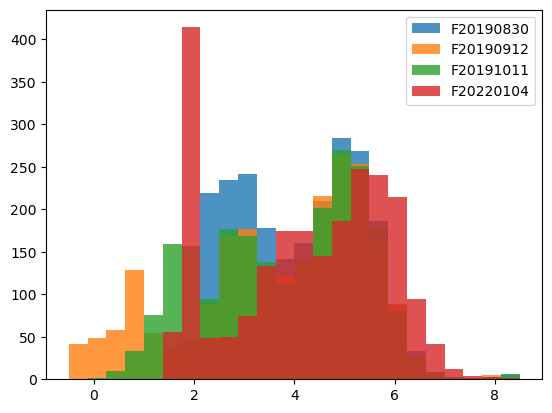

In [122]:
bins = np.linspace(-.5,8.5,25)
kwargs = dict(bins=bins, histtype='bar', alpha=0.8, linewidth=2)
plt.hist(zmax[:,0], label=profile_names[0],**kwargs)
plt.hist(zmax[:,1], label=profile_names[1],**kwargs)
plt.hist(zmax[:,2], label=profile_names[2],**kwargs)
plt.hist(zmax[:,11], label=profile_names[11],**kwargs)
_=plt.legend()


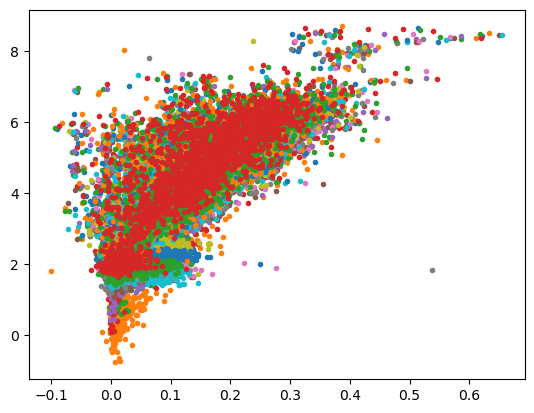

In [129]:
i = 399
- plt.plot(slope[:,:],zmax[:,:],'.')


(array([2697., 1355.,  796.,  609.,  451.,  355.,  262.,  230.,  166.]),
 array([0.005, 0.01 , 0.015, 0.02 , 0.025, 0.03 , 0.035, 0.04 , 0.045,
        0.05 ]),
 <BarContainer object of 9 artists>)

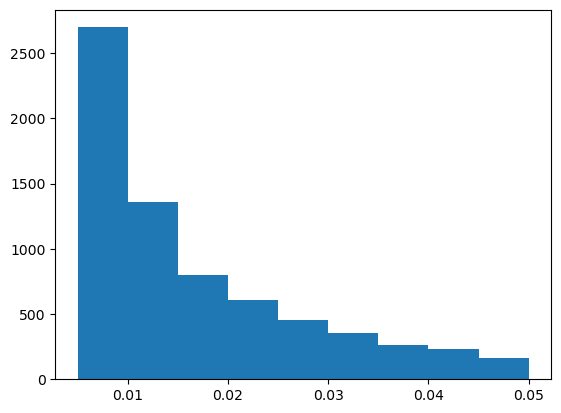

In [135]:
bins = [.005, .01, .015, .02, .025, .03, .035, .04, .045, .05]
plt.hist(np.ravel(pvalue),bins=bins)

Text(0, 0.5, 'Crest Elevation (m)')

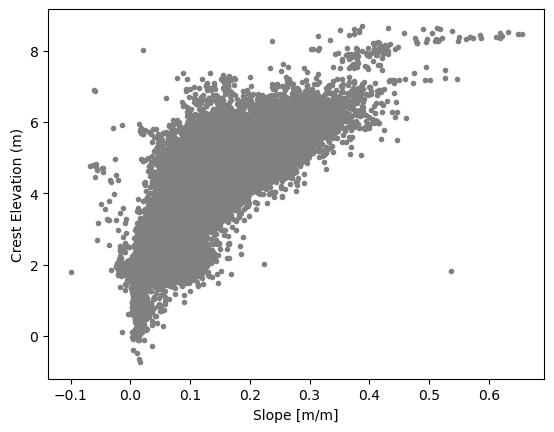

In [161]:
okfit = np.squeeze ( np.argwhere( np.ravel( pvalue) <=.05) )
sok = np.ravel(slope)[okfit]
zok = np.ravel(zmax)[okfit]
#plt.plot(np.ravel(slope),np.ravel(zmax),'.',c='gray')
plt.plot( sok, zok, '.',c='gray')
plt.xlabel('Slope [m/m]')
plt.ylabel('Crest Elevation (m)')

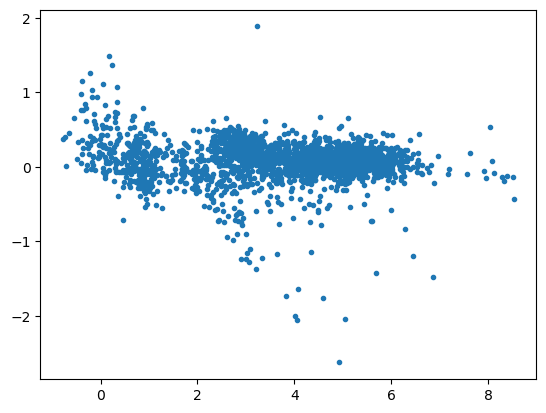

In [177]:
plt.plot(zmax[:,1],zmax[:,7]-zmax[:,2],'.')

In [217]:
ilow = np.argwhere(zmax[:,1] <= 2.5)
print( np.shape(ilow) )
zlow = np.squeeze( zmax[ilow,:] )

print( np.sum(np.isfinite(zlow[ib,:])) )

(511, 1)
14


In [237]:
print('Fraction of profiles <2.5 m post-Dorian: ',len(ilow)/2317)
print('Fraction with good fit to growth: ',76/len(ilow))

Fraction of profiles <2.5 m post-Dorian:  0.22054380664652568
Fraction with good fit to growth:  0.1487279843444227


In [224]:
nts = len(ilow)
tslope = np.ones(nts)*np.nan
tstderr = np.ones(nts)*np.nan
trvalue = np.ones(nts)*np.nan
tpvalue = np.ones(nts)*np.nan
for ib in range(nts):
    #plt.plot(dyr, zlow[ib,:])
    if ( np.sum(np.isfinite(zlow[ib,:])) >= 2 ):
        # fit slope to zmax
        linreg = linregress(dyr, np.squeeze( zlow[ib,:] ))
        tfit = linreg.intercept+linreg.slope*dyr
        #print( linreg.slope, linreg.rvalue**2 )
        tslope[ib]=linreg.slope
        tstderr[ib]=linreg.stderr
        trvalue[ib]=linreg.rvalue
        tpvalue[ib]=linreg.pvalue

  n, nnan, nvalid:  76 0 76
  mean, std, min, max   : 0.272 0.133 -0.172 0.598
  d5, d25, d50, d75, d95: 0.098 0.171 0.289 0.353 0.503


Text(0, 0.5, 'Number of Profiles')

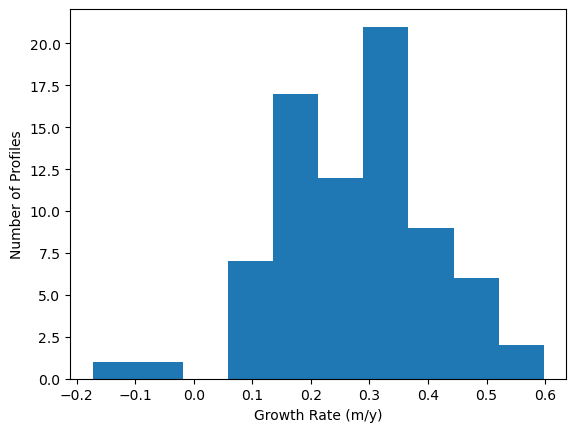

In [236]:
gfit = np.argwhere( tpvalue <= 0.05 )
stat_summary( tslope[gfit], iprint=True )
bins = [-.2, -.1, 0., .1, .2, .3, .4, .5, .6]
plt.hist(tslope[gfit])
plt.xlabel('Growth Rate (m/y)')
plt.ylabel('Number of Profiles')

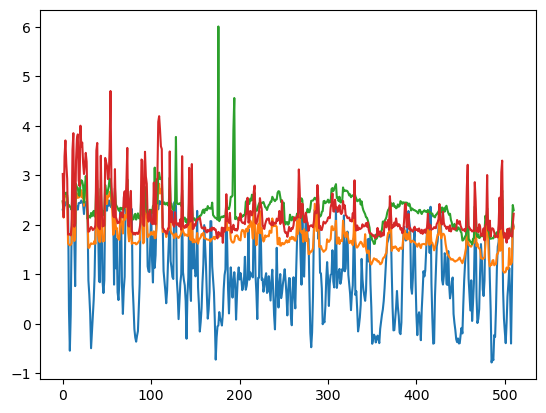

In [248]:
plt.plot(zmax[ilow,1])
plt.plot(zmax[ilow,5])
plt.plot(zmax[ilow,8])
plt.plot(zmax[ilow,13])

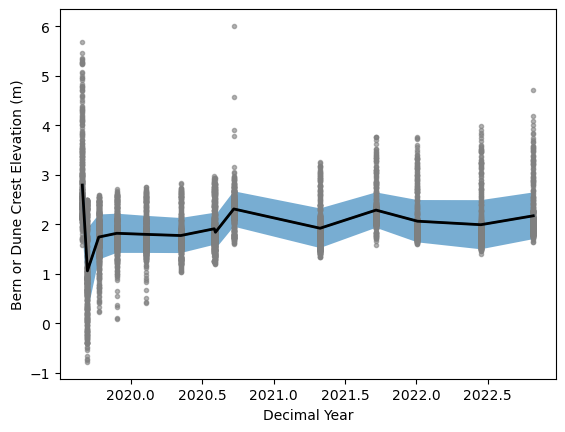

In [269]:
zmean = np.squeeze( np.nanmean(zmax[ilow,:], axis=0) )
zstd = np.squeeze( np.nanstd(zmax[ilow,:], axis=0) )
for i in ilow:
    plt.plot(dyr, np.squeeze( zmax[i,:]), '.', c = 'gray', alpha=.6)
plt.plot(dyr,zmean)
plt.fill_between(dyr, zmean+zstd, zmean-zstd, alpha=.6)
plt.plot(dyr,zmean, '-k', linewidth=2)
plt.xlabel('Decimal Year')
plt.ylabel('Bern or Dune Crest Elevation (m)')
figdir = 'C:/crs/proj/2023_NCB_recovery/'
plt.savefig(figdir+'berm_elev_ts.png', dpi=200, bbox_inches='tight')